# One Outcome

## Thermal Conductivity Diversity

RMSE columns: ['rmse_elec_cond', 'rmse_seebeck', 'rmse_zt', 'rmse_k_total']


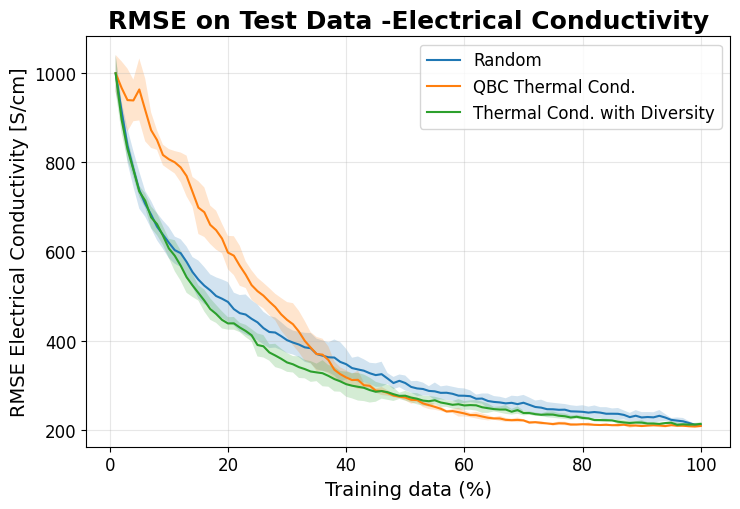

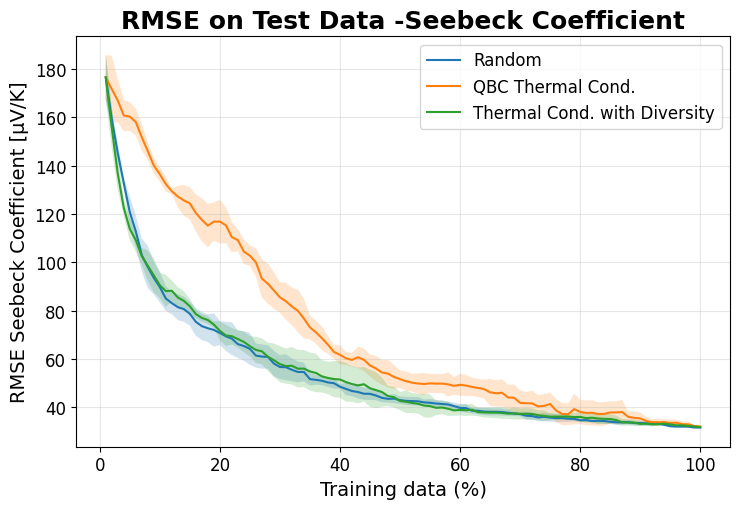

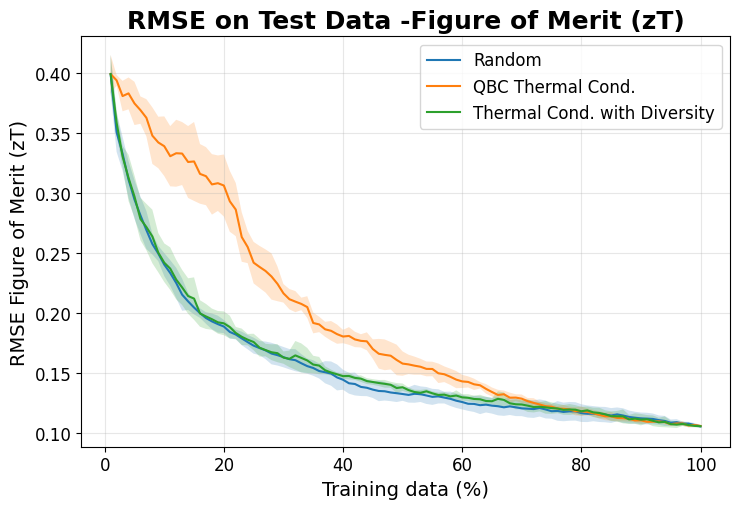

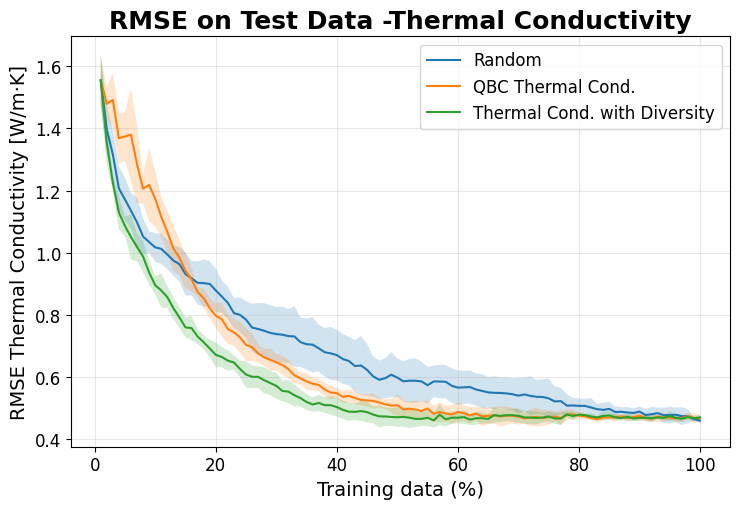

In [33]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Root + seeds
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)  # 0..4

# -------------------------
# Pretty names + units
# -------------------------
property_map = {
    "elec_cond": ("Electrical Conductivity", "S/cm"),
    "seebeck": ("Seebeck Coefficient", "µV/K"),
    "zt": ("Figure of Merit (zT)", ""),
    "k_total": ("Thermal Conductivity", "W/m·K"),
}

# -------------------------
# Loader
# -------------------------
def load_runs(base_path: str, filename_fn, label: str, seeds=range(5)) -> pd.DataFrame:
    dfs = []
    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))
        if not os.path.exists(fp):
            raise FileNotFoundError(f"Missing file: {fp}")
        df = pd.read_csv(fp)
        df["seed"] = s
        df["series"] = label
        dfs.append(df)
    return pd.concat(dfs, ignore_index=True)

# -------------------------
# Series to compare (ONLY these 3)
#   - Random_all
#   - QBC_thermal_cond
#   - EA_DeltaDiversity_thermal_cond
# -------------------------
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_thc    = os.path.join(base_root, "grow_QBC", "ThermoEl", "thermal_cond")
base_ea_div_thc = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "thermal_cond")

df_random_all = load_runs(
    base_random_all,
    filename_fn=lambda s: f"ThermoEl_all_random_rf{s}.csv",
    label="Random",
    seeds=seeds
)

df_qbc_thc = load_runs(
    base_qbc_thc,
    filename_fn=lambda s: f"ThermoEl_thermal_condgrowing_QBC_rf{s}.csv",
    label="QBC Thermal Cond.",
    seeds=seeds
)

df_ea_div_thc = load_runs(
    base_ea_div_thc,
    filename_fn=lambda s: f"ThermoEl_thermal_condgrowing_EA_1out_div_rf{s}.csv",
    label="Thermal Cond. with Diversity",
    seeds=seeds
)

full_df = pd.concat([df_random_all, df_qbc_thc, df_ea_div_thc], ignore_index=True)

# -------------------------
# Columns
# -------------------------
if "train_ratio" not in full_df.columns:
    raise KeyError("Expected column 'train_ratio' not found in loaded CSVs.")

rmse_cols = [c for c in full_df.columns if c.startswith("rmse_")]
print("RMSE columns:", rmse_cols)

# -------------------------
# Aggregate (mean ± std)
# -------------------------
mean_df = full_df.groupby(["series", "train_ratio"])[rmse_cols].mean().reset_index()
std_df  = full_df.groupby(["series", "train_ratio"])[rmse_cols].std().reset_index()

# Force consistent legend ordering
series_order = ["Random", "QBC Thermal Cond.", "Thermal Cond. with Diversity"]
mean_df["series"] = pd.Categorical(mean_df["series"], categories=series_order, ordered=True)
std_df["series"]  = pd.Categorical(std_df["series"],  categories=series_order, ordered=True)


output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\1ObjThermoElec"
os.makedirs(output_dir, exist_ok=True)


def plot_rmse(metric: str):
    prop_key = metric.replace("rmse_", "")
    prop_name, unit = property_map.get(prop_key, (prop_key, ""))

    plt.figure(figsize=(7.5, 5.2))

    for series in series_order:
        m = mean_df[mean_df["series"] == series].sort_values("train_ratio")
        s = std_df[std_df["series"] == series].sort_values("train_ratio")

        #if m.empty or metric not in m.columns:
        #    continue

        x = m["train_ratio"].to_numpy() * 100
        y = m[metric].to_numpy()
        ystd = s[metric].to_numpy()

        plt.plot(x, y, label=series)
        plt.fill_between(x, y - ystd, y + ystd, alpha=0.2)

    plt.xlabel("Training data (%)", fontsize=14)

    if unit == '':
        ylabel = f"RMSE {prop_name}"
    else:
        ylabel = f"RMSE {prop_name} [{unit}]"

    plt.ylabel(ylabel, fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(fontsize=12)

    plt.title(f"RMSE on Test Data -{prop_name}", fontsize=18, fontweight="bold")
    plt.grid(alpha=0.3)
    plt.tight_layout()

    # 🔥 Save figure BEFORE show
    filename = f"{metric}_ThermalCond.png"
    save_path = os.path.join(output_dir, filename)
    plt.savefig(save_path, dpi=150, bbox_inches='tight')

    plt.show()
    plt.close()
for metric in rmse_cols: 
    plot_rmse(metric)

RMSE columns: ['rmse_elec_cond', 'rmse_seebeck', 'rmse_zt', 'rmse_k_total']


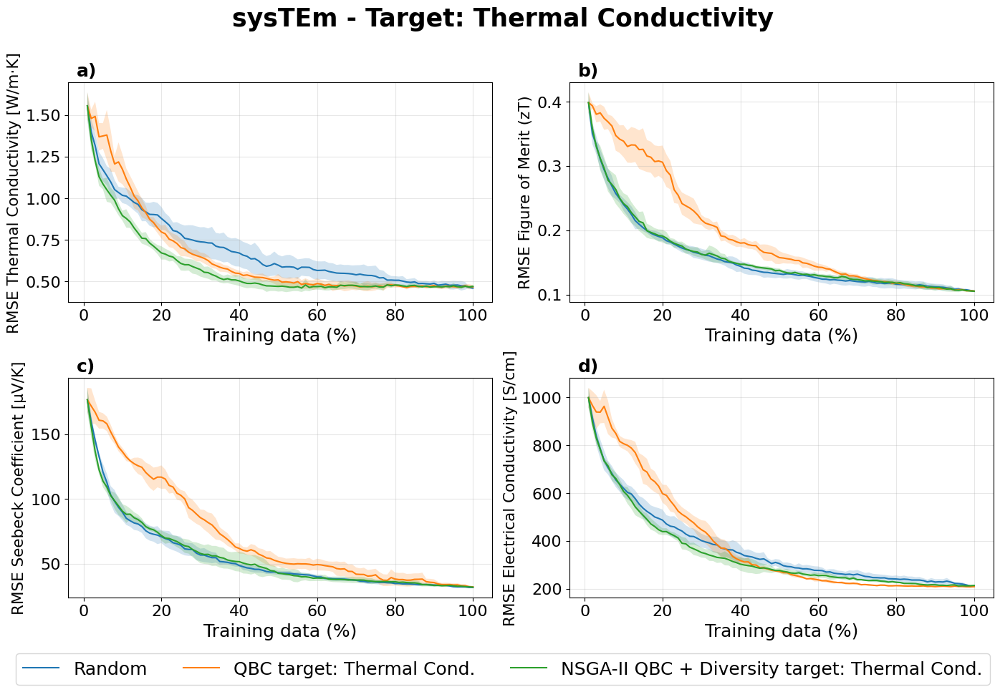

In [17]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Root + seeds
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)  # 0..4

# -------------------------
# Pretty names + units
# -------------------------
property_map = {
    "elec_cond": ("Electrical Conductivity", "S/cm"),
    "seebeck": ("Seebeck Coefficient", "µV/K"),
    "zt": ("Figure of Merit (zT)", ""),
    "k_total": ("Thermal Conductivity", "W/m·K"),
}

# -------------------------
# Loader
# -------------------------
def load_runs(base_path: str, filename_fn, label: str, seeds=range(5)) -> pd.DataFrame:
    dfs = []
    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))
        if not os.path.exists(fp):
            raise FileNotFoundError(f"Missing file: {fp}")
        df = pd.read_csv(fp)
        df["seed"] = s
        df["series"] = label
        dfs.append(df)
    return pd.concat(dfs, ignore_index=True)

# -------------------------
# Series to compare
# -------------------------
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_thc    = os.path.join(base_root, "grow_QBC", "ThermoEl", "thermal_cond")
base_ea_div_thc = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "thermal_cond")

df_random_all = load_runs(
    base_random_all,
    filename_fn=lambda s: f"ThermoEl_all_random_rf{s}.csv",
    label="Random",
    seeds=seeds
)

df_qbc_thc = load_runs(
    base_qbc_thc,
    filename_fn=lambda s: f"ThermoEl_thermal_condgrowing_QBC_rf{s}.csv",
    label="QBC target: Thermal Cond.",
    seeds=seeds
)

df_ea_div_thc = load_runs(
    base_ea_div_thc,
    filename_fn=lambda s: f"ThermoEl_thermal_condgrowing_EA_1out_div_rf{s}.csv",
    label="NSGA-II QBC + Diversity target: Thermal Cond.",
    seeds=seeds
)

full_df = pd.concat([df_random_all, df_qbc_thc, df_ea_div_thc], ignore_index=True)

# -------------------------
# Columns
# -------------------------
if "train_ratio" not in full_df.columns:
    raise KeyError("Expected column 'train_ratio' not found in loaded CSVs.")

rmse_cols = [c for c in full_df.columns if c.startswith("rmse_")]
print("RMSE columns:", rmse_cols)

# -------------------------
# Aggregate (mean ± std)
# -------------------------
mean_df = full_df.groupby(["series", "train_ratio"])[rmse_cols].mean().reset_index()
std_df  = full_df.groupby(["series", "train_ratio"])[rmse_cols].std().reset_index()

# -------------------------
# Force consistent legend ordering
# -------------------------
series_order = [
    "Random",
    "QBC target: Thermal Cond.",
    "NSGA-II QBC + Diversity target: Thermal Cond."
]
mean_df["series"] = pd.Categorical(mean_df["series"], categories=series_order, ordered=True)
std_df["series"]  = pd.Categorical(std_df["series"], categories=series_order, ordered=True)

# -------------------------
# Output directory
# -------------------------
output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\1ObjThermoElec"
os.makedirs(output_dir, exist_ok=True)

# -------------------------
# Desired subplot order
# -------------------------
plot_order = [
    "rmse_k_total",
    "rmse_zt",
    "rmse_seebeck",
    "rmse_elec_cond"
]

panel_labels = ["a)", "b)", "c)", "d)"]

# -------------------------
# Plot all in one figure
# -------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle(
    f"sysTEm - Target: Thermal Conductivity",
    fontsize=25,
    fontweight="bold",
    y=0.98
)
fig.subplots_adjust(wspace=0.35)
axes = axes.flatten()

for ax, metric, panel_label in zip(axes, plot_order, panel_labels):
    prop_key = metric.replace("rmse_", "")
    prop_name, unit = property_map.get(prop_key, (prop_key, ""))

    for series in series_order:
        m = mean_df[mean_df["series"] == series].sort_values("train_ratio")
        s = std_df[std_df["series"] == series].sort_values("train_ratio")

        if metric not in m.columns or metric not in s.columns:
            continue

        x = m["train_ratio"].to_numpy() * 100
        y = m[metric].to_numpy()
        ystd = s[metric].to_numpy()

        ax.plot(x, y, label=series)
        ax.fill_between(x, y - ystd, y + ystd, alpha=0.2)

    ax.set_xlabel("Training data (%)", fontsize=18)

    if unit == "":
        ylabel = f"RMSE {prop_name}"
    else:
        ylabel = f"RMSE {prop_name} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=15.5)
    ax.tick_params(axis='both', labelsize=16)
    ax.grid(alpha=0.3)

    # No subplot titles, to match the first code

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=18,
        fontweight="bold",
        va="top",
        ha="left"
    )

# -------------------------
# Common legend
# -------------------------
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc="lower center",
    bbox_to_anchor=(0.5, 0.02),
    ncol=3,
    fontsize=18,
    frameon=True
)

# -------------------------
# Layout
# -------------------------
plt.tight_layout(rect=[0, 0.08, 1, 0.97])

# -------------------------
# Save figure
# -------------------------
save_path = os.path.join(output_dir, "RMSE_all_properties_ThermalCond_2x2.png")
plt.savefig(save_path, dpi=80, bbox_inches="tight")

plt.show()
plt.close()

RMSE columns: ['rmse_elec_cond', 'rmse_seebeck', 'rmse_zt', 'rmse_k_total']


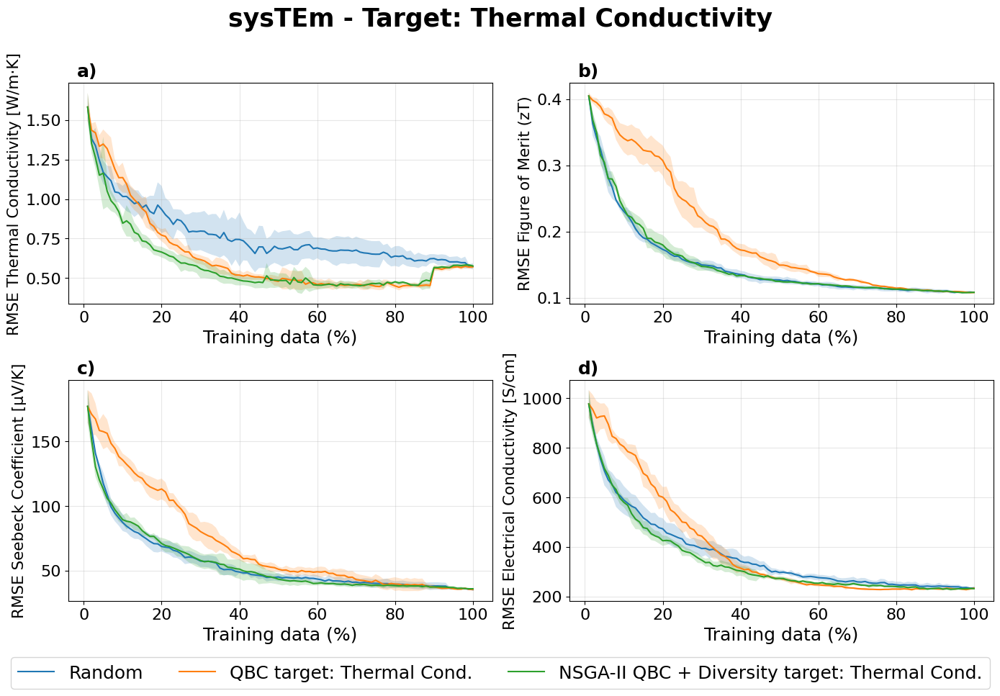

In [18]:
#--------------------------------------------------------------------------------------------------------------------------XGBOOST---------------------------------------------------------------------
import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Root + seeds
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)

# -------------------------
# Pretty names + units
# -------------------------
property_map = {
    "elec_cond": ("Electrical Conductivity", "S/cm"),
    "seebeck": ("Seebeck Coefficient", "µV/K"),
    "zt": ("Figure of Merit (zT)", ""),
    "k_total": ("Thermal Conductivity", "W/m·K"),
}

# -------------------------
# Loader
# -------------------------
def load_runs(base_path: str, filename_fn, label: str, seeds=range(5)) -> pd.DataFrame:
    dfs = []

    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))

        if not os.path.exists(fp):
            raise FileNotFoundError(f"Missing file: {fp}")

        df = pd.read_csv(fp)
        df["seed"] = s
        df["series"] = label
        dfs.append(df)

    return pd.concat(dfs, ignore_index=True)

# -------------------------
# Series to compare
# -------------------------
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_thc    = os.path.join(base_root, "grow_QBC", "ThermoEl", "thermal_cond")
base_ea_div_thc = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "thermal_cond")

df_random_all = load_runs(
    base_random_all,
    filename_fn=lambda s: f"ThermoEl_all_random_xgb{s}.CSV",
    label="Random",
    seeds=seeds
)

df_qbc_thc = load_runs(
    base_qbc_thc,
    filename_fn=lambda s: f"ThermoEl_thermal_condgrowing_QBC_xgb{s}.CSV",
    label="QBC target: Thermal Cond.",
    seeds=seeds
)

df_ea_div_thc = load_runs(
    base_ea_div_thc,
    filename_fn=lambda s: f"ThermoEl_thermal_condgrowing_EA_1out_div_xgb{s}.CSV",
    label="NSGA-II QBC + Diversity target: Thermal Cond.",
    seeds=seeds
)

full_df = pd.concat(
    [df_random_all, df_qbc_thc, df_ea_div_thc],
    ignore_index=True
)

# -------------------------
# Columns
# -------------------------
if "train_ratio" not in full_df.columns:
    raise KeyError("Expected column 'train_ratio' not found in loaded CSVs.")

rmse_cols = [c for c in full_df.columns if c.startswith("rmse_")]
print("RMSE columns:", rmse_cols)

# -------------------------
# Aggregate mean ± std
# -------------------------
mean_df = (
    full_df
    .groupby(["series", "train_ratio"])[rmse_cols]
    .mean()
    .reset_index()
)

std_df = (
    full_df
    .groupby(["series", "train_ratio"])[rmse_cols]
    .std()
    .reset_index()
)

# -------------------------
# Force consistent legend ordering
# -------------------------
series_order = [
    "Random",
    "QBC target: Thermal Cond.",
    "NSGA-II QBC + Diversity target: Thermal Cond."
]

mean_df["series"] = pd.Categorical(
    mean_df["series"],
    categories=series_order,
    ordered=True
)

std_df["series"] = pd.Categorical(
    std_df["series"],
    categories=series_order,
    ordered=True
)

# -------------------------
# Output directory
# -------------------------
output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\1ObjThermoElec_XGBOOST"
os.makedirs(output_dir, exist_ok=True)

# -------------------------
# Desired subplot order
# -------------------------
plot_order = [
    "rmse_k_total",
    "rmse_zt",
    "rmse_seebeck",
    "rmse_elec_cond"
]

panel_labels = ["a)", "b)", "c)", "d)"]

# -------------------------
# Plot all in one figure
# -------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

fig.suptitle(
    "sysTEm - Target: Thermal Conductivity",
    fontsize=25,
    fontweight="bold",
    y=0.98
)

fig.subplots_adjust(wspace=0.35)
axes = axes.flatten()

for ax, metric, panel_label in zip(axes, plot_order, panel_labels):
    prop_key = metric.replace("rmse_", "")
    prop_name, unit = property_map.get(prop_key, (prop_key, ""))

    for series in series_order:
        m = mean_df[mean_df["series"] == series].sort_values("train_ratio")
        s = std_df[std_df["series"] == series].sort_values("train_ratio")

        if metric not in m.columns or metric not in s.columns:
            continue

        x = m["train_ratio"].to_numpy() * 100
        y = m[metric].to_numpy()
        ystd = s[metric].fillna(0).to_numpy()

        ax.plot(x, y, label=series)
        ax.fill_between(x, y - ystd, y + ystd, alpha=0.2)

    ax.set_xlabel("Training data (%)", fontsize=18)

    if unit == "":
        ylabel = f"RMSE {prop_name}"
    else:
        ylabel = f"RMSE {prop_name} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=15.5)
    ax.tick_params(axis="both", labelsize=16)
    ax.grid(alpha=0.3)

    ax.text(
        0.02,
        1.09,
        panel_label,
        transform=ax.transAxes,
        fontsize=18,
        fontweight="bold",
        va="top",
        ha="left"
    )

# -------------------------
# Common legend
# -------------------------
handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, 0.02),
    ncol=3,
    fontsize=18,
    frameon=True
)

# -------------------------
# Layout
# -------------------------
plt.tight_layout(rect=[0, 0.08, 1, 0.97])

# -------------------------
# Save figure
# -------------------------
save_path = os.path.join(
    output_dir,
    "RMSE_all_properties_ThermalCond_2x2_XGBOOST.png"
)

plt.savefig(save_path, dpi=80, bbox_inches="tight")

plt.show()
plt.close()

## Figure of Merit Diversity

RMSE columns: ['rmse_elec_cond', 'rmse_seebeck', 'rmse_zt', 'rmse_k_total']


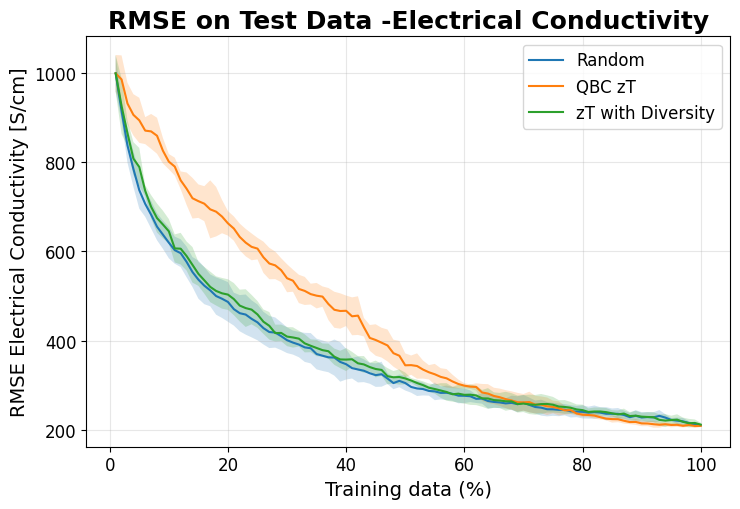

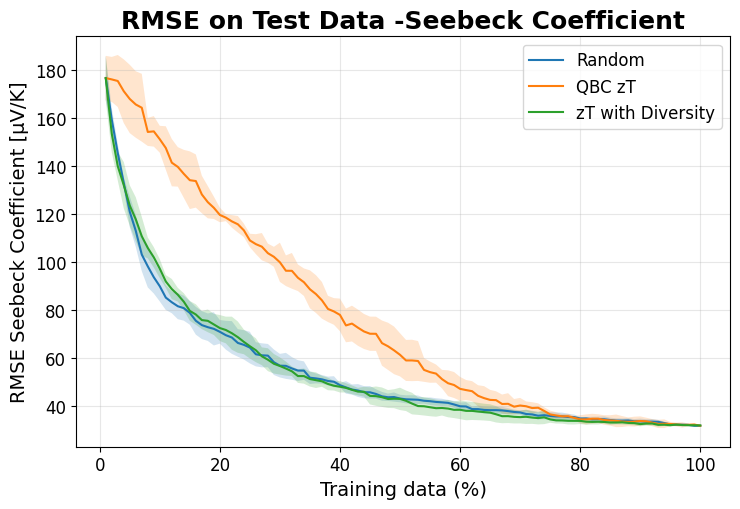

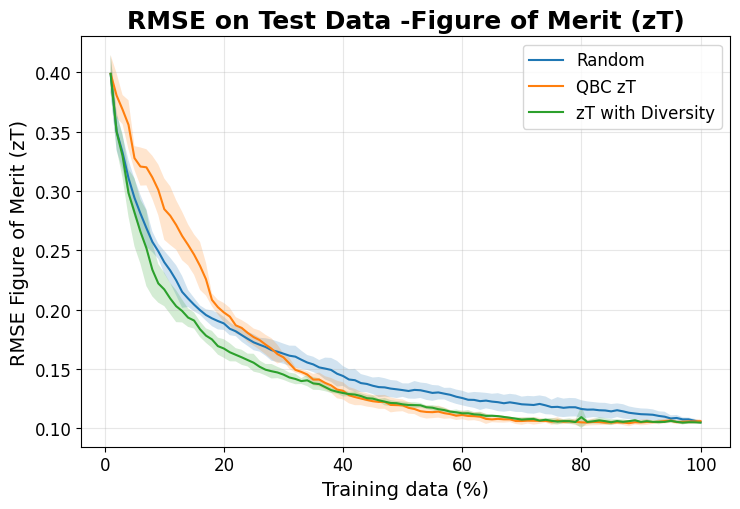

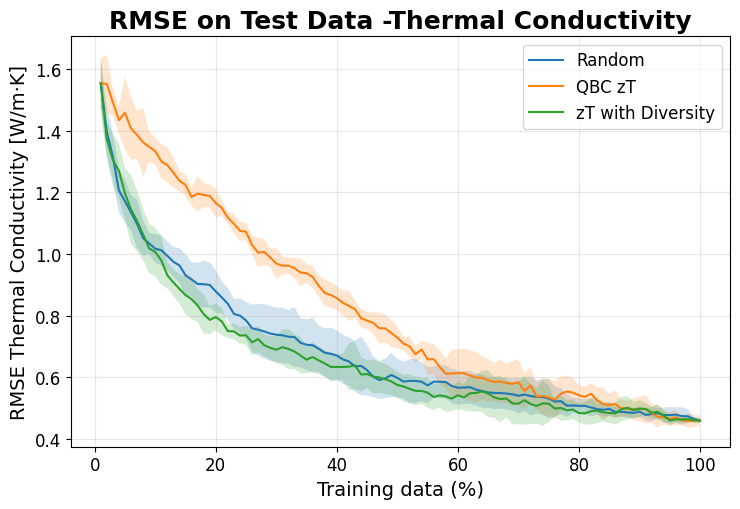

In [19]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Root + seeds
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)  # 0..4

# -------------------------
# Pretty names + units
# -------------------------
property_map = {
    "elec_cond": ("Electrical Conductivity", "S/cm"),
    "seebeck": ("Seebeck Coefficient", "µV/K"),
    "zt": ("Figure of Merit (zT)", ""),
    "k_total": ("Thermal Conductivity", "W/m·K"),
}

# -------------------------
# Loader
# -------------------------
def load_runs(base_path: str, filename_fn, label: str, seeds=range(5)) -> pd.DataFrame:
    dfs = []
    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))
        if not os.path.exists(fp):
            raise FileNotFoundError(f"Missing file: {fp}")
        df = pd.read_csv(fp)
        df["seed"] = s
        df["series"] = label
        dfs.append(df)
    return pd.concat(dfs, ignore_index=True)

# -------------------------
# Series to compare (ONLY these 3)
#   - Random_all
#   - QBC_thermal_cond
#   - EA_DeltaDiversity_thermal_cond
# -------------------------
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_zt = os.path.join(base_root, "grow_QBC", "ThermoEl", "zT")
base_ea_div_zt = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "zT")

df_random_all = load_runs(
    base_random_all,
    filename_fn=lambda s: f"ThermoEl_all_random_rf{s}.csv",
    label="Random",
    seeds=seeds
)

df_qbc_zt = load_runs(
    base_qbc_zt,
    filename_fn=lambda s: f"ThermoEl_zTgrowing_QBC_rf{s}.csv",
    label="QBC zT",
    seeds=seeds
)

df_ea_div_zt = load_runs(
    base_ea_div_zt,
    filename_fn=lambda s: f"ThermoEl_zTgrowing_EA_1out_div_rf{s}.csv",
    label="zT with Diversity",
    seeds=seeds
)


full_df = pd.concat([df_random_all, df_qbc_zt, df_ea_div_zt], ignore_index=True)

# -------------------------
# Columns
# -------------------------
if "train_ratio" not in full_df.columns:
    raise KeyError("Expected column 'train_ratio' not found in loaded CSVs.")

rmse_cols = [c for c in full_df.columns if c.startswith("rmse_")]
print("RMSE columns:", rmse_cols)

# -------------------------
# Aggregate (mean ± std)
# -------------------------
mean_df = full_df.groupby(["series", "train_ratio"])[rmse_cols].mean().reset_index()
std_df  = full_df.groupby(["series", "train_ratio"])[rmse_cols].std().reset_index()

# Force consistent legend ordering
series_order = ["Random", "QBC zT", "zT with Diversity"]
mean_df["series"] = pd.Categorical(mean_df["series"], categories=series_order, ordered=True)
std_df["series"]  = pd.Categorical(std_df["series"],  categories=series_order, ordered=True)


output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\1ObjThermoElec"
os.makedirs(output_dir, exist_ok=True)


def plot_rmse(metric: str):
    prop_key = metric.replace("rmse_", "")
    prop_name, unit = property_map.get(prop_key, (prop_key, ""))

    plt.figure(figsize=(7.5, 5.2))

    for series in series_order:
        m = mean_df[mean_df["series"] == series].sort_values("train_ratio")
        s = std_df[std_df["series"] == series].sort_values("train_ratio")

        #if m.empty or metric not in m.columns:
        #    continue

        x = m["train_ratio"].to_numpy() * 100
        y = m[metric].to_numpy()
        ystd = s[metric].to_numpy()

        plt.plot(x, y, label=series)
        plt.fill_between(x, y - ystd, y + ystd, alpha=0.2)

    plt.xlabel("Training data (%)", fontsize=14)

    if unit == '':
        ylabel = f"RMSE {prop_name}"
    else:
        ylabel = f"RMSE {prop_name} [{unit}]"

    plt.ylabel(ylabel, fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(fontsize=12)

    plt.title(f"RMSE on Test Data -{prop_name}", fontsize=18, fontweight="bold")
    plt.grid(alpha=0.3)
    plt.tight_layout()

    # 🔥 Save figure BEFORE show
    filename = f"{metric}_zT.png"
    save_path = os.path.join(output_dir, filename)
    plt.savefig(save_path, dpi=100, bbox_inches='tight')

    plt.show()
    plt.close()
for metric in rmse_cols: 
    plot_rmse(metric)

RMSE columns: ['rmse_elec_cond', 'rmse_seebeck', 'rmse_zt', 'rmse_k_total']


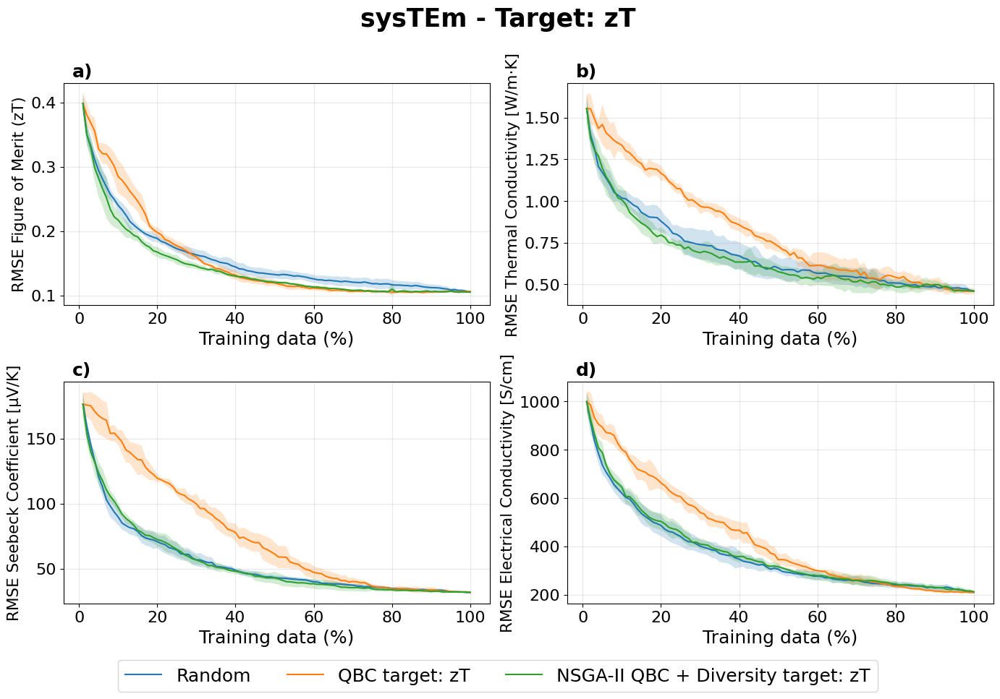

In [20]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Root + seeds
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)  # 0..4

# -------------------------
# Pretty names + units
# -------------------------
property_map = {
    "elec_cond": ("Electrical Conductivity", "S/cm"),
    "seebeck": ("Seebeck Coefficient", "µV/K"),
    "zt": ("Figure of Merit (zT)", ""),
    "k_total": ("Thermal Conductivity", "W/m·K"),
}

# -------------------------
# Loader
# -------------------------
def load_runs(base_path: str, filename_fn, label: str, seeds=range(5)) -> pd.DataFrame:
    dfs = []
    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))
        if not os.path.exists(fp):
            raise FileNotFoundError(f"Missing file: {fp}")
        df = pd.read_csv(fp)
        df["seed"] = s
        df["series"] = label
        dfs.append(df)
    return pd.concat(dfs, ignore_index=True)

# -------------------------
# Series to compare
# -------------------------
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_zt = os.path.join(base_root, "grow_QBC", "ThermoEl", "zT")
base_ea_div_zt = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "zT")

df_random_all = load_runs(
    base_random_all,
    filename_fn=lambda s: f"ThermoEl_all_random_rf{s}.csv",
    label="Random",
    seeds=seeds
)

df_qbc_zt = load_runs(
    base_qbc_zt,
    filename_fn=lambda s: f"ThermoEl_zTgrowing_QBC_rf{s}.csv",
    label="QBC target: zT",
    seeds=seeds
)

df_ea_div_zt = load_runs(
    base_ea_div_zt,
    filename_fn=lambda s: f"ThermoEl_zTgrowing_EA_1out_div_rf{s}.csv",
    label="NSGA-II QBC + Diversity target: zT",
    seeds=seeds
)

full_df = pd.concat([df_random_all, df_qbc_zt, df_ea_div_zt], ignore_index=True)

# -------------------------
# Columns
# -------------------------
if "train_ratio" not in full_df.columns:
    raise KeyError("Expected column 'train_ratio' not found in loaded CSVs.")

rmse_cols = [c for c in full_df.columns if c.startswith("rmse_")]
print("RMSE columns:", rmse_cols)

# -------------------------
# Aggregate (mean ± std)
# -------------------------
mean_df = full_df.groupby(["series", "train_ratio"])[rmse_cols].mean().reset_index()
std_df  = full_df.groupby(["series", "train_ratio"])[rmse_cols].std().reset_index()

# -------------------------
# Force consistent legend ordering
# -------------------------
series_order = ["Random", "QBC target: zT", "NSGA-II QBC + Diversity target: zT"]
mean_df["series"] = pd.Categorical(mean_df["series"], categories=series_order, ordered=True)
std_df["series"]  = pd.Categorical(std_df["series"], categories=series_order, ordered=True)

# -------------------------
# Output directory
# -------------------------
output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\1ObjThermoElec"
os.makedirs(output_dir, exist_ok=True)

# -------------------------
# Desired subplot order
# -------------------------
plot_order = [
    "rmse_zt",
    "rmse_k_total",
    "rmse_seebeck",
    "rmse_elec_cond"
]

panel_labels = ["a)", "b)", "c)", "d)"]

# -------------------------
# Plot all in one figure
# -------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle(
    f"sysTEm - Target: zT",
    fontsize=25,
    fontweight="bold",
    y=0.98
)
fig.subplots_adjust(wspace=0.35)
axes = axes.flatten()

for ax, metric, panel_label in zip(axes, plot_order, panel_labels):
    prop_key = metric.replace("rmse_", "")
    prop_name, unit = property_map.get(prop_key, (prop_key, ""))

    for series in series_order:
        m = mean_df[mean_df["series"] == series].sort_values("train_ratio")
        s = std_df[std_df["series"] == series].sort_values("train_ratio")

        if metric not in m.columns or metric not in s.columns:
            continue

        x = m["train_ratio"].to_numpy() * 100
        y = m[metric].to_numpy()
        ystd = s[metric].to_numpy()

        ax.plot(x, y, label=series)
        ax.fill_between(x, y - ystd, y + ystd, alpha=0.2)

    ax.set_xlabel("Training data (%)", fontsize=18)

    if unit == "":
        ylabel = f"RMSE {prop_name}"
    else:
        ylabel = f"RMSE {prop_name} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=15.5)
    ax.tick_params(axis='both', labelsize=16)
    ax.grid(alpha=0.3)

    # No subplot title, to match the first code

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=18,
        fontweight="bold",
        va="top",
        ha="left"
    )

# -------------------------
# Common legend
# -------------------------
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc="lower center",
    bbox_to_anchor=(0.5, 0.02),
    ncol=3,
    fontsize=18,
    frameon=True
)

# -------------------------
# Layout
# -------------------------
plt.tight_layout(rect=[0, 0.08, 1, 0.97])

# -------------------------
# Save figure
# -------------------------
save_path = os.path.join(output_dir, "RMSE_all_properties_zT_2x2.png")
plt.savefig(save_path, dpi=80, bbox_inches="tight")

plt.show()
plt.close()

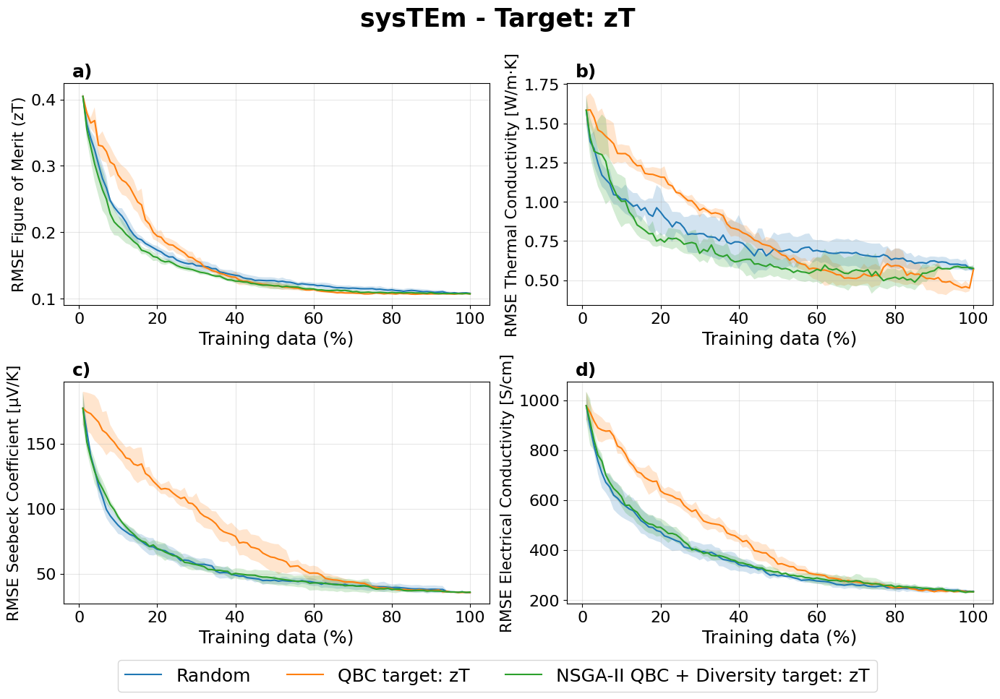

In [21]:
#-----------------------------------------------------------------------------XGBoost----------------------------------------------
import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Root + seeds
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)

# -------------------------
# Pretty names + units
# -------------------------
property_map = {
    "elec_cond": ("Electrical Conductivity", "S/cm"),
    "seebeck": ("Seebeck Coefficient", "µV/K"),
    "zt": ("Figure of Merit (zT)", ""),
    "k_total": ("Thermal Conductivity", "W/m·K"),
}

# -------------------------
# Loader
# -------------------------
def load_runs(base_path, filename_fn, label):
    dfs = []

    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))

        if not os.path.exists(fp):
            raise FileNotFoundError(fp)

        df = pd.read_csv(fp)

        df["seed"] = s
        df["series"] = label
        df["row_in_file"] = range(len(df))  # 🔥 needed for "last row"
        dfs.append(df)

    return pd.concat(dfs, ignore_index=True)

# -------------------------
# Load data
# -------------------------
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_zt     = os.path.join(base_root, "grow_QBC", "ThermoEl", "zT")
base_ea_div_zt  = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "zT")

df_random = load_runs(base_random_all, lambda s: f"ThermoEl_all_random_xgb{s}.csv", "Random")
df_qbc    = load_runs(base_qbc_zt,     lambda s: f"ThermoEl_zTgrowing_QBC_xgb{s}.csv", "QBC target: zT")
df_div    = load_runs(base_ea_div_zt,  lambda s: f"ThermoEl_zTgrowing_EA_1out_div_xgb{s}.csv", "NSGA-II QBC + Diversity target: zT")

full_df = pd.concat([df_random, df_qbc, df_div], ignore_index=True)

# -------------------------
# Prep
# -------------------------
full_df["train_pct"] = full_df["train_ratio"] * 100

series_order = [
    "Random",
    "QBC target: zT",
    "NSGA-II QBC + Diversity target: zT"
]

plot_order = [
    "rmse_zt",
    "rmse_k_total",
    "rmse_seebeck",
    "rmse_elec_cond"
]

panel_labels = ["a)", "b)", "c)", "d)"]

# -------------------------
# Plot
# -------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

fig.suptitle("sysTEm - Target: zT", fontsize=25, fontweight="bold", y=0.98)

for ax, metric, panel_label in zip(axes, plot_order, panel_labels):

    prop_key = metric.replace("rmse_", "")
    prop_name, unit = property_map.get(prop_key, (prop_key, ""))

    for series in series_order:

        sub = full_df[full_df["series"] == series].copy()

        # -------------------------
        # NORMAL aggregation
        # -------------------------
        grouped = (
            sub.groupby(["seed", "train_pct"])[metric]
            .mean()
            .reset_index()
        )

        # -------------------------
        # 🔥 FIX FINAL POINT
        # -------------------------
        final_rows = (
            sub
            .sort_values(["seed", "row_in_file"])
            .groupby("seed")
            .tail(1)
        )

        final_rows["train_pct"] = 100

        final_mean = final_rows[metric].mean()
        final_std  = final_rows[metric].std()

        # remove any existing 100% rows
        grouped = grouped[grouped["train_pct"] != 100]

        # recompute mean/std
        mean = grouped.groupby("train_pct")[metric].mean()
        std  = grouped.groupby("train_pct")[metric].std()

        # append corrected final point
        mean.loc[100] = final_mean
        std.loc[100]  = final_std

        mean = mean.sort_index()
        std  = std.sort_index()

        x = mean.index.values
        y = mean.values
        ystd = std.fillna(0).values

        ax.plot(x, y, label=series)
        ax.fill_between(x, y - ystd, y + ystd, alpha=0.2)

    # -------------------------
    # Axis styling
    # -------------------------
    ax.set_xlabel("Training data (%)", fontsize=18)

    if unit == "":
        ylabel = f"RMSE {prop_name}"
    else:
        ylabel = f"RMSE {prop_name} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=15.5)
    ax.tick_params(axis="both", labelsize=16)
    ax.grid(alpha=0.3)

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=18,
        fontweight="bold",
        va="top",
        ha="left"
    )

# -------------------------
# Legend
# -------------------------
handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, 0.02),
    ncol=3,
    fontsize=18,
    frameon=True
)

# -------------------------
# Save
# -------------------------
plt.tight_layout(rect=[0, 0.08, 1, 0.97])

output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\1ObjThermoElec_XGBOOST"
os.makedirs(output_dir, exist_ok=True)

plt.savefig(os.path.join(output_dir, "RMSE_all_properties_zT_xgboost.png"), dpi=80)

plt.show()

## Electrical Conductivity Diversity

RMSE columns: ['rmse_elec_cond', 'rmse_seebeck', 'rmse_zt', 'rmse_k_total']


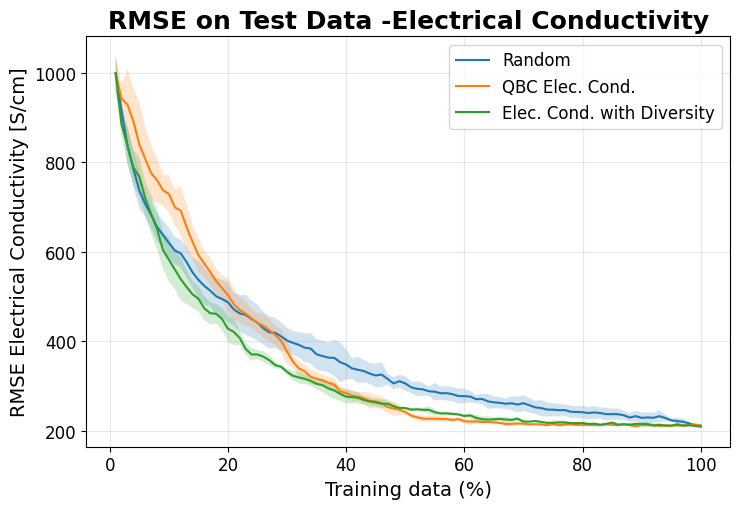

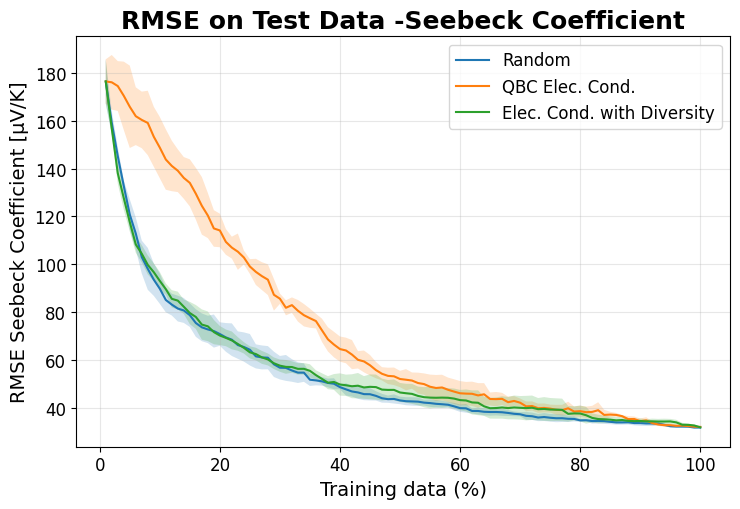

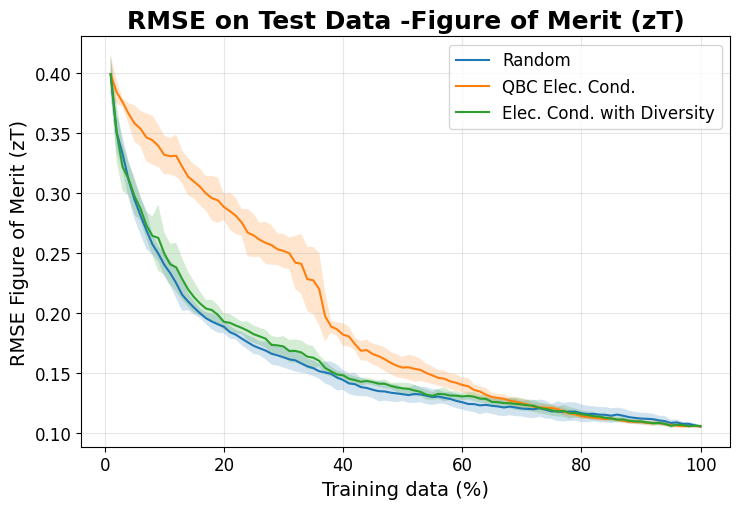

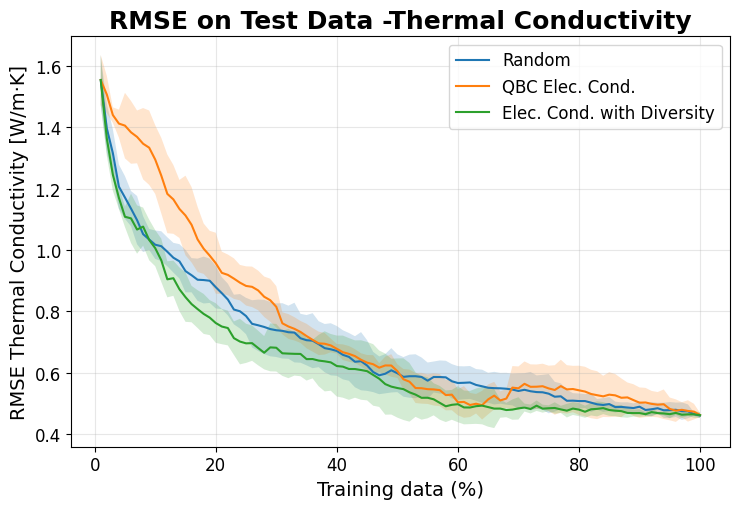

In [22]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Root + seeds
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)  # 0..4

# -------------------------
# Pretty names + units
# -------------------------
property_map = {
    "elec_cond": ("Electrical Conductivity", "S/cm"),
    "seebeck": ("Seebeck Coefficient", "µV/K"),
    "zt": ("Figure of Merit (zT)", ""),
    "k_total": ("Thermal Conductivity", "W/m·K"),
}

# -------------------------
# Loader
# -------------------------
def load_runs(base_path: str, filename_fn, label: str, seeds=range(5)) -> pd.DataFrame:
    dfs = []
    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))
        if not os.path.exists(fp):
            raise FileNotFoundError(f"Missing file: {fp}")
        df = pd.read_csv(fp)
        df["seed"] = s
        df["series"] = label
        dfs.append(df)
    return pd.concat(dfs, ignore_index=True)


# -------------------------
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_elec = os.path.join(base_root, "grow_QBC", "ThermoEl", "electric_cond")
base_ea_div_elec = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "electric_cond")


df_random_all = load_runs(
    base_random_all,
    filename_fn=lambda s: f"ThermoEl_all_random_rf{s}.csv",
    label="Random",
    seeds=seeds
)


df_ea_div_elec = load_runs(
    base_ea_div_elec,
    filename_fn=lambda s: f"ThermoEl_electric_condgrowing_EA_1out_div_rf{s}.csv",
    label="Elec. Cond. with Diversity",
    seeds=seeds  # 0..4
)


df_qbc_elec = load_runs(
    base_qbc_elec,
    filename_fn=lambda s: f"ThermoEl_electric_condgrowing_QBC_rf{s}.csv",
    label="QBC Elec. Cond.",
    seeds=seeds  # 0..4
)



full_df = pd.concat([df_random_all, df_qbc_elec, df_ea_div_elec], ignore_index=True)

# -------------------------
# Columns
# -------------------------
if "train_ratio" not in full_df.columns:
    raise KeyError("Expected column 'train_ratio' not found in loaded CSVs.")

rmse_cols = [c for c in full_df.columns if c.startswith("rmse_")]
print("RMSE columns:", rmse_cols)

# -------------------------
# Aggregate (mean ± std)
# -------------------------
mean_df = full_df.groupby(["series", "train_ratio"])[rmse_cols].mean().reset_index()
std_df  = full_df.groupby(["series", "train_ratio"])[rmse_cols].std().reset_index()

# Force consistent legend ordering
series_order = ["Random", "QBC Elec. Cond.", "Elec. Cond. with Diversity"]
mean_df["series"] = pd.Categorical(mean_df["series"], categories=series_order, ordered=True)
std_df["series"]  = pd.Categorical(std_df["series"],  categories=series_order, ordered=True)


output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\1ObjThermoElec"
os.makedirs(output_dir, exist_ok=True)


def plot_rmse(metric: str):
    prop_key = metric.replace("rmse_", "")
    prop_name, unit = property_map.get(prop_key, (prop_key, ""))

    plt.figure(figsize=(7.5, 5.2))

    for series in series_order:
        m = mean_df[mean_df["series"] == series].sort_values("train_ratio")
        s = std_df[std_df["series"] == series].sort_values("train_ratio")

        #if m.empty or metric not in m.columns:
        #    continue

        x = m["train_ratio"].to_numpy() * 100
        y = m[metric].to_numpy()
        ystd = s[metric].to_numpy()

        plt.plot(x, y, label=series)
        plt.fill_between(x, y - ystd, y + ystd, alpha=0.2)

    plt.xlabel("Training data (%)", fontsize=14)

    if unit == '':
        ylabel = f"RMSE {prop_name}"
    else:
        ylabel = f"RMSE {prop_name} [{unit}]"

    plt.ylabel(ylabel, fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(fontsize=12)

    plt.title(f"RMSE on Test Data -{prop_name}", fontsize=18, fontweight="bold")
    plt.grid(alpha=0.3)
    plt.tight_layout()

    # 🔥 Save figure BEFORE show
    filename = f"{metric}_elecCond.png"
    save_path = os.path.join(output_dir, filename)
    plt.savefig(save_path, dpi=150, bbox_inches='tight')

    plt.show()
    plt.close()
for metric in rmse_cols: 
    plot_rmse(metric)

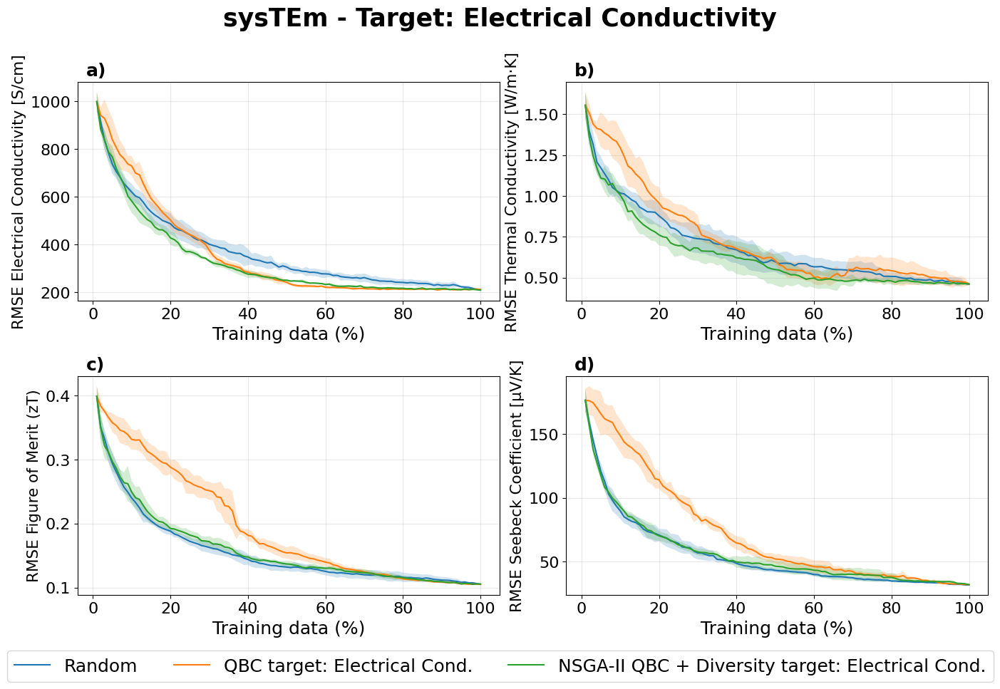

In [23]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Root + seeds
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)  # 0..4

# -------------------------
# Pretty names + units
# -------------------------
property_map = {
    "elec_cond": ("Electrical Conductivity", "S/cm"),
    "seebeck": ("Seebeck Coefficient", "µV/K"),
    "zt": ("Figure of Merit (zT)", ""),
    "k_total": ("Thermal Conductivity", "W/m·K"),
}

# -------------------------
# Loader
# -------------------------
def load_runs(base_path: str, filename_fn, label: str, seeds=range(5)) -> pd.DataFrame:
    dfs = []
    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))
        if not os.path.exists(fp):
            raise FileNotFoundError(f"Missing file: {fp}")
        df = pd.read_csv(fp)
        df["seed"] = s
        df["series"] = label
        dfs.append(df)
    return pd.concat(dfs, ignore_index=True)

# -------------------------
# Paths
# -------------------------
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_elec = os.path.join(base_root, "grow_QBC", "ThermoEl", "electric_cond")
base_ea_div_elec = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "electric_cond")

# -------------------------
# Load data
# -------------------------
df_random_all = load_runs(
    base_random_all,
    filename_fn=lambda s: f"ThermoEl_all_random_rf{s}.csv",
    label="Random",
    seeds=seeds
)

df_qbc_elec = load_runs(
    base_qbc_elec,
    filename_fn=lambda s: f"ThermoEl_electric_condgrowing_QBC_rf{s}.csv",
    label="QBC target: Electrical Cond.",
    seeds=seeds
)

df_ea_div_elec = load_runs(
    base_ea_div_elec,
    filename_fn=lambda s: f"ThermoEl_electric_condgrowing_EA_1out_div_rf{s}.csv",
    label="NSGA-II QBC + Diversity target: Electrical Cond.",
    seeds=seeds
)

full_df = pd.concat([df_random_all, df_qbc_elec, df_ea_div_elec], ignore_index=True)

# -------------------------
# Columns
# -------------------------
if "train_ratio" not in full_df.columns:
    raise KeyError("Expected column 'train_ratio' not found in loaded CSVs.")

rmse_cols = [c for c in full_df.columns if c.startswith("rmse_")]

# -------------------------
# Aggregate (mean ± std)
# -------------------------
mean_df = full_df.groupby(["series", "train_ratio"])[rmse_cols].mean().reset_index()
std_df  = full_df.groupby(["series", "train_ratio"])[rmse_cols].std().reset_index()

# -------------------------
# Force consistent legend ordering
# -------------------------
series_order = [
    "Random",
    "QBC target: Electrical Cond.",
    "NSGA-II QBC + Diversity target: Electrical Cond."
]

mean_df["series"] = pd.Categorical(mean_df["series"], categories=series_order, ordered=True)
std_df["series"]  = pd.Categorical(std_df["series"], categories=series_order, ordered=True)

# -------------------------
# Output directory
# -------------------------
output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\1ObjThermoElec"
os.makedirs(output_dir, exist_ok=True)

# -------------------------
# Plot order
# -------------------------
plot_order = [
    "rmse_elec_cond",
    "rmse_k_total",
    "rmse_zt",
    "rmse_seebeck",
]

panel_labels = ["a)", "b)", "c)", "d)"]

# -------------------------
# Plot
# -------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

fig.suptitle(
    f"sysTEm - Target: Electrical Conductivity",
    fontsize=25,
    fontweight="bold",
    y=0.98
)

fig.subplots_adjust(wspace=0.35)
axes = axes.flatten()

for ax, metric, panel_label in zip(axes, plot_order, panel_labels):
    prop_key = metric.replace("rmse_", "")
    prop_name, unit = property_map.get(prop_key, (prop_key, ""))

    for series in series_order:
        m = mean_df[mean_df["series"] == series].sort_values("train_ratio")
        s = std_df[std_df["series"] == series].sort_values("train_ratio")

        if metric not in m.columns:
            continue

        x = m["train_ratio"].to_numpy() * 100
        y = m[metric].to_numpy()
        ystd = s[metric].to_numpy()

        ax.plot(x, y, label=series)
        ax.fill_between(x, y - ystd, y + ystd, alpha=0.2)

    ax.set_xlabel("Training data (%)", fontsize=18)

    ylabel = f"RMSE {prop_name}" if unit == "" else f"RMSE {prop_name} [{unit}]"
    ax.set_ylabel(ylabel, fontsize=15.5)

    ax.tick_params(axis='both', labelsize=16)
    ax.grid(alpha=0.3)

    # REMOVE subplot titles (to match first code)
    # ax.set_title(...)

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=18,
        fontweight="bold",
        va="top",
        ha="left"
    )

# -------------------------
# Common legend
# -------------------------
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc="lower center",
    bbox_to_anchor=(0.5, 0.02),
    ncol=3,
    fontsize=18,
    frameon=True
)

# -------------------------
# Layout
# -------------------------
plt.tight_layout(rect=[0, 0.08, 1, 0.97])

# -------------------------
# Save
# -------------------------
save_path = os.path.join(output_dir, "RMSE_all_properties_ElecCond_2x2.png")
plt.savefig(save_path, dpi=80, bbox_inches="tight")

plt.show()
plt.close()

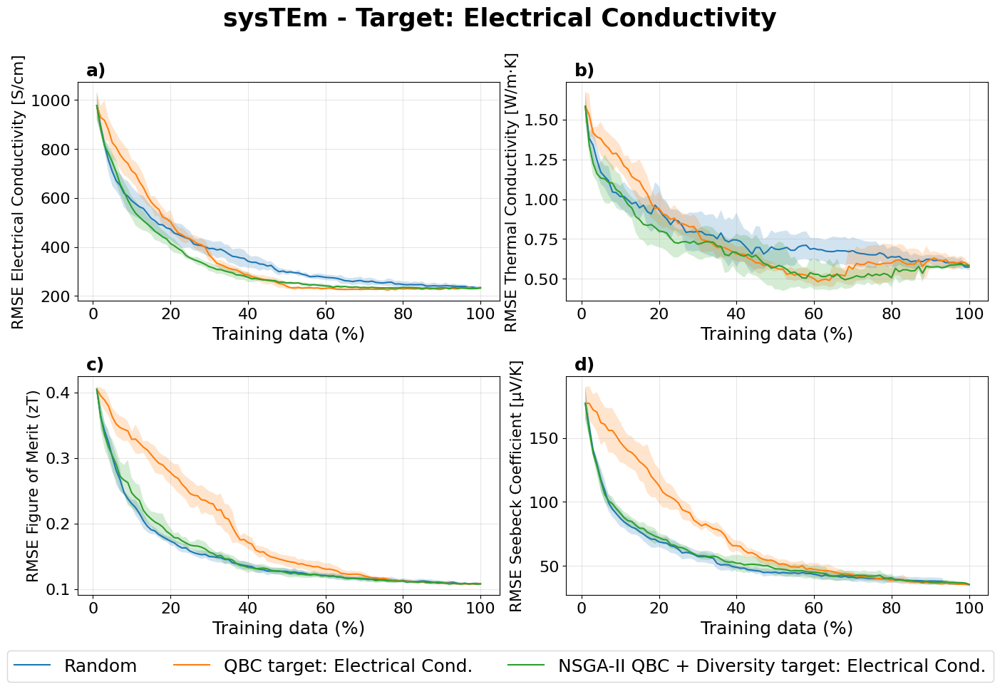

In [24]:

#-----------------------------------------------------------------------------XGBoost----------------------------------------------
import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Root + seeds
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)  # 0..4

# -------------------------
# Pretty names + units
# -------------------------
property_map = {
    "elec_cond": ("Electrical Conductivity", "S/cm"),
    "seebeck": ("Seebeck Coefficient", "µV/K"),
    "zt": ("Figure of Merit (zT)", ""),
    "k_total": ("Thermal Conductivity", "W/m·K"),
}

# -------------------------
# Loader
# -------------------------
def load_runs(base_path: str, filename_fn, label: str, seeds=range(5)) -> pd.DataFrame:
    dfs = []
    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))
        if not os.path.exists(fp):
            raise FileNotFoundError(f"Missing file: {fp}")
        df = pd.read_csv(fp)
        df["seed"] = s
        df["series"] = label
        dfs.append(df)
    return pd.concat(dfs, ignore_index=True)

# -------------------------
# Paths
# -------------------------
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_elec = os.path.join(base_root, "grow_QBC", "ThermoEl", "electric_cond")
base_ea_div_elec = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "electric_cond")

# -------------------------
# Load XGBoost data
# -------------------------
df_random_all = load_runs(
    base_random_all,
    filename_fn=lambda s: f"ThermoEl_all_random_xgb{s}.csv",
    label="Random",
    seeds=seeds
)

df_qbc_elec = load_runs(
    base_qbc_elec,
    filename_fn=lambda s: f"ThermoEl_electric_condgrowing_QBC_xgb{s}.csv",
    label="QBC target: Electrical Cond.",
    seeds=seeds
)

df_ea_div_elec = load_runs(
    base_ea_div_elec,
    filename_fn=lambda s: f"ThermoEl_electric_condgrowing_EA_1out_div_xgb{s}.csv",
    label="NSGA-II QBC + Diversity target: Electrical Cond.",
    seeds=seeds
)

full_df = pd.concat(
    [df_random_all, df_qbc_elec, df_ea_div_elec],
    ignore_index=True
)

# -------------------------
# Columns
# -------------------------
if "train_ratio" not in full_df.columns:
    raise KeyError("Expected column 'train_ratio' not found in loaded CSVs.")

rmse_cols = [c for c in full_df.columns if c.startswith("rmse_")]

# -------------------------
# Aggregate correctly
# First average duplicate train_ratio rows within each seed
# Then compute mean/std across seeds
# -------------------------
grouped = (
    full_df
    .groupby(["series", "seed", "train_ratio"])[rmse_cols]
    .mean()
    .reset_index()
)

mean_df = (
    grouped
    .groupby(["series", "train_ratio"])[rmse_cols]
    .mean()
    .reset_index()
)

std_df = (
    grouped
    .groupby(["series", "train_ratio"])[rmse_cols]
    .std()
    .reset_index()
)

# -------------------------
# Force consistent legend ordering
# -------------------------
series_order = [
    "Random",
    "QBC target: Electrical Cond.",
    "NSGA-II QBC + Diversity target: Electrical Cond."
]

mean_df["series"] = pd.Categorical(mean_df["series"], categories=series_order, ordered=True)
std_df["series"] = pd.Categorical(std_df["series"], categories=series_order, ordered=True)

# -------------------------
# Output directory
# -------------------------
output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\1ObjThermoElec_XGBOOST"
os.makedirs(output_dir, exist_ok=True)

# -------------------------
# Plot order
# -------------------------
plot_order = [
    "rmse_elec_cond",
    "rmse_k_total",
    "rmse_zt",
    "rmse_seebeck",
]

panel_labels = ["a)", "b)", "c)", "d)"]

# -------------------------
# Plot
# -------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

fig.suptitle(
    "sysTEm - Target: Electrical Conductivity",
    fontsize=25,
    fontweight="bold",
    y=0.98
)

fig.subplots_adjust(wspace=0.35)
axes = axes.flatten()

for ax, metric, panel_label in zip(axes, plot_order, panel_labels):
    prop_key = metric.replace("rmse_", "")
    prop_name, unit = property_map.get(prop_key, (prop_key, ""))

    for series in series_order:
        m = mean_df[mean_df["series"] == series].sort_values("train_ratio")
        s = std_df[std_df["series"] == series].sort_values("train_ratio")

        if metric not in m.columns:
            continue

        x = m["train_ratio"].to_numpy() * 100
        y = m[metric].to_numpy()
        ystd = s[metric].to_numpy()

        ax.plot(x, y, label=series)
        ax.fill_between(x, y - ystd, y + ystd, alpha=0.2)

    ax.set_xlabel("Training data (%)", fontsize=18)

    ylabel = f"RMSE {prop_name}" if unit == "" else f"RMSE {prop_name} [{unit}]"
    ax.set_ylabel(ylabel, fontsize=15.5)

    ax.tick_params(axis="both", labelsize=16)
    ax.grid(alpha=0.3)

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=18,
        fontweight="bold",
        va="top",
        ha="left"
    )

# -------------------------
# Common legend
# -------------------------
handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, 0.02),
    ncol=3,
    fontsize=18,
    frameon=True
)

# -------------------------
# Layout
# -------------------------
plt.tight_layout(rect=[0, 0.08, 1, 0.97])

# -------------------------
# Save
# -------------------------
save_path = os.path.join(
    output_dir,
    "RMSE_all_properties_ElecCond_2x2_XGBoost.png"
)

plt.savefig(save_path, dpi=80, bbox_inches="tight")

plt.show()
plt.close()

## Seebeck Coefficient Diversity

RMSE columns: ['rmse_elec_cond', 'rmse_seebeck', 'rmse_zt', 'rmse_k_total']


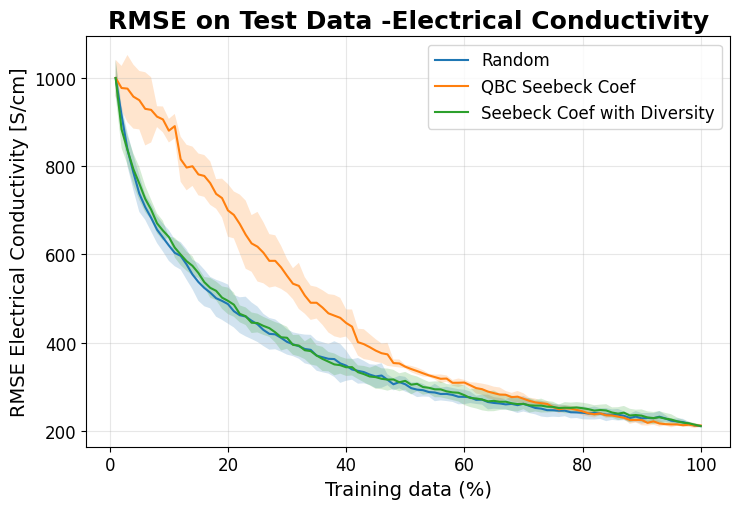

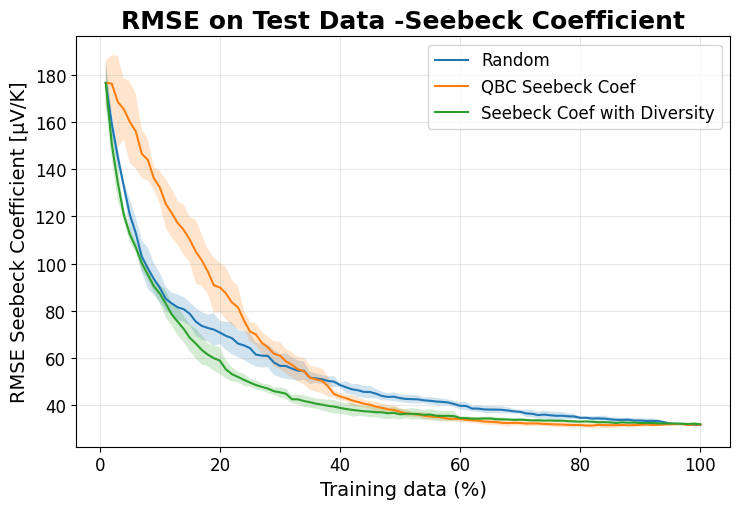

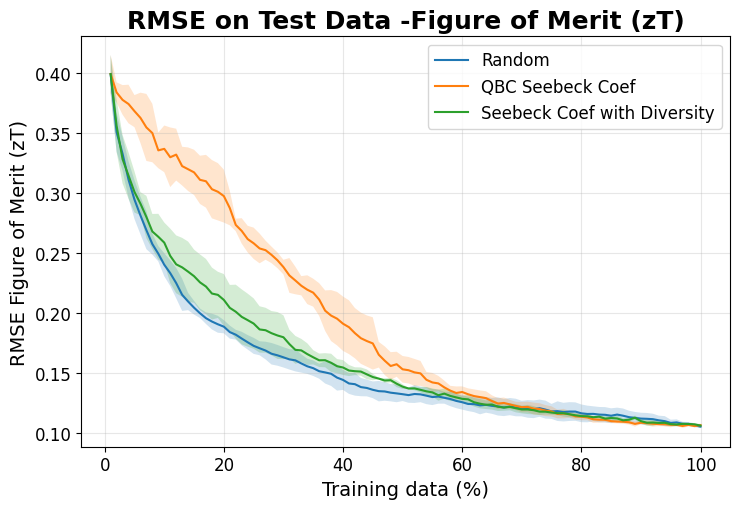

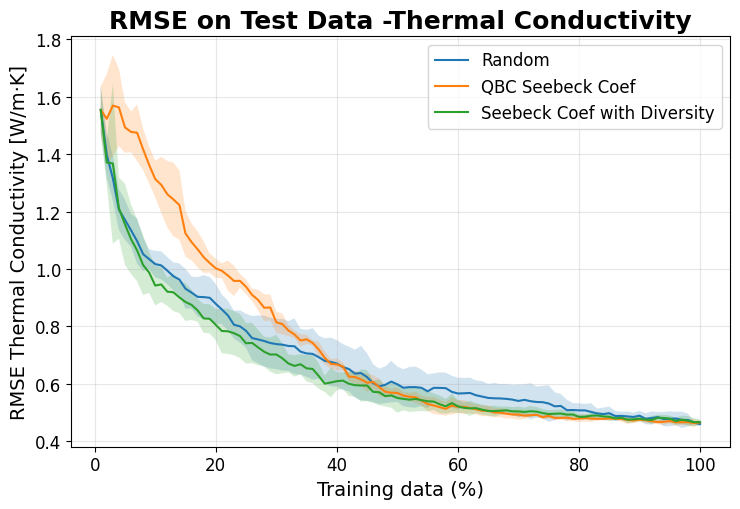

In [9]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Root + seeds
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)  # 0..4

# -------------------------
# Pretty names + units
# -------------------------
property_map = {
    "elec_cond": ("Electrical Conductivity", "S/cm"),
    "seebeck": ("Seebeck Coefficient", "µV/K"),
    "zt": ("Figure of Merit (zT)", ""),
    "k_total": ("Thermal Conductivity", "W/m·K"),
}

# -------------------------
# Loader
# -------------------------
def load_runs(base_path: str, filename_fn, label: str, seeds=range(5)) -> pd.DataFrame:
    dfs = []
    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))
        if not os.path.exists(fp):
            raise FileNotFoundError(f"Missing file: {fp}")
        df = pd.read_csv(fp)
        df["seed"] = s
        df["series"] = label
        dfs.append(df)
    return pd.concat(dfs, ignore_index=True)


# -------------------------
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_seebeck = os.path.join(base_root, "grow_QBC", "ThermoEl", "seebeck_coef")
base_ea_div_seebeck = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "seebeck_coef")


df_random_all = load_runs(
    base_random_all,
    filename_fn=lambda s: f"ThermoEl_all_random_rf{s}.csv",
    label="Random",
    seeds=seeds
)


df_ea_div_seebeck = load_runs(
    base_ea_div_seebeck,
    filename_fn=lambda s: f"ThermoEl_seebeck_coefgrowing_EA_1out_div_rf{s}.csv",
    label="Seebeck Coef with Diversity",
    seeds=seeds  # 0..4
)



df_qbc_seebeck = load_runs(
    base_qbc_seebeck,
    filename_fn=lambda s: f"ThermoEl_seebeck_coefgrowing_QBC_rf{s}.csv",
    label="QBC Seebeck Coef",
    seeds=seeds  # seeds = range(5) -> 0..4
)



full_df = pd.concat([df_random_all, df_qbc_seebeck, df_ea_div_seebeck], ignore_index=True)

# -------------------------
# Columns
# -------------------------
if "train_ratio" not in full_df.columns:
    raise KeyError("Expected column 'train_ratio' not found in loaded CSVs.")

rmse_cols = [c for c in full_df.columns if c.startswith("rmse_")]
print("RMSE columns:", rmse_cols)

# -------------------------
# Aggregate (mean ± std)
# -------------------------
mean_df = full_df.groupby(["series", "train_ratio"])[rmse_cols].mean().reset_index()
std_df  = full_df.groupby(["series", "train_ratio"])[rmse_cols].std().reset_index()

# Force consistent legend ordering
series_order = ["Random", "QBC Seebeck Coef", "Seebeck Coef with Diversity"]
mean_df["series"] = pd.Categorical(mean_df["series"], categories=series_order, ordered=True)
std_df["series"]  = pd.Categorical(std_df["series"],  categories=series_order, ordered=True)


output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\1ObjThermoElec"
os.makedirs(output_dir, exist_ok=True)


def plot_rmse(metric: str):
    prop_key = metric.replace("rmse_", "")
    prop_name, unit = property_map.get(prop_key, (prop_key, ""))

    plt.figure(figsize=(7.5, 5.2))

    for series in series_order:
        m = mean_df[mean_df["series"] == series].sort_values("train_ratio")
        s = std_df[std_df["series"] == series].sort_values("train_ratio")

        #if m.empty or metric not in m.columns:
        #    continue

        x = m["train_ratio"].to_numpy() * 100
        y = m[metric].to_numpy()
        ystd = s[metric].to_numpy()

        plt.plot(x, y, label=series)
        plt.fill_between(x, y - ystd, y + ystd, alpha=0.2)

    plt.xlabel("Training data (%)", fontsize=14)

    if unit == '':
        ylabel = f"RMSE {prop_name}"
    else:
        ylabel = f"RMSE {prop_name} [{unit}]"

    plt.ylabel(ylabel, fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(fontsize=12)

    plt.title(f"RMSE on Test Data -{prop_name}", fontsize=18, fontweight="bold")
    plt.grid(alpha=0.3)
    plt.tight_layout()

    # 🔥 Save figure BEFORE show
    filename = f"{metric}_SeebeckC.png"
    save_path = os.path.join(output_dir, filename)
    plt.savefig(save_path, dpi=100, bbox_inches='tight')

    plt.show()
    plt.close()
for metric in rmse_cols: 
    plot_rmse(metric)

RMSE columns: ['rmse_elec_cond', 'rmse_seebeck', 'rmse_zt', 'rmse_k_total']


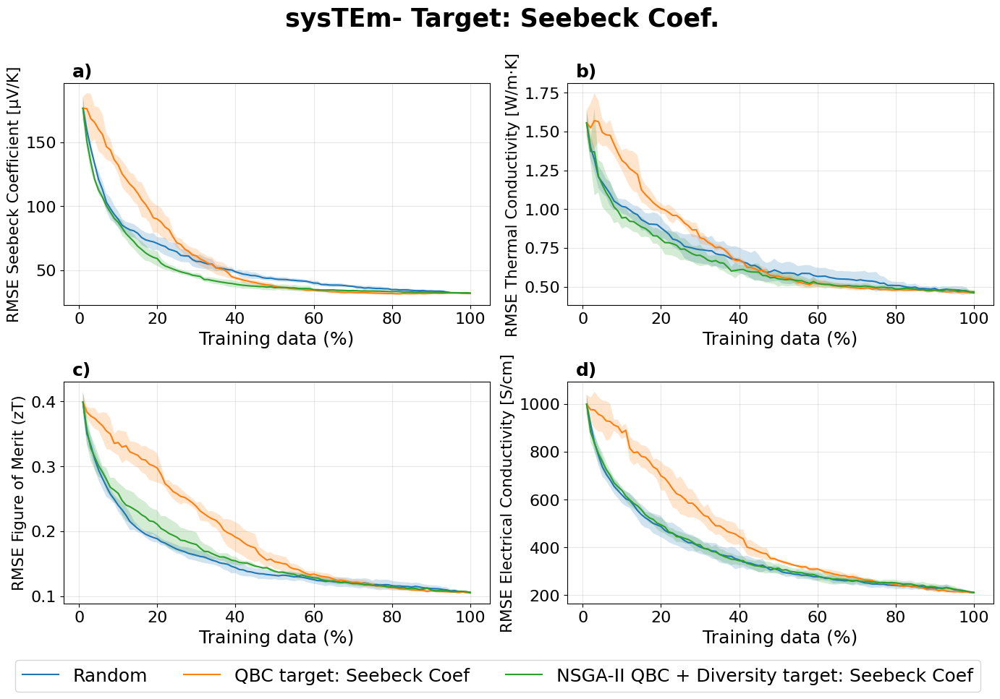

In [25]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Root + seeds
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)  # 0..4

# -------------------------
# Pretty names + units
# -------------------------
property_map = {
    "elec_cond": ("Electrical Conductivity", "S/cm"),
    "seebeck": ("Seebeck Coefficient", "µV/K"),
    "zt": ("Figure of Merit (zT)", ""),
    "k_total": ("Thermal Conductivity", "W/m·K"),
}

# -------------------------
# Loader
# -------------------------
def load_runs(base_path: str, filename_fn, label: str, seeds=range(5)) -> pd.DataFrame:
    dfs = []
    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))
        if not os.path.exists(fp):
            raise FileNotFoundError(f"Missing file: {fp}")
        df = pd.read_csv(fp)
        df["seed"] = s
        df["series"] = label
        dfs.append(df)
    return pd.concat(dfs, ignore_index=True)

# -------------------------
# Paths
# -------------------------
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_seebeck = os.path.join(base_root, "grow_QBC", "ThermoEl", "seebeck_coef")
base_ea_div_seebeck = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "seebeck_coef")

# -------------------------
# Load data
# -------------------------
df_random_all = load_runs(
    base_random_all,
    filename_fn=lambda s: f"ThermoEl_all_random_rf{s}.csv",
    label="Random",
    seeds=seeds
)

df_qbc_seebeck = load_runs(
    base_qbc_seebeck,
    filename_fn=lambda s: f"ThermoEl_seebeck_coefgrowing_QBC_rf{s}.csv",
    label="QBC target: Seebeck Coef",
    seeds=seeds
)

df_ea_div_seebeck = load_runs(
    base_ea_div_seebeck,
    filename_fn=lambda s: f"ThermoEl_seebeck_coefgrowing_EA_1out_div_rf{s}.csv",
    label="NSGA-II QBC + Diversity target: Seebeck Coef",
    seeds=seeds
)

full_df = pd.concat([df_random_all, df_qbc_seebeck, df_ea_div_seebeck], ignore_index=True)

# -------------------------
# Columns
# -------------------------
if "train_ratio" not in full_df.columns:
    raise KeyError("Expected column 'train_ratio' not found in loaded CSVs.")

rmse_cols = [c for c in full_df.columns if c.startswith("rmse_")]
print("RMSE columns:", rmse_cols)

# -------------------------
# Aggregate (mean ± std)
# -------------------------
mean_df = full_df.groupby(["series", "train_ratio"])[rmse_cols].mean().reset_index()
std_df  = full_df.groupby(["series", "train_ratio"])[rmse_cols].std().reset_index()

# -------------------------
# Force consistent legend ordering
# -------------------------
series_order = ["Random", "QBC target: Seebeck Coef", "NSGA-II QBC + Diversity target: Seebeck Coef"]
mean_df["series"] = pd.Categorical(mean_df["series"], categories=series_order, ordered=True)
std_df["series"]  = pd.Categorical(std_df["series"], categories=series_order, ordered=True)

# -------------------------
# Output directory
# -------------------------
output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\1ObjThermoElec"
os.makedirs(output_dir, exist_ok=True)

# -------------------------
# Desired subplot order
# First row: Thermal Conductivity, zT
# Second row: Seebeck, Electrical Conductivity
# -------------------------
plot_order = [
    "rmse_seebeck",
    "rmse_k_total",
    "rmse_zt",
    "rmse_elec_cond"
]

panel_labels = ["a)", "b)", "c)", "d)"]

# -------------------------
# Plot all in one figure
# -------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle(
    f" sysTEm- Target: Seebeck Coef.",
    fontsize=25,
    fontweight="bold",
    y=0.98)
fig.subplots_adjust(wspace=0.35)
axes = axes.flatten()

for ax, metric, panel_label in zip(axes, plot_order, panel_labels):
    prop_key = metric.replace("rmse_", "")
    prop_name, unit = property_map.get(prop_key, (prop_key, ""))

    for series in series_order:
        m = mean_df[mean_df["series"] == series].sort_values("train_ratio")
        s = std_df[std_df["series"] == series].sort_values("train_ratio")

        if metric not in m.columns or metric not in s.columns:
            continue

        x = m["train_ratio"].to_numpy() * 100
        y = m[metric].to_numpy()
        ystd = s[metric].to_numpy()

        ax.plot(x, y, label=series)
        ax.fill_between(x, y - ystd, y + ystd, alpha=0.2)

    ax.set_xlabel("Training data (%)", fontsize=18)

    if unit == "":
        ylabel = f"RMSE {prop_name}"
    else:
        ylabel = f"RMSE {prop_name} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=15.5)
    ax.tick_params(axis='both', labelsize=16)
    ax.grid(alpha=0.3)

    #ax.set_title(f"{prop_name}", fontsize=18, fontweight="bold")

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=18,
        fontweight="bold",
        va="top",
        ha="left"
    )

# -------------------------
# Common legend
# -------------------------
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc="lower center",
    bbox_to_anchor=(0.5, 0.02),
    ncol=3,
    fontsize=18,
    frameon=True
)

# -------------------------
# Layout
# -------------------------
plt.tight_layout(rect=[0, 0.08, 1, 0.97])

# -------------------------
# Save figure
# -------------------------
save_path = os.path.join(output_dir, "RMSE_all_properties_Seebeck_2x2.png")
plt.savefig(save_path, dpi=80, bbox_inches="tight")

plt.show()
plt.close()

RMSE columns: ['rmse_elec_cond', 'rmse_seebeck', 'rmse_zt', 'rmse_k_total']


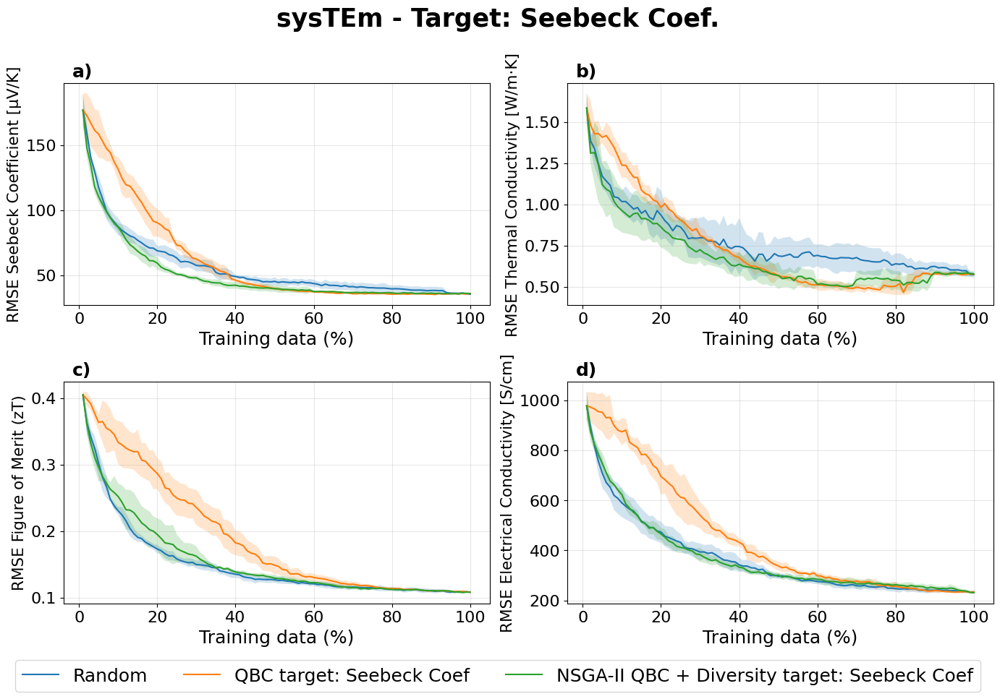

In [26]:
#-----------------------------------------------------------------------------XGBoost----------------------------------------------
import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Root + seeds
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)  # 0..4

# -------------------------
# Pretty names + units
# -------------------------
property_map = {
    "elec_cond": ("Electrical Conductivity", "S/cm"),
    "seebeck": ("Seebeck Coefficient", "µV/K"),
    "zt": ("Figure of Merit (zT)", ""),
    "k_total": ("Thermal Conductivity", "W/m·K"),
}

# -------------------------
# Loader
# -------------------------
def load_runs(base_path: str, filename_fn, label: str, seeds=range(5)) -> pd.DataFrame:
    dfs = []
    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))
        if not os.path.exists(fp):
            raise FileNotFoundError(f"Missing file: {fp}")
        df = pd.read_csv(fp)
        df["seed"] = s
        df["series"] = label
        dfs.append(df)
    return pd.concat(dfs, ignore_index=True)

# -------------------------
# Paths
# -------------------------
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_seebeck = os.path.join(base_root, "grow_QBC", "ThermoEl", "seebeck_coef")
base_ea_div_seebeck = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "seebeck_coef")

# -------------------------
# Load XGBoost data
# -------------------------
df_random_all = load_runs(
    base_random_all,
    filename_fn=lambda s: f"ThermoEl_all_random_xgb{s}.csv",
    label="Random",
    seeds=seeds
)

df_qbc_seebeck = load_runs(
    base_qbc_seebeck,
    filename_fn=lambda s: f"ThermoEl_seebeck_coefgrowing_QBC_xgb{s}.csv",
    label="QBC target: Seebeck Coef",
    seeds=seeds
)

df_ea_div_seebeck = load_runs(
    base_ea_div_seebeck,
    filename_fn=lambda s: f"ThermoEl_seebeck_coefgrowing_EA_1out_div_xgb{s}.csv",
    label="NSGA-II QBC + Diversity target: Seebeck Coef",
    seeds=seeds
)

full_df = pd.concat(
    [df_random_all, df_qbc_seebeck, df_ea_div_seebeck],
    ignore_index=True
)

# -------------------------
# Columns
# -------------------------
if "train_ratio" not in full_df.columns:
    raise KeyError("Expected column 'train_ratio' not found in loaded CSVs.")

rmse_cols = [c for c in full_df.columns if c.startswith("rmse_")]
print("RMSE columns:", rmse_cols)

# -------------------------
# Aggregate correctly
# First average duplicate train_ratio rows within each seed
# Then compute mean/std across seeds
# -------------------------
grouped = (
    full_df
    .groupby(["series", "seed", "train_ratio"])[rmse_cols]
    .mean()
    .reset_index()
)

mean_df = (
    grouped
    .groupby(["series", "train_ratio"])[rmse_cols]
    .mean()
    .reset_index()
)

std_df = (
    grouped
    .groupby(["series", "train_ratio"])[rmse_cols]
    .std()
    .reset_index()
)

# -------------------------
# Force consistent legend ordering
# -------------------------
series_order = [
    "Random",
    "QBC target: Seebeck Coef",
    "NSGA-II QBC + Diversity target: Seebeck Coef"
]

mean_df["series"] = pd.Categorical(
    mean_df["series"],
    categories=series_order,
    ordered=True
)

std_df["series"] = pd.Categorical(
    std_df["series"],
    categories=series_order,
    ordered=True
)

# -------------------------
# Output directory
# -------------------------
output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\1ObjThermoElec_XGBOOST"
os.makedirs(output_dir, exist_ok=True)

# -------------------------
# Desired subplot order
# -------------------------
plot_order = [
    "rmse_seebeck",
    "rmse_k_total",
    "rmse_zt",
    "rmse_elec_cond"
]

panel_labels = ["a)", "b)", "c)", "d)"]

# -------------------------
# Plot all in one figure
# -------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

fig.suptitle(
    "sysTEm - Target: Seebeck Coef.",
    fontsize=25,
    fontweight="bold",
    y=0.98
)

fig.subplots_adjust(wspace=0.35)
axes = axes.flatten()

for ax, metric, panel_label in zip(axes, plot_order, panel_labels):
    prop_key = metric.replace("rmse_", "")
    prop_name, unit = property_map.get(prop_key, (prop_key, ""))

    for series in series_order:
        m = mean_df[mean_df["series"] == series].sort_values("train_ratio")
        s = std_df[std_df["series"] == series].sort_values("train_ratio")

        if metric not in m.columns or metric not in s.columns:
            continue

        x = m["train_ratio"].to_numpy() * 100
        y = m[metric].to_numpy()
        ystd = s[metric].to_numpy()

        ax.plot(x, y, label=series)
        ax.fill_between(x, y - ystd, y + ystd, alpha=0.2)

    ax.set_xlabel("Training data (%)", fontsize=18)

    ylabel = f"RMSE {prop_name}" if unit == "" else f"RMSE {prop_name} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=15.5)
    ax.tick_params(axis="both", labelsize=16)
    ax.grid(alpha=0.3)

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=18,
        fontweight="bold",
        va="top",
        ha="left"
    )

# -------------------------
# Common legend
# -------------------------
handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, 0.02),
    ncol=3,
    fontsize=18,
    frameon=True
)

# -------------------------
# Layout
# -------------------------
plt.tight_layout(rect=[0, 0.08, 1, 0.97])

# -------------------------
# Save figure
# -------------------------
save_path = os.path.join(
    output_dir,
    "RMSE_all_properties_Seebeck_2x2_XGBoost.png"
)

plt.savefig(save_path, dpi=80, bbox_inches="tight")

plt.show()
plt.close()

In [6]:

import os
import numpy as np
import pandas as pd

# ============================================================
# CONFIG
# ============================================================
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
seeds = range(5)  # 0..4

# Where to save the AUC tables
output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\AUC_1OBJ"
os.makedirs(output_dir, exist_ok=True)

# Baseline for "improvement vs baseline"
baseline_series = "Random"

# AUC options (recommended)
# - normalize_x_to_01: makes AUC comparable if some runs have different x coverage
# - divide_by_xrange: returns "average RMSE across x-range" (AUC/(xmax-xmin)) for comparability
normalize_x_to_01 = False
divide_by_xrange = True

# ============================================================
# LOADER
# ============================================================
def load_runs(base_path: str, filename_fn, label: str, seeds=range(5)) -> pd.DataFrame:
    dfs = []
    for s in seeds:
        fp = os.path.join(base_path, str(s), filename_fn(s))
        if not os.path.exists(fp):
            raise FileNotFoundError(f"Missing file: {fp}")
        df = pd.read_csv(fp)
        df["seed"] = s
        df["series"] = label
        dfs.append(df)
    return pd.concat(dfs, ignore_index=True)

# ============================================================
# AUC CORE
# ============================================================
def auc_trapz(x, y, *, x_is_percent=False, normalize_x_to_01=False, divide_by_xrange=False):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if x.size < 2:
        return np.nan

    if x_is_percent:
        x = x / 100.0

    order = np.argsort(x)
    x, y = x[order], y[order]

    # Merge duplicates
    if np.any(np.diff(x) == 0):
        tmp = pd.DataFrame({"x": x, "y": y}).groupby("x", as_index=False).mean()
        x, y = tmp["x"].to_numpy(), tmp["y"].to_numpy()
        if x.size < 2:
            return np.nan

    xmin, xmax = float(np.min(x)), float(np.max(x))
    if xmax == xmin:
        return np.nan

    if normalize_x_to_01:
        x = (x - xmin) / (xmax - xmin)
        xmin, xmax = 0.0, 1.0

    area = float(np.trapz(y, x))

    if divide_by_xrange:
        return area / (xmax - xmin)

    return area

def build_auc_tables_series(
    df,
    rmse_cols,
    *,
    x_col="train_ratio",
    baseline_series="Random",
    normalize_x_to_01=False,
    divide_by_xrange=True,
):
    if x_col not in df.columns:
        raise ValueError(f"Missing x_col='{x_col}' in df columns: {list(df.columns)}")

    x_is_percent = (x_col == "train_pct")

    rmse_cols = [c for c in rmse_cols if c in df.columns]
    if not rmse_cols:
        raise ValueError("No rmse_* columns found in df.")

    rows = []
    for (series, seed), g in df.groupby(["series", "seed"], dropna=False):
        x = g[x_col].to_numpy()
        for metric in rmse_cols:
            y = g[metric].to_numpy()
            auc = auc_trapz(
                x, y,
                x_is_percent=x_is_percent,
                normalize_x_to_01=normalize_x_to_01,
                divide_by_xrange=divide_by_xrange,
            )
            rows.append({"series": series, "seed": seed, "metric": metric, "auc": auc})

    auc_per_seed = pd.DataFrame(rows)

    auc_summary = (
        auc_per_seed
        .groupby(["series", "metric"], as_index=False)
        .agg(
            auc_mean=("auc", "mean"),
            auc_std=("auc", "std"),
            n=("auc", "count"),
        )
    )

    # Improvement vs baseline
    base = (
        auc_summary[auc_summary["series"] == baseline_series][["metric", "auc_mean"]]
        .rename(columns={"auc_mean": "baseline_auc_mean"})
    )
    auc_summary = auc_summary.merge(base, on="metric", how="left")
    auc_summary["improvement_vs_baseline"] = auc_summary["baseline_auc_mean"] - auc_summary["auc_mean"]
    auc_summary["improvement_pct_vs_baseline"] = 100.0 * (
        auc_summary["improvement_vs_baseline"] / auc_summary["baseline_auc_mean"]
    )

    auc_summary = auc_summary.sort_values(["metric", "auc_mean"]).reset_index(drop=True)
    return auc_per_seed, auc_summary

# ============================================================
# SERIES TO COMPARE (same as your plotting script)
# ============================================================
base_random_all = os.path.join(base_root, "grow_random", "ThermoEl", "all")
base_qbc_thc    = os.path.join(base_root, "grow_QBC", "ThermoEl", "thermal_cond")
base_ea_div_thc = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "thermal_cond")

base_ea_div_zt  = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "zT")
base_qbc_zt     = os.path.join(base_root, "grow_QBC", "ThermoEl", "zT")

base_qbc_seebeck    = os.path.join(base_root, "grow_QBC", "ThermoEl", "seebeck_coef")
base_ea_div_seebeck = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "seebeck_coef")

base_ea_div_elec = os.path.join(base_root, "grow_EA_DeltaDiversity", "ThermoEl", "electric_cond")
base_qbc_elec    = os.path.join(base_root, "grow_QBC", "ThermoEl", "electric_cond")

df_random_all = load_runs(
    base_random_all,
    filename_fn=lambda s: f"ThermoEl_all_random_rf{s}.csv",
    label="Random",
    seeds=seeds,
)

df_qbc_thc = load_runs(
    base_qbc_thc,
    filename_fn=lambda s: f"ThermoEl_thermal_condgrowing_QBC_rf{s}.csv",
    label="QBC Thermal Cond.",
    seeds=seeds,
)

df_ea_div_thc = load_runs(
    base_ea_div_thc,
    filename_fn=lambda s: f"ThermoEl_thermal_condgrowing_EA_1out_div_rf{s}.csv",
    label="Thermal Cond. with Diversity",
    seeds=seeds,
)

df_qbc_zt = load_runs(
    base_qbc_zt,
    filename_fn=lambda s: f"ThermoEl_zTgrowing_QBC_rf{s}.csv",
    label="QBC zT",
    seeds=seeds,
)

df_ea_div_zt = load_runs(
    base_ea_div_zt,
    filename_fn=lambda s: f"ThermoEl_zTgrowing_EA_1out_div_rf{s}.csv",
    label="zT with Diversity",
    seeds=seeds,
)

df_qbc_seebeck = load_runs(
    base_qbc_seebeck,
    filename_fn=lambda s: f"ThermoEl_seebeck_coefgrowing_QBC_rf{s}.csv",
    label="QBC Seebeck",
    seeds=seeds,
)

df_ea_div_seebeck = load_runs(
    base_ea_div_seebeck,
    filename_fn=lambda s: f"ThermoEl_seebeck_coefgrowing_EA_1out_div_rf{s}.csv",
    label="Seebeck with Diversity",
    seeds=seeds,
)

df_qbc_elec = load_runs(
    base_qbc_elec,
    filename_fn=lambda s: f"ThermoEl_electric_condgrowing_QBC_rf{s}.csv",
    label="QBC Elec. Cond.",
    seeds=seeds,
)

df_ea_div_elec = load_runs(
    base_ea_div_elec,
    filename_fn=lambda s: f"ThermoEl_electric_condgrowing_EA_1out_div_rf{s}.csv",
    label="Elec. Cond. with Diversity",
    seeds=seeds,
)

full_df = pd.concat(
    [
        df_random_all,
        df_qbc_thc,
        df_ea_div_thc,
        df_qbc_zt,
        df_ea_div_zt,
        df_qbc_seebeck,
        df_ea_div_seebeck,
        df_qbc_elec,
        df_ea_div_elec,
    ],
    ignore_index=True,
)

# ============================================================
# COMPUTE + SAVE AUC TABLES
# ============================================================
if "train_ratio" not in full_df.columns:
    raise KeyError("Expected column 'train_ratio' not found in loaded CSVs.")

rmse_cols = [c for c in full_df.columns if c.startswith("rmse_")]
if not rmse_cols:
    raise ValueError("No columns starting with 'rmse_' were found in the loaded CSVs.")

auc_per_seed, auc_summary = build_auc_tables_series(
    df=full_df,
    rmse_cols=rmse_cols,
    x_col="train_ratio",
    baseline_series=baseline_series,
    normalize_x_to_01=normalize_x_to_01,
    divide_by_xrange=divide_by_xrange,
)

# Wide mean ± std table
wide_mean = auc_summary.pivot_table(index="metric", columns="series", values="auc_mean")
wide_std  = auc_summary.pivot_table(index="metric", columns="series", values="auc_std")

rows = []
for metric in wide_mean.index:
    row = {"metric": metric}
    for series in wide_mean.columns:
        mu = wide_mean.loc[metric, series]
        sd = wide_std.loc[metric, series]
        row[series] = f"{mu:.6g} ± {sd:.3g}" if np.isfinite(mu) else ""
    rows.append(row)

auc_table_meanpm = pd.DataFrame(rows)

# Wide improvement vs baseline
wide_impr = auc_summary.pivot_table(index="metric", columns="series", values="improvement_vs_baseline")
auc_improvement_table = wide_impr.reset_index()

# Save CSVs
auc_per_seed.to_csv(os.path.join(output_dir, "auc_per_seed_series.csv"), index=False)
auc_summary.to_csv(os.path.join(output_dir, "auc_summary_series_long.csv"), index=False)
auc_table_meanpm.to_csv(os.path.join(output_dir, "auc_summary_series_mean_pm_std_wide.csv"), index=False)
auc_improvement_table.to_csv(os.path.join(output_dir, "auc_improvement_vs_random_wide.csv"), index=False)

print("Saved:")
print(" -", os.path.join(output_dir, "auc_per_seed_series.csv"))
print(" -", os.path.join(output_dir, "auc_summary_series_long.csv"))
print(" -", os.path.join(output_dir, "auc_summary_series_mean_pm_std_wide.csv"))
print(" -", os.path.join(output_dir, "auc_improvement_vs_random_wide.csv"))


Saved:
 - c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\AUC_1OBJ\auc_per_seed_series.csv
 - c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\AUC_1OBJ\auc_summary_series_long.csv
 - c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\AUC_1OBJ\auc_summary_series_mean_pm_std_wide.csv
 - c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\AUC_1OBJ\auc_improvement_vs_random_wide.csv


# Two Outcomes

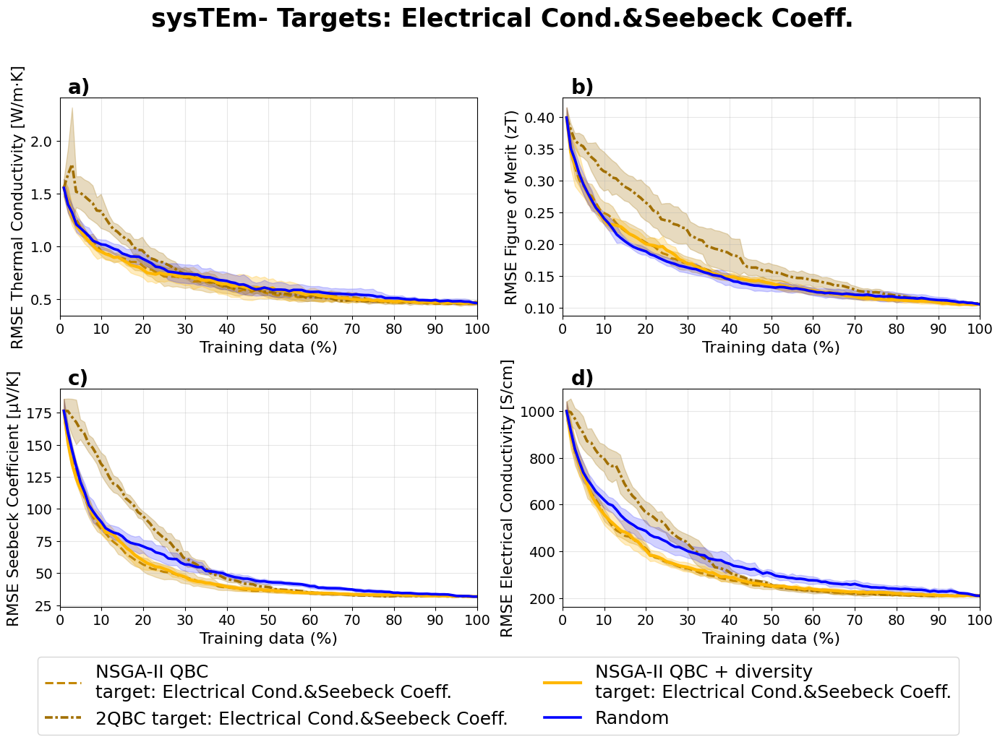

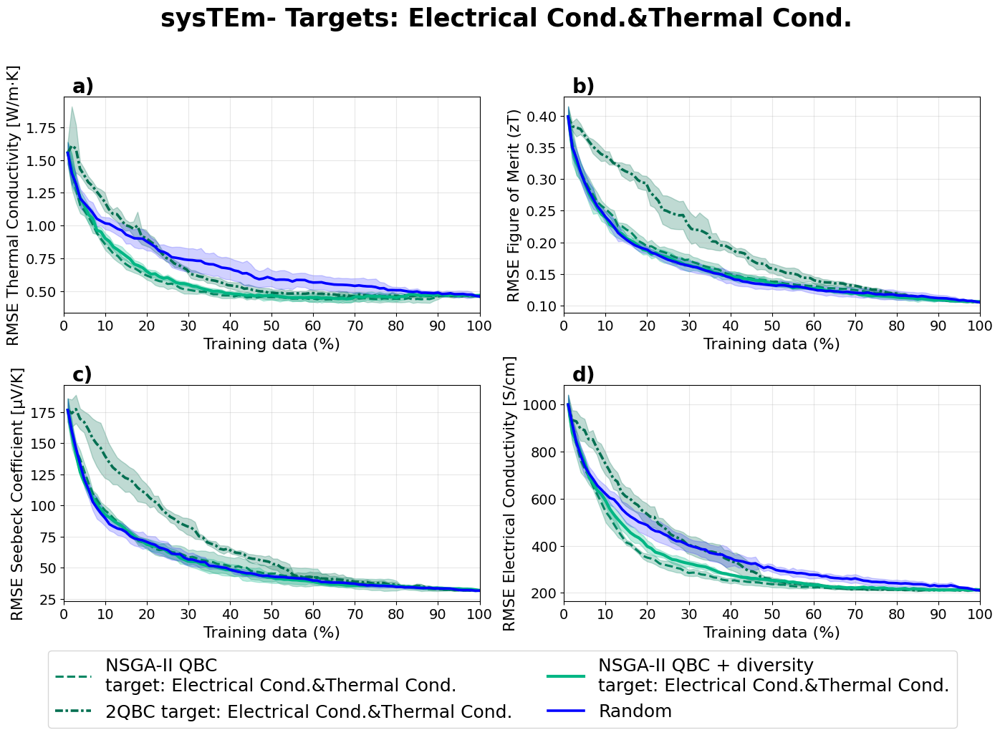

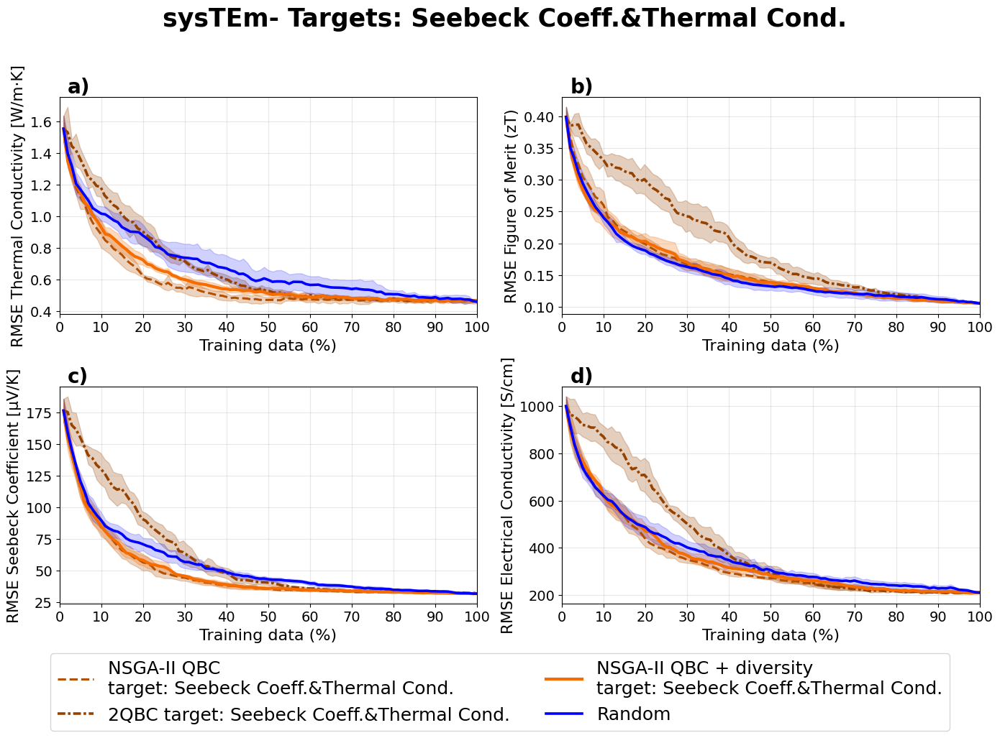

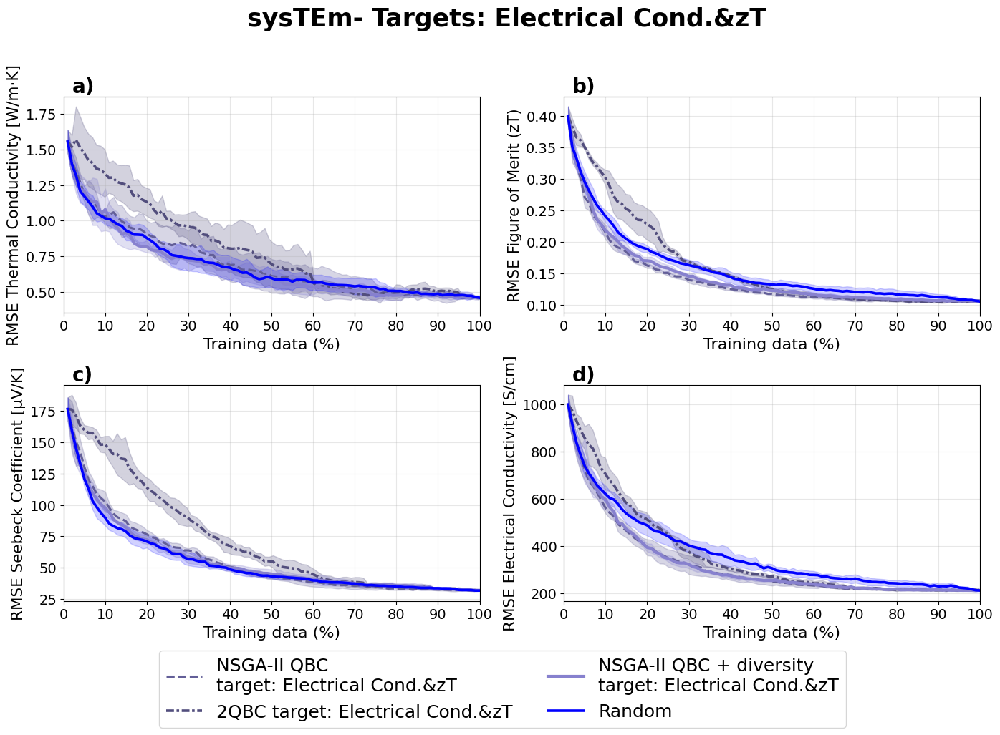

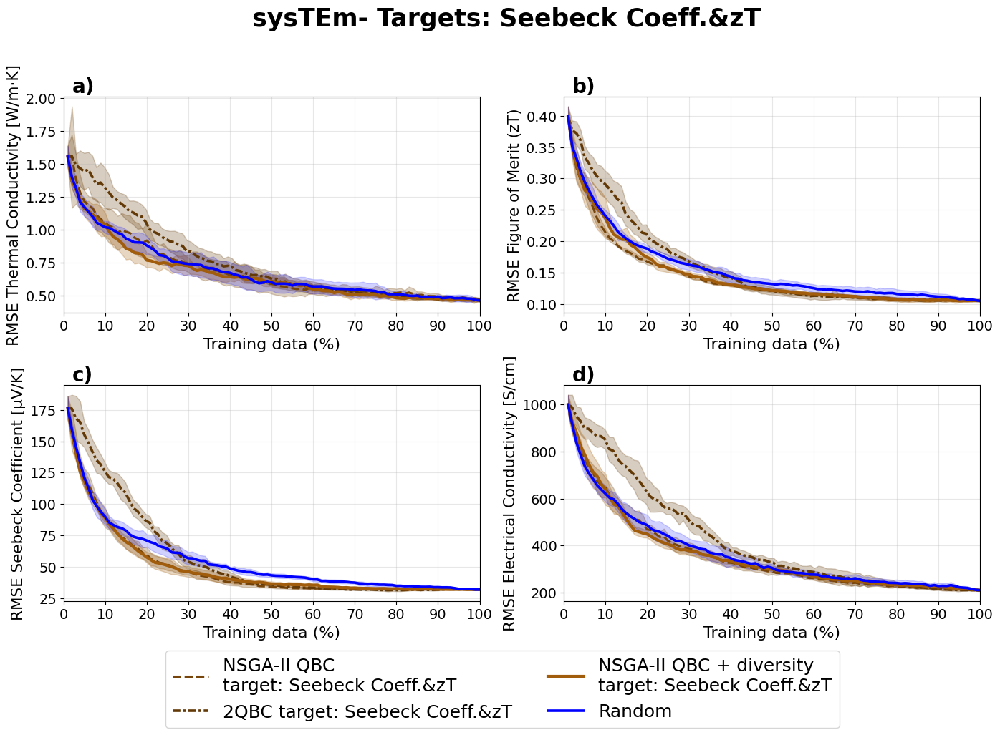

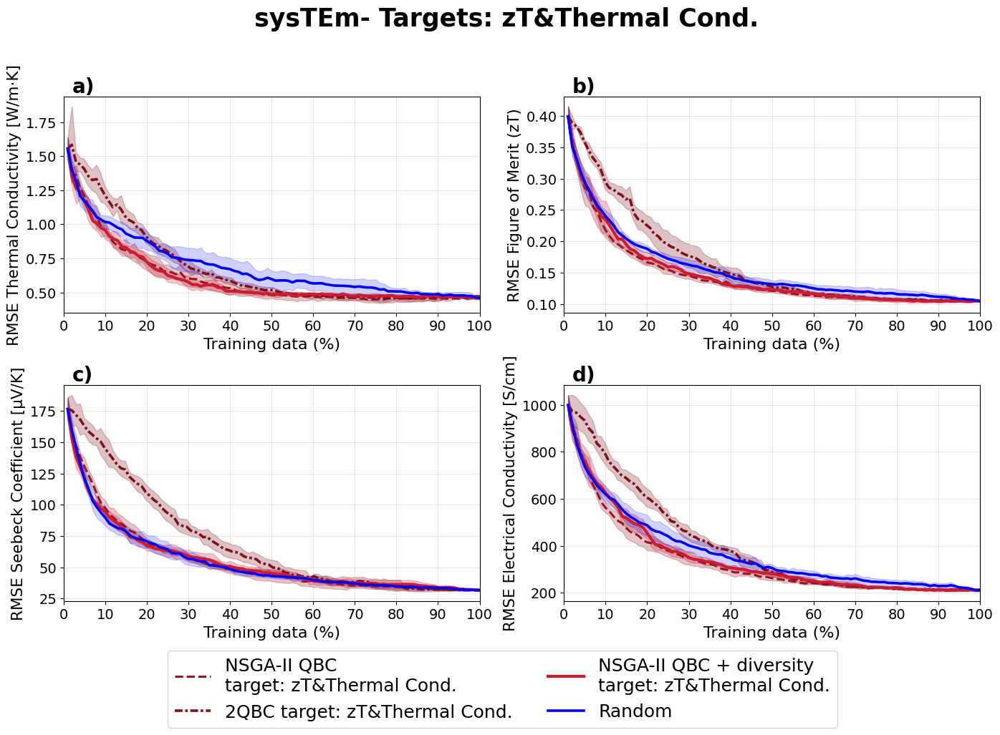

In [15]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import re
import unicodedata

# -------------------------
# Output directory
# -------------------------
output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\2ObjThermoElec"
os.makedirs(output_dir, exist_ok=True)

# -------------------------
# Helper: safe filename
# -------------------------
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

# -------------------------
# Root + common config
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
dataset = "ThermoEl"

targets = ["el_seeb", "el_ThC", "seeb_ThC", "el_zT", "seeb_zT", "zT_ThC"]
seeds = range(5)  # 0..4

# -------------------------
# Human-readable target names
# -------------------------
TARGET_PRETTY = {
    "el_seeb":  "Electrical Cond.&Seebeck Coeff.",
    "zT_ThC":   "zT&Thermal Cond.",
    "el_ThC":   "Electrical Cond.&Thermal Cond.",
    "seeb_ThC": "Seebeck Coeff.&Thermal Cond.",
    "el_zT":    "Electrical Cond.&zT",
    "seeb_zT":  "Seebeck Coeff.&zT",
}

# -------------------------
# Base color per target
# -------------------------
TARGET_BASE_COLOR = {
    "el_seeb":  "#e69f00",  # orange
    "el_ThC":   "#009e73",  # green
    "seeb_ThC": "#d55e00",  # red-orange
    "el_zT":    "#7570b3",  # purple
    "seeb_zT":  "#8c510a",  # brown
    "zT_ThC":   "#b2182b",  # crimson
}

def adjust_color(color, factor):
    """
    factor < 1 -> darker
    factor > 1 -> lighter
    """
    r, g, b = mcolors.to_rgb(color)
    r = min(1, max(0, r * factor))
    g = min(1, max(0, g * factor))
    b = min(1, max(0, b * factor))
    return (r, g, b)

# -------------------------
# Tone adjustment per policy
# -------------------------
POLICY_TONE = {
    "NSGA-II (EA, QBC only)": 0.85,
    "2QBC (QBC only)": 0.70,
    "NSGA-II (EA, QBC + Diversity)": 1.15,
    "Random": None,
}

# -------------------------
# RMSE columns with pretty names
# -------------------------
property_map = {
    "rmse_elec_cond": ("Electrical Conductivity", "S/cm"),
    "rmse_seebeck": ("Seebeck Coefficient", "µV/K"),
    "rmse_zt": ("Figure of Merit (zT)", ""),
    "rmse_k_total": ("Thermal Conductivity", "W/m·K"),
}

plot_order = [
    "rmse_k_total",
    "rmse_zt",
    "rmse_seebeck",
    "rmse_elec_cond"
]

panel_labels = ["a)", "b)", "c)", "d)"]

# -------------------------
# Policies
# -------------------------
policies = {
    "NSGA-II (EA, QBC only)": {
        "folder": "grow_EA_2Obj_TwoTargets_QBC_ONLY",
        "filename_tpl": "{dataset}_{target}growing_EA_2obj_qbc_only_rf{seed}.csv",
        "linestyle": "--",
        "linewidth": 2.2,
    },
    "NSGA-II (EA, QBC + Diversity)": {
        "folder": "grow_EA_3Obj_TwoTargets",
        "filename_tpl": "{dataset}_{target}growing_EA_2out_div_rf{seed}.csv",
        "linestyle": "-",
        "linewidth": 3.0,
    },
    "2QBC (QBC only)": {
        "folder": "grow_2QBC",
        "filename_tpl": "{dataset}_{target}growing_2QBC_rf{seed}.csv",
        "linestyle": (0, (3, 1, 1, 1)),
        "linewidth": 2.6,
    },
    "Random": {
        "folder": "grow_random",
        "filename_tpl": "{dataset}_all_random_rf{seed}.csv",
        "target_mode": "all",
        "linestyle": "-",
        "linewidth": 2.6,
        "color": "blue",
        "fill_alpha": 0.18,
    },
}

policy_order = [
    "NSGA-II (EA, QBC only)",
    "2QBC (QBC only)",
    "NSGA-II (EA, QBC + Diversity)",
    "Random",
]

# -------------------------
# Helper: build csv path
# -------------------------
def build_csv_path(policy_cfg, target, seed):
    effective_target = "all" if policy_cfg.get("target_mode") == "all" else target
    fname = policy_cfg["filename_tpl"].format(dataset=dataset, target=target, seed=seed)
    return os.path.join(
        base_root,
        policy_cfg["folder"],
        dataset,
        effective_target,
        str(seed),
        fname,
    )

# -------------------------
# Load all data
# -------------------------
all_data = []

for target in targets:
    for policy_name in policy_order:
        cfg = policies[policy_name]
        for seed in seeds:
            csv_path = build_csv_path(cfg, target, seed)
            if not os.path.exists(csv_path):
                raise FileNotFoundError(f"Missing file: {csv_path}")

            df = pd.read_csv(csv_path)
            if "train_ratio" not in df.columns:
                raise ValueError(f"'train_ratio' not found in: {csv_path}")

            df["seed"] = seed
            df["policy"] = policy_name
            df["target"] = target
            df["train_pct"] = df["train_ratio"] * 100.0   # raw x-axis, no transform

            all_data.append(df)

df_all = pd.concat(all_data, ignore_index=True)

# -------------------------
# Aggregate mean + std across seeds
# -------------------------
present_rmse_cols = [c for c in property_map.keys() if c in df_all.columns]

agg = (
    df_all
    .groupby(["target", "policy", "train_pct"], as_index=False)
    .agg({col: ["mean", "std"] for col in present_rmse_cols})
)

agg.columns = [(a if b == "" else f"{a}__{b}") for a, b in agg.columns.to_flat_index()]

# -------------------------
# Make one 2x2 image for each target pair
# -------------------------
for target in targets:
    sub_t = agg[agg["target"] == target]
    target_pretty = TARGET_PRETTY.get(target, target)
    base_color = TARGET_BASE_COLOR[target]

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle(
    f" sysTEm- Targets: {target_pretty}",
    fontsize=25,
    fontweight="bold",
    y=0.98)

    fig.subplots_adjust(wspace=0.35)
    axes = axes.flatten()

    for ax, metric, panel_label in zip(axes, plot_order, panel_labels):
        mean_col = f"{metric}__mean"
        std_col = f"{metric}__std"

        if mean_col not in sub_t.columns or std_col not in sub_t.columns:
            ax.set_visible(False)
            continue

        prop_name, unit = property_map.get(metric, (metric, ""))

        for policy_name in policy_order:
            cfg = policies[policy_name]
            sub_p = sub_t[sub_t["policy"] == policy_name].sort_values("train_pct")
            if sub_p.empty:
                continue

            x = sub_p["train_pct"].to_numpy()   # raw x values
            y_mean = sub_p[mean_col].to_numpy()
            y_std = sub_p[std_col].to_numpy()

            if policy_name == "NSGA-II (EA, QBC only)":
                label = f"NSGA-II QBC \ntarget: {target_pretty}"
            elif policy_name == "2QBC (QBC only)":
                label = f"2QBC target: {target_pretty}"
            elif policy_name == "NSGA-II (EA, QBC + Diversity)":
                label = f"NSGA-II QBC + diversity \ntarget: {target_pretty}"
            else:
                label = "Random"

            if policy_name == "Random":
                color = "blue"
            else:
                tone_factor = POLICY_TONE[policy_name]
                color = adjust_color(base_color, tone_factor)

            ax.plot(
                x, y_mean,
                linestyle=cfg["linestyle"],
                linewidth=cfg["linewidth"],
                color=color,
                label=label
            )

            fill_alpha = cfg.get("fill_alpha", 0.25)
            ax.fill_between(
                x,
                y_mean - y_std,
                y_mean + y_std,
                alpha=fill_alpha,
                color=color
            )

        ax.set_xlabel("Training data (%)", fontsize=16)

        if unit == "":
            ylabel = f"RMSE {prop_name}"
        else:
            ylabel = f"RMSE {prop_name} [{unit}]"

        ax.set_ylabel(ylabel, fontsize=15.5)
        ax.tick_params(axis='both', labelsize=14)
        ax.grid(alpha=0.3)
        #ax.set_title(f"{prop_name}", fontsize=18, fontweight="bold")

        # raw x axis, no transformation
        ax.set_xticks(np.arange(0, 101, 10))
        ax.set_xlim(left=max(0, sub_t["train_pct"].min() - 1), right=100)

        # panel label
        ax.text(
            0.02, 1.09, panel_label,
            transform=ax.transAxes,
            fontsize=20,
            fontweight="bold",
            va="top",
            ha="left"
        )

    # Common legend below all plots
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels,
        loc="lower center",
        bbox_to_anchor=(0.5, -0.04),
        ncol=2,
        fontsize=18,
        frameon=True
    )

    # Optional main title
    # fig.suptitle(f"RMSE on Test Data — {target_pretty}", fontsize=20, fontweight="bold", y=0.98)

    plt.tight_layout(rect=[0, 0.08, 1, 0.95])

    filename = f"{sanitize_filename(target_pretty)}_RMSE_all_4plots.png"
    save_path = os.path.join(output_dir, filename)
    plt.savefig(save_path, dpi=80, bbox_inches="tight")
    plt.show()
    plt.close()

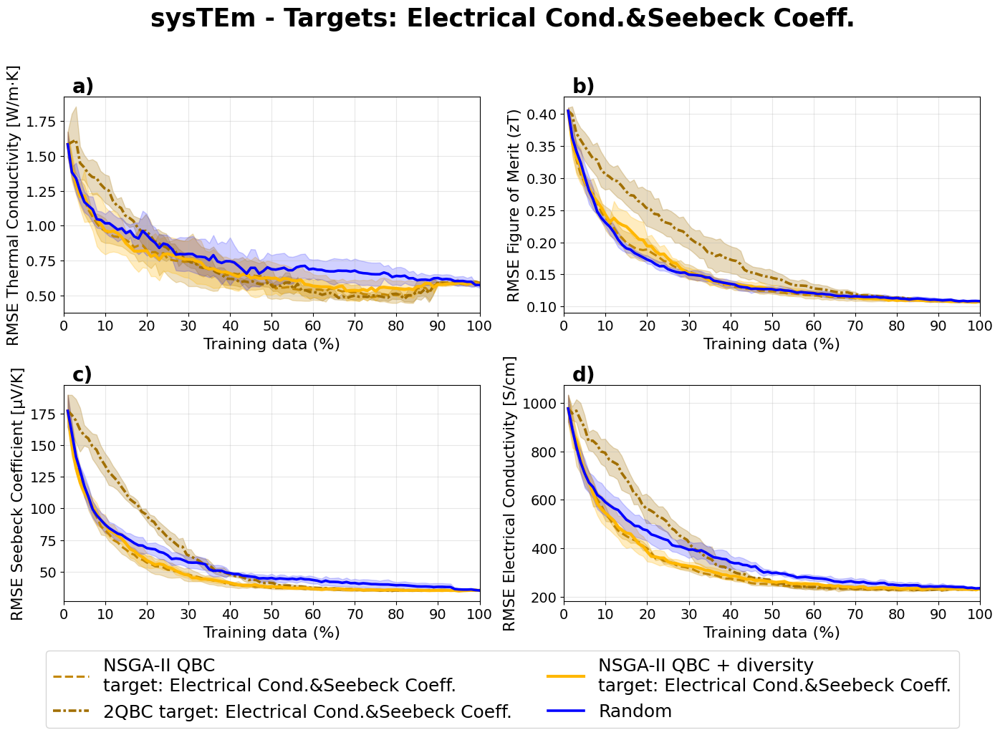

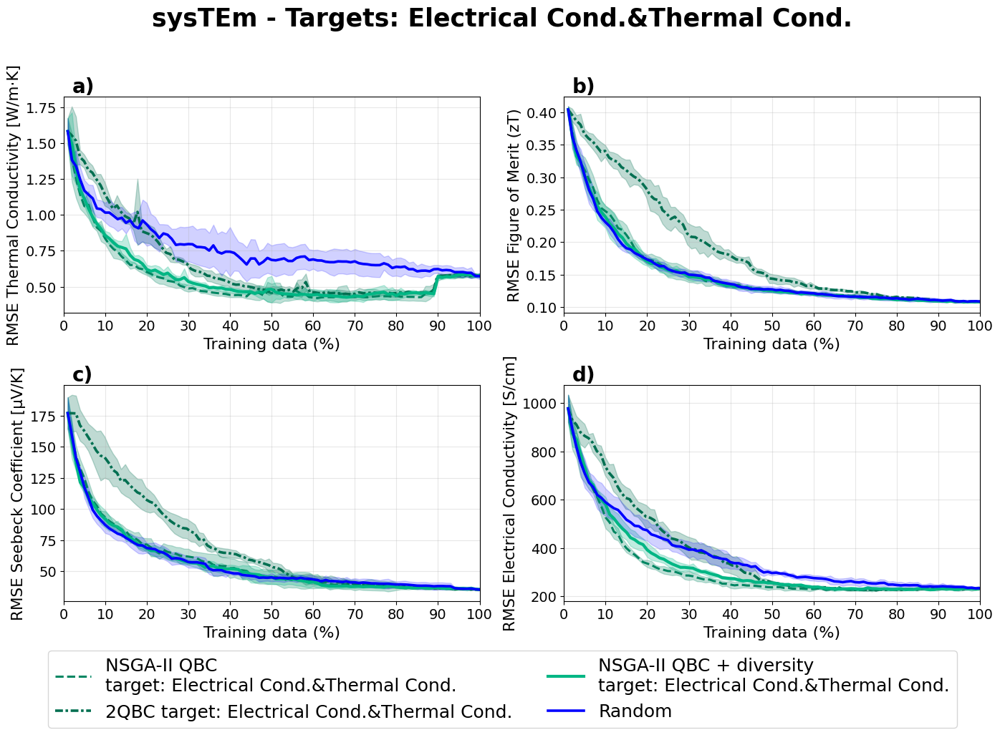

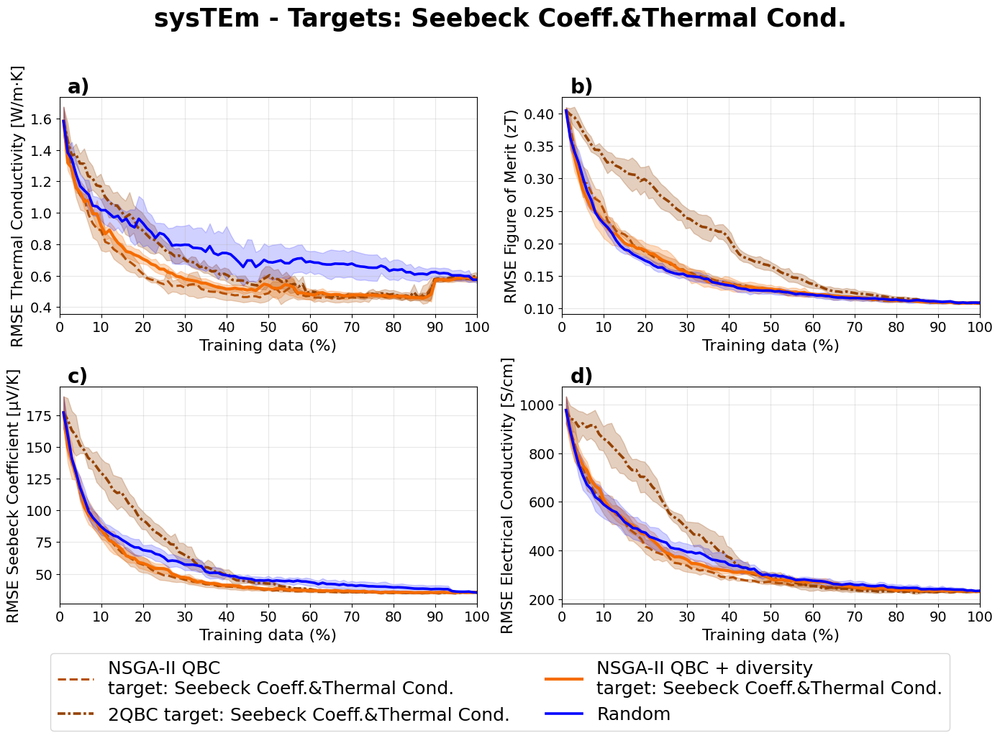

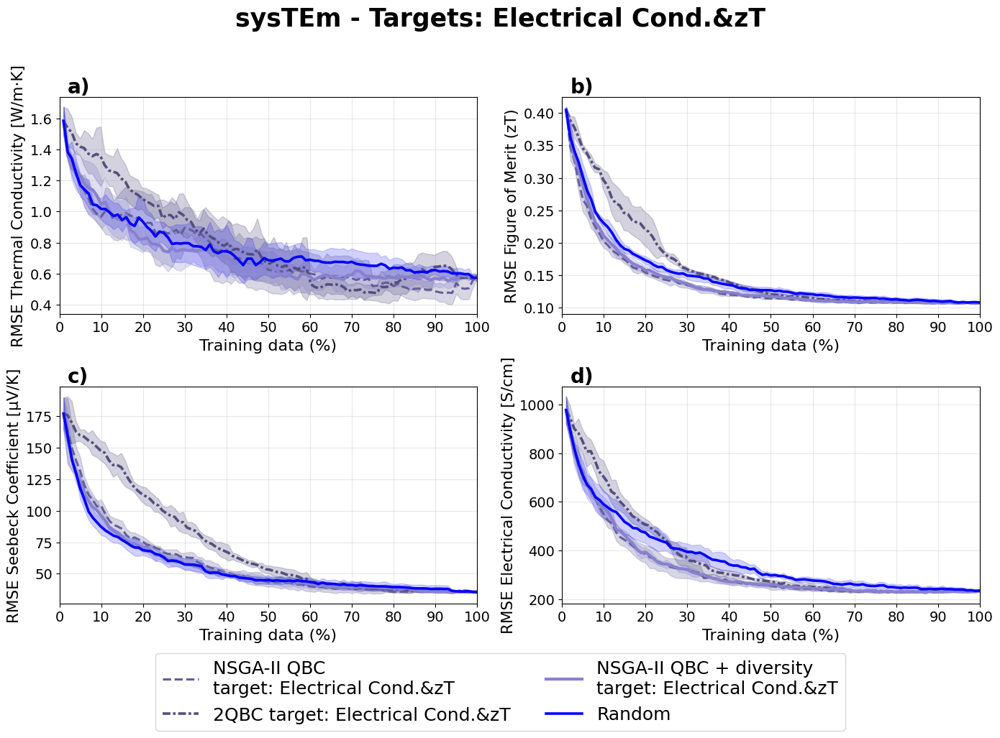

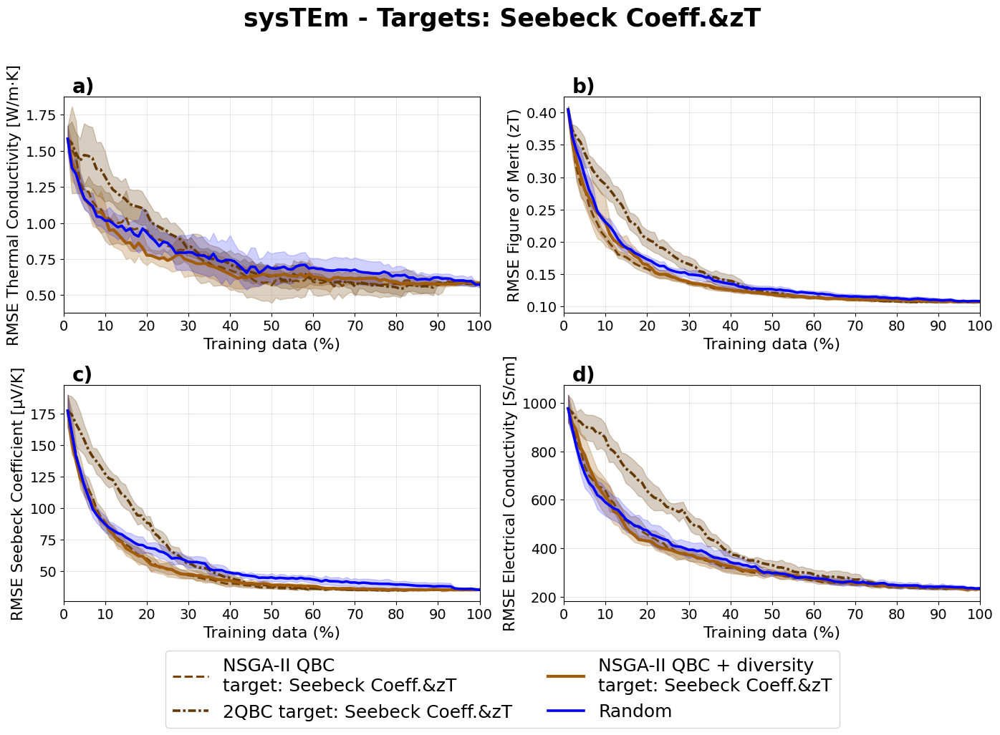

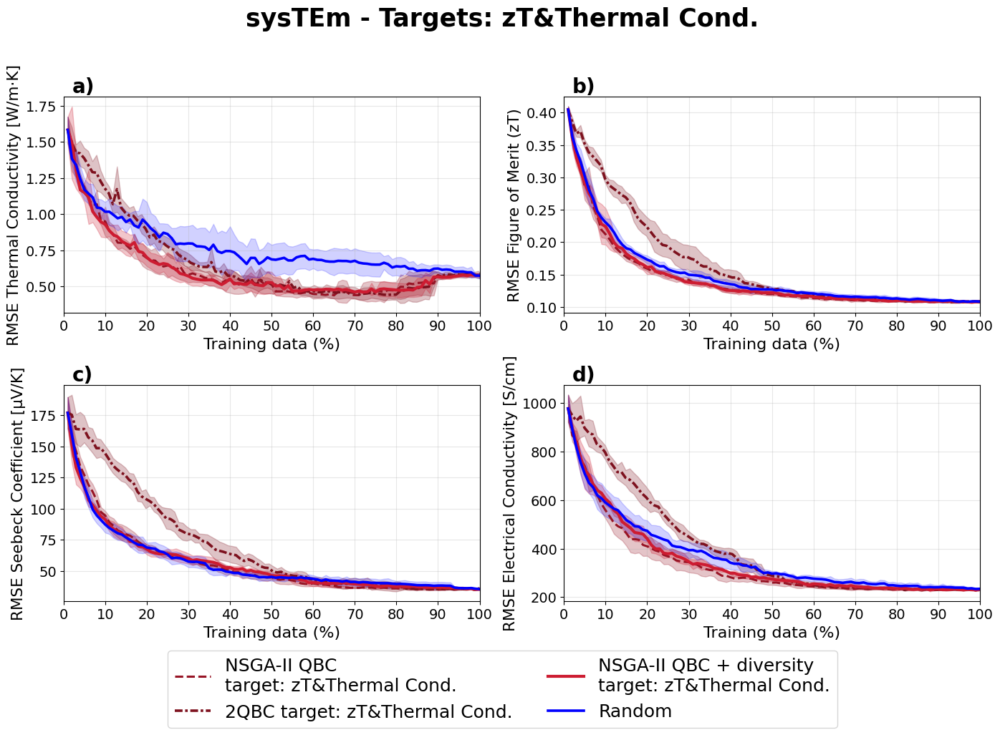

In [14]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import re
import unicodedata

# -------------------------
# Output directory
# -------------------------
output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\2ObjThermoElec_XGBoost"
os.makedirs(output_dir, exist_ok=True)

# -------------------------
# Helper: safe filename
# -------------------------
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

# -------------------------
# Root + common config
# -------------------------
base_root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al"
dataset = "ThermoEl"

targets = ["el_seeb", "el_ThC", "seeb_ThC", "el_zT", "seeb_zT", "zT_ThC"]
seeds = range(5)

# -------------------------
# Human-readable target names
# -------------------------
TARGET_PRETTY = {
    "el_seeb":  "Electrical Cond.&Seebeck Coeff.",
    "zT_ThC":   "zT&Thermal Cond.",
    "el_ThC":   "Electrical Cond.&Thermal Cond.",
    "seeb_ThC": "Seebeck Coeff.&Thermal Cond.",
    "el_zT":    "Electrical Cond.&zT",
    "seeb_zT":  "Seebeck Coeff.&zT",
}

# -------------------------
# Base color per target
# -------------------------
TARGET_BASE_COLOR = {
    "el_seeb":  "#e69f00",
    "el_ThC":   "#009e73",
    "seeb_ThC": "#d55e00",
    "el_zT":    "#7570b3",
    "seeb_zT":  "#8c510a",
    "zT_ThC":   "#b2182b",
}

def adjust_color(color, factor):
    r, g, b = mcolors.to_rgb(color)
    return (
        min(1, max(0, r * factor)),
        min(1, max(0, g * factor)),
        min(1, max(0, b * factor)),
    )

# -------------------------
# Tone adjustment per policy
# -------------------------
POLICY_TONE = {
    "NSGA-II (EA, QBC only)": 0.85,
    "2QBC (QBC only)": 0.70,
    "NSGA-II (EA, QBC + Diversity)": 1.15,
    "Random": None,
}

# -------------------------
# RMSE columns with pretty names
# -------------------------
property_map = {
    "rmse_elec_cond": ("Electrical Conductivity", "S/cm"),
    "rmse_seebeck": ("Seebeck Coefficient", "µV/K"),
    "rmse_zt": ("Figure of Merit (zT)", ""),
    "rmse_k_total": ("Thermal Conductivity", "W/m·K"),
}

plot_order = [
    "rmse_k_total",
    "rmse_zt",
    "rmse_seebeck",
    "rmse_elec_cond"
]

panel_labels = ["a)", "b)", "c)", "d)"]

# -------------------------
# Policies - XGBoost filenames
# -------------------------
policies = {
    "NSGA-II (EA, QBC only)": {
        "folder": "grow_EA_2Obj_TwoTargets_QBC_ONLY",
        "filename_tpl": "{dataset}_{target}growing_EA_2obj_qbc_only_xgb{seed}.csv",
        "linestyle": "--",
        "linewidth": 2.2,
    },
    "NSGA-II (EA, QBC + Diversity)": {
        "folder": "grow_EA_3Obj_TwoTargets",
        "filename_tpl": "{dataset}_{target}growing_EA_2out_div_xgb{seed}.csv",
        "linestyle": "-",
        "linewidth": 3.0,
    },
    "2QBC (QBC only)": {
        "folder": "grow_2QBC",
        "filename_tpl": "{dataset}_{target}growing_2QBC_xgb{seed}.csv",
        "linestyle": (0, (3, 1, 1, 1)),
        "linewidth": 2.6,
    },
    "Random": {
        "folder": "grow_random",
        "filename_tpl": "{dataset}_all_random_xgb{seed}.csv",
        "target_mode": "all",
        "linestyle": "-",
        "linewidth": 2.6,
        "color": "blue",
        "fill_alpha": 0.18,
    },
}

policy_order = [
    "NSGA-II (EA, QBC only)",
    "2QBC (QBC only)",
    "NSGA-II (EA, QBC + Diversity)",
    "Random",
]

# -------------------------
# Helper: build csv path
# -------------------------
def build_csv_path(policy_cfg, target, seed):
    effective_target = "all" if policy_cfg.get("target_mode") == "all" else target
    fname = policy_cfg["filename_tpl"].format(
        dataset=dataset,
        target=target,
        seed=seed
    )

    return os.path.join(
        base_root,
        policy_cfg["folder"],
        dataset,
        effective_target,
        str(seed),
        fname,
    )

# -------------------------
# Load all data
# -------------------------
all_data = []

for target in targets:
    for policy_name in policy_order:
        cfg = policies[policy_name]

        for seed in seeds:
            csv_path = build_csv_path(cfg, target, seed)

            if not os.path.exists(csv_path):
                raise FileNotFoundError(f"Missing file: {csv_path}")

            df = pd.read_csv(csv_path)

            if "train_ratio" not in df.columns:
                raise ValueError(f"'train_ratio' not found in: {csv_path}")

            df["seed"] = seed
            df["policy"] = policy_name
            df["target"] = target
            df["train_pct"] = df["train_ratio"] * 100.0

            all_data.append(df)

df_all = pd.concat(all_data, ignore_index=True)

# -------------------------
# Aggregate correctly
# First average duplicate train_pct rows within each seed
# Then compute mean/std across seeds
# -------------------------
present_rmse_cols = [c for c in property_map.keys() if c in df_all.columns]

grouped = (
    df_all
    .groupby(["target", "policy", "seed", "train_pct"])[present_rmse_cols]
    .mean()
    .reset_index()
)

agg = (
    grouped
    .groupby(["target", "policy", "train_pct"], as_index=False)
    .agg({col: ["mean", "std"] for col in present_rmse_cols})
)

agg.columns = [
    (a if b == "" else f"{a}__{b}")
    for a, b in agg.columns.to_flat_index()
]

# -------------------------
# Make one 2x2 image for each target pair
# -------------------------
for target in targets:
    sub_t = agg[agg["target"] == target]
    target_pretty = TARGET_PRETTY.get(target, target)
    base_color = TARGET_BASE_COLOR[target]

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    fig.suptitle(
        f"sysTEm - Targets: {target_pretty}",
        fontsize=25,
        fontweight="bold",
        y=0.98
    )

    fig.subplots_adjust(wspace=0.35)
    axes = axes.flatten()

    for ax, metric, panel_label in zip(axes, plot_order, panel_labels):
        mean_col = f"{metric}__mean"
        std_col = f"{metric}__std"

        if mean_col not in sub_t.columns or std_col not in sub_t.columns:
            ax.set_visible(False)
            continue

        prop_name, unit = property_map.get(metric, (metric, ""))

        for policy_name in policy_order:
            cfg = policies[policy_name]
            sub_p = sub_t[sub_t["policy"] == policy_name].sort_values("train_pct")

            if sub_p.empty:
                continue

            x = sub_p["train_pct"].to_numpy()
            y_mean = sub_p[mean_col].to_numpy()
            y_std = sub_p[std_col].to_numpy()

            if policy_name == "NSGA-II (EA, QBC only)":
                label = f"NSGA-II QBC\ntarget: {target_pretty}"
            elif policy_name == "2QBC (QBC only)":
                label = f"2QBC target: {target_pretty}"
            elif policy_name == "NSGA-II (EA, QBC + Diversity)":
                label = f"NSGA-II QBC + diversity\ntarget: {target_pretty}"
            else:
                label = "Random"

            if policy_name == "Random":
                color = "blue"
            else:
                tone_factor = POLICY_TONE[policy_name]
                color = adjust_color(base_color, tone_factor)

            ax.plot(
                x,
                y_mean,
                linestyle=cfg["linestyle"],
                linewidth=cfg["linewidth"],
                color=color,
                label=label
            )

            fill_alpha = cfg.get("fill_alpha", 0.25)

            ax.fill_between(
                x,
                y_mean - y_std,
                y_mean + y_std,
                alpha=fill_alpha,
                color=color
            )

        ax.set_xlabel("Training data (%)", fontsize=16)

        ylabel = f"RMSE {prop_name}" if unit == "" else f"RMSE {prop_name} [{unit}]"
        ax.set_ylabel(ylabel, fontsize=15.5)

        ax.tick_params(axis="both", labelsize=14)
        ax.grid(alpha=0.3)

        ax.set_xticks(np.arange(0, 101, 10))
        ax.set_xlim(left=max(0, sub_t["train_pct"].min() - 1), right=100)

        ax.text(
            0.02, 1.09, panel_label,
            transform=ax.transAxes,
            fontsize=20,
            fontweight="bold",
            va="top",
            ha="left"
        )

    handles, labels = axes[0].get_legend_handles_labels()

    fig.legend(
        handles,
        labels,
        loc="lower center",
        bbox_to_anchor=(0.5, -0.04),
        ncol=2,
        fontsize=18,
        frameon=True
    )

    plt.tight_layout(rect=[0, 0.08, 1, 0.95])

    filename = f"{sanitize_filename(target_pretty)}_RMSE_all_4plots_XGBoost.png"
    save_path = os.path.join(output_dir, filename)

    plt.savefig(save_path, dpi=80, bbox_inches="tight")
    plt.show()
    plt.close()

# Three outcomes

## Electrical Conductivity , Seebeck Coeff , Thermal Conductivity 

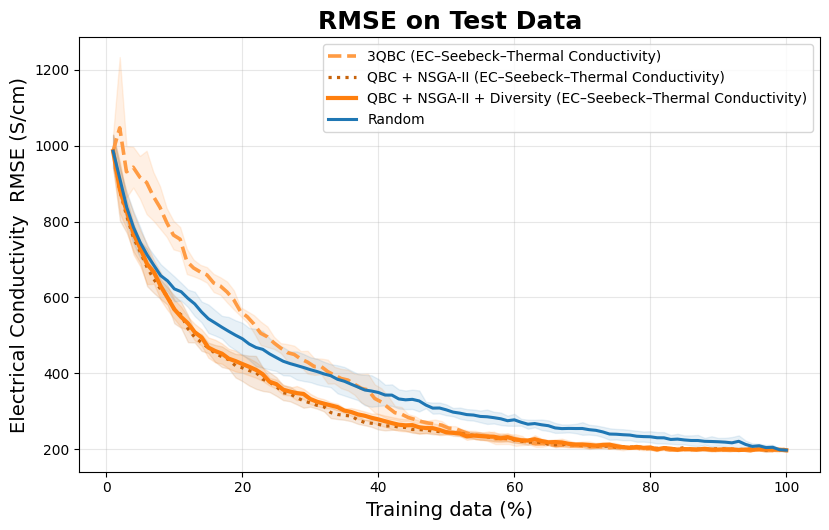

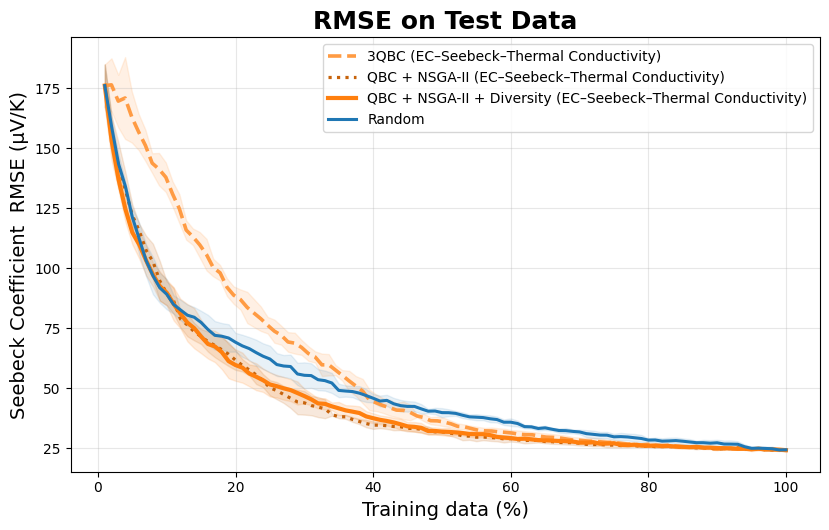

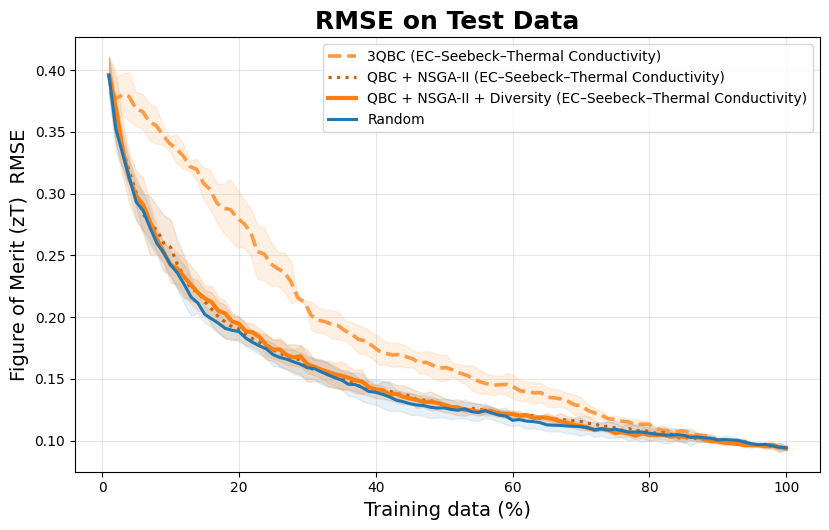

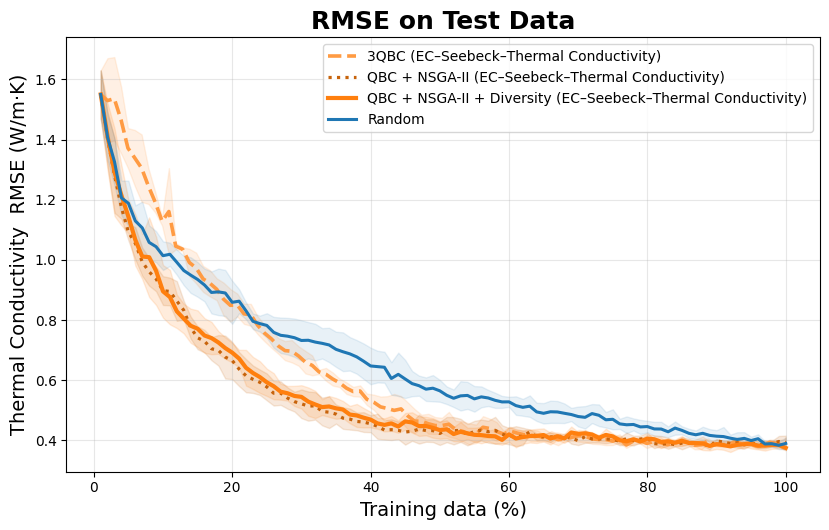

In [13]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import re
import unicodedata


output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\3ObjThermoElec"
os.makedirs(output_dir, exist_ok=True)


def sanitize_filename(s):
    # normalize unicode (— → -)
    s = unicodedata.normalize("NFKD", s)

    # keep only ASCII
    s = s.encode("ascii", "ignore").decode("ascii")

    # replace spaces with underscore
    s = s.replace(" ", "_")

    # remove anything not alphanumeric, underscore, or dash
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)

    # collapse multiple underscores
    s = re.sub(r"_+", "_", s)

    return s.strip("_")


# ============================================================
# Seeds
# ============================================================
seeds = range(5)  # 0..4

# ============================================================
# EXACT roots 
# ============================================================
root_3qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_3QBC\ThermoEl\el_seeb_ThC"
)

root_rand = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_random\ThermoEl\all"
)

root_nsga_qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_3Obj_ThreeTargets_QBC_ONLY\ThermoEl\el_seeb_ThC"
)

root_nsga_qbc_div = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_4Obj_ThreeTargets\ThermoEl\el_seeb_ThC"
)

# ============================================================
# RMSE columns and labels
# ============================================================
rmse_map = {
    "rmse_elec_cond": ("Electrical Conductivity", "RMSE (S/cm)"),
    "rmse_seebeck":   ("Seebeck Coefficient", "RMSE (µV/K)"),
    "rmse_zt":        ("Figure of Merit (zT)", "RMSE"),
    "rmse_k_total":   ("Thermal Conductivity", "RMSE (W/m·K)"),
}

TARGET_LABEL = "EC–Seebeck–Thermal Conductivity"

# ============================================================
# Color helpers (same hue, lighter/darker)
# ============================================================
def blend_with(color, target=(1, 1, 1), amount=0.0):
    """
    amount=0 -> original color
    amount=1 -> fully target color
    """
    c = mcolors.to_rgb(color)
    return tuple((1 - amount) * c[i] + amount * target[i] for i in range(3))

def lighten(color, amount=0.25):
    return blend_with(color, target=(1, 1, 1), amount=amount)

def darken(color, amount=0.25):
    return blend_with(color, target=(0, 0, 0), amount=amount)

# ------------------------------------------------------------
# Base colors
# ------------------------------------------------------------
DIV_COLOR   = "C1"   # ORANGE (matplotlib default cycle)
RAND_COLOR  = "C0"   # BLUE

COLOR_DIV   = DIV_COLOR
COLOR_NS    = darken(DIV_COLOR, 0.22)   # NSGA-II QBC: slightly darker orange
COLOR_3QBC  = lighten(DIV_COLOR, 0.22)  # 3QBC: slightly lighter orange

# ============================================================
# Helpers
# ============================================================
def load_policy(policy_key: str, policy_label: str) -> pd.DataFrame:
    """
    Loads all seeds for a policy. Adds: seed, policy, train_percent.
    If any file is missing, raises FileNotFoundError with helpful info.
    """
    dfs = []
    attempted = []
    missing = []

    for seed in seeds:
        if policy_key == "3qbc":
            path = os.path.join(
                root_3qbc, str(seed),
                f"ThermoEl_el_seeb_ThCgrowing_3QBC_rf{seed}.csv"
            )
        elif policy_key == "random":
            path = os.path.join(
                root_rand, str(seed),
                f"ThermoEl_all_random_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc":
            path = os.path.join(
                root_nsga_qbc, str(seed),
                f"ThermoEl_el_seeb_ThCgrowing_EA_3obj_qbc_only_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc_div":
            path = os.path.join(
                root_nsga_qbc_div, str(seed),
                f"ThermoEl_el_seeb_ThCgrowing_EA_3out_div_rf{seed}.csv"
            )
        else:
            raise ValueError(f"Unknown policy_key: {policy_key}")

        attempted.append(path)
        if not os.path.exists(path):
            missing.append(path)
            continue

        df = pd.read_csv(path)
        df["seed"] = seed
        df["policy"] = policy_label
        df["train_percent"] = df["train_ratio"] * 100.0
        dfs.append(df)

    if missing:
        msg = (
            f"Missing {len(missing)} file(s) for policy '{policy_label}'.\n\n"
            "First missing path:\n"
            f"{missing[0]}\n\n"
            "Tip: verify the folder name + filename prefix/suffix.\n"
            "All attempted paths:\n" + "\n".join(attempted)
        )
        raise FileNotFoundError(msg)

    return pd.concat(dfs, ignore_index=True)


def mean_std(df: pd.DataFrame, col: str) -> pd.DataFrame:
    return (
        df.groupby("train_percent")[col]
          .agg(["mean", "std"])
          .reset_index()
          .sort_values("train_percent")
    )

# ============================================================
# Load policies
# ============================================================
data_3qbc = load_policy("3qbc", f"3QBC ({TARGET_LABEL})")
data_nsga = load_policy("nsga_qbc", f"QBC + NSGA-II ({TARGET_LABEL})")
data_div  = load_policy("nsga_qbc_div", f"QBC + NSGA-II + Diversity ({TARGET_LABEL})")
data_rand = load_policy("random", "Random")

# ============================================================
# Plot: 4 RMSE plots, legend shows ONLY mean labels (no std labels)
# Styles:
# - Diversity: orange solid
# - NSGA-II QBC: darker orange dotted
# - 3QBC: lighter orange dashed
# - Random: blue solid
# ============================================================
for rmse_col, (title, ylabel) in rmse_map.items():

    g3 = mean_std(data_3qbc, rmse_col)
    gN = mean_std(data_nsga, rmse_col)
    gD = mean_std(data_div,  rmse_col)
    gR = mean_std(data_rand, rmse_col)

    plt.figure(figsize=(8.4, 5.4))

    # 3QBC — lighter orange, dashed
    plt.plot(
        g3.train_percent, g3["mean"],
        color=COLOR_3QBC, lw=2.6, ls="--",
        label=data_3qbc.policy.iloc[0]
    )
    plt.fill_between(
        g3.train_percent,
        g3["mean"] - g3["std"],
        g3["mean"] + g3["std"],
        color=COLOR_3QBC, alpha=0.14
    )

    # QBC + NSGA-II — darker orange, dotted
    plt.plot(
        gN.train_percent, gN["mean"],
        color=COLOR_NS, lw=2.3, ls=":",
        label=data_nsga.policy.iloc[0]
    )
    plt.fill_between(
        gN.train_percent,
        gN["mean"] - gN["std"],
        gN["mean"] + gN["std"],
        color=COLOR_NS, alpha=0.14
    )

    # QBC + NSGA-II + Diversity — base orange, solid
    plt.plot(
        gD.train_percent, gD["mean"],
        color=COLOR_DIV, lw=3.0, ls="-",
        label=data_div.policy.iloc[0]
    )
    plt.fill_between(
        gD.train_percent,
        gD["mean"] - gD["std"],
        gD["mean"] + gD["std"],
        color=COLOR_DIV, alpha=0.14
    )

    # Random — blue, solid
    plt.plot(
        gR.train_percent, gR["mean"],
        color=RAND_COLOR, lw=2.2, ls="-",
        label="Random"
    )
    plt.fill_between(
        gR.train_percent,
        gR["mean"] - gR["std"],
        gR["mean"] + gR["std"],
        color=RAND_COLOR, alpha=0.10
    )

    plt.xlabel("Training data (%)", fontsize=14)
    plt.ylabel(title + "  "+ylabel, fontsize=14)
    plt.title("RMSE on Test Data", fontsize=18,fontweight="bold")
    plt.grid(alpha=0.3)
    plt.legend(frameon=True,fontsize=14)
    plt.grid(alpha=0.3)
    plt.legend(frameon=True)
    plt.tight_layout()
    safe_title = sanitize_filename(title+TARGET_LABEL)
    filename = f"{safe_title}.png"
    save_path = os.path.join(output_dir, filename)
    plt.savefig(save_path, dpi=150, bbox_inches="tight", pad_inches=0.02)

    plt.show()
    plt.close()


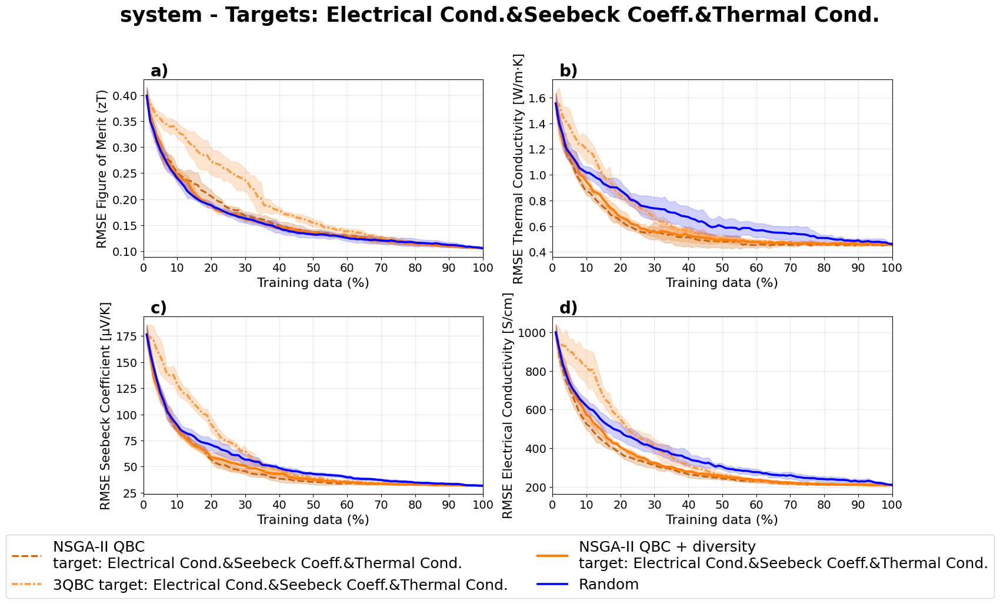

In [18]:
import os
import re
import unicodedata

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ============================================================
# Output directory
# ============================================================
output_dir = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\3ObjThermoElec"
)
os.makedirs(output_dir, exist_ok=True)

# ============================================================
# Helper: safe filename
# ============================================================
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

# ============================================================
# Seeds
# ============================================================
seeds = range(5)  # 0..4

# ============================================================
# Exact roots
# ============================================================
root_3qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_3QBC\ThermoEl\el_seeb_ThC"
)

root_rand = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_random\ThermoEl\all"
)

root_nsga_qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_3Obj_ThreeTargets_QBC_ONLY\ThermoEl\el_seeb_ThC"
)

root_nsga_qbc_div = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_4Obj_ThreeTargets\ThermoEl\el_seeb_ThC"
)

# ============================================================
# RMSE columns and labels
# ============================================================
rmse_map = {
    "rmse_zt":        ("Figure of Merit (zT)", ""),
    "rmse_k_total":   ("Thermal Conductivity", "W/m·K"),
    "rmse_seebeck":   ("Seebeck Coefficient", "µV/K"),
    "rmse_elec_cond": ("Electrical Conductivity", "S/cm"),
}

plot_order = [
    "rmse_zt",
    "rmse_k_total",
    "rmse_seebeck",
    "rmse_elec_cond",
]

panel_labels = ["a)", "b)", "c)", "d)"]

TARGET_LABEL = "Electrical Cond.&Seebeck Coeff.&Thermal Cond."

# ============================================================
# Color helpers
# ============================================================
def blend_with(color, target=(1, 1, 1), amount=0.0):
    """
    amount=0 -> original color
    amount=1 -> fully target color
    """
    c = mcolors.to_rgb(color)
    return tuple((1 - amount) * c[i] + amount * target[i] for i in range(3))

def lighten(color, amount=0.25):
    return blend_with(color, target=(1, 1, 1), amount=amount)

def darken(color, amount=0.25):
    return blend_with(color, target=(0, 0, 0), amount=amount)

# ------------------------------------------------------------
# Base colors
# ------------------------------------------------------------
DIV_COLOR = "C1"   # orange
RAND_COLOR = "blue"

COLOR_DIV = DIV_COLOR
COLOR_NS = darken(DIV_COLOR, 0.22)    # darker orange
COLOR_3QBC = lighten(DIV_COLOR, 0.22) # lighter orange

# ============================================================
# Plot style controls
# ============================================================
FIGSIZE = (14, 10)
SUPTITLE_FONTSIZE = 25
AXIS_LABEL_FONTSIZE = 16
YLABEL_FONTSIZE = 15.5
TICK_LABEL_FONTSIZE = 14
PANEL_LABEL_FONTSIZE = 20
LEGEND_FONTSIZE = 18

# ============================================================
# Helpers
# ============================================================
def load_policy(policy_key: str, policy_label: str) -> pd.DataFrame:
    """
    Loads all seeds for a policy.
    Adds columns: seed, policy, train_pct.
    """
    dfs = []
    attempted = []
    missing = []

    for seed in seeds:
        if policy_key == "3qbc":
            path = os.path.join(
                root_3qbc, str(seed),
                f"ThermoEl_el_seeb_ThCgrowing_3QBC_rf{seed}.csv"
            )
        elif policy_key == "random":
            path = os.path.join(
                root_rand, str(seed),
                f"ThermoEl_all_random_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc":
            path = os.path.join(
                root_nsga_qbc, str(seed),
                f"ThermoEl_el_seeb_ThCgrowing_EA_3obj_qbc_only_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc_div":
            path = os.path.join(
                root_nsga_qbc_div, str(seed),
                f"ThermoEl_el_seeb_ThCgrowing_EA_3out_div_rf{seed}.csv"
            )
        else:
            raise ValueError(f"Unknown policy_key: {policy_key}")

        attempted.append(path)

        if not os.path.exists(path):
            missing.append(path)
            continue

        df = pd.read_csv(path)

        if "train_ratio" not in df.columns:
            raise ValueError(f"'train_ratio' not found in: {path}")

        df["seed"] = seed
        df["policy"] = policy_label
        df["train_pct"] = df["train_ratio"] * 100.0   # raw x-axis, NO transform
        dfs.append(df)

    if missing:
        msg = (
            f"Missing {len(missing)} file(s) for policy '{policy_label}'.\n\n"
            f"First missing path:\n{missing[0]}\n\n"
            "All attempted paths:\n" + "\n".join(attempted)
        )
        raise FileNotFoundError(msg)

    return pd.concat(dfs, ignore_index=True)

def mean_std(df: pd.DataFrame, col: str) -> pd.DataFrame:
    return (
        df.groupby("train_pct")[col]
          .agg(["mean", "std"])
          .reset_index()
          .sort_values("train_pct")
    )

# ============================================================
# Load all policies
# ============================================================
data_3qbc = load_policy(
    "3qbc",
    f"3QBC target: {TARGET_LABEL}"
)

data_nsga = load_policy(
    "nsga_qbc",
    f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
)

data_div = load_policy(
    "nsga_qbc_div",
    f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
)

data_rand = load_policy(
    "random",
    "Random"
)

policy_order = [
    ("nsga_qbc", data_nsga),
    ("3qbc", data_3qbc),
    ("nsga_qbc_div", data_div),
    ("random", data_rand),
]

# ============================================================
# One single 2x2 figure with all RMSE plots
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=FIGSIZE)
axes = axes.flatten()

fig.suptitle(
    f"system - Targets: {TARGET_LABEL}",
    fontsize=SUPTITLE_FONTSIZE,
    fontweight="bold",
    y=0.98
)

fig.subplots_adjust(wspace=0.35)

for ax, rmse_col, panel_label in zip(axes, plot_order, panel_labels):
    title, unit = rmse_map[rmse_col]

    g3 = mean_std(data_3qbc, rmse_col)
    gN = mean_std(data_nsga, rmse_col)
    gD = mean_std(data_div, rmse_col)
    gR = mean_std(data_rand, rmse_col)

    grouped_data = {
        "3qbc": g3,
        "nsga_qbc": gN,
        "nsga_qbc_div": gD,
        "random": gR,
    }

    for policy_key, dfp in policy_order:
        sub = grouped_data[policy_key]

        if sub.empty:
            continue

        x = sub["train_pct"].to_numpy()
        y_mean = sub["mean"].to_numpy()
        y_std = sub["std"].to_numpy()

        if policy_key == "nsga_qbc":
            color = COLOR_NS
            linestyle = "--"
            linewidth = 2.2
            label = f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "3qbc":
            color = COLOR_3QBC
            linestyle = (0, (3, 1, 1, 1))
            linewidth = 2.6
            label = f"3QBC target: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "nsga_qbc_div":
            color = COLOR_DIV
            linestyle = "-"
            linewidth = 3.0
            label = f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        else:  # random
            color = RAND_COLOR
            linestyle = "-"
            linewidth = 2.6
            label = "Random"
            fill_alpha = 0.18

        ax.plot(
            x, y_mean,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=label
        )

        ax.fill_between(
            x,
            y_mean - y_std,
            y_mean + y_std,
            color=color,
            alpha=fill_alpha
        )

    # X axis: raw values, no transformation
    ax.set_xlabel("Training data (%)", fontsize=AXIS_LABEL_FONTSIZE)

    if unit == "":
        ylabel = f"RMSE {title}"
    else:
        ylabel = f"RMSE {title} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=YLABEL_FONTSIZE)
    ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
    ax.grid(alpha=0.3)

    # fixed x ticks
    ax.set_xticks(np.arange(0, 101, 10))
    ax.set_xlim(0, 100)

    # panel letters
    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=PANEL_LABEL_FONTSIZE,
        fontweight="bold",
        va="top",
        ha="left"
    )

# ============================================================
# Common legend below all plots
# ============================================================
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.04),
    ncol=2,
    fontsize=LEGEND_FONTSIZE,
    frameon=True
)

plt.tight_layout(rect=[0, 0.08, 1, 0.95])

filename = f"{sanitize_filename(TARGET_LABEL)}_RMSE_all_4plots.png"
save_path = os.path.join(output_dir, filename)

plt.savefig(save_path, dpi=150, bbox_inches="tight")
plt.show()
plt.close()

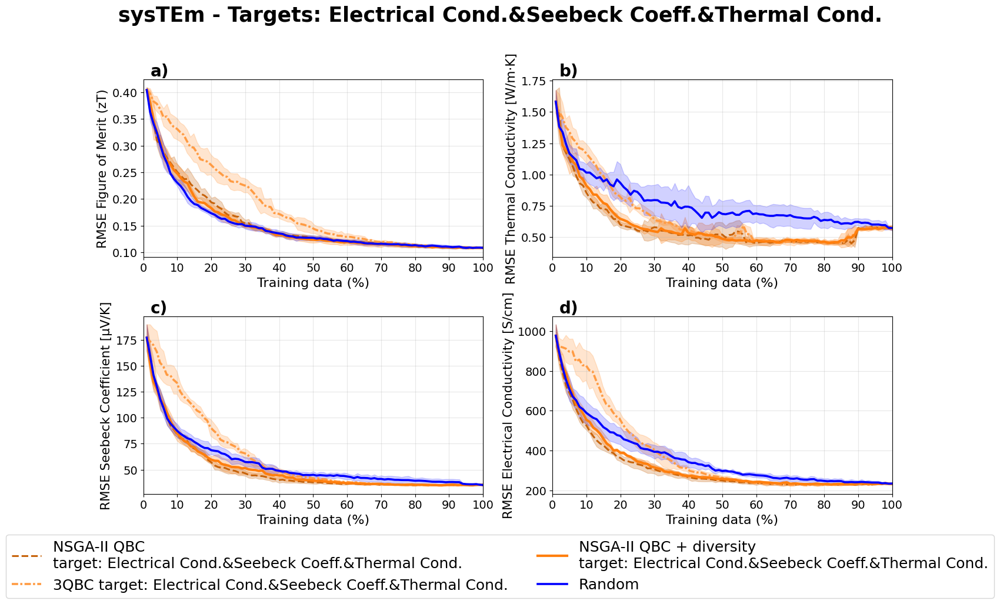

In [ ]:
#----------------------------------------------XGBOOST--------------------------------------------------

import os
import re
import unicodedata

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ============================================================
# Output directory
# ============================================================
output_dir = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\3ObjThermoElec_XGBoost"
)
os.makedirs(output_dir, exist_ok=True)

# ============================================================
# Helper: safe filename
# ============================================================
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

# ============================================================
# Seeds
# ============================================================
seeds = range(5)  # 0..4

# ============================================================
# Exact roots
# ============================================================
root_3qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_3QBC\ThermoEl\el_seeb_ThC"
)

root_rand = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_random\ThermoEl\all"
)

root_nsga_qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_3Obj_ThreeTargets_QBC_ONLY\ThermoEl\el_seeb_ThC"
)

root_nsga_qbc_div = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_4Obj_ThreeTargets\ThermoEl\el_seeb_ThC"
)

# ============================================================
# RMSE columns and labels
# ============================================================
rmse_map = {
    "rmse_zt":        ("Figure of Merit (zT)", ""),
    "rmse_k_total":   ("Thermal Conductivity", "W/m·K"),
    "rmse_seebeck":   ("Seebeck Coefficient", "µV/K"),
    "rmse_elec_cond": ("Electrical Conductivity", "S/cm"),
}

plot_order = [
    "rmse_zt",
    "rmse_k_total",
    "rmse_seebeck",
    "rmse_elec_cond",
]

panel_labels = ["a)", "b)", "c)", "d)"]

TARGET_LABEL = "Electrical Cond.&Seebeck Coeff.&Thermal Cond."

# ============================================================
# Color helpers
# ============================================================
def blend_with(color, target=(1, 1, 1), amount=0.0):
    c = mcolors.to_rgb(color)
    return tuple((1 - amount) * c[i] + amount * target[i] for i in range(3))

def lighten(color, amount=0.25):
    return blend_with(color, target=(1, 1, 1), amount=amount)

def darken(color, amount=0.25):
    return blend_with(color, target=(0, 0, 0), amount=amount)

# ------------------------------------------------------------
# Base colors
# ------------------------------------------------------------
DIV_COLOR = "C1"
RAND_COLOR = "blue"

COLOR_DIV = DIV_COLOR
COLOR_NS = darken(DIV_COLOR, 0.22)
COLOR_3QBC = lighten(DIV_COLOR, 0.22)

# ============================================================
# Plot style controls
# ============================================================
FIGSIZE = (14, 10)
SUPTITLE_FONTSIZE = 25
AXIS_LABEL_FONTSIZE = 16
YLABEL_FONTSIZE = 15.5
TICK_LABEL_FONTSIZE = 14
PANEL_LABEL_FONTSIZE = 20
LEGEND_FONTSIZE = 18

# ============================================================
# Helpers
# ============================================================
def load_policy(policy_key: str, policy_label: str) -> pd.DataFrame:
    dfs = []
    attempted = []
    missing = []

    for seed in seeds:
        if policy_key == "3qbc":
            path = os.path.join(
                root_3qbc, str(seed),
                f"ThermoEl_el_seeb_ThCgrowing_3QBC_xgb{seed}.csv"
            )
        elif policy_key == "random":
            path = os.path.join(
                root_rand, str(seed),
                f"ThermoEl_all_random_xgb{seed}.csv"
            )
        elif policy_key == "nsga_qbc":
            path = os.path.join(
                root_nsga_qbc, str(seed),
                f"ThermoEl_el_seeb_ThCgrowing_EA_3obj_qbc_only_xgb{seed}.csv"
            )
        elif policy_key == "nsga_qbc_div":
            path = os.path.join(
                root_nsga_qbc_div, str(seed),
                f"ThermoEl_el_seeb_ThCgrowing_EA_3out_div_xgb{seed}.csv"
            )
        else:
            raise ValueError(f"Unknown policy_key: {policy_key}")

        attempted.append(path)

        if not os.path.exists(path):
            missing.append(path)
            continue

        df = pd.read_csv(path)

        if "train_ratio" not in df.columns:
            raise ValueError(f"'train_ratio' not found in: {path}")

        df["seed"] = seed
        df["policy"] = policy_label
        df["train_pct"] = df["train_ratio"] * 100.0
        dfs.append(df)

    if missing:
        msg = (
            f"Missing {len(missing)} file(s) for policy '{policy_label}'.\n\n"
            f"First missing path:\n{missing[0]}\n\n"
            "All attempted paths:\n" + "\n".join(attempted)
        )
        raise FileNotFoundError(msg)

    return pd.concat(dfs, ignore_index=True)

def mean_std(df: pd.DataFrame, col: str) -> pd.DataFrame:
    grouped = (
        df.groupby(["seed", "train_pct"])[col]
          .mean()
          .reset_index()
    )

    return (
        grouped.groupby("train_pct")[col]
          .agg(["mean", "std"])
          .reset_index()
          .sort_values("train_pct")
    )

# ============================================================
# Load all policies
# ============================================================
data_3qbc = load_policy(
    "3qbc",
    f"3QBC target: {TARGET_LABEL}"
)

data_nsga = load_policy(
    "nsga_qbc",
    f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
)

data_div = load_policy(
    "nsga_qbc_div",
    f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
)

data_rand = load_policy(
    "random",
    "Random"
)

policy_order = [
    ("nsga_qbc", data_nsga),
    ("3qbc", data_3qbc),
    ("nsga_qbc_div", data_div),
    ("random", data_rand),
]

# ============================================================
# One single 2x2 figure with all RMSE plots
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=FIGSIZE)
axes = axes.flatten()

fig.suptitle(
    f"sysTEm - Targets: {TARGET_LABEL}",
    fontsize=SUPTITLE_FONTSIZE,
    fontweight="bold",
    y=0.98
)

fig.subplots_adjust(wspace=0.35)

for ax, rmse_col, panel_label in zip(axes, plot_order, panel_labels):
    title, unit = rmse_map[rmse_col]

    g3 = mean_std(data_3qbc, rmse_col)
    gN = mean_std(data_nsga, rmse_col)
    gD = mean_std(data_div, rmse_col)
    gR = mean_std(data_rand, rmse_col)

    grouped_data = {
        "3qbc": g3,
        "nsga_qbc": gN,
        "nsga_qbc_div": gD,
        "random": gR,
    }

    for policy_key, dfp in policy_order:
        sub = grouped_data[policy_key]

        if sub.empty:
            continue

        x = sub["train_pct"].to_numpy()
        y_mean = sub["mean"].to_numpy()
        y_std = sub["std"].to_numpy()

        if policy_key == "nsga_qbc":
            color = COLOR_NS
            linestyle = "--"
            linewidth = 2.2
            label = f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "3qbc":
            color = COLOR_3QBC
            linestyle = (0, (3, 1, 1, 1))
            linewidth = 2.6
            label = f"3QBC target: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "nsga_qbc_div":
            color = COLOR_DIV
            linestyle = "-"
            linewidth = 3.0
            label = f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        else:
            color = RAND_COLOR
            linestyle = "-"
            linewidth = 2.6
            label = "Random"
            fill_alpha = 0.18

        ax.plot(
            x, y_mean,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=label
        )

        ax.fill_between(
            x,
            y_mean - y_std,
            y_mean + y_std,
            color=color,
            alpha=fill_alpha
        )

    ax.set_xlabel("Training data (%)", fontsize=AXIS_LABEL_FONTSIZE)

    ylabel = f"RMSE {title}" if unit == "" else f"RMSE {title} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=YLABEL_FONTSIZE)
    ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
    ax.grid(alpha=0.3)

    ax.set_xticks(np.arange(0, 101, 10))
    ax.set_xlim(0, 100)

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=PANEL_LABEL_FONTSIZE,
        fontweight="bold",
        va="top",
        ha="left"
    )

# ============================================================
# Common legend below all plots
# ============================================================
handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.04),
    ncol=2,
    fontsize=LEGEND_FONTSIZE,
    frameon=True
)

plt.tight_layout(rect=[0, 0.08, 1, 0.95])

filename = f"{sanitize_filename(TARGET_LABEL)}_RMSE_all_4plots_XGBoost.png"
save_path = os.path.join(output_dir, filename)

plt.savefig(save_path, dpi=150, bbox_inches="tight")
plt.show()
plt.close()

## Electrical Conductivity, Seebeck Coefficient and zT


target: Electrical Cond.&Seebeck Coeff.&zT'.
  Missing: C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_4Obj_ThreeTargets\ThermoEl\el_seeb_zT\1\ThermoEl_el_seeb_zTgrowing_EA_3out_div_rf1.csv


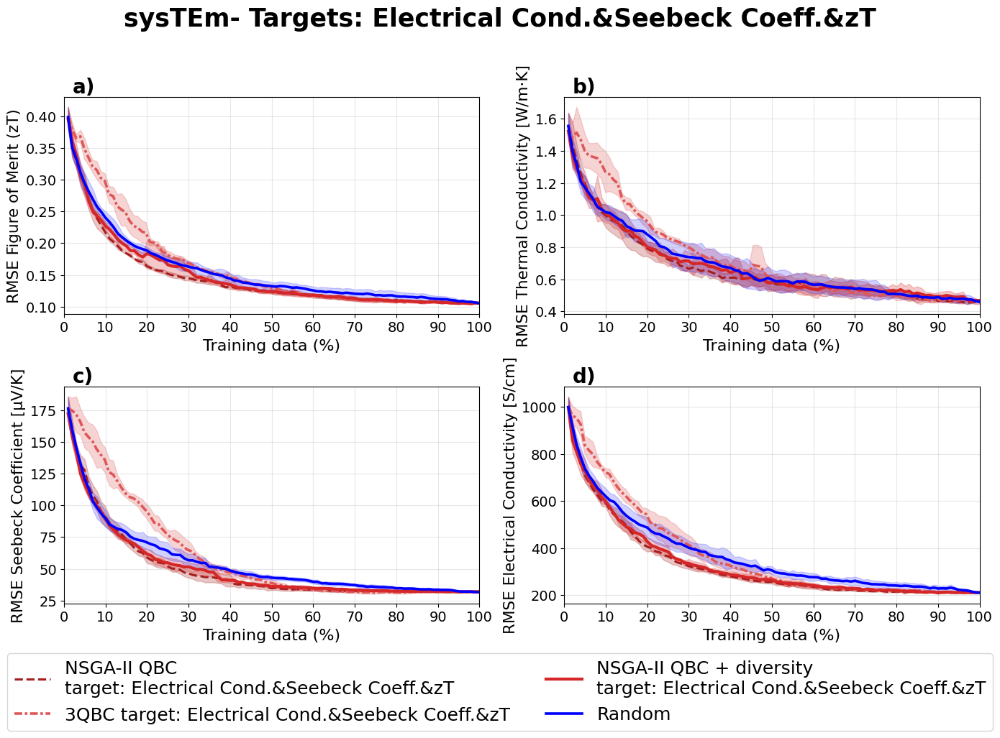

In [21]:
import os
import re
import unicodedata

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ============================================================
# Output directory
# ============================================================
output_dir = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\3ObjThermoElec"
)
os.makedirs(output_dir, exist_ok=True)

# ============================================================
# Helper: safe filename
# ============================================================
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

# ============================================================
# Seeds
# ============================================================
seeds = range(5)  # 0..4

# ============================================================
# Exact roots
# ============================================================
root_3qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_3QBC\ThermoEl\el_seeb_zT"
)

root_rand = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_random\ThermoEl\all"
)

root_nsga_qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_3Obj_ThreeTargets_QBC_ONLY\ThermoEl\el_seeb_zT"
)

root_nsga_qbc_div = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_4Obj_ThreeTargets\ThermoEl\el_seeb_zT"
)

# ============================================================
# RMSE columns and labels
# Same style/order as first code
# ============================================================
rmse_map = {
    "rmse_zt":        ("Figure of Merit (zT)", ""),
    "rmse_k_total":   ("Thermal Conductivity", "W/m·K"),
    "rmse_seebeck":   ("Seebeck Coefficient", "µV/K"),
    "rmse_elec_cond": ("Electrical Conductivity", "S/cm"),
}

plot_order = [
    "rmse_zt",
    "rmse_k_total",
    "rmse_seebeck",
    "rmse_elec_cond",
]

panel_labels = ["a)", "b)", "c)", "d)"]

TARGET_LABEL = "Electrical Cond.&Seebeck Coeff.&zT"

# ============================================================
# Color helpers
# ============================================================
def blend_with(color, target=(1, 1, 1), amount=0.0):
    """
    amount=0 -> original color
    amount=1 -> fully target color
    """
    c = mcolors.to_rgb(color)
    return tuple((1 - amount) * c[i] + amount * target[i] for i in range(3))

def lighten(color, amount=0.25):
    return blend_with(color, target=(1, 1, 1), amount=amount)

def darken(color, amount=0.25):
    return blend_with(color, target=(0, 0, 0), amount=amount)

# ------------------------------------------------------------
# Base colors
# Same logic as first code
# ------------------------------------------------------------
DIV_COLOR = "C3"   # red
RAND_COLOR = "blue"

COLOR_DIV = DIV_COLOR
COLOR_NS = darken(DIV_COLOR, 0.22)    # darker red
COLOR_3QBC = lighten(DIV_COLOR, 0.22) # lighter red

# ============================================================
# Plot style controls
# Same font structure as first code
# ============================================================
FIGSIZE = (14, 10)
SUPTITLE_FONTSIZE = 25
AXIS_LABEL_FONTSIZE = 16
YLABEL_FONTSIZE = 15.5
TICK_LABEL_FONTSIZE = 14
PANEL_LABEL_FONTSIZE = 20
LEGEND_FONTSIZE = 18

# ============================================================
# Helpers
# ============================================================
def load_policy(policy_key: str, policy_label: str) -> pd.DataFrame:
    """
    Loads all available seeds for a policy.
    Adds columns: seed, policy, train_pct.
    Skips missing files and prints a warning.
    """
    dfs = []
    attempted = []
    missing = []

    for seed in seeds:
        if policy_key == "3qbc":
            path = os.path.join(
                root_3qbc, str(seed),
                f"ThermoEl_el_seeb_zTgrowing_3QBC_rf{seed}.csv"
            )
        elif policy_key == "random":
            path = os.path.join(
                root_rand, str(seed),
                f"ThermoEl_all_random_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc":
            path = os.path.join(
                root_nsga_qbc, str(seed),
                f"ThermoEl_el_seeb_zTgrowing_EA_3obj_qbc_only_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc_div":
            path = os.path.join(
                root_nsga_qbc_div, str(seed),
                f"ThermoEl_el_seeb_zTgrowing_EA_3out_div_rf{seed}.csv"
            )
        else:
            raise ValueError(f"Unknown policy_key: {policy_key}")

        attempted.append(path)

        if not os.path.exists(path):
            missing.append(path)
            continue

        df = pd.read_csv(path)

        if "train_ratio" not in df.columns:
            raise ValueError(f"'train_ratio' not found in: {path}")

        df["seed"] = seed
        df["policy"] = policy_label
        df["train_pct"] = df["train_ratio"] * 100.0
        dfs.append(df)

    if missing:
        print(f"\nWarning: {len(missing)} missing file(s) for policy '{policy_label}'.")
        for m in missing:
            print("  Missing:", m)

    if not dfs:
        raise FileNotFoundError(
            f"No files were found for policy '{policy_label}'.\n"
            "Attempted paths:\n" + "\n".join(attempted)
        )

    return pd.concat(dfs, ignore_index=True)

def mean_std(df: pd.DataFrame, col: str) -> pd.DataFrame:
    return (
        df.groupby("train_pct")[col]
          .agg(["mean", "std"])
          .reset_index()
          .sort_values("train_pct")
    )

# ============================================================
# Load all policies
# ============================================================
data_3qbc = load_policy(
    "3qbc",
    f"3QBC target: {TARGET_LABEL}"
)

data_nsga = load_policy(
    "nsga_qbc",
    f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
)

data_div = load_policy(
    "nsga_qbc_div",
    f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
)

data_rand = load_policy(
    "random",
    "Random"
)

policy_order = [
    ("nsga_qbc", data_nsga),
    ("3qbc", data_3qbc),
    ("nsga_qbc_div", data_div),
    ("random", data_rand),
]

# ============================================================
# One single 2x2 figure with all RMSE plots
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=FIGSIZE)
axes = axes.flatten()

fig.suptitle(
    f"sysTEm- Targets: {TARGET_LABEL}",
    fontsize=SUPTITLE_FONTSIZE,
    fontweight="bold",
    y=0.98
)

fig.subplots_adjust(wspace=0.35)

for ax, rmse_col, panel_label in zip(axes, plot_order, panel_labels):
    title, unit = rmse_map[rmse_col]

    g3 = mean_std(data_3qbc, rmse_col)
    gN = mean_std(data_nsga, rmse_col)
    gD = mean_std(data_div, rmse_col)
    gR = mean_std(data_rand, rmse_col)

    grouped_data = {
        "3qbc": g3,
        "nsga_qbc": gN,
        "nsga_qbc_div": gD,
        "random": gR,
    }

    for policy_key, dfp in policy_order:
        sub = grouped_data[policy_key]

        if sub.empty:
            continue

        x = sub["train_pct"].to_numpy()
        y_mean = sub["mean"].to_numpy()
        y_std = sub["std"].to_numpy()

        if policy_key == "nsga_qbc":
            color = COLOR_NS
            linestyle = "--"
            linewidth = 2.2
            label = f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "3qbc":
            color = COLOR_3QBC
            linestyle = (0, (3, 1, 1, 1))
            linewidth = 2.6
            label = f"3QBC target: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "nsga_qbc_div":
            color = COLOR_DIV
            linestyle = "-"
            linewidth = 3.0
            label = f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        else:  # random
            color = RAND_COLOR
            linestyle = "-"
            linewidth = 2.6
            label = "Random"
            fill_alpha = 0.18

        ax.plot(
            x, y_mean,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=label
        )

        ax.fill_between(
            x,
            y_mean - y_std,
            y_mean + y_std,
            color=color,
            alpha=fill_alpha
        )

    # X axis: raw values, no transformation
    ax.set_xlabel("Training data (%)", fontsize=AXIS_LABEL_FONTSIZE)

    if unit == "":
        ylabel = f"RMSE {title}"
    else:
        ylabel = f"RMSE {title} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=YLABEL_FONTSIZE)
    ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
    ax.grid(alpha=0.3)

    # fixed x ticks
    ax.set_xticks(np.arange(0, 101, 10))
    ax.set_xlim(0, 100)

    # panel letters
    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=PANEL_LABEL_FONTSIZE,
        fontweight="bold",
        va="top",
        ha="left"
    )

# ============================================================
# Common legend below all plots
# ============================================================
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.04),
    ncol=2,
    fontsize=LEGEND_FONTSIZE,
    frameon=True
)

plt.tight_layout(rect=[0, 0.08, 1, 0.95])

filename = f"{sanitize_filename(TARGET_LABEL)}_RMSE_all_4plots.png"
save_path = os.path.join(output_dir, filename)

plt.savefig(save_path, dpi=150, bbox_inches="tight")
plt.show()
plt.close()


target: Electrical Cond.&Seebeck Coeff.&zT'.
  Missing: C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_4Obj_ThreeTargets\ThermoEl\el_seeb_zT\1\ThermoEl_el_seeb_zTgrowing_EA_3out_div_xgb1.csv


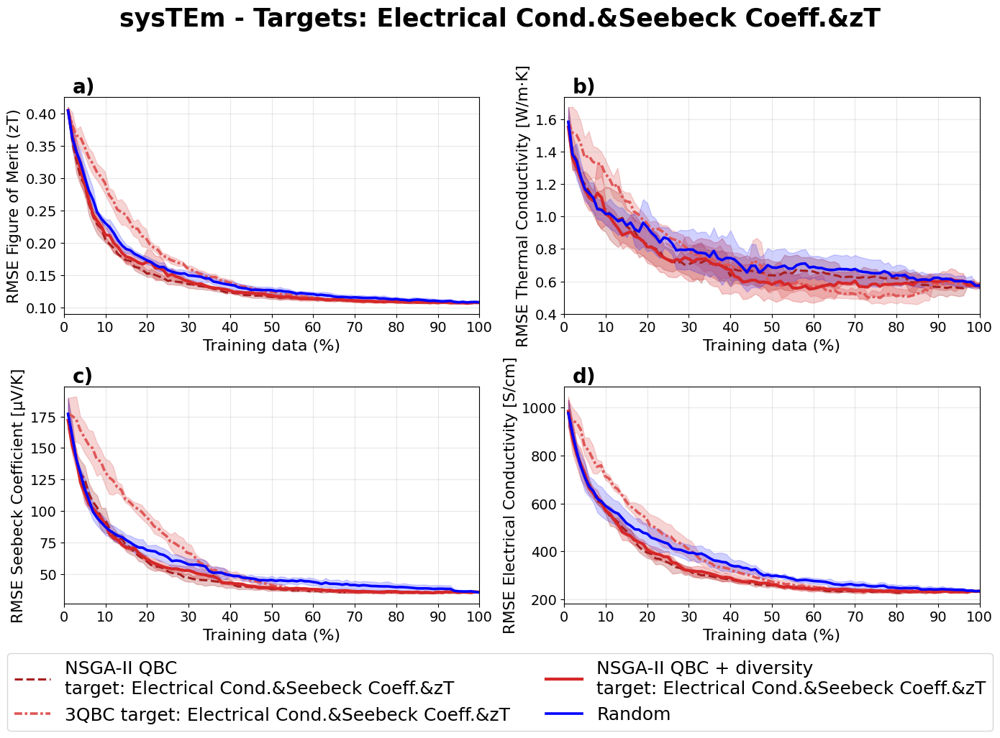

In [20]:
import os
import re
import unicodedata

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ============================================================
# Output directory
# ============================================================
output_dir = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\3ObjThermoElec_XGBoost"
)
os.makedirs(output_dir, exist_ok=True)

# ============================================================
# Helper: safe filename
# ============================================================
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

# ============================================================
# Seeds
# ============================================================
seeds = range(5)  # 0..4

# ============================================================
# Exact roots
# ============================================================
root_3qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_3QBC\ThermoEl\el_seeb_zT"
)

root_rand = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_random\ThermoEl\all"
)

root_nsga_qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_3Obj_ThreeTargets_QBC_ONLY\ThermoEl\el_seeb_zT"
)

root_nsga_qbc_div = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_4Obj_ThreeTargets\ThermoEl\el_seeb_zT"
)

# ============================================================
# RMSE columns and labels
# ============================================================
rmse_map = {
    "rmse_zt":        ("Figure of Merit (zT)", ""),
    "rmse_k_total":   ("Thermal Conductivity", "W/m·K"),
    "rmse_seebeck":   ("Seebeck Coefficient", "µV/K"),
    "rmse_elec_cond": ("Electrical Conductivity", "S/cm"),
}

plot_order = [
    "rmse_zt",
    "rmse_k_total",
    "rmse_seebeck",
    "rmse_elec_cond",
]

panel_labels = ["a)", "b)", "c)", "d)"]

TARGET_LABEL = "Electrical Cond.&Seebeck Coeff.&zT"

# ============================================================
# Color helpers
# ============================================================
def blend_with(color, target=(1, 1, 1), amount=0.0):
    c = mcolors.to_rgb(color)
    return tuple((1 - amount) * c[i] + amount * target[i] for i in range(3))

def lighten(color, amount=0.25):
    return blend_with(color, target=(1, 1, 1), amount=amount)

def darken(color, amount=0.25):
    return blend_with(color, target=(0, 0, 0), amount=amount)

# ------------------------------------------------------------
# Base colors
# ------------------------------------------------------------
DIV_COLOR = "C3"
RAND_COLOR = "blue"

COLOR_DIV = DIV_COLOR
COLOR_NS = darken(DIV_COLOR, 0.22)
COLOR_3QBC = lighten(DIV_COLOR, 0.22)

# ============================================================
# Plot style controls
# ============================================================
FIGSIZE = (14, 10)
SUPTITLE_FONTSIZE = 25
AXIS_LABEL_FONTSIZE = 16
YLABEL_FONTSIZE = 15.5
TICK_LABEL_FONTSIZE = 14
PANEL_LABEL_FONTSIZE = 20
LEGEND_FONTSIZE = 18

# ============================================================
# Helpers
# ============================================================
def load_policy(policy_key: str, policy_label: str) -> pd.DataFrame:
    dfs = []
    attempted = []
    missing = []

    for seed in seeds:
        if policy_key == "3qbc":
            path = os.path.join(
                root_3qbc, str(seed),
                f"ThermoEl_el_seeb_zTgrowing_3QBC_xgb{seed}.csv"
            )
        elif policy_key == "random":
            path = os.path.join(
                root_rand, str(seed),
                f"ThermoEl_all_random_xgb{seed}.csv"
            )
        elif policy_key == "nsga_qbc":
            path = os.path.join(
                root_nsga_qbc, str(seed),
                f"ThermoEl_el_seeb_zTgrowing_EA_3obj_qbc_only_xgb{seed}.csv"
            )
        elif policy_key == "nsga_qbc_div":
            path = os.path.join(
                root_nsga_qbc_div, str(seed),
                f"ThermoEl_el_seeb_zTgrowing_EA_3out_div_xgb{seed}.csv"
            )
        else:
            raise ValueError(f"Unknown policy_key: {policy_key}")

        attempted.append(path)

        if not os.path.exists(path):
            missing.append(path)
            continue

        df = pd.read_csv(path)

        if "train_ratio" not in df.columns:
            raise ValueError(f"'train_ratio' not found in: {path}")

        df["seed"] = seed
        df["policy"] = policy_label
        df["train_pct"] = df["train_ratio"] * 100.0
        dfs.append(df)

    if missing:
        print(f"\nWarning: {len(missing)} missing file(s) for policy '{policy_label}'.")
        for m in missing:
            print("  Missing:", m)

    if not dfs:
        raise FileNotFoundError(
            f"No files were found for policy '{policy_label}'.\n"
            "Attempted paths:\n" + "\n".join(attempted)
        )

    return pd.concat(dfs, ignore_index=True)

def mean_std(df: pd.DataFrame, col: str) -> pd.DataFrame:
    grouped = (
        df.groupby(["seed", "train_pct"])[col]
          .mean()
          .reset_index()
    )

    return (
        grouped.groupby("train_pct")[col]
          .agg(["mean", "std"])
          .reset_index()
          .sort_values("train_pct")
    )

# ============================================================
# Load all policies
# ============================================================
data_3qbc = load_policy(
    "3qbc",
    f"3QBC target: {TARGET_LABEL}"
)

data_nsga = load_policy(
    "nsga_qbc",
    f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
)

data_div = load_policy(
    "nsga_qbc_div",
    f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
)

data_rand = load_policy(
    "random",
    "Random"
)

policy_order = [
    ("nsga_qbc", data_nsga),
    ("3qbc", data_3qbc),
    ("nsga_qbc_div", data_div),
    ("random", data_rand),
]

# ============================================================
# One single 2x2 figure with all RMSE plots
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=FIGSIZE)
axes = axes.flatten()

fig.suptitle(
    f"sysTEm - Targets: {TARGET_LABEL}",
    fontsize=SUPTITLE_FONTSIZE,
    fontweight="bold",
    y=0.98
)

fig.subplots_adjust(wspace=0.35)

for ax, rmse_col, panel_label in zip(axes, plot_order, panel_labels):
    title, unit = rmse_map[rmse_col]

    g3 = mean_std(data_3qbc, rmse_col)
    gN = mean_std(data_nsga, rmse_col)
    gD = mean_std(data_div, rmse_col)
    gR = mean_std(data_rand, rmse_col)

    grouped_data = {
        "3qbc": g3,
        "nsga_qbc": gN,
        "nsga_qbc_div": gD,
        "random": gR,
    }

    for policy_key, dfp in policy_order:
        sub = grouped_data[policy_key]

        if sub.empty:
            continue

        x = sub["train_pct"].to_numpy()
        y_mean = sub["mean"].to_numpy()
        y_std = sub["std"].to_numpy()

        if policy_key == "nsga_qbc":
            color = COLOR_NS
            linestyle = "--"
            linewidth = 2.2
            label = f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "3qbc":
            color = COLOR_3QBC
            linestyle = (0, (3, 1, 1, 1))
            linewidth = 2.6
            label = f"3QBC target: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "nsga_qbc_div":
            color = COLOR_DIV
            linestyle = "-"
            linewidth = 3.0
            label = f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        else:
            color = RAND_COLOR
            linestyle = "-"
            linewidth = 2.6
            label = "Random"
            fill_alpha = 0.18

        ax.plot(
            x, y_mean,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=label
        )

        ax.fill_between(
            x,
            y_mean - y_std,
            y_mean + y_std,
            color=color,
            alpha=fill_alpha
        )

    ax.set_xlabel("Training data (%)", fontsize=AXIS_LABEL_FONTSIZE)

    ylabel = f"RMSE {title}" if unit == "" else f"RMSE {title} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=YLABEL_FONTSIZE)
    ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
    ax.grid(alpha=0.3)

    ax.set_xticks(np.arange(0, 101, 10))
    ax.set_xlim(0, 100)

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=PANEL_LABEL_FONTSIZE,
        fontweight="bold",
        va="top",
        ha="left"
    )

handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.04),
    ncol=2,
    fontsize=LEGEND_FONTSIZE,
    frameon=True
)

plt.tight_layout(rect=[0, 0.08, 1, 0.95])

filename = f"{sanitize_filename(TARGET_LABEL)}_RMSE_all_4plots_XGBoost.png"
save_path = os.path.join(output_dir, filename)

plt.savefig(save_path, dpi=150, bbox_inches="tight")
plt.show()
plt.close()

## Electrical Conductivity, zT , Thermal Conductivity

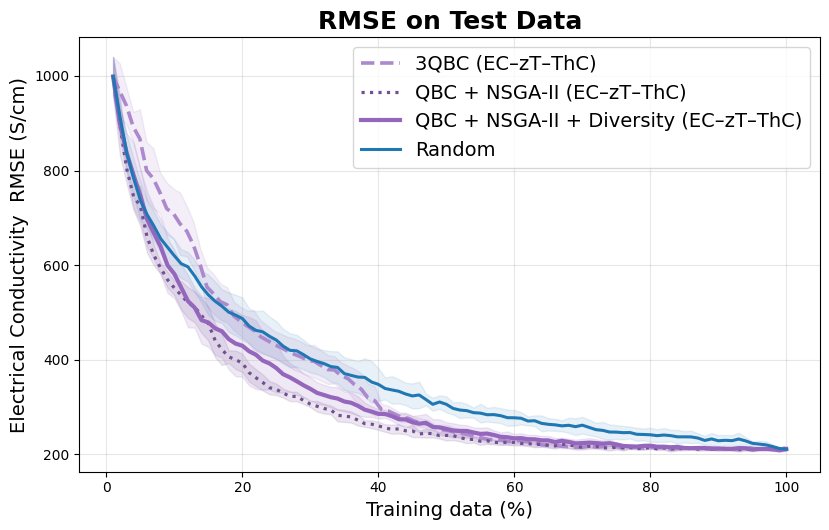

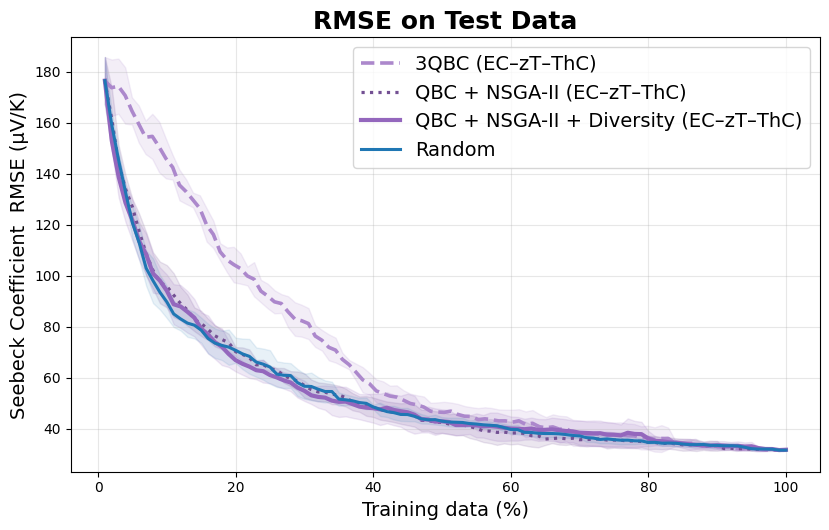

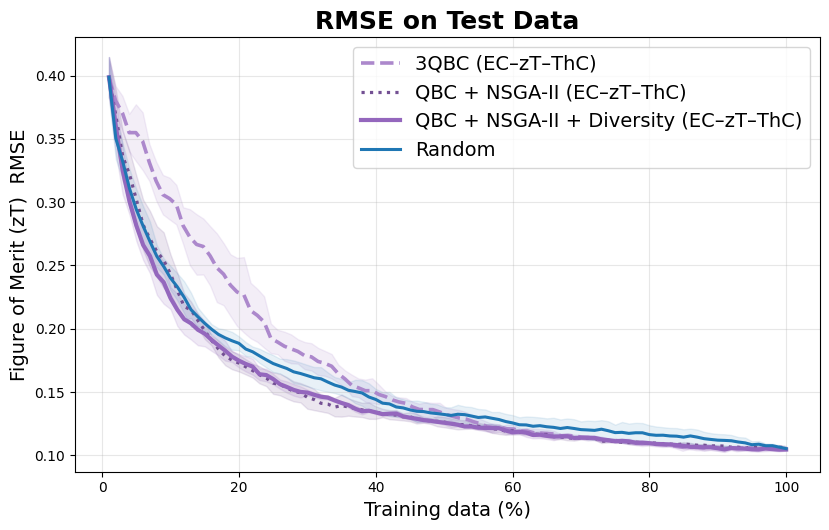

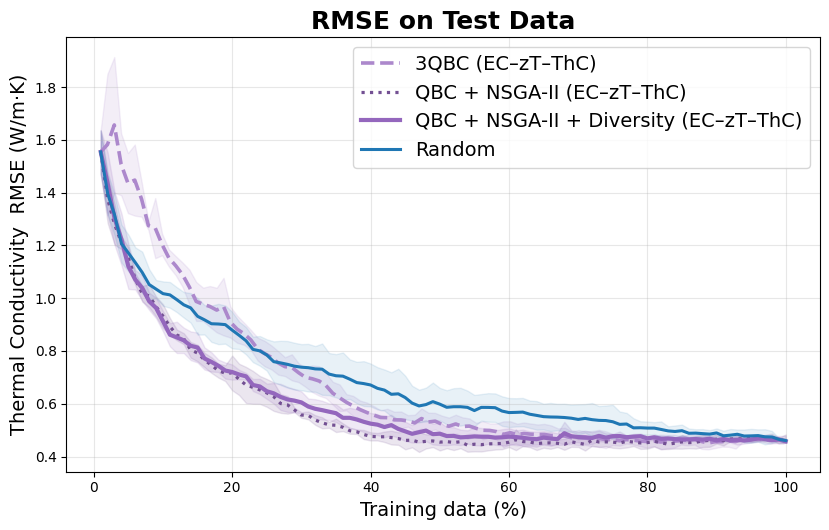

In [23]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


import re
import unicodedata

def sanitize_filename(s):
    # normalize unicode (— → -)
    s = unicodedata.normalize("NFKD", s)

    # keep only ASCII
    s = s.encode("ascii", "ignore").decode("ascii")

    # replace spaces with underscore
    s = s.replace(" ", "_")

    # remove anything not alphanumeric, underscore, or dash
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)

    # collapse multiple underscores
    s = re.sub(r"_+", "_", s)

    return s.strip("_")



   

output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\3ObjThermoElec"
os.makedirs(output_dir, exist_ok=True)

# ============================================================
# Seeds
# ============================================================
seeds = range(5)  # 0..4

# ============================================================
# EXACT roots
# ============================================================



root_3qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_3QBC\ThermoEl\el_zT_ThC"
)

root_rand = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_random\ThermoEl\all"
)

root_nsga_qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_3Obj_ThreeTargets_QBC_ONLY\ThermoEl\el_zT_ThC"
)

root_nsga_qbc_div = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_4Obj_ThreeTargets\ThermoEl\el_zT_ThC"
)

# ============================================================
# RMSE columns and labels
# ============================================================
rmse_map = {
    "rmse_elec_cond": ("Electrical Conductivity", "RMSE (S/cm)"),
    "rmse_seebeck":   ("Seebeck Coefficient", "RMSE (µV/K)"),
    "rmse_zt":        ("Figure of Merit (zT)", "RMSE"),
    "rmse_k_total":   ("Thermal Conductivity", "RMSE (W/m·K)"),
}

TARGET_LABEL = "EC–zT–ThC"

# ============================================================
# Color helpers
# ============================================================
def blend_with(color, target=(1, 1, 1), amount=0.0):
    c = mcolors.to_rgb(color)
    return tuple((1 - amount) * c[i] + amount * target[i] for i in range(3))

def lighten(color, amount=0.25):
    return blend_with(color, target=(1, 1, 1), amount=amount)

def darken(color, amount=0.25):
    return blend_with(color, target=(0, 0, 0), amount=amount)

# ------------------------------------------------------------
# Base colors
# ------------------------------------------------------------
DIV_COLOR   = "C4"   # PURPLE
RAND_COLOR  = "C0"   # BLUE

COLOR_DIV   = DIV_COLOR
COLOR_NS    = darken(DIV_COLOR, 0.22)   # darker purple
COLOR_3QBC  = lighten(DIV_COLOR, 0.22)  # lighter purple

# ============================================================
# Helpers
# ============================================================
def load_policy(policy_key: str, policy_label: str) -> pd.DataFrame:
    dfs = []
    attempted, missing = [], []

    for seed in seeds:
        if policy_key == "3qbc":
            path = os.path.join(
                root_3qbc, str(seed),
                f"ThermoEl_el_zT_ThCgrowing_3QBC_rf{seed}.csv"
            )
        elif policy_key == "random":
            path = os.path.join(
                root_rand, str(seed),
                f"ThermoEl_all_random_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc":
            path = os.path.join(
                root_nsga_qbc, str(seed),
                f"ThermoEl_el_zT_ThCgrowing_EA_3obj_qbc_only_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc_div":
            path = os.path.join(
                root_nsga_qbc_div, str(seed),
                f"ThermoEl_el_zT_ThCgrowing_EA_3out_div_rf{seed}.csv"
            )
        else:
            raise ValueError(f"Unknown policy_key: {policy_key}")

        attempted.append(path)
        if not os.path.exists(path):
            missing.append(path)
            continue

        df = pd.read_csv(path)
        df["seed"] = seed
        df["policy"] = policy_label
        df["train_percent"] = df["train_ratio"] * 100.0
        dfs.append(df)

    if missing:
        raise FileNotFoundError(
            f"Missing {len(missing)} files for {policy_label}\nFirst missing:\n{missing[0]}"
        )

    return pd.concat(dfs, ignore_index=True)


def mean_std(df: pd.DataFrame, col: str) -> pd.DataFrame:
    return (
        df.groupby("train_percent")[col]
          .agg(["mean", "std"])
          .reset_index()
          .sort_values("train_percent")
    )

# ============================================================
# Load policies
# ============================================================
data_3qbc = load_policy("3qbc", f"3QBC ({TARGET_LABEL})")
data_nsga = load_policy("nsga_qbc", f"QBC + NSGA-II ({TARGET_LABEL})")
data_div  = load_policy("nsga_qbc_div", f"QBC + NSGA-II + Diversity ({TARGET_LABEL})")
data_rand = load_policy("random", "Random")

# ============================================================
# Plot
# ============================================================
for rmse_col, (title, ylabel) in rmse_map.items():

    g3 = mean_std(data_3qbc, rmse_col)
    gN = mean_std(data_nsga, rmse_col)
    gD = mean_std(data_div,  rmse_col)
    gR = mean_std(data_rand, rmse_col)

    plt.figure(figsize=(8.4, 5.4))

    # 3QBC — lighter purple, dashed
    plt.plot(
        g3.train_percent, g3["mean"],
        color=COLOR_3QBC, lw=2.6, ls="--",
        label=data_3qbc.policy.iloc[0]
    )
    plt.fill_between(
        g3.train_percent,
        g3["mean"] - g3["std"],
        g3["mean"] + g3["std"],
        color=COLOR_3QBC, alpha=0.14
    )

    # QBC + NSGA-II — darker purple, dotted
    plt.plot(
        gN.train_percent, gN["mean"],
        color=COLOR_NS, lw=2.3, ls=":",
        label=data_nsga.policy.iloc[0]
    )
    plt.fill_between(
        gN.train_percent,
        gN["mean"] - gN["std"],
        gN["mean"] + gN["std"],
        color=COLOR_NS, alpha=0.14
    )

    # Diversity — base purple, solid
    plt.plot(
        gD.train_percent, gD["mean"],
        color=COLOR_DIV, lw=3.0, ls="-",
        label=data_div.policy.iloc[0]
    )
    plt.fill_between(
        gD.train_percent,
        gD["mean"] - gD["std"],
        gD["mean"] + gD["std"],
        color=COLOR_DIV, alpha=0.14
    )

    # Random — blue, solid
    plt.plot(
        gR.train_percent, gR["mean"],
        color=RAND_COLOR, lw=2.2, ls="-",
        label="Random"
    )
    plt.fill_between(
        gR.train_percent,
        gR["mean"] - gR["std"],
        gR["mean"] + gR["std"],
        color=RAND_COLOR, alpha=0.10
    )

    plt.xlabel("Training data (%)", fontsize=14)
    plt.ylabel(title + "  "+ylabel, fontsize=14)
    plt.title("RMSE on Test Data", fontsize=18,fontweight="bold")
    plt.grid(alpha=0.3)
    plt.legend(frameon=True,fontsize=14)
    plt.tight_layout()
    safe_title = sanitize_filename(title+TARGET_LABEL)
    filename = f"{safe_title}.png"
    save_path = os.path.join(output_dir, filename)
    plt.savefig(save_path, dpi=150, bbox_inches="tight", pad_inches=0.02)

    plt.show()
    plt.close()


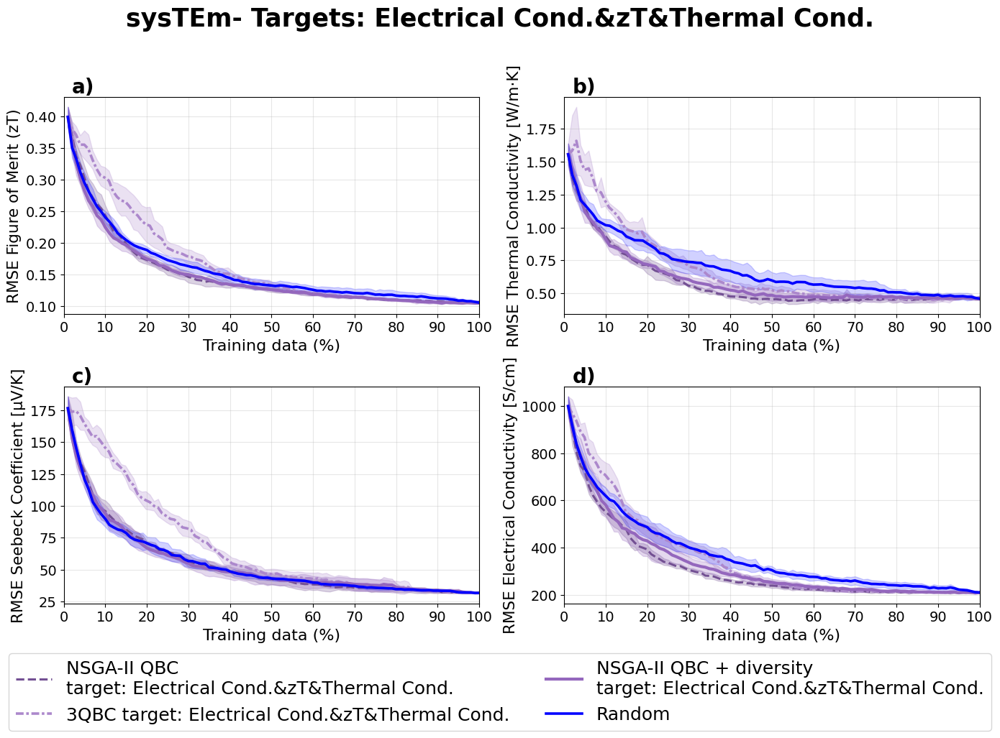

In [22]:
import os
import re
import unicodedata

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ============================================================
# Output directory
# ============================================================
output_dir = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\3ObjThermoElec"
)
os.makedirs(output_dir, exist_ok=True)

# ============================================================
# Helper: safe filename
# ============================================================
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

# ============================================================
# Seeds
# ============================================================
seeds = range(5)  # 0..4

# ============================================================
# Exact roots
# ============================================================
root_3qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_3QBC\ThermoEl\el_zT_ThC"
)

root_rand = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_random\ThermoEl\all"
)

root_nsga_qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_3Obj_ThreeTargets_QBC_ONLY\ThermoEl\el_zT_ThC"
)

root_nsga_qbc_div = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_4Obj_ThreeTargets\ThermoEl\el_zT_ThC"
)

# ============================================================
# RMSE columns and labels
# ============================================================
rmse_map = {
    "rmse_zt":        ("Figure of Merit (zT)", ""),
    "rmse_k_total":   ("Thermal Conductivity", "W/m·K"),
    "rmse_seebeck":   ("Seebeck Coefficient", "µV/K"),
    "rmse_elec_cond": ("Electrical Conductivity", "S/cm"),
}

plot_order = [
    "rmse_zt",
    "rmse_k_total",
    "rmse_seebeck",
    "rmse_elec_cond",
]

panel_labels = ["a)", "b)", "c)", "d)"]

TARGET_LABEL = "Electrical Cond.&zT&Thermal Cond."

# ============================================================
# Color helpers
# ============================================================
def blend_with(color, target=(1, 1, 1), amount=0.0):
    c = mcolors.to_rgb(color)
    return tuple((1 - amount) * c[i] + amount * target[i] for i in range(3))

def lighten(color, amount=0.25):
    return blend_with(color, target=(1, 1, 1), amount=amount)

def darken(color, amount=0.25):
    return blend_with(color, target=(0, 0, 0), amount=amount)

# ============================================================
# Base colors
# ============================================================
DIV_COLOR = "C4"   # purple
RAND_COLOR = "blue"

COLOR_DIV = DIV_COLOR
COLOR_NS = darken(DIV_COLOR, 0.22)    # darker purple
COLOR_3QBC = lighten(DIV_COLOR, 0.22) # lighter purple

# ============================================================
# Plot style controls
# ============================================================
FIGSIZE = (14, 10)
SUPTITLE_FONTSIZE = 25
AXIS_LABEL_FONTSIZE = 16
YLABEL_FONTSIZE = 15.5
TICK_LABEL_FONTSIZE = 14
PANEL_LABEL_FONTSIZE = 20
LEGEND_FONTSIZE = 18

# ============================================================
# Helpers
# ============================================================
def load_policy(policy_key: str, policy_label: str) -> pd.DataFrame:
    """
    Loads all available seeds for a policy.
    Adds columns: seed, policy, train_pct.
    Skips missing files and prints warnings.
    """
    dfs = []
    attempted = []
    missing = []

    for seed in seeds:
        if policy_key == "3qbc":
            path = os.path.join(
                root_3qbc, str(seed),
                f"ThermoEl_el_zT_ThCgrowing_3QBC_rf{seed}.csv"
            )
        elif policy_key == "random":
            path = os.path.join(
                root_rand, str(seed),
                f"ThermoEl_all_random_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc":
            path = os.path.join(
                root_nsga_qbc, str(seed),
                f"ThermoEl_el_zT_ThCgrowing_EA_3obj_qbc_only_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc_div":
            path = os.path.join(
                root_nsga_qbc_div, str(seed),
                f"ThermoEl_el_zT_ThCgrowing_EA_3out_div_rf{seed}.csv"
            )
        else:
            raise ValueError(f"Unknown policy_key: {policy_key}")

        attempted.append(path)

        if not os.path.exists(path):
            missing.append(path)
            continue

        df = pd.read_csv(path)

        if "train_ratio" not in df.columns:
            raise ValueError(f"'train_ratio' not found in: {path}")

        df["seed"] = seed
        df["policy"] = policy_label
        df["train_pct"] = df["train_ratio"] * 100.0
        dfs.append(df)

    if missing:
        print(f"\nWarning: {len(missing)} missing file(s) for policy '{policy_label}'.")
        for m in missing:
            print("  Missing:", m)

    if not dfs:
        raise FileNotFoundError(
            f"No files were found for policy '{policy_label}'.\n\n"
            "Check these attempted paths:\n" + "\n".join(attempted)
        )

    return pd.concat(dfs, ignore_index=True)

def mean_std(df: pd.DataFrame, col: str) -> pd.DataFrame:
    return (
        df.groupby("train_pct")[col]
          .agg(["mean", "std"])
          .reset_index()
          .sort_values("train_pct")
    )

# ============================================================
# Load all policies
# ============================================================
data_3qbc = load_policy(
    "3qbc",
    f"3QBC target: {TARGET_LABEL}"
)

data_nsga = load_policy(
    "nsga_qbc",
    f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
)

data_div = load_policy(
    "nsga_qbc_div",
    f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
)

data_rand = load_policy(
    "random",
    "Random"
)

policy_order = [
    ("nsga_qbc", data_nsga),
    ("3qbc", data_3qbc),
    ("nsga_qbc_div", data_div),
    ("random", data_rand),
]

# ============================================================
# One single 2x2 figure with all RMSE plots
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=FIGSIZE)
axes = axes.flatten()

fig.suptitle(
    f"sysTEm- Targets: {TARGET_LABEL}",
    fontsize=SUPTITLE_FONTSIZE,
    fontweight="bold",
    y=0.98
)

fig.subplots_adjust(wspace=0.35)

for ax, rmse_col, panel_label in zip(axes, plot_order, panel_labels):
    title, unit = rmse_map[rmse_col]

    g3 = mean_std(data_3qbc, rmse_col)
    gN = mean_std(data_nsga, rmse_col)
    gD = mean_std(data_div, rmse_col)
    gR = mean_std(data_rand, rmse_col)

    grouped_data = {
        "3qbc": g3,
        "nsga_qbc": gN,
        "nsga_qbc_div": gD,
        "random": gR,
    }

    for policy_key, _ in policy_order:
        sub = grouped_data[policy_key]

        if sub.empty:
            continue

        x = sub["train_pct"].to_numpy()
        y_mean = sub["mean"].to_numpy()
        y_std = sub["std"].to_numpy()

        if policy_key == "nsga_qbc":
            color = COLOR_NS
            linestyle = "--"
            linewidth = 2.2
            label = f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "3qbc":
            color = COLOR_3QBC
            linestyle = (0, (3, 1, 1, 1))
            linewidth = 2.6
            label = f"3QBC target: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "nsga_qbc_div":
            color = COLOR_DIV
            linestyle = "-"
            linewidth = 3.0
            label = f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        else:  # random
            color = RAND_COLOR
            linestyle = "-"
            linewidth = 2.6
            label = "Random"
            fill_alpha = 0.18

        ax.plot(
            x, y_mean,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=label
        )

        ax.fill_between(
            x,
            y_mean - y_std,
            y_mean + y_std,
            color=color,
            alpha=fill_alpha
        )

    ax.set_xlabel("Training data (%)", fontsize=AXIS_LABEL_FONTSIZE)

    if unit == "":
        ylabel = f"RMSE {title}"
    else:
        ylabel = f"RMSE {title} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=YLABEL_FONTSIZE)
    ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
    ax.grid(alpha=0.3)

    ax.set_xticks(np.arange(0, 101, 10))
    ax.set_xlim(0, 100)

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=PANEL_LABEL_FONTSIZE,
        fontweight="bold",
        va="top",
        ha="left"
    )

# ============================================================
# Common legend below all plots
# ============================================================
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.04),
    ncol=2,
    fontsize=LEGEND_FONTSIZE,
    frameon=True
)

plt.tight_layout(rect=[0, 0.08, 1, 0.95])

filename = f"{sanitize_filename(TARGET_LABEL)}_RMSE_all_4plots.png"
save_path = os.path.join(output_dir, filename)

plt.savefig(save_path, dpi=150, bbox_inches="tight")
plt.show()
plt.close()

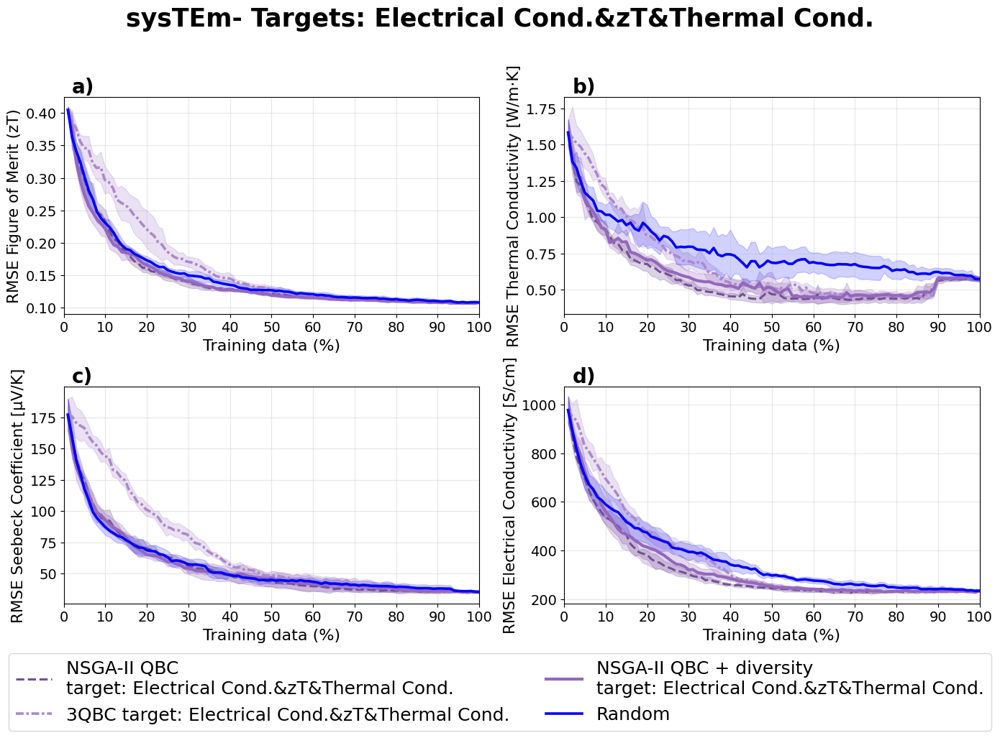

In [19]:
import os
import re
import unicodedata

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ============================================================
# Output directory
# ============================================================
output_dir = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\3ObjThermoElec_XGBoost"
)
os.makedirs(output_dir, exist_ok=True)

# ============================================================
# Helper: safe filename
# ============================================================
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

# ============================================================
# Seeds
# ============================================================
seeds = range(5)  # 0..4

# ============================================================
# Exact roots
# ============================================================
root_3qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_3QBC\ThermoEl\el_zT_ThC"
)

root_rand = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_random\ThermoEl\all"
)

root_nsga_qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_3Obj_ThreeTargets_QBC_ONLY\ThermoEl\el_zT_ThC"
)

root_nsga_qbc_div = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_4Obj_ThreeTargets\ThermoEl\el_zT_ThC"
)

# ============================================================
# RMSE columns and labels
# ============================================================
rmse_map = {
    "rmse_zt":        ("Figure of Merit (zT)", ""),
    "rmse_k_total":   ("Thermal Conductivity", "W/m·K"),
    "rmse_seebeck":   ("Seebeck Coefficient", "µV/K"),
    "rmse_elec_cond": ("Electrical Conductivity", "S/cm"),
}

plot_order = [
    "rmse_zt",
    "rmse_k_total",
    "rmse_seebeck",
    "rmse_elec_cond",
]

panel_labels = ["a)", "b)", "c)", "d)"]

TARGET_LABEL = "Electrical Cond.&zT&Thermal Cond."

# ============================================================
# Color helpers
# ============================================================
def blend_with(color, target=(1, 1, 1), amount=0.0):
    c = mcolors.to_rgb(color)
    return tuple((1 - amount) * c[i] + amount * target[i] for i in range(3))

def lighten(color, amount=0.25):
    return blend_with(color, target=(1, 1, 1), amount=amount)

def darken(color, amount=0.25):
    return blend_with(color, target=(0, 0, 0), amount=amount)

# ============================================================
# Base colors
# ============================================================
DIV_COLOR = "C4"
RAND_COLOR = "blue"

COLOR_DIV = DIV_COLOR
COLOR_NS = darken(DIV_COLOR, 0.22)
COLOR_3QBC = lighten(DIV_COLOR, 0.22)

# ============================================================
# Plot style controls
# ============================================================
FIGSIZE = (14, 10)
SUPTITLE_FONTSIZE = 25
AXIS_LABEL_FONTSIZE = 16
YLABEL_FONTSIZE = 15.5
TICK_LABEL_FONTSIZE = 14
PANEL_LABEL_FONTSIZE = 20
LEGEND_FONTSIZE = 18

# ============================================================
# Helpers
# ============================================================
def load_policy(policy_key: str, policy_label: str) -> pd.DataFrame:
    dfs = []
    attempted = []
    missing = []

    for seed in seeds:
        if policy_key == "3qbc":
            path = os.path.join(
                root_3qbc, str(seed),
                f"ThermoEl_el_zT_ThCgrowing_3QBC_xgb{seed}.csv"
            )
        elif policy_key == "random":
            path = os.path.join(
                root_rand, str(seed),
                f"ThermoEl_all_random_xgb{seed}.csv"
            )
        elif policy_key == "nsga_qbc":
            path = os.path.join(
                root_nsga_qbc, str(seed),
                f"ThermoEl_el_zT_ThCgrowing_EA_3obj_qbc_only_xgb{seed}.csv"
            )
        elif policy_key == "nsga_qbc_div":
            path = os.path.join(
                root_nsga_qbc_div, str(seed),
                f"ThermoEl_el_zT_ThCgrowing_EA_3out_div_xgb{seed}.csv"
            )
        else:
            raise ValueError(f"Unknown policy_key: {policy_key}")

        attempted.append(path)

        if not os.path.exists(path):
            missing.append(path)
            continue

        df = pd.read_csv(path)

        if "train_ratio" not in df.columns:
            raise ValueError(f"'train_ratio' not found in: {path}")

        df["seed"] = seed
        df["policy"] = policy_label
        df["train_pct"] = df["train_ratio"] * 100.0
        dfs.append(df)

    if missing:
        print(f"\nWarning: {len(missing)} missing file(s) for policy '{policy_label}'.")
        for m in missing:
            print("  Missing:", m)

    if not dfs:
        raise FileNotFoundError(
            f"No files were found for policy '{policy_label}'.\n\n"
            "Check these attempted paths:\n" + "\n".join(attempted)
        )

    return pd.concat(dfs, ignore_index=True)

def mean_std(df: pd.DataFrame, col: str) -> pd.DataFrame:
    grouped = (
        df.groupby(["seed", "train_pct"])[col]
          .mean()
          .reset_index()
    )

    return (
        grouped.groupby("train_pct")[col]
          .agg(["mean", "std"])
          .reset_index()
          .sort_values("train_pct")
    )

# ============================================================
# Load all policies
# ============================================================
data_3qbc = load_policy(
    "3qbc",
    f"3QBC target: {TARGET_LABEL}"
)

data_nsga = load_policy(
    "nsga_qbc",
    f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
)

data_div = load_policy(
    "nsga_qbc_div",
    f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
)

data_rand = load_policy(
    "random",
    "Random"
)

policy_order = [
    ("nsga_qbc", data_nsga),
    ("3qbc", data_3qbc),
    ("nsga_qbc_div", data_div),
    ("random", data_rand),
]

# ============================================================
# One single 2x2 figure with all RMSE plots
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=FIGSIZE)
axes = axes.flatten()

fig.suptitle(
    f"sysTEm- Targets: {TARGET_LABEL}",
    fontsize=SUPTITLE_FONTSIZE,
    fontweight="bold",
    y=0.98
)

fig.subplots_adjust(wspace=0.35)

for ax, rmse_col, panel_label in zip(axes, plot_order, panel_labels):
    title, unit = rmse_map[rmse_col]

    g3 = mean_std(data_3qbc, rmse_col)
    gN = mean_std(data_nsga, rmse_col)
    gD = mean_std(data_div, rmse_col)
    gR = mean_std(data_rand, rmse_col)

    grouped_data = {
        "3qbc": g3,
        "nsga_qbc": gN,
        "nsga_qbc_div": gD,
        "random": gR,
    }

    for policy_key, _ in policy_order:
        sub = grouped_data[policy_key]

        if sub.empty:
            continue

        x = sub["train_pct"].to_numpy()
        y_mean = sub["mean"].to_numpy()
        y_std = sub["std"].to_numpy()

        if policy_key == "nsga_qbc":
            color = COLOR_NS
            linestyle = "--"
            linewidth = 2.2
            label = f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "3qbc":
            color = COLOR_3QBC
            linestyle = (0, (3, 1, 1, 1))
            linewidth = 2.6
            label = f"3QBC target: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "nsga_qbc_div":
            color = COLOR_DIV
            linestyle = "-"
            linewidth = 3.0
            label = f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        else:
            color = RAND_COLOR
            linestyle = "-"
            linewidth = 2.6
            label = "Random"
            fill_alpha = 0.18

        ax.plot(
            x, y_mean,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=label
        )

        ax.fill_between(
            x,
            y_mean - y_std,
            y_mean + y_std,
            color=color,
            alpha=fill_alpha
        )

    ax.set_xlabel("Training data (%)", fontsize=AXIS_LABEL_FONTSIZE)

    ylabel = f"RMSE {title}" if unit == "" else f"RMSE {title} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=YLABEL_FONTSIZE)
    ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
    ax.grid(alpha=0.3)

    ax.set_xticks(np.arange(0, 101, 10))
    ax.set_xlim(0, 100)

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=PANEL_LABEL_FONTSIZE,
        fontweight="bold",
        va="top",
        ha="left"
    )

handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.04),
    ncol=2,
    fontsize=LEGEND_FONTSIZE,
    frameon=True
)

plt.tight_layout(rect=[0, 0.08, 1, 0.95])

filename = f"{sanitize_filename(TARGET_LABEL)}_RMSE_all_4plots_XGBoost.png"
save_path = os.path.join(output_dir, filename)

plt.savefig(save_path, dpi=150, bbox_inches="tight")
plt.show()
plt.close()

## Seebeck , zT, Thermal Conductivity 

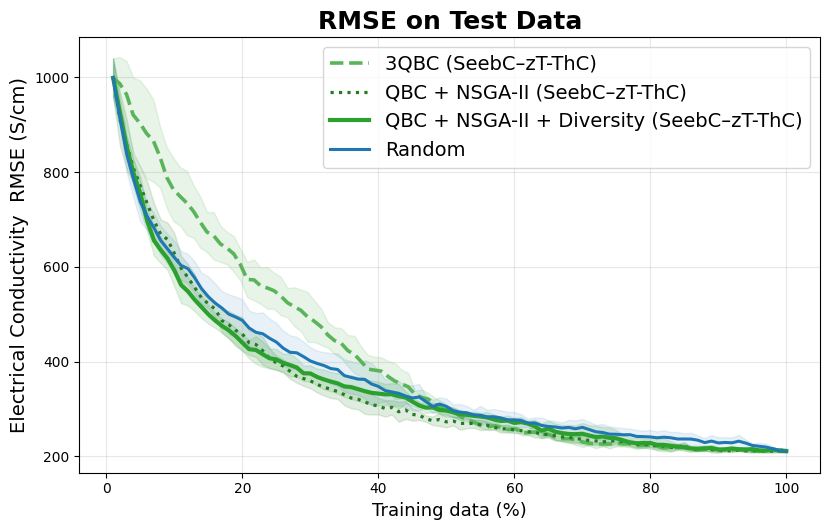

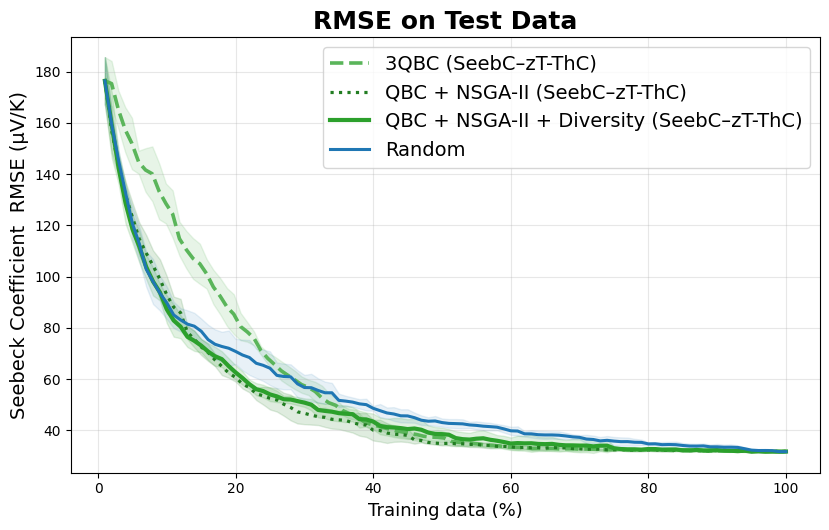

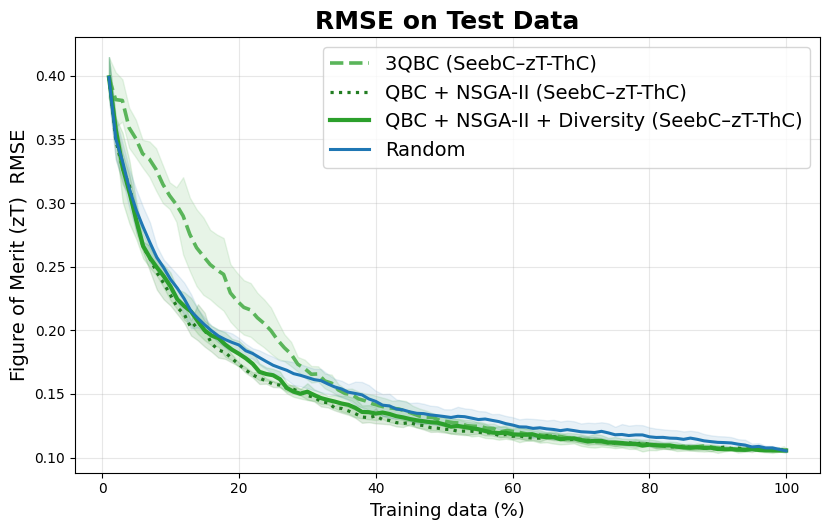

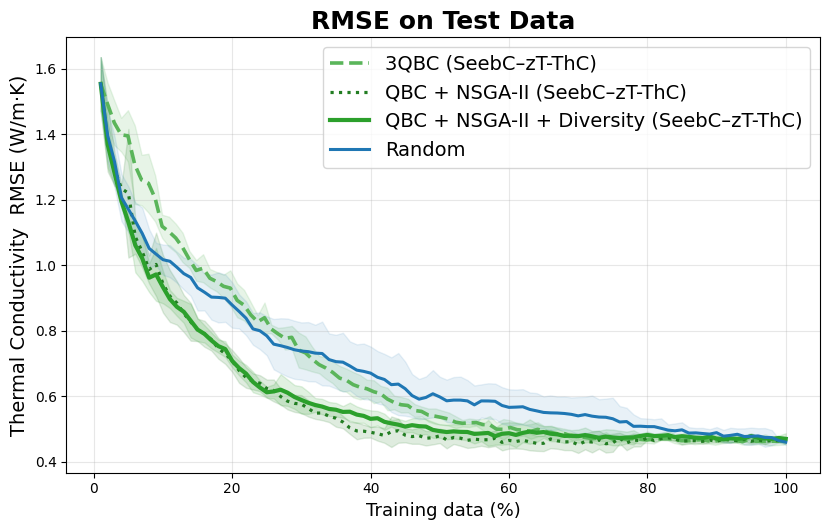

In [25]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import re
import unicodedata

def sanitize_filename(s):
    # normalize unicode (— → -)
    s = unicodedata.normalize("NFKD", s)

    # keep only ASCII
    s = s.encode("ascii", "ignore").decode("ascii")

    # replace spaces with underscore
    s = s.replace(" ", "_")

    # remove anything not alphanumeric, underscore, or dash
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)

    # collapse multiple underscores
    s = re.sub(r"_+", "_", s)

    return s.strip("_")



   

output_dir = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\3ObjThermoElec"
os.makedirs(output_dir, exist_ok=True)




# ============================================================
# Seeds
# ============================================================
seeds = range(5)  # 0..4

# ============================================================
# EXACT roots (from your messages)
# ============================================================
root_3qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_3QBC\ThermoEl\seeb_zT_ThC"
)

root_rand = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_random\ThermoEl\all"
)

root_nsga_qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_3Obj_ThreeTargets_QBC_ONLY\ThermoEl\seeb_zT_ThC"
)

root_nsga_qbc_div = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_4Obj_ThreeTargets\ThermoEl\seeb_zT_ThC"
)

# ============================================================
# RMSE columns and labels
# ============================================================
rmse_map = {
    "rmse_elec_cond": ("Electrical Conductivity", "RMSE (S/cm)"),
    "rmse_seebeck":   ("Seebeck Coefficient", "RMSE (µV/K)"),
    "rmse_zt":        ("Figure of Merit (zT)", "RMSE"),
    "rmse_k_total":   ("Thermal Conductivity", "RMSE (W/m·K)"),
}

TARGET_LABEL = "SeebC–zT-ThC"

# ============================================================
# Color helpers (same hue; lighter/darker variants)
# ============================================================
def blend_with(color, target=(1, 1, 1), amount=0.0):
    """
    amount=0 -> original color
    amount=1 -> fully target color
    """
    c = mcolors.to_rgb(color)
    return tuple((1 - amount) * c[i] + amount * target[i] for i in range(3))

def lighten(color, amount=0.25):
    return blend_with(color, target=(1, 1, 1), amount=amount)

def darken(color, amount=0.25):
    return blend_with(color, target=(0, 0, 0), amount=amount)

# Base palette choices:
# - Random MUST be blue solid
# - Diversity is the base color (green example)
DIV_COLOR   = "C2"   # green-ish in matplotlib default cycle
RAND_COLOR  = "C0"   # blue in matplotlib default cycle

COLOR_DIV   = DIV_COLOR
COLOR_NS   = darken(DIV_COLOR, 0.22)   # NSGA-II QBC: slightly darker than diversity
COLOR_3QBC = lighten(DIV_COLOR, 0.22)  # 3QBC: slightly lighter than diversity

# ============================================================
# Helpers
# ============================================================
def load_policy(policy_key: str, policy_label: str) -> pd.DataFrame:
    """
    Loads all seeds for a policy. Adds: seed, policy, train_percent.
    If any file is missing, raises FileNotFoundError with helpful info.
    """
    dfs = []
    attempted = []
    missing = []

    for seed in seeds:
        if policy_key == "3qbc":
            path = os.path.join(
                root_3qbc, str(seed),
                f"ThermoEl_seeb_zT_ThCgrowing_3QBC_rf{seed}.csv"
            )
        elif policy_key == "random":
            path = os.path.join(
                root_rand, str(seed),
                f"ThermoEl_all_random_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc":
            path = os.path.join(
                root_nsga_qbc, str(seed),
                f"ThermoEl_seeb_zT_ThCgrowing_EA_3obj_qbc_only_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc_div":
            path = os.path.join(
                root_nsga_qbc_div, str(seed),
                f"ThermoEl_seeb_zT_ThCgrowing_EA_3out_div_rf{seed}.csv"
            )
        else:
            raise ValueError(f"Unknown policy_key: {policy_key}")

        attempted.append(path)
        if not os.path.exists(path):
            missing.append(path)
            continue

        df = pd.read_csv(path)
        df["seed"] = seed
        df["policy"] = policy_label
        df["train_percent"] = df["train_ratio"] * 100.0
        dfs.append(df)

    if missing:
        msg = (
            f"Missing {len(missing)} file(s) for policy '{policy_label}'.\n\n"
            "First missing path:\n"
            f"{missing[0]}\n\n"
            "Tip: verify the folder name + filename prefix/suffix.\n"
            "All attempted paths:\n" + "\n".join(attempted)
        )
        raise FileNotFoundError(msg)

    return pd.concat(dfs, ignore_index=True)


def mean_std(df: pd.DataFrame, col: str) -> pd.DataFrame:
    return (
        df.groupby("train_percent")[col]
          .agg(["mean", "std"])
          .reset_index()
          .sort_values("train_percent")
    )

# ============================================================
# Load policies
# ============================================================
data_3qbc = load_policy("3qbc", f"3QBC ({TARGET_LABEL})")
data_nsga = load_policy("nsga_qbc", f"QBC + NSGA-II ({TARGET_LABEL})")
data_div  = load_policy("nsga_qbc_div", f"QBC + NSGA-II + Diversity ({TARGET_LABEL})")
data_rand = load_policy("random", "Random")

# ============================================================
# Plot: 4 RMSE plots, legend shows ONLY mean labels (no std labels)
# Styles:
# - Random: blue solid
# - Diversity: solid (base color)
# - NSGA-II QBC: dotted + slightly darker (same hue family)
# - 3QBC: dashed + slightly lighter (same hue family)
# ============================================================
for rmse_col, (title, ylabel) in rmse_map.items():

    g3 = mean_std(data_3qbc, rmse_col)
    gN = mean_std(data_nsga, rmse_col)
    gD = mean_std(data_div,  rmse_col)
    gR = mean_std(data_rand, rmse_col)

    plt.figure(figsize=(8.4, 5.4))

    # 3QBC (lighter, dashed)
    plt.plot(
        g3.train_percent, g3["mean"],
        color=COLOR_3QBC, lw=2.6, ls="--",
        label=data_3qbc.policy.iloc[0]
    )
    plt.fill_between(
        g3.train_percent, g3["mean"]-g3["std"], g3["mean"]+g3["std"],
        color=COLOR_3QBC, alpha=0.14
    )

    # QBC + NSGA-II (darker, dotted)
    plt.plot(
        gN.train_percent, gN["mean"],
        color=COLOR_NS, lw=2.3, ls=":",
        label=data_nsga.policy.iloc[0]
    )
    plt.fill_between(
        gN.train_percent, gN["mean"]-gN["std"], gN["mean"]+gN["std"],
        color=COLOR_NS, alpha=0.14
    )

    # QBC + NSGA-II + Diversity (base color, solid)
    plt.plot(
        gD.train_percent, gD["mean"],
        color=COLOR_DIV, lw=3.0, ls="-",
        label=data_div.policy.iloc[0]
    )
    plt.fill_between(
        gD.train_percent, gD["mean"]-gD["std"], gD["mean"]+gD["std"],
        color=COLOR_DIV, alpha=0.14
    )

    # Random (blue, solid)
    plt.plot(
        gR.train_percent, gR["mean"],
        color=RAND_COLOR, lw=2.2, ls="-",
        label="Random"
    )
    plt.fill_between(
        gR.train_percent, gR["mean"]-gR["std"], gR["mean"]+gR["std"],
        color=RAND_COLOR, alpha=0.10
    )

    plt.xlabel("Training data (%)", fontsize=13)
    plt.ylabel(title + "  "+ylabel, fontsize=14)
    plt.title("RMSE on Test Data", fontsize=18,fontweight="bold")
    plt.grid(alpha=0.3)
    plt.legend(frameon=True,fontsize=14)
    plt.tight_layout()
    
    safe_title = sanitize_filename(title+TARGET_LABEL)
    filename = f"{safe_title}.png"
    save_path = os.path.join(output_dir, filename)
    plt.savefig(save_path, dpi=150, bbox_inches="tight", pad_inches=0.02)

    plt.show()
    plt.close()

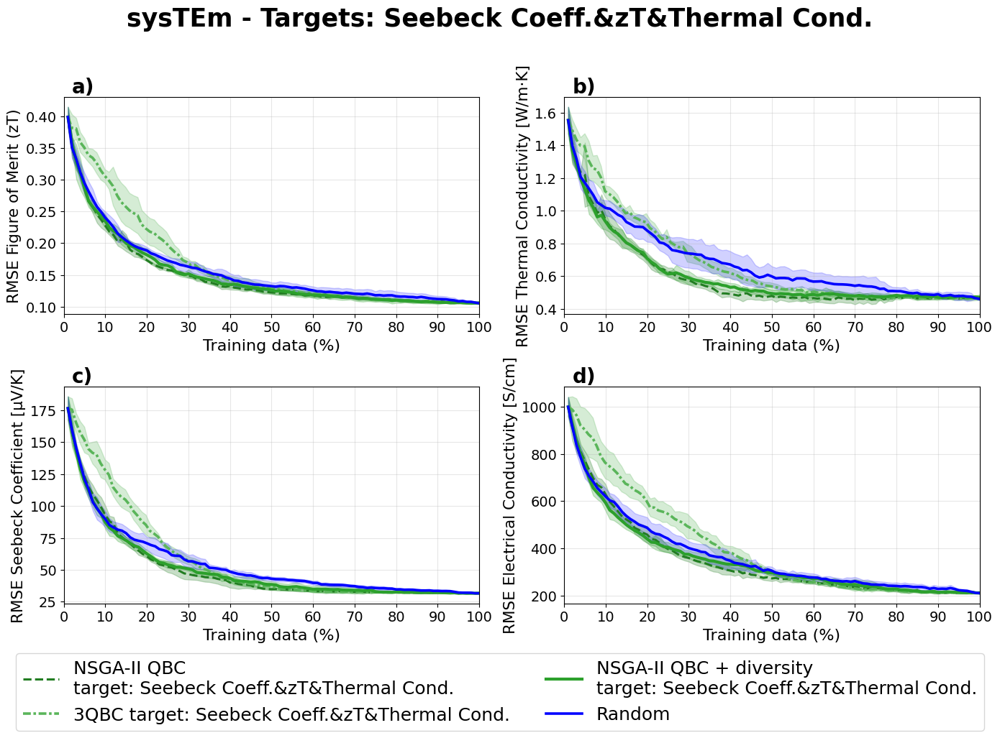

In [23]:
import os
import re
import unicodedata

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ============================================================
# Output directory
# ============================================================
output_dir = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\3ObjThermoElec"
)
os.makedirs(output_dir, exist_ok=True)

# ============================================================
# Helper: safe filename
# ============================================================
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

# ============================================================
# Seeds
# ============================================================
seeds = range(5)  # 0..4

# ============================================================
# Exact roots
# ============================================================
root_3qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_3QBC\ThermoEl\seeb_zT_ThC"
)

root_rand = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_random\ThermoEl\all"
)

root_nsga_qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_3Obj_ThreeTargets_QBC_ONLY\ThermoEl\seeb_zT_ThC"
)

root_nsga_qbc_div = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_4Obj_ThreeTargets\ThermoEl\seeb_zT_ThC"
)

# ============================================================
# RMSE columns and labels
# ============================================================
rmse_map = {
    "rmse_zt":        ("Figure of Merit (zT)", ""),
    "rmse_k_total":   ("Thermal Conductivity", "W/m·K"),
    "rmse_seebeck":   ("Seebeck Coefficient", "µV/K"),
    "rmse_elec_cond": ("Electrical Conductivity", "S/cm"),
}

plot_order = [
    "rmse_zt",
    "rmse_k_total",
    "rmse_seebeck",
    "rmse_elec_cond",
]

panel_labels = ["a)", "b)", "c)", "d)"]

TARGET_LABEL = "Seebeck Coeff.&zT&Thermal Cond."

# ============================================================
# Color helpers
# ============================================================
def blend_with(color, target=(1, 1, 1), amount=0.0):
    c = mcolors.to_rgb(color)
    return tuple((1 - amount) * c[i] + amount * target[i] for i in range(3))

def lighten(color, amount=0.25):
    return blend_with(color, target=(1, 1, 1), amount=amount)

def darken(color, amount=0.25):
    return blend_with(color, target=(0, 0, 0), amount=amount)

# ============================================================
# Base colors
# ============================================================
DIV_COLOR = "C2"   # green
RAND_COLOR = "blue"

COLOR_DIV = DIV_COLOR
COLOR_NS = darken(DIV_COLOR, 0.22)    # darker green
COLOR_3QBC = lighten(DIV_COLOR, 0.22) # lighter green

# ============================================================
# Plot style controls
# ============================================================
FIGSIZE = (14, 10)
SUPTITLE_FONTSIZE = 25
AXIS_LABEL_FONTSIZE = 16
YLABEL_FONTSIZE = 15.5
TICK_LABEL_FONTSIZE = 14
PANEL_LABEL_FONTSIZE = 20
LEGEND_FONTSIZE = 18

# ============================================================
# Helpers
# ============================================================
def load_policy(policy_key: str, policy_label: str) -> pd.DataFrame:
    """
    Loads all available seeds for a policy.
    Adds columns: seed, policy, train_pct.
    Skips missing files and prints warnings.
    """
    dfs = []
    attempted = []
    missing = []

    for seed in seeds:
        if policy_key == "3qbc":
            path = os.path.join(
                root_3qbc, str(seed),
                f"ThermoEl_seeb_zT_ThCgrowing_3QBC_rf{seed}.csv"
            )
        elif policy_key == "random":
            path = os.path.join(
                root_rand, str(seed),
                f"ThermoEl_all_random_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc":
            path = os.path.join(
                root_nsga_qbc, str(seed),
                f"ThermoEl_seeb_zT_ThCgrowing_EA_3obj_qbc_only_rf{seed}.csv"
            )
        elif policy_key == "nsga_qbc_div":
            path = os.path.join(
                root_nsga_qbc_div, str(seed),
                f"ThermoEl_seeb_zT_ThCgrowing_EA_3out_div_rf{seed}.csv"
            )
        else:
            raise ValueError(f"Unknown policy_key: {policy_key}")

        attempted.append(path)

        if not os.path.exists(path):
            missing.append(path)
            continue

        df = pd.read_csv(path)

        if "train_ratio" not in df.columns:
            raise ValueError(f"'train_ratio' not found in: {path}")

        df["seed"] = seed
        df["policy"] = policy_label
        df["train_pct"] = df["train_ratio"] * 100.0
        dfs.append(df)

    if missing:
        print(f"\nWarning: {len(missing)} missing file(s) for policy '{policy_label}'.")
        for m in missing:
            print("  Missing:", m)

    if not dfs:
        raise FileNotFoundError(
            f"No files were found for policy '{policy_label}'.\n\n"
            "Check these attempted paths:\n" + "\n".join(attempted)
        )

    return pd.concat(dfs, ignore_index=True)

def mean_std(df: pd.DataFrame, col: str) -> pd.DataFrame:
    return (
        df.groupby("train_pct")[col]
          .agg(["mean", "std"])
          .reset_index()
          .sort_values("train_pct")
    )

# ============================================================
# Load all policies
# ============================================================
data_3qbc = load_policy(
    "3qbc",
    f"3QBC target: {TARGET_LABEL}"
)

data_nsga = load_policy(
    "nsga_qbc",
    f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
)

data_div = load_policy(
    "nsga_qbc_div",
    f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
)

data_rand = load_policy(
    "random",
    "Random"
)

policy_order = [
    ("nsga_qbc", data_nsga),
    ("3qbc", data_3qbc),
    ("nsga_qbc_div", data_div),
    ("random", data_rand),
]

# ============================================================
# One single 2x2 figure with all RMSE plots
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=FIGSIZE)
axes = axes.flatten()

fig.suptitle(
    f"sysTEm - Targets: {TARGET_LABEL}",
    fontsize=SUPTITLE_FONTSIZE,
    fontweight="bold",
    y=0.98
)

fig.subplots_adjust(wspace=0.35)

for ax, rmse_col, panel_label in zip(axes, plot_order, panel_labels):
    title, unit = rmse_map[rmse_col]

    g3 = mean_std(data_3qbc, rmse_col)
    gN = mean_std(data_nsga, rmse_col)
    gD = mean_std(data_div, rmse_col)
    gR = mean_std(data_rand, rmse_col)

    grouped_data = {
        "3qbc": g3,
        "nsga_qbc": gN,
        "nsga_qbc_div": gD,
        "random": gR,
    }

    for policy_key, _ in policy_order:
        sub = grouped_data[policy_key]

        if sub.empty:
            continue

        x = sub["train_pct"].to_numpy()
        y_mean = sub["mean"].to_numpy()
        y_std = sub["std"].to_numpy()

        if policy_key == "nsga_qbc":
            color = COLOR_NS
            linestyle = "--"
            linewidth = 2.2
            label = f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "3qbc":
            color = COLOR_3QBC
            linestyle = (0, (3, 1, 1, 1))
            linewidth = 2.6
            label = f"3QBC target: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "nsga_qbc_div":
            color = COLOR_DIV
            linestyle = "-"
            linewidth = 3.0
            label = f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        else:  # random
            color = RAND_COLOR
            linestyle = "-"
            linewidth = 2.6
            label = "Random"
            fill_alpha = 0.18

        ax.plot(
            x, y_mean,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=label
        )

        ax.fill_between(
            x,
            y_mean - y_std,
            y_mean + y_std,
            color=color,
            alpha=fill_alpha
        )

    ax.set_xlabel("Training data (%)", fontsize=AXIS_LABEL_FONTSIZE)

    if unit == "":
        ylabel = f"RMSE {title}"
    else:
        ylabel = f"RMSE {title} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=YLABEL_FONTSIZE)
    ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
    ax.grid(alpha=0.3)

    ax.set_xticks(np.arange(0, 101, 10))
    ax.set_xlim(0, 100)

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=PANEL_LABEL_FONTSIZE,
        fontweight="bold",
        va="top",
        ha="left"
    )

# ============================================================
# Common legend below all plots
# ============================================================
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.04),
    ncol=2,
    fontsize=LEGEND_FONTSIZE,
    frameon=True
)

plt.tight_layout(rect=[0, 0.08, 1, 0.95])

filename = f"{sanitize_filename(TARGET_LABEL)}_RMSE_all_4plots.png"
save_path = os.path.join(output_dir, filename)

plt.savefig(save_path, dpi=150, bbox_inches="tight")
plt.show()
plt.close()

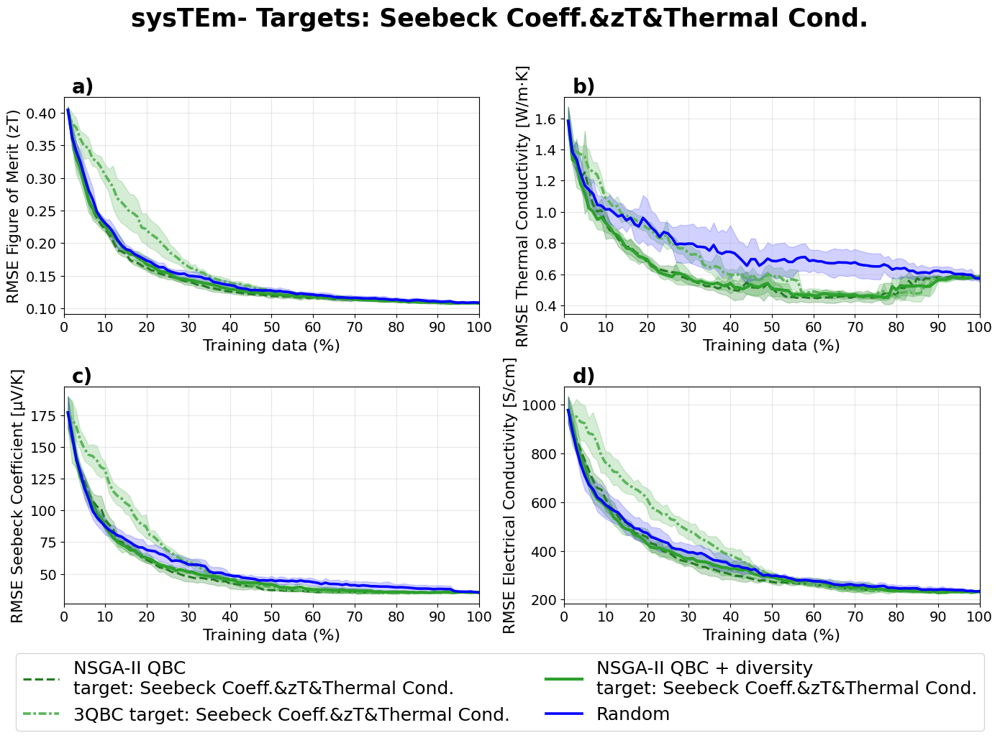

In [18]:
import os
import re
import unicodedata

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ============================================================
# Output directory
# ============================================================
output_dir = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\Plots\3ObjThermoElec_XGBoost"
)
os.makedirs(output_dir, exist_ok=True)

# ============================================================
# Helper: safe filename
# ============================================================
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

# ============================================================
# Seeds
# ============================================================
seeds = range(5)  # 0..4

# ============================================================
# Exact roots
# ============================================================
root_3qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_3QBC\ThermoEl\seeb_zT_ThC"
)

root_rand = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_random\ThermoEl\all"
)

root_nsga_qbc = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_3Obj_ThreeTargets_QBC_ONLY\ThermoEl\seeb_zT_ThC"
)

root_nsga_qbc_div = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW"
    r"\al\grow_EA_4Obj_ThreeTargets\ThermoEl\seeb_zT_ThC"
)

# ============================================================
# RMSE columns and labels
# ============================================================
rmse_map = {
    "rmse_zt":        ("Figure of Merit (zT)", ""),
    "rmse_k_total":   ("Thermal Conductivity", "W/m·K"),
    "rmse_seebeck":   ("Seebeck Coefficient", "µV/K"),
    "rmse_elec_cond": ("Electrical Conductivity", "S/cm"),
}

plot_order = [
    "rmse_zt",
    "rmse_k_total",
    "rmse_seebeck",
    "rmse_elec_cond",
]

panel_labels = ["a)", "b)", "c)", "d)"]

TARGET_LABEL = "Seebeck Coeff.&zT&Thermal Cond."

# ============================================================
# Color helpers
# ============================================================
def blend_with(color, target=(1, 1, 1), amount=0.0):
    c = mcolors.to_rgb(color)
    return tuple((1 - amount) * c[i] + amount * target[i] for i in range(3))

def lighten(color, amount=0.25):
    return blend_with(color, target=(1, 1, 1), amount=amount)

def darken(color, amount=0.25):
    return blend_with(color, target=(0, 0, 0), amount=amount)

# ============================================================
# Base colors
# ============================================================
DIV_COLOR = "C2"
RAND_COLOR = "blue"

COLOR_DIV = DIV_COLOR
COLOR_NS = darken(DIV_COLOR, 0.22)
COLOR_3QBC = lighten(DIV_COLOR, 0.22)

# ============================================================
# Plot style controls
# ============================================================
FIGSIZE = (14, 10)
SUPTITLE_FONTSIZE = 25
AXIS_LABEL_FONTSIZE = 16
YLABEL_FONTSIZE = 15.5
TICK_LABEL_FONTSIZE = 14
PANEL_LABEL_FONTSIZE = 20
LEGEND_FONTSIZE = 18

# ============================================================
# Helpers
# ============================================================
def load_policy(policy_key: str, policy_label: str) -> pd.DataFrame:
    dfs = []
    attempted = []
    missing = []

    for seed in seeds:
        if policy_key == "3qbc":
            path = os.path.join(
                root_3qbc, str(seed),
                f"ThermoEl_seeb_zT_ThCgrowing_3QBC_xgb{seed}.csv"
            )
        elif policy_key == "random":
            path = os.path.join(
                root_rand, str(seed),
                f"ThermoEl_all_random_xgb{seed}.csv"
            )
        elif policy_key == "nsga_qbc":
            path = os.path.join(
                root_nsga_qbc, str(seed),
                f"ThermoEl_seeb_zT_ThCgrowing_EA_3obj_qbc_only_xgb{seed}.csv"
            )
        elif policy_key == "nsga_qbc_div":
            path = os.path.join(
                root_nsga_qbc_div, str(seed),
                f"ThermoEl_seeb_zT_ThCgrowing_EA_3out_div_xgb{seed}.csv"
            )
        else:
            raise ValueError(f"Unknown policy_key: {policy_key}")

        attempted.append(path)

        if not os.path.exists(path):
            missing.append(path)
            continue

        df = pd.read_csv(path)

        if "train_ratio" not in df.columns:
            raise ValueError(f"'train_ratio' not found in: {path}")

        df["seed"] = seed
        df["policy"] = policy_label
        df["train_pct"] = df["train_ratio"] * 100.0
        dfs.append(df)

    if missing:
        print(f"\nWarning: {len(missing)} missing file(s) for policy '{policy_label}'.")
        for m in missing:
            print("  Missing:", m)

    if not dfs:
        raise FileNotFoundError(
            f"No files were found for policy '{policy_label}'.\n\n"
            "Check these attempted paths:\n" + "\n".join(attempted)
        )

    return pd.concat(dfs, ignore_index=True)

def mean_std(df: pd.DataFrame, col: str) -> pd.DataFrame:
    grouped = (
        df.groupby(["seed", "train_pct"])[col]
          .mean()
          .reset_index()
    )

    return (
        grouped.groupby("train_pct")[col]
          .agg(["mean", "std"])
          .reset_index()
          .sort_values("train_pct")
    )

# ============================================================
# Load all policies
# ============================================================
data_3qbc = load_policy(
    "3qbc",
    f"3QBC target: {TARGET_LABEL}"
)

data_nsga = load_policy(
    "nsga_qbc",
    f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
)

data_div = load_policy(
    "nsga_qbc_div",
    f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
)

data_rand = load_policy(
    "random",
    "Random"
)

policy_order = [
    ("nsga_qbc", data_nsga),
    ("3qbc", data_3qbc),
    ("nsga_qbc_div", data_div),
    ("random", data_rand),
]

# ============================================================
# One single 2x2 figure with all RMSE plots
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=FIGSIZE)
axes = axes.flatten()

fig.suptitle(
    f"sysTEm- Targets: {TARGET_LABEL}",
    fontsize=SUPTITLE_FONTSIZE,
    fontweight="bold",
    y=0.98
)

fig.subplots_adjust(wspace=0.35)

for ax, rmse_col, panel_label in zip(axes, plot_order, panel_labels):
    title, unit = rmse_map[rmse_col]

    g3 = mean_std(data_3qbc, rmse_col)
    gN = mean_std(data_nsga, rmse_col)
    gD = mean_std(data_div, rmse_col)
    gR = mean_std(data_rand, rmse_col)

    grouped_data = {
        "3qbc": g3,
        "nsga_qbc": gN,
        "nsga_qbc_div": gD,
        "random": gR,
    }

    for policy_key, _ in policy_order:
        sub = grouped_data[policy_key]

        if sub.empty:
            continue

        x = sub["train_pct"].to_numpy()
        y_mean = sub["mean"].to_numpy()
        y_std = sub["std"].to_numpy()

        if policy_key == "nsga_qbc":
            color = COLOR_NS
            linestyle = "--"
            linewidth = 2.2
            label = f"NSGA-II QBC\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "3qbc":
            color = COLOR_3QBC
            linestyle = (0, (3, 1, 1, 1))
            linewidth = 2.6
            label = f"3QBC target: {TARGET_LABEL}"
            fill_alpha = 0.25

        elif policy_key == "nsga_qbc_div":
            color = COLOR_DIV
            linestyle = "-"
            linewidth = 3.0
            label = f"NSGA-II QBC + diversity\ntarget: {TARGET_LABEL}"
            fill_alpha = 0.25

        else:
            color = RAND_COLOR
            linestyle = "-"
            linewidth = 2.6
            label = "Random"
            fill_alpha = 0.18

        ax.plot(
            x, y_mean,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=label
        )

        ax.fill_between(
            x,
            y_mean - y_std,
            y_mean + y_std,
            color=color,
            alpha=fill_alpha
        )

    ax.set_xlabel("Training data (%)", fontsize=AXIS_LABEL_FONTSIZE)

    ylabel = f"RMSE {title}" if unit == "" else f"RMSE {title} [{unit}]"

    ax.set_ylabel(ylabel, fontsize=YLABEL_FONTSIZE)
    ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
    ax.grid(alpha=0.3)

    ax.set_xticks(np.arange(0, 101, 10))
    ax.set_xlim(0, 100)

    ax.text(
        0.02, 1.09, panel_label,
        transform=ax.transAxes,
        fontsize=PANEL_LABEL_FONTSIZE,
        fontweight="bold",
        va="top",
        ha="left"
    )

handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.04),
    ncol=2,
    fontsize=LEGEND_FONTSIZE,
    frameon=True
)

plt.tight_layout(rect=[0, 0.08, 1, 0.95])

filename = f"{sanitize_filename(TARGET_LABEL)}_RMSE_all_4plots_XGBoost.png"
save_path = os.path.join(output_dir, filename)

plt.savefig(save_path, dpi=150, bbox_inches="tight")
plt.show()
plt.close()

## 1 Outcome

### Thermal Conductivity

In [15]:
#!/usr/bin/env python3
"""
PCA on df_trainval (a 90/10 split from CLEANED_DATA.csv) + separate plots per policy
(QBC vs Diversity) with:
- NO scatter plot
- HISTOGRAMS (counts) + DENSITY curves (PDF-like) for the FIRST 6 PCA components

IMPORTANT INDEXING RULE (your requirement):
- Policy trainIndices refer to the ROW NUMBER of CLEANED_DATA.csv (0-based).
- We compute PCA ONLY on df_trainval, so we must MAP those CLEANED_DATA indices
  into the subset that ended up in df_trainval.
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# ============================================================
# PATHS (EDIT IF NEEDED)
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

# Main output folder
BASE_OUT_DIR = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca6_trainval_hist_density"  # <-- EDIT THIS

# Percentages of CLEANED_DATA size to take
PCTS = [10,20, 30, 40, 50, 60, 70, 80,90,100]


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# PCA CONFIG (NOW 6D)
# ============================================================
PCA_N_COMPONENTS_OUT = 9
PCA_RANDOM_STATE = 0
PCA_SVD_SOLVER = "auto"  # "full" | "randomized" | "auto"


# ============================================================
# PLOTTING CONFIG
# ============================================================
HIST_BINS = 84
FIX_HIST_RANGE = True

DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.70

ALL_HIST_ALPHA = 0.35
SEL_HIST_ALPHA = 0.60

FIGSIZE = (14, 10)  # 2 columns x 3 rows


# ============================================================
# HELPERS
# ============================================================
def load_clean_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def split_trainval_test(df_clean: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_clean,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test


def trainval_features_and_orig_rows(df_trainval: pd.DataFrame) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    # Drop helper + drop first (unnamed) CSV column from features
    feat_df = df_trainval.drop(columns=["__orig_row"]).iloc[:, 1:]
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric feature columns found after dropping first column.")

    return feat_df, orig_rows


def compute_pca_6d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    n_comp = int(min(PCA_N_COMPONENTS_OUT, X.shape[1], X.shape[0] - 1))
    if n_comp < PCA_N_COMPONENTS_OUT:
        raise ValueError(
            f"Not enough rank/samples for PCA_N_COMPONENTS_OUT={PCA_N_COMPONENTS_OUT}. "
            f"Got n_comp={n_comp} (n_features={X.shape[1]}, n_samples={X.shape[0]})."
        )

    pca = PCA(
        n_components=PCA_N_COMPONENTS_OUT,
        svd_solver=PCA_SVD_SOLVER,
        random_state=PCA_RANDOM_STATE,
    )
    return pca.fit_transform(X)


def load_train_indices(path: str) -> np.ndarray:
    df = pd.read_csv(path)
    if "trainIndices" not in df.columns:
        raise ValueError(f"'trainIndices' not found in {path}")
    return df["trainIndices"].dropna().astype(int).to_numpy()


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {policy} {pct}% (k={k}): no missing (w.r.t. trainval).")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {policy} {pct}% (k={k}): {len(missing)} indices NOT in df_trainval (dropped by split)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing

def plot_policy_pca6_hist_density(
    emb_df: pd.DataFrame,
    selected_orig_rows: np.ndarray,
    pct: int,
    k: int,
    policy_name: str,
    out_path: str,
) -> None:
    sel_mask = emb_df["__orig_row"].isin(selected_orig_rows).to_numpy()

    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=FIGSIZE)
    axes = axes.ravel()

    # ---- Force distinct styling so ALL vs SELECTED never collapse visually ----
    all_hist_color = "blue"
    all_line_color = "blue"
    sel_hist_color = "tab:orange"
    sel_line_color = "tab:orange"

    for d in range(1, PCA_N_COMPONENTS_OUT + 1):
        ax = axes[d - 1]
        col = f"PC{d}"

        x_all = emb_df[col].to_numpy()
        x_sel = emb_df.loc[sel_mask, col].to_numpy()

        rng = _safe_range(x_all) if FIX_HIST_RANGE else None

        # Histograms (counts)
        ax.hist(
            x_all,
            bins=HIST_BINS,
            range=rng,
            alpha=ALL_HIST_ALPHA,
            color=all_hist_color,
            label="All (trainval)",
        )
        ax.hist(
            x_sel,
            bins=HIST_BINS,
            range=rng,
            alpha=SEL_HIST_ALPHA,
            color=sel_hist_color,
            label=f"Selected (first {k})",
        )

        ax.set_title(col, fontsize=11)
        ax.set_ylabel("Count")
        ax.grid(alpha=0.2)

        # Density overlay (PDF-like)
        ax_d = ax.twinx()
        c_all, d_all = _hist_density_curve(x_all, HIST_BINS, rng)
        c_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, rng)

        ax_d.plot(
            c_all,
            d_all,
            linewidth=DENSITY_LINEWIDTH,
            alpha=ALL_DENSITY_ALPHA,
            color=all_line_color,
            linestyle="-",
            label="All density",
            zorder=5,
        )
        ax_d.plot(
            c_sel,
            d_sel,
            linewidth=DENSITY_LINEWIDTH,
            alpha=DENSITY_ALPHA,
            color=sel_line_color,
            linestyle="--",
            label="Selected density",
            zorder=6,
        )

        ax_d.set_ylabel("Density")
        ax_d.grid(False)

        # One legend per panel (clean and unambiguous)
        h1, l1 = ax.get_legend_handles_labels()
        h2, l2 = ax_d.get_legend_handles_labels()
        ax.legend(h1 + h2, l1 + l2, loc="upper right", fontsize=8, frameon=True)

    fig.suptitle(
        f"{policy_name} — PCA(6) marginals (trainval) — coverage {pct}%  (k={k})",
        fontsize=14,
    )
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    # 1) Load df_clean exactly as read, then split
    df_clean = load_clean_data_with_orig_row(CLEANED_DATA_PATH)
    df_trainval, _df_test = split_trainval_test(df_clean)

    # 2) Build features for PCA + mapping back to CLEANED_DATA row numbers
    feat_df, trainval_orig_rows = trainval_features_and_orig_rows(df_trainval)
    trainval_orig_set = set(trainval_orig_rows.tolist())

    # 3) PCA(6D) on df_trainval
    Z = compute_pca_6d_from_features(feat_df)

    # 4) Embedding DataFrame
    emb_df = pd.DataFrame(Z, columns=[f"PC{i}" for i in range(1, PCA_N_COMPONENTS_OUT + 1)])
    emb_df["__orig_row"] = trainval_orig_rows

    PROPS = ["electric_cond", "seebeck_coef", "thermal_cond", "zT"]

    for prop in PROPS:
        prop_out_dir = os.path.join(BASE_OUT_DIR, prop)
        os.makedirs(prop_out_dir, exist_ok=True)

        for i in range(5):
            QBC_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_QBC{i}_trainIndices.csv"
            )

            DIV_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_EA_1out_div{i}_trainIndices.csv"
            )

            qbc_order = load_train_indices(QBC_INDICES_PATH)
            div_order = load_train_indices(DIV_INDICES_PATH)

            N_clean = len(df_clean)

            for pct in PCTS:
                k = int(np.ceil((pct / 100.0) * N_clean))

                # ---------------- QBC ----------------
                qbc_present_orig, qbc_missing_orig = policy_first_k_orig_indices_in_trainval(
                    qbc_order, trainval_orig_set, k
                )
                qbc_plot = os.path.join(prop_out_dir, rf"{i}_QBC_{prop}_trainval_pca6_histdens_{pct}pct.png")
                qbc_txt = os.path.join(prop_out_dir, rf"{i}_QBC_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("QBC", pct, k, qbc_missing_orig, qbc_txt)
                plot_policy_pca6_hist_density(
                    emb_df, qbc_present_orig, pct, k, "QBC", qbc_plot
                )
                print(f"[OK] Saved plot: {qbc_plot}")

                # ------------- Diversity -------------
                div_present_orig, div_missing_orig = policy_first_k_orig_indices_in_trainval(
                    div_order, trainval_orig_set, k
                )
                div_plot = os.path.join(prop_out_dir, rf"{i}_Diversity_{prop}_trainval_pca6_histdens_{pct}pct.png")
                div_txt = os.path.join(prop_out_dir, rf"{i}_Diversity_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("Diversity", pct, k, div_missing_orig, div_txt)
                plot_policy_pca6_hist_density(
                    emb_df, div_present_orig, pct, k, "Diversity (EA_DeltaDiversity)", div_plot
                )
                print(f"[OK] Saved plot: {div_plot}")

                print("-" * 80)


if __name__ == "__main__":
    main()

[OK] QBC 10% (k=777): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca6_trainval_hist_density\electric_cond\0_QBC_electric_cond_trainval_pca6_histdens_10pct.png
[OK] Diversity 10% (k=777): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca6_trainval_hist_density\electric_cond\0_Diversity_electric_cond_trainval_pca6_histdens_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca6_trainval_hist_density\electric_cond\0_QBC_electric_cond_trainval_pca6_histdens_20pct.png
[OK] Diversity 20% (k=15

ONLY THE PCA's shown, jointly QBC and QBC+ Diversity

In [1]:
#!/usr/bin/env python3
"""
Thermoelectric PCA coverage plots (QBC vs QBC + Diversity) — modified

What this script does:
- Uses the THERMOELECTRIC logic of the first script:
    * PCA is computed ONLY on df_trainval from a 90/10 split of CLEANED_DATA.csv
    * policy trainIndices refer to CLEANED_DATA.csv original row numbers
    * those indices are mapped into df_trainval through __orig_row
- Uses the PLOTTING logic/style of the second script:
    * only PC1 and PC2 are plotted
    * one single figure per (property, seed, pct)
    * left panel: QBC
    * right panel: QBC + Diversity
    * "New points (+x%)" label
    * bold labels / bold titles / larger text
    * second panel has no left y-axis
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set, Dict, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# ============================================================
# PATHS (EDIT IF NEEDED)
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

BASE_OUT_DIR = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_combined_QBC_vs_QBCDiversity"
)

# Percentages of CLEANED_DATA size to take
PCTS = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# If you already had some points collected before these percentages start,
# set that number here. Otherwise leave it at 0.
BASELINE_ALREADY_COLLECTED_K = 0


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# PCA CONFIG
# ============================================================
PCA_N_COMPONENTS_2D = 2
PCA_RANDOM_STATE = 0
PCA_SVD_SOLVER = "auto"


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 25
SCATTER_S_SEL = 25
ALL_ALPHA = 0.20
SEL_ALPHA = 0.40

EDGE_COLOR = "black"
EDGE_LW_ALL = 0.35
EDGE_LW_SEL = 0.45

NEW_COLOR = "purple"
NEW_ALPHA = 0.70

FIGSIZE = (15, 5.5)

TITLE_FONTSIZE = 16
LABEL_FONTSIZE = 16
TICK_FONTSIZE = 13
LEGEND_FONTSIZE = 13
SUPTITLE_FONTSIZE = 20


# ============================================================
# JITTER CONFIG
# ============================================================
JITTER_FRAC = 0.01
JITTER_RANDOM_STATE = 0


# ============================================================
# HELPERS
# ============================================================
def load_clean_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def split_trainval_test(df_clean: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_clean,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test


def trainval_features_and_orig_rows(df_trainval: pd.DataFrame) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    # Keep same feature logic as first code:
    # drop __orig_row and then drop the first CSV column
    feat_df = df_trainval.drop(columns=["__orig_row"]).iloc[:, 1:]
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric feature columns found after dropping first column.")

    return feat_df, orig_rows


def compute_pca_2d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    n_comp = int(min(PCA_N_COMPONENTS_2D, X.shape[1], X.shape[0] - 1))
    if n_comp < 2:
        raise ValueError(
            f"Need at least 2 PCA components, but got n_comp={n_comp} "
            f"(n_features={X.shape[1]}, n_samples={X.shape[0]})."
        )

    pca = PCA(
        n_components=PCA_N_COMPONENTS_2D,
        svd_solver=PCA_SVD_SOLVER,
        random_state=PCA_RANDOM_STATE,
    )
    return pca.fit_transform(X)


def load_train_indices(path: str) -> np.ndarray:
    df = pd.read_csv(path)
    if "trainIndices" not in df.columns:
        raise ValueError(f"'trainIndices' not found in {path}")
    return df["trainIndices"].dropna().astype(int).to_numpy()


def report_missing(policy: str, prop: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {policy} | {prop} | {pct}% (k={k}): no missing w.r.t. trainval.")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {policy} | {prop} | {pct}% (k={k}): {len(missing)} indices not in df_trainval.")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def add_fixed_jitter_columns(emb_df: pd.DataFrame) -> pd.DataFrame:
    rng = np.random.default_rng(JITTER_RANDOM_STATE)
    for col in ["PC1", "PC2"]:
        x = emb_df[col].to_numpy()
        span = float(np.max(x) - np.min(x))
        scale = (span * JITTER_FRAC) if span > 0 else JITTER_FRAC
        emb_df[col + "_j"] = x + rng.normal(0.0, scale, size=len(x))
    return emb_df


def compute_prev_present_map_with_first_baseline(
    policy_order: np.ndarray,
    trainval_orig_set: Set[int],
    pcts: List[int],
    n_clean: int,
    baseline_k: int,
) -> Dict[int, np.ndarray]:
    prev_present_by_pct: Dict[int, np.ndarray] = {}

    baseline_present, _ = policy_first_k_orig_indices_in_trainval(
        policy_order, trainval_orig_set, baseline_k
    )

    for idx, pct in enumerate(pcts):
        if idx == 0:
            prev_present_by_pct[pct] = baseline_present
            continue

        prev_pct = pcts[idx - 1]
        prev_k = int(np.ceil((prev_pct / 100.0) * n_clean))
        prev_present, _ = policy_first_k_orig_indices_in_trainval(
            policy_order, trainval_orig_set, prev_k
        )
        prev_present_by_pct[pct] = prev_present

    return prev_present_by_pct


def increment_label_from_pct(current_pct: int, previous_pct: Optional[float]) -> str:
    if previous_pct is None:
        return "New points"

    delta = float(current_pct) - float(previous_pct)
    if delta < 0:
        delta = 0.0
    return f"New points (+{delta:.1f}%)"


def apply_axis_text_style(ax: plt.Axes) -> None:
    ax.set_xlabel("PC1", fontsize=LABEL_FONTSIZE, fontweight="bold")
    ax.set_ylabel("PC2", fontsize=LABEL_FONTSIZE, fontweight="bold")
    ax.tick_params(axis="both", labelsize=TICK_FONTSIZE)
    for ticklab in ax.get_xticklabels() + ax.get_yticklabels():
        ticklab.set_fontweight("bold")


def plot_single_policy_pc1_pc2(
    ax: plt.Axes,
    emb_df: pd.DataFrame,
    current_present_orig: np.ndarray,
    prev_present_orig: np.ndarray,
    title_policy: str,
    current_pct: int,
    previous_pct: Optional[float],
) -> None:
    cur_set = set(map(int, current_present_orig.tolist()))
    prev_set = set(map(int, prev_present_orig.tolist()))
    new_set = cur_set - prev_set
    old_set = prev_set

    old_mask = emb_df["__orig_row"].isin(list(old_set)).to_numpy()
    new_mask = emb_df["__orig_row"].isin(list(new_set)).to_numpy()

    x_all_j = emb_df["PC1_j"].to_numpy()
    y_all_j = emb_df["PC2_j"].to_numpy()

    x_old_j = emb_df.loc[old_mask, "PC1_j"].to_numpy()
    y_old_j = emb_df.loc[old_mask, "PC2_j"].to_numpy()

    x_new_j = emb_df.loc[new_mask, "PC1_j"].to_numpy()
    y_new_j = emb_df.loc[new_mask, "PC2_j"].to_numpy()

    ax.scatter(
        x_all_j,
        y_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All Pool",
    )

    if x_old_j.size > 0:
        ax.scatter(
            x_old_j,
            y_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label="Previously collected",
        )

    if x_new_j.size > 0:
        ax.scatter(
            x_new_j,
            y_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label=increment_label_from_pct(current_pct, previous_pct),
        )

    apply_axis_text_style(ax)
    ax.set_title(title_policy, fontsize=TITLE_FONTSIZE, fontweight="bold")
    ax.grid(alpha=0.2)

    leg = ax.legend(fontsize=LEGEND_FONTSIZE, loc="best", frameon=True)
    for txt in leg.get_texts():
        txt.set_fontweight("bold")


def plot_combined_qbc_qd(
    emb_df: pd.DataFrame,
    qbc_present: np.ndarray,
    qbc_prev: np.ndarray,
    qd_present: np.ndarray,
    qd_prev: np.ndarray,
    pct: int,
    prev_pct_qbc: Optional[float],
    prev_pct_qd: Optional[float],
    prop: str,
    seed: int,
    out_path: str,
) -> None:
    fig, axes = plt.subplots(1, 2, figsize=FIGSIZE, constrained_layout=True)

    plot_single_policy_pc1_pc2(
        ax=axes[0],
        emb_df=emb_df,
        current_present_orig=qbc_present,
        prev_present_orig=qbc_prev,
        title_policy="QBC",
        current_pct=pct,
        previous_pct=prev_pct_qbc,
    )

    plot_single_policy_pc1_pc2(
        ax=axes[1],
        emb_df=emb_df,
        current_present_orig=qd_present,
        prev_present_orig=qd_prev,
        title_policy="QBC + Diversity",
        current_pct=pct,
        previous_pct=prev_pct_qd,
    )

    # Remove left y-axis from second panel, same as second code logic
    axes[1].set_ylabel("")
    axes[1].tick_params(axis="y", left=False, labelleft=False)

    fig.suptitle(
        f"Thermoelectric | target {prop} | seed {seed} | sampled {pct}%",
        fontsize=SUPTITLE_FONTSIZE,
        fontweight="bold",
        y=1.08,
    )

    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    # 1) Load CLEANED_DATA exactly once and split
    df_clean = load_clean_data_with_orig_row(CLEANED_DATA_PATH)
    df_trainval, _df_test = split_trainval_test(df_clean)

    # 2) Build trainval features + original row mapping
    feat_df, trainval_orig_rows = trainval_features_and_orig_rows(df_trainval)
    trainval_orig_set = set(trainval_orig_rows.tolist())

    # 3) PCA ONLY on df_trainval, as in the first code
    Z = compute_pca_2d_from_features(feat_df)

    # 4) Embedding dataframe
    emb_df = pd.DataFrame(Z, columns=["PC1", "PC2"])
    emb_df["__orig_row"] = trainval_orig_rows
    emb_df = add_fixed_jitter_columns(emb_df)

    PROPS = ["electric_cond", "seebeck_coef", "thermal_cond", "zT"]

    N_clean = len(df_clean)

    for prop in PROPS:
        prop_out_dir = os.path.join(BASE_OUT_DIR, prop)
        os.makedirs(prop_out_dir, exist_ok=True)

        for seed in range(5):
            seed_out_dir = os.path.join(prop_out_dir, f"seed_{seed}")
            os.makedirs(seed_out_dir, exist_ok=True)

            qbc_indices_path = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC"
                rf"\ThermoEl\{prop}\{seed}\ThermoEl_{prop}growing_QBC{seed}_trainIndices.csv"
            )

            div_indices_path = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity"
                rf"\ThermoEl\{prop}\{seed}\ThermoEl_{prop}growing_EA_1out_div{seed}_trainIndices.csv"
            )

            qbc_order = load_train_indices(qbc_indices_path)
            div_order = load_train_indices(div_indices_path)

            qbc_prev_by_pct = compute_prev_present_map_with_first_baseline(
                policy_order=qbc_order,
                trainval_orig_set=trainval_orig_set,
                pcts=PCTS,
                n_clean=N_clean,
                baseline_k=BASELINE_ALREADY_COLLECTED_K,
            )

            div_prev_by_pct = compute_prev_present_map_with_first_baseline(
                policy_order=div_order,
                trainval_orig_set=trainval_orig_set,
                pcts=PCTS,
                n_clean=N_clean,
                baseline_k=BASELINE_ALREADY_COLLECTED_K,
            )

            for i, pct in enumerate(PCTS):
                k = int(np.ceil((pct / 100.0) * N_clean))

                # -------- QBC --------
                qbc_present, qbc_missing = policy_first_k_orig_indices_in_trainval(
                    qbc_order, trainval_orig_set, k
                )
                qbc_prev = qbc_prev_by_pct.get(pct, np.array([], dtype=int))

                qbc_txt = os.path.join(
                    seed_out_dir,
                    f"QBC_{prop}_missing_wrt_trainval_{pct}pct.txt",
                )
                report_missing("QBC", prop, pct, k, qbc_missing, qbc_txt)

                # ----- QBC + Diversity -----
                div_present, div_missing = policy_first_k_orig_indices_in_trainval(
                    div_order, trainval_orig_set, k
                )
                div_prev = div_prev_by_pct.get(pct, np.array([], dtype=int))

                div_txt = os.path.join(
                    seed_out_dir,
                    f"QBC_DIVERSITY_{prop}_missing_wrt_trainval_{pct}pct.txt",
                )
                report_missing("QBC_DIVERSITY", prop, pct, k, div_missing, div_txt)

                # previous percentages for legend text
                if i == 0:
                    prev_pct_qbc = 100.0 * BASELINE_ALREADY_COLLECTED_K / N_clean if N_clean > 0 else 0.0
                    prev_pct_div = 100.0 * BASELINE_ALREADY_COLLECTED_K / N_clean if N_clean > 0 else 0.0
                else:
                    prev_pct_qbc = float(PCTS[i - 1])
                    prev_pct_div = float(PCTS[i - 1])

                out_plot = os.path.join(
                    seed_out_dir,
                    f"COMBINED_QBC_vs_QBC_DIVERSITY_{prop}_{pct}pct.png",
                )

                plot_combined_qbc_qd(
                    emb_df=emb_df,
                    qbc_present=qbc_present,
                    qbc_prev=qbc_prev,
                    qd_present=div_present,
                    qd_prev=div_prev,
                    pct=pct,
                    prev_pct_qbc=prev_pct_qbc,
                    prev_pct_qd=prev_pct_div,
                    prop=prop,
                    seed=seed,
                    out_path=out_plot,
                )

                print(f"[OK] Saved combined plot: {out_plot}")
                print("-" * 90)


if __name__ == "__main__":
    main()

[OK] QBC | electric_cond | 10% (k=777): no missing w.r.t. trainval.
[OK] QBC_DIVERSITY | electric_cond | 10% (k=777): no missing w.r.t. trainval.
[OK] Saved combined plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_combined_QBC_vs_QBCDiversity\electric_cond\seed_0\COMBINED_QBC_vs_QBC_DIVERSITY_electric_cond_10pct.png
------------------------------------------------------------------------------------------
[OK] QBC | electric_cond | 20% (k=1554): no missing w.r.t. trainval.
[OK] QBC_DIVERSITY | electric_cond | 20% (k=1554): no missing w.r.t. trainval.
[OK] Saved combined plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_combined_QBC_vs_QBCDiversity\electric_cond\seed_0\COMBINED_QBC_vs_QBC_DIVERSITY_electric_cond_20pct.png
---------------------------------------------------------------------------------

In [17]:
#!/usr/bin/env python3
"""
3D t-SNE on df_trainval (a 90/10 split from CLEANED_DATA.csv) + separate plots per policy
(QBC vs Diversity) with:
- 3D scatter
- 1D marginal HISTOGRAMS (counts) for TSNE1/TSNE2/TSNE3
- 1D marginal DENSITY curves (normalized frequency / PDF-like) for TSNE1/TSNE2/TSNE3

IMPORTANT INDEXING RULE (your requirement):
- Policy trainIndices refer to the ROW NUMBER of CLEANED_DATA.csv (0-based).
- We compute t-SNE ONLY on df_trainval, so we must MAP those CLEANED_DATA indices
  into the subset that ended up in df_trainval.
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 (needed for 3D projection)

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


# ============================================================
# PATHS (EDIT IF NEEDED)
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

# Main output folder
BASE_OUT_DIR = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval"  # <-- EDIT THIS

# Percentages of CLEANED_DATA size to take
PCTS = [20, 40, 60, 80, 90, 95, 10]


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# t-SNE CONFIG
# ============================================================
TSNE_PERPLEXITY = 30
TSNE_LEARNING_RATE = "auto"
TSNE_EARLY_EXAGGERATION = 12.0
TSNE_METRIC = "euclidean"
TSNE_INIT = "pca"
TSNE_RANDOM_STATE = 0

USE_PCA_PRECOMPRESS = True
PCA_N_COMPONENTS = 50


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 5
SCATTER_S_SEL = 10

ALL_ALPHA = 0.20
SEL_ALPHA = 0.90

EDGE_COLOR = "black"
EDGE_LW_ALL = 0.15
EDGE_LW_SEL = 0.45

HIST_BINS = 60
FIX_HIST_RANGE = True

DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.70


# ============================================================
# HELPERS
# ============================================================
def load_clean_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def split_trainval_test(df_clean: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_clean,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test


def trainval_features_and_orig_rows(df_trainval: pd.DataFrame) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    # Drop helper + drop first (unnamed) CSV column from features
    feat_df = df_trainval.drop(columns=["__orig_row"]).iloc[:, 1:]
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric feature columns found after dropping first column.")

    return feat_df, orig_rows


def compute_tsne_3d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    if USE_PCA_PRECOMPRESS:
        n_comp = int(min(PCA_N_COMPONENTS, X.shape[1], X.shape[0] - 1))
        if n_comp >= 3:
            X = PCA(n_components=n_comp, random_state=TSNE_RANDOM_STATE).fit_transform(X)

    N = X.shape[0]
    perplexity = float(min(TSNE_PERPLEXITY, max(2, (N - 1) / 3.0)))

    tsne = TSNE(
        n_components=3,  # <-- 3D
        perplexity=perplexity,
        learning_rate=TSNE_LEARNING_RATE,
        early_exaggeration=TSNE_EARLY_EXAGGERATION,
        metric=TSNE_METRIC,
        init=TSNE_INIT,
        random_state=TSNE_RANDOM_STATE,
    )
    return tsne.fit_transform(X)


def load_train_indices(path: str) -> np.ndarray:
    df = pd.read_csv(path)
    if "trainIndices" not in df.columns:
        raise ValueError(f"'trainIndices' not found in {path}")
    return df["trainIndices"].dropna().astype(int).to_numpy()


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {policy} {pct}% (k={k}): no missing (w.r.t. trainval).")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {policy} {pct}% (k={k}): {len(missing)} indices NOT in df_trainval (dropped by split)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def _marginal_hist_density_1d(
    ax_hist: plt.Axes,
    x_all: np.ndarray,
    x_sel: np.ndarray,
    label: str,
    sel_color,
) -> None:
    rng = _safe_range(x_all) if FIX_HIST_RANGE else None

    ax_hist.hist(x_all, bins=HIST_BINS, range=rng, alpha=0.35)
    ax_hist.hist(x_sel, bins=HIST_BINS, range=rng, alpha=0.60)
    if sel_color is not None:
        for p in ax_hist.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)

    ax_hist.set_ylabel("Count")
    ax_hist.set_title(label, fontsize=10)
    ax_hist.grid(alpha=0.2)

    ax_d = ax_hist.twinx()
    c_all, d_all = _hist_density_curve(x_all, HIST_BINS, rng)
    c_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, rng)
    ax_d.plot(c_all, d_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_d.plot(c_sel, d_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_d.lines[-1].set_color(sel_color)
    ax_d.set_ylabel("Density")
    ax_d.grid(False)


def plot_policy_3d_with_marginals_hist_and_density(
    emb_df: pd.DataFrame,
    selected_orig_rows: np.ndarray,
    pct: int,
    k: int,
    policy_name: str,
    out_path: str,
) -> None:
    sel_mask = emb_df["__orig_row"].isin(selected_orig_rows).to_numpy()

    x_all = emb_df["TSNE1"].to_numpy()
    y_all = emb_df["TSNE2"].to_numpy()
    z_all = emb_df["TSNE3"].to_numpy()

    x_sel = emb_df.loc[sel_mask, "TSNE1"].to_numpy()
    y_sel = emb_df.loc[sel_mask, "TSNE2"].to_numpy()
    z_sel = emb_df.loc[sel_mask, "TSNE3"].to_numpy()

    # Layout:
    # left column: big 3D scatter (spans all rows)
    # right column: 3 stacked 1D marginals (TSNE1/2/3)
    fig = plt.figure(figsize=(12, 9))
    gs = fig.add_gridspec(
        nrows=3,
        ncols=2,
        width_ratios=[4.8, 2.2],
        height_ratios=[1.0, 1.0, 1.0],
        hspace=0.25,
        wspace=0.20,
    )

    ax_sc = fig.add_subplot(gs[:, 0], projection="3d")
    ax_m1 = fig.add_subplot(gs[0, 1])
    ax_m2 = fig.add_subplot(gs[1, 1])
    ax_m3 = fig.add_subplot(gs[2, 1])

    ax_sc.scatter(
        x_all, y_all, z_all,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All (trainval)",
    )

    sel_path = ax_sc.scatter(
        x_sel, y_sel, z_sel,
        s=SCATTER_S_SEL,
        alpha=SEL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_SEL,
        label=f"Selected (first {k} ≈ {pct}%)",
    )

    # color to match selected points in marginals
    sel_fc = sel_path.get_facecolors()
    sel_color = sel_fc[0] if len(sel_fc) else None

    ax_sc.set_title(f"{policy_name} — 3D t-SNE (trainval) coverage {pct}%", pad=12)
    ax_sc.set_xlabel("TSNE1")
    ax_sc.set_ylabel("TSNE2")
    ax_sc.set_zlabel("TSNE3")

    # Make 3D view nicer (adjust if you want)
    ax_sc.view_init(elev=18, azim=35)
    ax_sc.grid(alpha=0.2)
    ax_sc.legend(loc="upper left")

    # Marginals
    _marginal_hist_density_1d(ax_m1, x_all, x_sel, "Marginal: TSNE1", sel_color)
    _marginal_hist_density_1d(ax_m2, y_all, y_sel, "Marginal: TSNE2", sel_color)
    _marginal_hist_density_1d(ax_m3, z_all, z_sel, "Marginal: TSNE3", sel_color)

    fig.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    # 1) Load df_clean exactly as read, then split
    df_clean = load_clean_data_with_orig_row(CLEANED_DATA_PATH)
    df_trainval, _df_test = split_trainval_test(df_clean)

    # 2) Build features for t-SNE + mapping back to CLEANED_DATA row numbers
    feat_df, trainval_orig_rows = trainval_features_and_orig_rows(df_trainval)
    trainval_orig_set = set(trainval_orig_rows.tolist())

    # 3) 3D t-SNE on df_trainval
    Z = compute_tsne_3d_from_features(feat_df)

    # 4) Embedding DataFrame
    emb_df = pd.DataFrame(Z, columns=["TSNE1", "TSNE2", "TSNE3"])
    emb_df["__orig_row"] = trainval_orig_rows

    PROPS = ["electric_cond", "seebeck_coef", "thermal_cond", "zT"]

    for prop in PROPS:
        prop_out_dir = os.path.join(BASE_OUT_DIR, prop)
        os.makedirs(prop_out_dir, exist_ok=True)

        for i in range(5):
            QBC_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_QBC{i}_trainIndices.csv"
            )

            DIV_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_EA_1out_div{i}_trainIndices.csv"
            )

            qbc_order = load_train_indices(QBC_INDICES_PATH)
            div_order = load_train_indices(DIV_INDICES_PATH)

            N_clean = len(df_clean)

            for pct in PCTS:
                k = int(np.ceil((pct / 100.0) * N_clean))

                # ---------------- QBC ----------------
                qbc_present_orig, qbc_missing_orig = policy_first_k_orig_indices_in_trainval(
                    qbc_order, trainval_orig_set, k
                )
                qbc_plot = os.path.join(prop_out_dir, rf"{i}_QBC_{prop}_trainval_3d_{pct}pct.png")
                qbc_txt = os.path.join(prop_out_dir, rf"{i}_QBC_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("QBC", pct, k, qbc_missing_orig, qbc_txt)
                plot_policy_3d_with_marginals_hist_and_density(
                    emb_df, qbc_present_orig, pct, k, "QBC", qbc_plot
                )
                print(f"[OK] Saved plot: {qbc_plot}")

                # ------------- Diversity -------------
                div_present_orig, div_missing_orig = policy_first_k_orig_indices_in_trainval(
                    div_order, trainval_orig_set, k
                )
                div_plot = os.path.join(prop_out_dir, rf"{i}_Diversity_{prop}_trainval_3d_{pct}pct.png")
                div_txt = os.path.join(prop_out_dir, rf"{i}_Diversity_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("Diversity", pct, k, div_missing_orig, div_txt)
                plot_policy_3d_with_marginals_hist_and_density(
                    emb_df, div_present_orig, pct, k, "Diversity (EA_DeltaDiversity)", div_plot
                )
                print(f"[OK] Saved plot: {div_plot}")

                print("-" * 80)


if __name__ == "__main__":
    main()

C:\Users\rafae\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\rafae\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.11_3.11.2544.0_x64__qbz5n2kfra8p0\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^

[OK] QBC 20% (k=1554): no missing (w.r.t. trainval).


C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\0_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\0_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\0_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\1_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\1_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\1_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\2_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\2_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\2_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\3_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\3_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\3_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\4_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\4_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\electric_cond\4_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\0_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\0_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\0_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD To

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\1_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\1_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\1_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD To

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\2_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\2_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\2_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD To

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\3_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\3_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\3_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD To

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\4_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\4_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\seebeck_coef\4_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD To

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\0_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\0_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\0_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD To

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\1_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\1_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\1_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD To

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\2_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\2_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\2_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD To

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\3_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\3_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\3_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD To

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\4_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\4_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\thermal_cond\4_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD To

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\0_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\0_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\0_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\1_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\1_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\1_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\2_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\2_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\2_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\3_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\3_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\3_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19384\3356607883.py:297: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\4_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\4_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne3d_trainval\zT\4_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\

In [2]:
#!/usr/bin/env python3
"""
3D PCA on df_trainval (a 90/10 split from CLEANED_DATA.csv) + separate plots per policy
(QBC vs Diversity) with:
- 3D scatter
- 1D marginal HISTOGRAMS (counts) for PC1/PC2/PC3
- 1D marginal DENSITY curves (normalized frequency / PDF-like) for PC1/PC2/PC3

IMPORTANT INDEXING RULE (your requirement):
- Policy trainIndices refer to the ROW NUMBER of CLEANED_DATA.csv (0-based).
- We compute PCA ONLY on df_trainval, so we must MAP those CLEANED_DATA indices
  into the subset that ended up in df_trainval.
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 (needed for 3D projection)

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# ============================================================
# PATHS (EDIT IF NEEDED)
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

# Main output folder
BASE_OUT_DIR = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval"  # <-- EDIT THIS

# Percentages of CLEANED_DATA size to take
PCTS = [20, 40, 60, 80, 90, 95, 10]


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0  # for deterministic PCA when solver uses randomness (rare)
PCA_N_COMPONENTS_3D = 3


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 5
SCATTER_S_SEL = 10

ALL_ALPHA = 0.20
SEL_ALPHA = 0.90

EDGE_COLOR = "black"
EDGE_LW_ALL = 0.15
EDGE_LW_SEL = 0.45

HIST_BINS = 60
FIX_HIST_RANGE = True

DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.70


# ============================================================
# HELPERS
# ============================================================
def load_clean_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def split_trainval_test(df_clean: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_clean,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test


def trainval_features_and_orig_rows(df_trainval: pd.DataFrame) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    # Drop helper + drop first (unnamed) CSV column from features
    feat_df = df_trainval.drop(columns=["__orig_row"]).iloc[:, 1:]
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric feature columns found after dropping first column.")

    return feat_df, orig_rows


def compute_pca_3d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    n_comp = int(min(PCA_N_COMPONENTS_3D, X.shape[1], X.shape[0]))
    if n_comp < 3:
        raise ValueError(
            f"Need at least 3 components for 3D PCA, but can only use n_comp={n_comp} "
            f"(n_samples={X.shape[0]}, n_features={X.shape[1]})."
        )

    pca = PCA(n_components=3, random_state=PCA_RANDOM_STATE)
    return pca.fit_transform(X)


def load_train_indices(path: str) -> np.ndarray:
    df = pd.read_csv(path)
    if "trainIndices" not in df.columns:
        raise ValueError(f"'trainIndices' not found in {path}")
    return df["trainIndices"].dropna().astype(int).to_numpy()


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {policy} {pct}% (k={k}): no missing (w.r.t. trainval).")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {policy} {pct}% (k={k}): {len(missing)} indices NOT in df_trainval (dropped by split)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def _marginal_hist_density_1d(
    ax_hist: plt.Axes,
    x_all: np.ndarray,
    x_sel: np.ndarray,
    label: str,
    sel_color,
) -> None:
    rng = _safe_range(x_all) if FIX_HIST_RANGE else None

    ax_hist.hist(x_all, bins=HIST_BINS, range=rng, alpha=0.35)
    ax_hist.hist(x_sel, bins=HIST_BINS, range=rng, alpha=0.60)
    if sel_color is not None:
        for p in ax_hist.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)

    ax_hist.set_ylabel("Count")
    ax_hist.set_title(label, fontsize=10)
    ax_hist.grid(alpha=0.2)

    ax_d = ax_hist.twinx()
    c_all, d_all = _hist_density_curve(x_all, HIST_BINS, rng)
    c_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, rng)
    ax_d.plot(c_all, d_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_d.plot(c_sel, d_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_d.lines[-1].set_color(sel_color)
    ax_d.set_ylabel("Density")
    ax_d.grid(False)


def plot_policy_3d_with_marginals_hist_and_density(
    emb_df: pd.DataFrame,
    selected_orig_rows: np.ndarray,
    pct: int,
    k: int,
    policy_name: str,
    out_path: str,
) -> None:
    sel_mask = emb_df["__orig_row"].isin(selected_orig_rows).to_numpy()

    x_all = emb_df["PC1"].to_numpy()
    y_all = emb_df["PC2"].to_numpy()
    z_all = emb_df["PC3"].to_numpy()

    x_sel = emb_df.loc[sel_mask, "PC1"].to_numpy()
    y_sel = emb_df.loc[sel_mask, "PC2"].to_numpy()
    z_sel = emb_df.loc[sel_mask, "PC3"].to_numpy()

    # Layout:
    # left column: big 3D scatter (spans all rows)
    # right column: 3 stacked 1D marginals (PC1/2/3)
    fig = plt.figure(figsize=(12, 9))
    gs = fig.add_gridspec(
        nrows=3,
        ncols=2,
        width_ratios=[4.8, 2.2],
        height_ratios=[1.0, 1.0, 1.0],
        hspace=0.25,
        wspace=0.20,
    )

    ax_sc = fig.add_subplot(gs[:, 0], projection="3d")
    ax_m1 = fig.add_subplot(gs[0, 1])
    ax_m2 = fig.add_subplot(gs[1, 1])
    ax_m3 = fig.add_subplot(gs[2, 1])

    ax_sc.scatter(
        x_all, y_all, z_all,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All (trainval)",
    )

    sel_path = ax_sc.scatter(
        x_sel, y_sel, z_sel,
        s=SCATTER_S_SEL,
        alpha=SEL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_SEL,
        label=f"Selected (first {k} ≈ {pct}%)",
    )

    # color to match selected points in marginals
    sel_fc = sel_path.get_facecolors()
    sel_color = sel_fc[0] if len(sel_fc) else None

    ax_sc.set_title(f"{policy_name} — 3D PCA (trainval) coverage {pct}%", pad=12)
    ax_sc.set_xlabel("PC1")
    ax_sc.set_ylabel("PC2")
    ax_sc.set_zlabel("PC3")

    ax_sc.view_init(elev=18, azim=35)
    ax_sc.grid(alpha=0.2)
    ax_sc.legend(loc="upper left")

    # Marginals
    _marginal_hist_density_1d(ax_m1, x_all, x_sel, "Marginal: PC1", sel_color)
    _marginal_hist_density_1d(ax_m2, y_all, y_sel, "Marginal: PC2", sel_color)
    _marginal_hist_density_1d(ax_m3, z_all, z_sel, "Marginal: PC3", sel_color)

    fig.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    # 1) Load df_clean exactly as read, then split
    df_clean = load_clean_data_with_orig_row(CLEANED_DATA_PATH)
    df_trainval, _df_test = split_trainval_test(df_clean)

    # 2) Build features for PCA + mapping back to CLEANED_DATA row numbers
    feat_df, trainval_orig_rows = trainval_features_and_orig_rows(df_trainval)
    trainval_orig_set = set(trainval_orig_rows.tolist())

    # 3) 3D PCA on df_trainval
    Z = compute_pca_3d_from_features(feat_df)

    # 4) Embedding DataFrame
    emb_df = pd.DataFrame(Z, columns=["PC1", "PC2", "PC3"])
    emb_df["__orig_row"] = trainval_orig_rows

    PROPS = ["electric_cond", "seebeck_coef", "thermal_cond", "zT"]

    for prop in PROPS:
        prop_out_dir = os.path.join(BASE_OUT_DIR, prop)
        os.makedirs(prop_out_dir, exist_ok=True)

        for i in range(5):
            QBC_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_QBC{i}_trainIndices.csv"
            )

            DIV_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_EA_1out_div{i}_trainIndices.csv"
            )

            qbc_order = load_train_indices(QBC_INDICES_PATH)
            div_order = load_train_indices(DIV_INDICES_PATH)

            N_clean = len(df_clean)

            for pct in PCTS:
                k = int(np.ceil((pct / 100.0) * N_clean))

                # ---------------- QBC ----------------
                qbc_present_orig, qbc_missing_orig = policy_first_k_orig_indices_in_trainval(
                    qbc_order, trainval_orig_set, k
                )
                qbc_plot = os.path.join(prop_out_dir, rf"{i}_QBC_{prop}_trainval_3d_{pct}pct.png")
                qbc_txt = os.path.join(prop_out_dir, rf"{i}_QBC_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("QBC", pct, k, qbc_missing_orig, qbc_txt)
                plot_policy_3d_with_marginals_hist_and_density(
                    emb_df, qbc_present_orig, pct, k, "QBC", qbc_plot
                )
                print(f"[OK] Saved plot: {qbc_plot}")

                # ------------- Diversity -------------
                div_present_orig, div_missing_orig = policy_first_k_orig_indices_in_trainval(
                    div_order, trainval_orig_set, k
                )
                div_plot = os.path.join(prop_out_dir, rf"{i}_Diversity_{prop}_trainval_3d_{pct}pct.png")
                div_txt = os.path.join(prop_out_dir, rf"{i}_Diversity_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("Diversity", pct, k, div_missing_orig, div_txt)
                plot_policy_3d_with_marginals_hist_and_density(
                    emb_df, div_present_orig, pct, k, "Diversity (EA_DeltaDiversity)", div_plot
                )
                print(f"[OK] Saved plot: {div_plot}")

                print("-" * 80)


if __name__ == "__main__":
    main()

[OK] QBC 20% (k=1554): no missing (w.r.t. trainval).


C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\0_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\0_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\0_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\1_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\1_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\1_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\2_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\2_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\2_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\3_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\3_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\3_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\4_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\4_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\4_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\0_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\0_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\0_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\1_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\1_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\1_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\2_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\2_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\2_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\3_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\3_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\3_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\4_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\4_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\4_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\0_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\0_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\0_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\1_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\1_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\1_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\2_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\2_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\2_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\3_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\3_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\3_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\4_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\4_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\4_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\0_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\0_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\0_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\1_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\1_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\1_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\2_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\2_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\2_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\3_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\3_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\3_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\3729116493.py:279: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\4_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\4_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\4_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

In [13]:
#!/usr/bin/env python3
"""
3D PCA on df_trainval (a 90/10 split from CLEANED_DATA.csv) + separate plots per policy
(QBC vs Diversity) with:
- 3D scatter
- 1D marginal HISTOGRAMS (counts) for PC1/PC2/PC3
- 1D marginal DENSITY curves (normalized frequency / PDF-like) for PC1/PC2/PC3

IMPORTANT INDEXING RULE (your requirement):
- Policy trainIndices refer to the ROW NUMBER of CLEANED_DATA.csv (0-based).
- We compute PCA ONLY on df_trainval, so we must MAP those CLEANED_DATA indices
  into the subset that ended up in df_trainval.
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 (needed for 3D projection)

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# ============================================================
# PATHS (EDIT IF NEEDED)
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

# Main output folder
BASE_OUT_DIR = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval"  # <-- EDIT THIS

# Percentages of CLEANED_DATA size to take
PCTS = [20, 40, 60, 80, 90, 95, 10]


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0  # for deterministic PCA when solver uses randomness (rare)
PCA_N_COMPONENTS_3D = 3


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 10
SCATTER_S_SEL =10

ALL_ALPHA = 0.30
SEL_ALPHA = 0.30

EDGE_COLOR = "black"
EDGE_LW_ALL = 0.45
EDGE_LW_SEL = 0.45

HIST_BINS = 60
FIX_HIST_RANGE = True

DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.70


# ============================================================
# HELPERS
# ============================================================

# ============================================================
# JITTER CONFIG (visualization only)
# ============================================================
JITTER_FRAC = 0.01   # fraction of axis range (1%)
JITTER_RANDOM_STATE = 0
def add_jitter(x: np.ndarray, frac: float, rng: np.random.Generator) -> np.ndarray:
    """Add small jitter proportional to data range (for visualization only)."""
    xmin, xmax = np.min(x), np.max(x)
    scale = (xmax - xmin) * frac
    return x + rng.normal(0.0, scale, size=len(x))

def load_clean_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def split_trainval_test(df_clean: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_clean,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test


def trainval_features_and_orig_rows(df_trainval: pd.DataFrame) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    # Drop helper + drop first (unnamed) CSV column from features
    feat_df = df_trainval.drop(columns=["__orig_row"]).iloc[:, 1:]
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric feature columns found after dropping first column.")

    return feat_df, orig_rows


def compute_pca_3d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    n_comp = int(min(PCA_N_COMPONENTS_3D, X.shape[1], X.shape[0]))
    if n_comp < 3:
        raise ValueError(
            f"Need at least 3 components for 3D PCA, but can only use n_comp={n_comp} "
            f"(n_samples={X.shape[0]}, n_features={X.shape[1]})."
        )

    pca = PCA(n_components=3, random_state=PCA_RANDOM_STATE)
    return pca.fit_transform(X)


def load_train_indices(path: str) -> np.ndarray:
    df = pd.read_csv(path)
    if "trainIndices" not in df.columns:
        raise ValueError(f"'trainIndices' not found in {path}")
    return df["trainIndices"].dropna().astype(int).to_numpy()


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {policy} {pct}% (k={k}): no missing (w.r.t. trainval).")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {policy} {pct}% (k={k}): {len(missing)} indices NOT in df_trainval (dropped by split)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def _marginal_hist_density_1d(
    ax_hist: plt.Axes,
    x_all: np.ndarray,
    x_sel: np.ndarray,
    label: str,
    sel_color,
) -> None:
    rng = _safe_range(x_all) if FIX_HIST_RANGE else None

    ax_hist.hist(x_all, bins=HIST_BINS, range=rng, alpha=0.35)
    ax_hist.hist(x_sel, bins=HIST_BINS, range=rng, alpha=0.60)
    if sel_color is not None:
        for p in ax_hist.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)

    ax_hist.set_ylabel("Count")
    ax_hist.set_title(label, fontsize=10)
    ax_hist.grid(alpha=0.2)

    ax_d = ax_hist.twinx()
    c_all, d_all = _hist_density_curve(x_all, HIST_BINS, rng)
    c_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, rng)
    ax_d.plot(c_all, d_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_d.plot(c_sel, d_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_d.lines[-1].set_color(sel_color)
    ax_d.set_ylabel("Density")
    ax_d.grid(False)



def plot_policy_2d_with_marginals_hist_and_density(
    emb_df: pd.DataFrame,
    selected_orig_rows: np.ndarray,
    pct: int,
    k: int,
    policy_name: str,
    out_path: str,
) -> None:

    sel_mask = emb_df["__orig_row"].isin(selected_orig_rows).to_numpy()

    x_all = emb_df["PC1"].to_numpy()
    y_all = emb_df["PC2"].to_numpy()
    z_all = emb_df["PC3"].to_numpy()

    x_sel = emb_df.loc[sel_mask, "PC1"].to_numpy()
    y_sel = emb_df.loc[sel_mask, "PC2"].to_numpy()
    z_sel = emb_df.loc[sel_mask, "PC3"].to_numpy()

    fig = plt.figure(figsize=(12, 9))

    gs = fig.add_gridspec(
        nrows=3,
        ncols=2,
        width_ratios=[4.8, 2.2],
        height_ratios=[1, 1, 1],
        hspace=0.30,
        wspace=0.25,
    )



    rng = np.random.default_rng(JITTER_RANDOM_STATE)

    x_all_j = add_jitter(x_all, JITTER_FRAC, rng)
    y_all_j = add_jitter(y_all, JITTER_FRAC, rng)
    z_all_j = add_jitter(z_all, JITTER_FRAC, rng)

    x_sel_j = add_jitter(x_sel, JITTER_FRAC, rng)
    y_sel_j = add_jitter(y_sel, JITTER_FRAC, rng)
    z_sel_j = add_jitter(z_sel, JITTER_FRAC, rng)
    # ========================
    # Scatter plots
    # ========================

    ax_sc1 = fig.add_subplot(gs[0, 0])
    ax_sc2 = fig.add_subplot(gs[1, 0])
    ax_sc3 = fig.add_subplot(gs[2, 0])

    # PC1 vs PC2
    ax_sc1.scatter(
        x_all_j, y_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All (trainval)",
    )

    sel_path = ax_sc1.scatter(
        x_sel_j, y_sel_j,
        s=SCATTER_S_SEL,
        alpha=SEL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_SEL,
        label=f"Selected (first {k})",
    )

    ax_sc1.set_xlabel("PC1")
    ax_sc1.set_ylabel("PC2")
    ax_sc1.set_title("PC1 vs PC2")
    ax_sc1.grid(alpha=0.2)
    ax_sc1.legend()

    # PC2 vs PC3
    ax_sc2.scatter(
        y_all_j, z_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
    )

    ax_sc2.scatter(
        y_sel_j, z_sel_j,
        s=SCATTER_S_SEL,
        alpha=SEL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_SEL,
    )

    ax_sc2.set_xlabel("PC2")
    ax_sc2.set_ylabel("PC3")
    ax_sc2.set_title("PC2 vs PC3")
    ax_sc2.grid(alpha=0.2)

    # PC1 vs PC3
    ax_sc3.scatter(
        x_all_j, z_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
    )

    ax_sc3.scatter(
        x_sel_j, z_sel_j,
        s=SCATTER_S_SEL,
        alpha=SEL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_SEL,
    )

    ax_sc3.set_xlabel("PC1")
    ax_sc3.set_ylabel("PC3")
    ax_sc3.set_title("PC1 vs PC3")
    ax_sc3.grid(alpha=0.2)

    # ========================
    # Color for marginals
    # ========================

    sel_fc = sel_path.get_facecolors()
    sel_color = sel_fc[0] if len(sel_fc) else None

    # ========================
    # Marginals
    # ========================

    ax_m1 = fig.add_subplot(gs[0, 1])
    ax_m2 = fig.add_subplot(gs[1, 1])
    ax_m3 = fig.add_subplot(gs[2, 1])

    _marginal_hist_density_1d(ax_m1, x_all, x_sel, "Marginal: PC1", sel_color)
    _marginal_hist_density_1d(ax_m2, y_all, y_sel, "Marginal: PC2", sel_color)
    _marginal_hist_density_1d(ax_m3, z_all, z_sel, "Marginal: PC3", sel_color)

    fig.suptitle(
        f"{policy_name} — PCA coverage {pct}%",
        fontsize=14,
        y=0.98,
    )

    fig.tight_layout()

    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    # 1) Load df_clean exactly as read, then split
    df_clean = load_clean_data_with_orig_row(CLEANED_DATA_PATH)
    df_trainval, _df_test = split_trainval_test(df_clean)

    # 2) Build features for PCA + mapping back to CLEANED_DATA row numbers
    feat_df, trainval_orig_rows = trainval_features_and_orig_rows(df_trainval)
    trainval_orig_set = set(trainval_orig_rows.tolist())

    # 3) 3D PCA on df_trainval
    Z = compute_pca_3d_from_features(feat_df)

    # 4) Embedding DataFrame
    emb_df = pd.DataFrame(Z, columns=["PC1", "PC2", "PC3"])
    emb_df["__orig_row"] = trainval_orig_rows

    PROPS = ["electric_cond", "seebeck_coef", "thermal_cond", "zT"]

    for prop in PROPS:
        prop_out_dir = os.path.join(BASE_OUT_DIR, prop)
        os.makedirs(prop_out_dir, exist_ok=True)

        for i in range(5):
            QBC_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_QBC{i}_trainIndices.csv"
            )

            DIV_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_EA_1out_div{i}_trainIndices.csv"
            )

            qbc_order = load_train_indices(QBC_INDICES_PATH)
            div_order = load_train_indices(DIV_INDICES_PATH)

            N_clean = len(df_clean)

            for pct in PCTS:
                k = int(np.ceil((pct / 100.0) * N_clean))

                # ---------------- QBC ----------------
                qbc_present_orig, qbc_missing_orig = policy_first_k_orig_indices_in_trainval(
                    qbc_order, trainval_orig_set, k
                )
                qbc_plot = os.path.join(prop_out_dir, rf"{i}_QBC_{prop}_trainval_3d_{pct}pct.png")
                qbc_txt = os.path.join(prop_out_dir, rf"{i}_QBC_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("QBC", pct, k, qbc_missing_orig, qbc_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, qbc_present_orig, pct, k, "QBC", qbc_plot
                )
                print(f"[OK] Saved plot: {qbc_plot}")

                # ------------- Diversity -------------
                div_present_orig, div_missing_orig = policy_first_k_orig_indices_in_trainval(
                    div_order, trainval_orig_set, k
                )
                div_plot = os.path.join(prop_out_dir, rf"{i}_Diversity_{prop}_trainval_3d_{pct}pct.png")
                div_txt = os.path.join(prop_out_dir, rf"{i}_Diversity_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("Diversity", pct, k, div_missing_orig, div_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, div_present_orig, pct, k, "Diversity (EA_DeltaDiversity)", div_plot
                )
                print(f"[OK] Saved plot: {div_plot}")

                print("-" * 80)


if __name__ == "__main__":
    main()

[OK] QBC 20% (k=1554): no missing (w.r.t. trainval).


C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\0_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\0_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\0_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\1_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\1_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\1_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\2_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\2_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\2_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\3_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\3_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\3_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\4_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\4_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\4_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\0_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\0_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\0_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\1_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\1_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\1_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\2_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\2_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\2_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\3_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\3_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\3_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\4_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\4_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\4_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\0_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\0_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\0_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\1_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\1_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\1_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\2_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\2_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\2_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\3_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\3_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\3_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\4_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\4_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\4_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\0_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\0_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\0_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\1_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\1_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\1_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\2_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\2_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\2_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\3_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\3_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\3_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\4108187634.py:363: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\4_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\4_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\4_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

In [15]:
#!/usr/bin/env python3
"""
3D PCA on df_trainval (a 90/10 split from CLEANED_DATA.csv) + separate plots per policy
(QBC vs Diversity) with:
- 3D scatter
- 1D marginal HISTOGRAMS (counts) for PC1/PC2/PC3
- 1D marginal DENSITY curves (normalized frequency / PDF-like) for PC1/PC2/PC3

IMPORTANT INDEXING RULE (your requirement):
- Policy trainIndices refer to the ROW NUMBER of CLEANED_DATA.csv (0-based).
- We compute PCA ONLY on df_trainval, so we must MAP those CLEANED_DATA indices
  into the subset that ended up in df_trainval.
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 (needed for 3D projection)

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# =========================
# ADD THIS near plotting config
# =========================
NEW_COLOR = "purple"
NEW_ALPHA = 1.0

# ============================================================
# PATHS (EDIT IF NEEDED)
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

# Main output folder
BASE_OUT_DIR = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval"  # <-- EDIT THIS

# Percentages of CLEANED_DATA size to take
PCTS = [20, 40, 60, 80, 90, 95, 10]


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0  # for deterministic PCA when solver uses randomness (rare)
PCA_N_COMPONENTS_3D = 3


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 10
SCATTER_S_SEL =10

ALL_ALPHA = 0.30
SEL_ALPHA = 0.30

EDGE_COLOR = "black"
EDGE_LW_ALL = 0.45
EDGE_LW_SEL = 0.45

HIST_BINS = 60
FIX_HIST_RANGE = True

DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.70


# ============================================================
# HELPERS
# ============================================================

# ============================================================
# JITTER CONFIG (visualization only)
# ============================================================
JITTER_FRAC = 0.01   # fraction of axis range (1%)
JITTER_RANDOM_STATE = 0


def add_jitter(x: np.ndarray, frac: float, rng: np.random.Generator) -> np.ndarray:
    """Add small jitter proportional to data range (for visualization only).
    Safe for empty arrays and constant arrays.
    """
    x = np.asarray(x)
    if x.size == 0:
        return x

    xmin = float(np.min(x))
    xmax = float(np.max(x))
    span = xmax - xmin

    # If all values identical, fall back to a tiny absolute scale
    if span <= 0.0 or not np.isfinite(span):
        scale = frac if frac > 0 else 0.0
    else:
        scale = span * frac

    if scale == 0.0:
        return x

    return x + rng.normal(0.0, scale, size=x.shape[0])


def load_clean_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def split_trainval_test(df_clean: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_clean,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test


def trainval_features_and_orig_rows(df_trainval: pd.DataFrame) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    # Drop helper + drop first (unnamed) CSV column from features
    feat_df = df_trainval.drop(columns=["__orig_row"]).iloc[:, 1:]
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric feature columns found after dropping first column.")

    return feat_df, orig_rows


def compute_pca_3d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    n_comp = int(min(PCA_N_COMPONENTS_3D, X.shape[1], X.shape[0]))
    if n_comp < 3:
        raise ValueError(
            f"Need at least 3 components for 3D PCA, but can only use n_comp={n_comp} "
            f"(n_samples={X.shape[0]}, n_features={X.shape[1]})."
        )

    pca = PCA(n_components=3, random_state=PCA_RANDOM_STATE)
    return pca.fit_transform(X)


def load_train_indices(path: str) -> np.ndarray:
    df = pd.read_csv(path)
    if "trainIndices" not in df.columns:
        raise ValueError(f"'trainIndices' not found in {path}")
    return df["trainIndices"].dropna().astype(int).to_numpy()


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {policy} {pct}% (k={k}): no missing (w.r.t. trainval).")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {policy} {pct}% (k={k}): {len(missing)} indices NOT in df_trainval (dropped by split)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def _marginal_hist_density_1d(
    ax_hist: plt.Axes,
    x_all: np.ndarray,
    x_sel: np.ndarray,
    label: str,
    sel_color,
) -> None:
    rng = _safe_range(x_all) if FIX_HIST_RANGE else None

    ax_hist.hist(x_all, bins=HIST_BINS, range=rng, alpha=0.35)
    ax_hist.hist(x_sel, bins=HIST_BINS, range=rng, alpha=0.60)
    if sel_color is not None:
        for p in ax_hist.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)

    ax_hist.set_ylabel("Count")
    ax_hist.set_title(label, fontsize=10)
    ax_hist.grid(alpha=0.2)

    ax_d = ax_hist.twinx()
    c_all, d_all = _hist_density_curve(x_all, HIST_BINS, rng)
    c_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, rng)
    ax_d.plot(c_all, d_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_d.plot(c_sel, d_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_d.lines[-1].set_color(sel_color)
    ax_d.set_ylabel("Density")
    ax_d.grid(False)


# =========================
# REPLACE your plotting function with this version
# (only this function changes)
# =========================
def plot_policy_2d_with_marginals_hist_and_density(
    emb_df: pd.DataFrame,
    selected_orig_rows: np.ndarray,
    pct: int,
    k: int,
    policy_name: str,
    out_path: str,
) -> None:
    """
    Plots:
      - 3 scatters (PC1 vs PC2, PC2 vs PC3, PC1 vs PC3)
      - 3 marginals (PC1/PC2/PC3 hist + density)
    Additionally:
      - The *newly added* samples at this iteration (i.e., selected[prev_k:k])
        are highlighted in PURPLE with alpha=1.
    """

    # --- selection sets ---
    sel_all = selected_orig_rows.astype(int)

    # Previous iteration size: use the previous pct in the provided PCTS list.
    # If pct is the first element, prev_k = 0.
    try:
        pct_idx = PCTS.index(pct)
    except ValueError:
        pct_idx = 0

    if pct_idx <= 0:
        prev_k = 0
    else:
        prev_pct = PCTS[pct_idx - 1]
        # IMPORTANT: k and prev_k are based on CLEANED_DATA size, same as main()
        # main() computes k outside; here we reproduce prev_k from pct and N_clean
        # by reading it from emb_df length? NO: emb_df is trainval only.
        # So: infer N_clean from global df_clean length is not available here.
        # Solution: pass prev_k in, OR compute prev_k in main and pass it.
        # Minimal change: compute prev_k from global N_CLEAN stored in a module-level var.
        prev_k = int(np.ceil((prev_pct / 100.0) * N_CLEAN_GLOBAL))

    # Identify "new" samples = in first k but not in first prev_k (in original order)
    # We don't have the policy order here; we only received selected_orig_rows for first k.
    # But selected_orig_rows already corresponds to first k *present* in trainval, in-order.
    # So: new = selected_orig_rows[prev_count_in_trainval : ]
    # Need prev_count_in_trainval = number of present indices among first prev_k.
    # We can compute it by checking membership against first prev_k indices if we pass them.
    # Minimal practical workaround: treat "new" as the last chunk in selected_orig_rows
    # whose size is approximately (k - prev_k), but corrected for missing due to split:
    new_count_approx = max(0, k - prev_k)
    if new_count_approx == 0:
        new_orig_rows = np.array([], dtype=int)
        old_orig_rows = sel_all
    else:
        # last chunk (handles missing due to split approximately correctly)
        new_orig_rows = sel_all[-min(len(sel_all), new_count_approx):]
        old_orig_rows = sel_all[: max(0, len(sel_all) - len(new_orig_rows))]

    # Masks on emb_df
    old_mask = emb_df["__orig_row"].isin(old_orig_rows).to_numpy()
    new_mask = emb_df["__orig_row"].isin(new_orig_rows).to_numpy()

    # All trainval points
    x_all = emb_df["PC1"].to_numpy()
    y_all = emb_df["PC2"].to_numpy()
    z_all = emb_df["PC3"].to_numpy()

    # Old selected
    x_old = emb_df.loc[old_mask, "PC1"].to_numpy()
    y_old = emb_df.loc[old_mask, "PC2"].to_numpy()
    z_old = emb_df.loc[old_mask, "PC3"].to_numpy()

    # New selected (highlight)
    x_new = emb_df.loc[new_mask, "PC1"].to_numpy()
    y_new = emb_df.loc[new_mask, "PC2"].to_numpy()
    z_new = emb_df.loc[new_mask, "PC3"].to_numpy()

    # Jitter for visualization only
    rng = np.random.default_rng(JITTER_RANDOM_STATE)
    x_all_j = add_jitter(x_all, JITTER_FRAC, rng)
    y_all_j = add_jitter(y_all, JITTER_FRAC, rng)
    z_all_j = add_jitter(z_all, JITTER_FRAC, rng)

    x_old_j = add_jitter(x_old, JITTER_FRAC, rng)
    y_old_j = add_jitter(y_old, JITTER_FRAC, rng)
    z_old_j = add_jitter(z_old, JITTER_FRAC, rng)

    x_new_j = add_jitter(x_new, JITTER_FRAC, rng)
    y_new_j = add_jitter(y_new, JITTER_FRAC, rng)
    z_new_j = add_jitter(z_new, JITTER_FRAC, rng)

    # Layout
    fig = plt.figure(figsize=(12, 9))
    gs = fig.add_gridspec(
        nrows=3,
        ncols=2,
        width_ratios=[4.8, 2.2],
        height_ratios=[1, 1, 1],
        hspace=0.30,
        wspace=0.25,
    )

    ax_sc1 = fig.add_subplot(gs[0, 0])
    ax_sc2 = fig.add_subplot(gs[1, 0])
    ax_sc3 = fig.add_subplot(gs[2, 0])

    # ---- PC1 vs PC2 ----
    ax_sc1.scatter(
        x_all_j, y_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All (trainval)",
    )
    ax_sc1.scatter(
        x_old_j, y_old_j,
        s=SCATTER_S_SEL,
        alpha=SEL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_SEL,
        label="Selected (previous)",
    )
    ax_sc1.scatter(
        x_new_j, y_new_j,
        s=SCATTER_S_SEL,
        alpha=NEW_ALPHA,
        c=NEW_COLOR,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_SEL,
        label="New this iteration",
    )
    ax_sc1.set_xlabel("PC1")
    ax_sc1.set_ylabel("PC2")
    ax_sc1.set_title("PC1 vs PC2")
    ax_sc1.grid(alpha=0.2)
    ax_sc1.legend()

    # ---- PC2 vs PC3 ----
    ax_sc2.scatter(
        y_all_j, z_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
    )
    ax_sc2.scatter(
        y_old_j, z_old_j,
        s=SCATTER_S_SEL,
        alpha=SEL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_SEL,
    )
    ax_sc2.scatter(
        y_new_j, z_new_j,
        s=SCATTER_S_SEL,
        alpha=NEW_ALPHA,
        c=NEW_COLOR,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_SEL,
    )
    ax_sc2.set_xlabel("PC2")
    ax_sc2.set_ylabel("PC3")
    ax_sc2.set_title("PC2 vs PC3")
    ax_sc2.grid(alpha=0.2)

    # ---- PC1 vs PC3 ----
    ax_sc3.scatter(
        x_all_j, z_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
    )
    ax_sc3.scatter(
        x_old_j, z_old_j,
        s=SCATTER_S_SEL,
        alpha=SEL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_SEL,
    )
    ax_sc3.scatter(
        x_new_j, z_new_j,
        s=SCATTER_S_SEL,
        alpha=NEW_ALPHA,
        c=NEW_COLOR,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_SEL,
    )
    ax_sc3.set_xlabel("PC1")
    ax_sc3.set_ylabel("PC3")
    ax_sc3.set_title("PC1 vs PC3")
    ax_sc3.grid(alpha=0.2)

    # For marginals: keep TRUE (non-jittered) values
    # Color selected hist using the *previous* selected color; "new" is purple overlay only in scatter.
    # We'll reuse the default selected color from matplotlib by actually plotting a tiny dummy point:
    dummy = ax_sc1.scatter([], [], s=1)
    sel_color = dummy.get_facecolors()[0] if len(dummy.get_facecolors()) else None
    dummy.remove()

    ax_m1 = fig.add_subplot(gs[0, 1])
    ax_m2 = fig.add_subplot(gs[1, 1])
    ax_m3 = fig.add_subplot(gs[2, 1])

    # Here x_sel = old+new; that's sel_all in trainval coordinates
    sel_mask_all = emb_df["__orig_row"].isin(sel_all).to_numpy()
    x_sel_all = emb_df.loc[sel_mask_all, "PC1"].to_numpy()
    y_sel_all = emb_df.loc[sel_mask_all, "PC2"].to_numpy()
    z_sel_all = emb_df.loc[sel_mask_all, "PC3"].to_numpy()

    _marginal_hist_density_1d(ax_m1, x_all, x_sel_all, "Marginal: PC1", sel_color)
    _marginal_hist_density_1d(ax_m2, y_all, y_sel_all, "Marginal: PC2", sel_color)
    _marginal_hist_density_1d(ax_m3, z_all, z_sel_all, "Marginal: PC3", sel_color)

    fig.suptitle(f"{policy_name} — PCA coverage {pct}%", fontsize=14, y=0.98)
    fig.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    # 1) Load df_clean exactly as read, then split
    df_clean = load_clean_data_with_orig_row(CLEANED_DATA_PATH)
 
    # =========================
    global N_CLEAN_GLOBAL
    N_CLEAN_GLOBAL = len(df_clean)
    df_trainval, _df_test = split_trainval_test(df_clean)

    # 2) Build features for PCA + mapping back to CLEANED_DATA row numbers
    feat_df, trainval_orig_rows = trainval_features_and_orig_rows(df_trainval)
    trainval_orig_set = set(trainval_orig_rows.tolist())

    # 3) 3D PCA on df_trainval
    Z = compute_pca_3d_from_features(feat_df)

    # 4) Embedding DataFrame
    emb_df = pd.DataFrame(Z, columns=["PC1", "PC2", "PC3"])
    emb_df["__orig_row"] = trainval_orig_rows

    PROPS = ["electric_cond", "seebeck_coef", "thermal_cond", "zT"]

    for prop in PROPS:
        prop_out_dir = os.path.join(BASE_OUT_DIR, prop)
        os.makedirs(prop_out_dir, exist_ok=True)

        for i in range(5):
            QBC_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_QBC{i}_trainIndices.csv"
            )

            DIV_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_EA_1out_div{i}_trainIndices.csv"
            )

            qbc_order = load_train_indices(QBC_INDICES_PATH)
            div_order = load_train_indices(DIV_INDICES_PATH)

            N_clean = len(df_clean)

            for pct in PCTS:
                k = int(np.ceil((pct / 100.0) * N_clean))

                # ---------------- QBC ----------------
                qbc_present_orig, qbc_missing_orig = policy_first_k_orig_indices_in_trainval(
                    qbc_order, trainval_orig_set, k
                )
                qbc_plot = os.path.join(prop_out_dir, rf"{i}_QBC_{prop}_trainval_3d_{pct}pct.png")
                qbc_txt = os.path.join(prop_out_dir, rf"{i}_QBC_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("QBC", pct, k, qbc_missing_orig, qbc_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, qbc_present_orig, pct, k, "QBC", qbc_plot
                )
                print(f"[OK] Saved plot: {qbc_plot}")

                # ------------- Diversity -------------
                div_present_orig, div_missing_orig = policy_first_k_orig_indices_in_trainval(
                    div_order, trainval_orig_set, k
                )
                div_plot = os.path.join(prop_out_dir, rf"{i}_Diversity_{prop}_trainval_3d_{pct}pct.png")
                div_txt = os.path.join(prop_out_dir, rf"{i}_Diversity_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("Diversity", pct, k, div_missing_orig, div_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, div_present_orig, pct, k, "Diversity (EA_DeltaDiversity)", div_plot
                )
                print(f"[OK] Saved plot: {div_plot}")

                print("-" * 80)


if __name__ == "__main__":
    main()

[OK] QBC 20% (k=1554): no missing (w.r.t. trainval).


C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\0_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\0_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\0_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\1_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\1_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\1_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\2_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\2_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\2_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\3_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\3_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\3_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\4_QBC_electric_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\4_Diversity_electric_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\electric_cond\4_QBC_electric_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\0_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\0_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\0_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\1_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\1_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\1_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\2_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\2_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\2_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\3_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\3_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\3_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\4_QBC_seebeck_coef_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\4_Diversity_seebeck_coef_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\seebeck_coef\4_QBC_seebeck_coef_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\0_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\0_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\0_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\1_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\1_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\1_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\2_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\2_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\2_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\3_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\3_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\3_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\4_QBC_thermal_cond_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\4_Diversity_thermal_cond_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\thermal_cond\4_QBC_thermal_cond_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toron

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\0_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\0_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\0_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\1_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\1_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\1_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\2_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\2_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\2_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\3_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\3_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\3_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\1732208826.py:463: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\4_QBC_zT_trainval_3d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\4_Diversity_zT_trainval_3d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca3d_trainval\zT\4_QBC_zT_trainval_3d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca

In [ ]:
#!/usr/bin/env python3
"""
3D PCA on df_trainval (a 90/10 split from CLEANED_DATA.csv) + separate plots per policy
(QBC vs Diversity) with:
- 3 scatter plots: PC1 vs PC2, PC2 vs PC3, PC1 vs PC3
- 1D marginal HISTOGRAMS (counts) for PC1/PC2/PC3
- 1D marginal DENSITY curves (normalized frequency / PDF-like) for PC1/PC2/PC3

IMPORTANT INDEXING RULE (your requirement):
- Policy trainIndices refer to the ROW NUMBER of CLEANED_DATA.csv (0-based).
- We compute PCA ONLY on df_trainval, so we must MAP those CLEANED_DATA indices
  into the subset that ended up in df_trainval.

FEATURES:
- "New" samples added between previous pct and current pct are highlighted in PURPLE (alpha=1)
- Jitter for visualization is PRECOMPUTED ONCE (fixed across policies), so the pool does not "move".
- For the FIRST iteration (lowest pct in PCTS), "already collected" is forced to be
  the first BASELINE_ALREADY_COLLECTED_K points of the policy order (present in trainval),
  and "new" is everything else in the current selection.
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set, Dict, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# =========================
# HIGHLIGHT CONFIG
# =========================
NEW_COLOR = "purple"
NEW_ALPHA = 1.0

# For the first iteration only:
BASELINE_ALREADY_COLLECTED_K = 69  # <-- your requirement


# ============================================================
# PATHS (EDIT IF NEEDED)
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

# Main output folder
BASE_OUT_DIR = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter"  # <-- EDIT THIS

# Percentages of CLEANED_DATA size to take
PCTS = [20, 40, 60, 80, 90, 95, 10]  # NOTE: order matters for "previous pct"


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0
PCA_N_COMPONENTS_3D = 3


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 10
SCATTER_S_SEL = 10

ALL_ALPHA = 0.30
SEL_ALPHA = 0.30

EDGE_COLOR = "black"
EDGE_LW_ALL = 0.45
EDGE_LW_SEL = 0.45

HIST_BINS = 60
FIX_HIST_RANGE = True

DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.70


# ============================================================
# JITTER CONFIG (visualization only) — PRECOMPUTED ONCE
# ============================================================
JITTER_FRAC = 0.01   # fraction of axis range (1%)
JITTER_RANDOM_STATE = 0


# ============================================================
# HELPERS
# ============================================================
def load_clean_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def split_trainval_test(df_clean: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_clean,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test


def trainval_features_and_orig_rows(df_trainval: pd.DataFrame) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    # Drop helper + drop first (unnamed) CSV column from features
    feat_df = df_trainval.drop(columns=["__orig_row"]).iloc[:, 1:]
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric feature columns found after dropping first column.")

    return feat_df, orig_rows


def compute_pca_3d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    n_comp = int(min(PCA_N_COMPONENTS_3D, X.shape[1], X.shape[0]))
    if n_comp < 3:
        raise ValueError(
            f"Need at least 3 components for 3D PCA, but can only use n_comp={n_comp} "
            f"(n_samples={X.shape[0]}, n_features={X.shape[1]})."
        )

    pca = PCA(n_components=3, random_state=PCA_RANDOM_STATE)
    return pca.fit_transform(X)


def load_train_indices(path: str) -> np.ndarray:
    df = pd.read_csv(path)
    if "trainIndices" not in df.columns:
        raise ValueError(f"'trainIndices' not found in {path}")
    return df["trainIndices"].dropna().astype(int).to_numpy()


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {policy} {pct}% (k={k}): no missing (w.r.t. trainval).")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {policy} {pct}% (k={k}): {len(missing)} indices NOT in df_trainval (dropped by split)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def _marginal_hist_density_1d(
    ax_hist: plt.Axes,
    x_all: np.ndarray,
    x_sel: np.ndarray,
    label: str,
    sel_color,
) -> None:
    rng = _safe_range(x_all) if FIX_HIST_RANGE else None

    ax_hist.hist(x_all, bins=HIST_BINS, range=rng, alpha=0.35)
    ax_hist.hist(x_sel, bins=HIST_BINS, range=rng, alpha=0.60)
    if sel_color is not None:
        for p in ax_hist.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)

    ax_hist.set_ylabel("Count")
    ax_hist.set_title(label, fontsize=10)
    ax_hist.grid(alpha=0.2)

    ax_d = ax_hist.twinx()
    c_all, d_all = _hist_density_curve(x_all, HIST_BINS, rng)
    c_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, rng)
    ax_d.plot(c_all, d_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_d.plot(c_sel, d_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_d.lines[-1].set_color(sel_color)
    ax_d.set_ylabel("Density")
    ax_d.grid(False)


def add_fixed_jitter_columns(emb_df: pd.DataFrame) -> pd.DataFrame:
    """
    Adds fixed jittered coordinates PC1_j/PC2_j/PC3_j to emb_df.
    Jitter computed ONCE and stays consistent across plots/policies.
    """
    rng = np.random.default_rng(JITTER_RANDOM_STATE)

    for col in ["PC1", "PC2", "PC3"]:
        x = emb_df[col].to_numpy()
        span = float(np.max(x) - np.min(x))
        scale = (span * JITTER_FRAC) if span > 0 else JITTER_FRAC
        emb_df[col + "_j"] = x + rng.normal(0.0, scale, size=len(x))

    return emb_df


def compute_prev_present_map_with_first_baseline(
    policy_order: np.ndarray,
    trainval_orig_set: Set[int],
    pcts: List[int],
    n_clean: int,
    baseline_k: int,
) -> Dict[int, np.ndarray]:
    """
    For each pct, compute the PRESENT orig_rows in trainval for the PREVIOUS pct.
    Special rule for first pct: "prev present" is forced to be the first `baseline_k`
    items of the POLICY ORDER that are present in trainval.
    """
    prev_present_by_pct: Dict[int, np.ndarray] = {}

    # Baseline "already collected" for the first pct
    baseline_present, _baseline_missing = policy_first_k_orig_indices_in_trainval(
        policy_order, trainval_orig_set, baseline_k
    )

    for idx, pct in enumerate(pcts):
        if idx == 0:
            prev_present_by_pct[pct] = baseline_present
            continue
        prev_pct = pcts[idx - 1]
        prev_k = int(np.ceil((prev_pct / 100.0) * n_clean))
        prev_present, _prev_missing = policy_first_k_orig_indices_in_trainval(
            policy_order, trainval_orig_set, prev_k
        )
        prev_present_by_pct[pct] = prev_present

    return prev_present_by_pct


def plot_policy_2d_with_marginals_hist_and_density(
    emb_df: pd.DataFrame,
    current_present_orig: np.ndarray,
    prev_present_orig: np.ndarray,
    pct: int,
    k: int,
    policy_name: str,
    out_path: str,
) -> None:
    """
    Fixed-jitter scatters + non-jittered marginals.
    - "Already collected" = prev_present_orig
    - "New this iteration" = current_present_orig \ prev_present_orig (purple, alpha=1)
    """

    cur_set = set(map(int, current_present_orig.tolist()))
    prev_set = set(map(int, prev_present_orig.tolist()))

    new_set = cur_set - prev_set
    old_set = prev_set

    # Masks
    old_mask = emb_df["__orig_row"].isin(list(old_set)).to_numpy()
    new_mask = emb_df["__orig_row"].isin(list(new_set)).to_numpy()
    sel_mask_all = emb_df["__orig_row"].isin(list(cur_set)).to_numpy()

    # Non-jittered (for marginals)
    x_all = emb_df["PC1"].to_numpy()
    y_all = emb_df["PC2"].to_numpy()
    z_all = emb_df["PC3"].to_numpy()

    x_sel_all = emb_df.loc[sel_mask_all, "PC1"].to_numpy()
    y_sel_all = emb_df.loc[sel_mask_all, "PC2"].to_numpy()
    z_sel_all = emb_df.loc[sel_mask_all, "PC3"].to_numpy()

    # Fixed jittered (for scatters)
    x_all_j = emb_df["PC1_j"].to_numpy()
    y_all_j = emb_df["PC2_j"].to_numpy()
    z_all_j = emb_df["PC3_j"].to_numpy()

    x_old_j = emb_df.loc[old_mask, "PC1_j"].to_numpy()
    y_old_j = emb_df.loc[old_mask, "PC2_j"].to_numpy()
    z_old_j = emb_df.loc[old_mask, "PC3_j"].to_numpy()

    x_new_j = emb_df.loc[new_mask, "PC1_j"].to_numpy()
    y_new_j = emb_df.loc[new_mask, "PC2_j"].to_numpy()
    z_new_j = emb_df.loc[new_mask, "PC3_j"].to_numpy()

    # Layout
    fig = plt.figure(figsize=(12, 9))
    gs = fig.add_gridspec(
        nrows=3,
        ncols=2,
        width_ratios=[4.8, 2.2],
        height_ratios=[1, 1, 1],
        hspace=0.30,
        wspace=0.25,
    )

    ax_sc1 = fig.add_subplot(gs[0, 0])
    ax_sc2 = fig.add_subplot(gs[1, 0])
    ax_sc3 = fig.add_subplot(gs[2, 0])

    # ---- PC1 vs PC2 ----
    ax_sc1.scatter(
        x_all_j, y_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All (trainval)",
    )
    if x_old_j.size > 0:
        ax_sc1.scatter(
            x_old_j, y_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label="Already collected",
        )
    if x_new_j.size > 0:
        ax_sc1.scatter(
            x_new_j, y_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label="New this iteration",
        )
    ax_sc1.set_xlabel("PC1")
    ax_sc1.set_ylabel("PC2")
    ax_sc1.set_title("PC1 vs PC2")
    ax_sc1.grid(alpha=0.2)
    ax_sc1.legend()

    # ---- PC2 vs PC3 ----
    ax_sc2.scatter(
        y_all_j, z_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
    )
    if y_old_j.size > 0:
        ax_sc2.scatter(
            y_old_j, z_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
        )
    if y_new_j.size > 0:
        ax_sc2.scatter(
            y_new_j, z_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
        )
    ax_sc2.set_xlabel("PC2")
    ax_sc2.set_ylabel("PC3")
    ax_sc2.set_title("PC2 vs PC3")
    ax_sc2.grid(alpha=0.2)

    # ---- PC1 vs PC3 ----
    ax_sc3.scatter(
        x_all_j, z_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
    )
    if x_old_j.size > 0:
        ax_sc3.scatter(
            x_old_j, z_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
        )
    if x_new_j.size > 0:
        ax_sc3.scatter(
            x_new_j, z_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
        )
    ax_sc3.set_xlabel("PC1")
    ax_sc3.set_ylabel("PC3")
    ax_sc3.set_title("PC1 vs PC3")
    ax_sc3.grid(alpha=0.2)

    # Color for marginals: use default matplotlib selection color
    dummy = ax_sc1.scatter([], [], s=1)
    sel_color = dummy.get_facecolors()[0] if len(dummy.get_facecolors()) else None
    dummy.remove()

    ax_m1 = fig.add_subplot(gs[0, 1])
    ax_m2 = fig.add_subplot(gs[1, 1])
    ax_m3 = fig.add_subplot(gs[2, 1])

    _marginal_hist_density_1d(ax_m1, x_all, x_sel_all, "Marginal: PC1", sel_color)
    _marginal_hist_density_1d(ax_m2, y_all, y_sel_all, "Marginal: PC2", sel_color)
    _marginal_hist_density_1d(ax_m3, z_all, z_sel_all, "Marginal: PC3", sel_color)

    fig.suptitle(f"{policy_name} — PCA coverage {pct}% (k={k})", fontsize=14, y=0.98)
    fig.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    # 1) Load df_clean exactly as read, then split
    df_clean = load_clean_data_with_orig_row(CLEANED_DATA_PATH)
    df_trainval, _df_test = split_trainval_test(df_clean)

    # 2) Build features for PCA + mapping back to CLEANED_DATA row numbers
    feat_df, trainval_orig_rows = trainval_features_and_orig_rows(df_trainval)
    trainval_orig_set = set(trainval_orig_rows.tolist())

    # 3) PCA on df_trainval
    Z = compute_pca_3d_from_features(feat_df)

    # 4) Embedding DataFrame + fixed jitter columns
    emb_df = pd.DataFrame(Z, columns=["PC1", "PC2", "PC3"])
    emb_df["__orig_row"] = trainval_orig_rows
    emb_df = add_fixed_jitter_columns(emb_df)

    PROPS = ["electric_cond", "seebeck_coef", "thermal_cond", "zT"]

    for prop in PROPS:
        prop_out_dir = os.path.join(BASE_OUT_DIR, prop)
        os.makedirs(prop_out_dir, exist_ok=True)

        for i in range(5):
            QBC_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_QBC{i}_trainIndices.csv"
            )

            DIV_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_EA_1out_div{i}_trainIndices.csv"
            )

            qbc_order = load_train_indices(QBC_INDICES_PATH)
            div_order = load_train_indices(DIV_INDICES_PATH)

            N_clean = len(df_clean)

            # Exact prev-present for each pct, with special baseline for the first pct
            qbc_prev_present_by_pct = compute_prev_present_map_with_first_baseline(
                qbc_order, trainval_orig_set, PCTS, N_clean, BASELINE_ALREADY_COLLECTED_K
            )
            div_prev_present_by_pct = compute_prev_present_map_with_first_baseline(
                div_order, trainval_orig_set, PCTS, N_clean, BASELINE_ALREADY_COLLECTED_K
            )

            for pct in PCTS:
                k = int(np.ceil((pct / 100.0) * N_clean))

                # ---------------- QBC ----------------
                qbc_present_orig, qbc_missing_orig = policy_first_k_orig_indices_in_trainval(
                    qbc_order, trainval_orig_set, k
                )
                qbc_prev_present = qbc_prev_present_by_pct.get(pct, np.array([], dtype=int))

                qbc_plot = os.path.join(prop_out_dir, rf"{i}_QBC_{prop}_trainval_2d_{pct}pct.png")
                qbc_txt = os.path.join(prop_out_dir, rf"{i}_QBC_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("QBC", pct, k, qbc_missing_orig, qbc_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, qbc_present_orig, qbc_prev_present, pct, k, "QBC", qbc_plot
                )
                print(f"[OK] Saved plot: {qbc_plot}")

                # ------------- Diversity -------------
                div_present_orig, div_missing_orig = policy_first_k_orig_indices_in_trainval(
                    div_order, trainval_orig_set, k
                )
                div_prev_present = div_prev_present_by_pct.get(pct, np.array([], dtype=int))

                div_plot = os.path.join(prop_out_dir, rf"{i}_Diversity_{prop}_trainval_2d_{pct}pct.png")
                div_txt = os.path.join(prop_out_dir, rf"{i}_Diversity_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("Diversity", pct, k, div_missing_orig, div_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, div_present_orig, div_prev_present, pct, k, "Diversity (EA_DeltaDiversity)", div_plot
                )
                print(f"[OK] Saved plot: {div_plot}")

                print("-" * 80)


if __name__ == "__main__":
    main()

[OK] QBC 20% (k=1554): no missing (w.r.t. trainval).


C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\54714855.py:449: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\0_QBC_electric_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\0_Diversity_electric_cond_trainval_2d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\0_QBC_electric_cond_trainval_2d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\54714855.py:449: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\1_QBC_electric_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\1_Diversity_electric_cond_trainval_2d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\1_QBC_electric_cond_trainval_2d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\54714855.py:449: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\2_QBC_electric_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\2_Diversity_electric_cond_trainval_2d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\2_QBC_electric_cond_trainval_2d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\54714855.py:449: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\3_QBC_electric_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\3_Diversity_electric_cond_trainval_2d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\3_QBC_electric_cond_trainval_2d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\54714855.py:449: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\4_QBC_electric_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\4_Diversity_electric_cond_trainval_2d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\4_QBC_electric_cond_trainval_2d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\54714855.py:449: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\0_QBC_seebeck_coef_trainval_2d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\0_Diversity_seebeck_coef_trainval_2d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\0_QBC_seebeck_coef_trainval_2d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Docum

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\54714855.py:449: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\1_QBC_seebeck_coef_trainval_2d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\1_Diversity_seebeck_coef_trainval_2d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\1_QBC_seebeck_coef_trainval_2d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Docum

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\54714855.py:449: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\2_QBC_seebeck_coef_trainval_2d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\2_Diversity_seebeck_coef_trainval_2d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\2_QBC_seebeck_coef_trainval_2d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Docum

C:\Users\rafae\AppData\Local\Temp\ipykernel_20876\54714855.py:449: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\3_QBC_seebeck_coef_trainval_2d_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\3_Diversity_seebeck_coef_trainval_2d_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\3_QBC_seebeck_coef_trainval_2d_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).


In [3]:
#!/usr/bin/env python3
"""
2D t-SNE on df_trainval (a 90/10 split from CLEANED_DATA.csv) + separate plots per policy
(QBC vs Diversity) with:
- scatter
- marginal HISTOGRAMS (counts)
- marginal DENSITY curves (normalized frequency / PDF-like)

IMPORTANT INDEXING RULE (your requirement):
- Policy trainIndices refer to the ROW NUMBER of CLEANED_DATA.csv (0-based).
- We compute t-SNE ONLY on df_trainval, so we must MAP those CLEANED_DATA indices
  into the subset that ended up in df_trainval.
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


# ============================================================
# PATHS (EDIT IF NEEDED)
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

# Main output folder
BASE_OUT_DIR = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval"   # <-- EDIT THIS

# Percentages of CLEANED_DATA size to take
PCTS = [20, 40, 60, 80, 90, 95, 10]


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# t-SNE CONFIG
# ============================================================
TSNE_PERPLEXITY = 30
TSNE_LEARNING_RATE = "auto"
TSNE_EARLY_EXAGGERATION = 12.0
TSNE_METRIC = "euclidean"
TSNE_INIT = "pca"
TSNE_RANDOM_STATE = 0

USE_PCA_PRECOMPRESS = True
PCA_N_COMPONENTS = 50


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S = 5
ALL_ALPHA = 0.25
SEL_ALPHA = 0.90

HIST_BINS = 60
FIX_HIST_RANGE = True

DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.70


# ============================================================
# HELPERS
# ============================================================
def load_clean_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def split_trainval_test(df_clean: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_clean,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test


def trainval_features_and_orig_rows(df_trainval: pd.DataFrame) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    # Drop helper + drop first (unnamed) CSV column from features
    feat_df = df_trainval.drop(columns=["__orig_row"]).iloc[:, 1:]

    feat_df = feat_df.select_dtypes(include=[np.number]).copy()
    if feat_df.shape[1] == 0:
        raise ValueError("No numeric feature columns found after dropping first column.")

    return feat_df, orig_rows


def compute_tsne_2d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    if USE_PCA_PRECOMPRESS:
        n_comp = int(min(PCA_N_COMPONENTS, X.shape[1], X.shape[0] - 1))
        if n_comp >= 2:
            X = PCA(n_components=n_comp, random_state=TSNE_RANDOM_STATE).fit_transform(X)

    N = X.shape[0]
    perplexity = float(min(TSNE_PERPLEXITY, max(2, (N - 1) / 3.0)))

    tsne = TSNE(
        n_components=2,
        perplexity=perplexity,
        learning_rate=TSNE_LEARNING_RATE,
        early_exaggeration=TSNE_EARLY_EXAGGERATION,
        metric=TSNE_METRIC,
        init=TSNE_INIT,
        random_state=TSNE_RANDOM_STATE,
    )
    return tsne.fit_transform(X)


def load_train_indices(path: str) -> np.ndarray:
    df = pd.read_csv(path)
    if "trainIndices" not in df.columns:
        raise ValueError(f"'trainIndices' not found in {path}")
    return df["trainIndices"].dropna().astype(int).to_numpy()


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {policy} {pct}% (k={k}): no missing (w.r.t. trainval).")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {policy} {pct}% (k={k}): {len(missing)} indices NOT in df_trainval (dropped by split)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def plot_policy_2d_with_marginals_hist_and_density(
    emb_df: pd.DataFrame,
    selected_orig_rows: np.ndarray,
    pct: int,
    k: int,
    policy_name: str,
    out_path: str,
) -> None:
    sel_mask = emb_df["__orig_row"].isin(selected_orig_rows).to_numpy()

    x_all = emb_df["TSNE1"].to_numpy()
    y_all = emb_df["TSNE2"].to_numpy()
    x_sel = emb_df.loc[sel_mask, "TSNE1"].to_numpy()
    y_sel = emb_df.loc[sel_mask, "TSNE2"].to_numpy()

    xr = _safe_range(x_all) if FIX_HIST_RANGE else None
    yr = _safe_range(y_all) if FIX_HIST_RANGE else None

    fig = plt.figure(figsize=(10, 9))
    gs = fig.add_gridspec(
        nrows=2, ncols=2,
        height_ratios=[4.5, 1.4],
        width_ratios=[4.5, 1.4],
        hspace=0.15, wspace=0.05
    )
    ax_sc = fig.add_subplot(gs[0, 0])
    ax_hx = fig.add_subplot(gs[1, 0], sharex=ax_sc)
    ax_hy = fig.add_subplot(gs[0, 1], sharey=ax_sc)

    ax_sc.scatter(x_all, y_all, s=SCATTER_S, alpha=ALL_ALPHA, label="All (trainval)")
    sel_path = ax_sc.scatter(x_sel, y_sel, s=SCATTER_S, alpha=SEL_ALPHA,
                             label=f"Selected (first {k} ≈ {pct}%)")

    sel_fc = sel_path.get_facecolors()
    sel_color = sel_fc[0] if len(sel_fc) else None

    ax_sc.set_title(f"{policy_name} — 2D t-SNE (trainval) coverage {pct}%")
    ax_sc.set_xlabel("TSNE1")
    ax_sc.set_ylabel("TSNE2")
    ax_sc.grid(alpha=0.2)
    ax_sc.legend(loc="best")

    # bottom hist (TSNE1)
    ax_hx.hist(x_all, bins=HIST_BINS, range=xr, alpha=0.35)
    ax_hx.hist(x_sel, bins=HIST_BINS, range=xr, alpha=0.60)
    if sel_color is not None:
        for p in ax_hx.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)
    ax_hx.set_ylabel("Count")
    ax_hx.grid(alpha=0.2)

    ax_hx_d = ax_hx.twinx()
    cx_all, d_all = _hist_density_curve(x_all, HIST_BINS, xr)
    cx_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, xr)
    ax_hx_d.plot(cx_all, d_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_hx_d.plot(cx_sel, d_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_hx_d.lines[-1].set_color(sel_color)
    ax_hx_d.set_ylabel("Density")
    ax_hx_d.grid(False)

    # right hist (TSNE2) horizontal
    ax_hy.hist(y_all, bins=HIST_BINS, range=yr, orientation="horizontal", alpha=0.35)
    ax_hy.hist(y_sel, bins=HIST_BINS, range=yr, orientation="horizontal", alpha=0.60)
    if sel_color is not None:
        for p in ax_hy.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)
    ax_hy.set_xlabel("Count")
    ax_hy.grid(alpha=0.2)

    ax_hy_d = ax_hy.twiny()
    cy_all, dy_all = _hist_density_curve(y_all, HIST_BINS, yr)
    cy_sel, dy_sel = _hist_density_curve(y_sel, HIST_BINS, yr)
    ax_hy_d.plot(dy_all, cy_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_hy_d.plot(dy_sel, cy_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_hy_d.lines[-1].set_color(sel_color)
    ax_hy_d.set_xlabel("Density")
    ax_hy_d.grid(False)

    plt.setp(ax_sc.get_xticklabels(), visible=False)
    plt.setp(ax_hy.get_yticklabels(), visible=False)

    for a in (ax_hx, ax_hy):
        a.spines["top"].set_visible(False)
        a.spines["right"].set_visible(False)

    fig.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    # Ensure output base exists
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    # 1) Load df_clean exactly as read, then split
    df_clean = load_clean_data_with_orig_row(CLEANED_DATA_PATH)
    df_trainval, _df_test = split_trainval_test(df_clean)

    # 2) Build features for t-SNE + mapping back to CLEANED_DATA row numbers
    feat_df, trainval_orig_rows = trainval_features_and_orig_rows(df_trainval)
    trainval_orig_set = set(trainval_orig_rows.tolist())

    # 3) t-SNE on df_trainval
    Z = compute_tsne_2d_from_features(feat_df)

    # 4) Embedding DataFrame
    emb_df = pd.DataFrame(Z, columns=["TSNE1", "TSNE2"])
    emb_df["__orig_row"] = trainval_orig_rows

    PROPS = ["electric_cond", "seebeck_coef", "thermal_cond", "zT"]

    for prop in PROPS:
        # create property-specific folder
        prop_out_dir = os.path.join(BASE_OUT_DIR, prop)
        os.makedirs(prop_out_dir, exist_ok=True)

        for i in range(5):
            QBC_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_QBC{i}_trainIndices.csv"
            )

            DIV_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_EA_1out_div{i}_trainIndices.csv"
            )

            qbc_order = load_train_indices(QBC_INDICES_PATH)
            div_order = load_train_indices(DIV_INDICES_PATH)

            N_clean = len(df_clean)

            for pct in PCTS:
                k = int(np.ceil((pct / 100.0) * N_clean))

                # ---------------- QBC ----------------
                qbc_present_orig, qbc_missing_orig = policy_first_k_orig_indices_in_trainval(
                    qbc_order, trainval_orig_set, k
                )
                qbc_plot = os.path.join(
                    prop_out_dir, rf"{i}_QBC_{prop}_trainval_hist_density_{pct}pct.png"
                )
                qbc_txt = os.path.join(
                    prop_out_dir, rf"{i}_QBC_{prop}_missing_wrt_trainval_{pct}pct.txt"
                )

                report_missing("QBC", pct, k, qbc_missing_orig, qbc_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, qbc_present_orig, pct, k, "QBC", qbc_plot
                )
                print(f"[OK] Saved plot: {qbc_plot}")

                # ------------- Diversity -------------
                div_present_orig, div_missing_orig = policy_first_k_orig_indices_in_trainval(
                    div_order, trainval_orig_set, k
                )
                div_plot = os.path.join(
                    prop_out_dir, rf"{i}_Diversity_{prop}_trainval_hist_density_{pct}pct.png"
                )
                div_txt = os.path.join(
                    prop_out_dir, rf"{i}_Diversity_{prop}_missing_wrt_trainval_{pct}pct.txt"
                )

                report_missing("Diversity", pct, k, div_missing_orig, div_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, div_present_orig, pct, k, "Diversity (EA_DeltaDiversity)", div_plot
                )
                print(f"[OK] Saved plot: {div_plot}")

                print("-" * 80)


if __name__ == "__main__":
    main()

C:\Users\rafae\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\rafae\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.11_3.11.2544.0_x64__qbz5n2kfra8p0\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^

[OK] QBC 20% (k=1554): no missing (w.r.t. trainval).


C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\0_QBC_electric_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\0_Diversity_electric_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\0_QBC_electric_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot:

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\1_QBC_electric_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\1_Diversity_electric_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\1_QBC_electric_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot:

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\2_QBC_electric_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\2_Diversity_electric_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\2_QBC_electric_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot:

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\3_QBC_electric_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\3_Diversity_electric_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\3_QBC_electric_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot:

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\4_QBC_electric_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\4_Diversity_electric_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\electric_cond\4_QBC_electric_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot:

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\0_QBC_seebeck_coef_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\0_Diversity_seebeck_coef_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\0_QBC_seebeck_coef_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Us

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\1_QBC_seebeck_coef_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\1_Diversity_seebeck_coef_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\1_QBC_seebeck_coef_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Us

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\2_QBC_seebeck_coef_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\2_Diversity_seebeck_coef_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\2_QBC_seebeck_coef_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Us

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\3_QBC_seebeck_coef_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\3_Diversity_seebeck_coef_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\3_QBC_seebeck_coef_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Us

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\4_QBC_seebeck_coef_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\4_Diversity_seebeck_coef_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\seebeck_coef\4_QBC_seebeck_coef_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Us

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\0_QBC_thermal_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\0_Diversity_thermal_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\0_QBC_thermal_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Us

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\1_QBC_thermal_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\1_Diversity_thermal_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\1_QBC_thermal_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Us

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\2_QBC_thermal_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\2_Diversity_thermal_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\2_QBC_thermal_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Us

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\3_QBC_thermal_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\3_Diversity_thermal_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\3_QBC_thermal_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Us

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\4_QBC_thermal_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\4_Diversity_thermal_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\thermal_cond\4_QBC_thermal_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Us

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\0_QBC_zT_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\0_Diversity_zT_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\0_QBC_zT_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\1_QBC_zT_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\1_Diversity_zT_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\1_QBC_zT_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\2_QBC_zT_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\2_Diversity_zT_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\2_QBC_zT_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\3_QBC_zT_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\3_Diversity_zT_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\3_QBC_zT_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\

C:\Users\rafae\AppData\Local\Temp\ipykernel_20768\1842191701.py:273: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\4_QBC_zT_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\4_Diversity_zT_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\tsne2d_wasserstein_trainval\zT\4_QBC_zT_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\

In [ ]:
#!/usr/bin/env python3
"""
2D UMAP on df_trainval (a 90/10 split from CLEANED_DATA.csv) + separate plots per policy
(QBC vs Diversity) with:
- scatter
- marginal HISTOGRAMS (counts)
- marginal DENSITY curves (normalized frequency / PDF-like)

IMPORTANT INDEXING RULE (your requirement):
- Policy trainIndices refer to the ROW NUMBER of CLEANED_DATA.csv (0-based).
- We compute UMAP ONLY on df_trainval, so we must MAP those CLEANED_DATA indices
  into the subset that ended up in df_trainval.
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# NEW: UMAP (pip install umap-learn)
import umap


# ============================================================
# PATHS (EDIT IF NEEDED)
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

# Main output folder
BASE_OUT_DIR = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\umap2d_wasserstein_trainval"  # <-- EDIT THIS

# Percentages of CLEANED_DATA size to take
PCTS = [20, 40, 60, 80, 90, 95, 10]


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# UMAP CONFIG
# ============================================================
UMAP_N_NEIGHBORS = 10
UMAP_MIN_DIST = 0.1
UMAP_METRIC = "euclidean"
UMAP_RANDOM_STATE = 0

USE_PCA_PRECOMPRESS = False
PCA_N_COMPONENTS = 50


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S = 10
ALL_ALPHA = 0.35
SEL_ALPHA = 0.70

HIST_BINS = int( np.sqrt(pd.read_csv(CLEANED_DATA_PATH).shape[0]))
FIX_HIST_RANGE = True

DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.70


# ============================================================
# HELPERS
# ============================================================
def load_clean_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def split_trainval_test(df_clean: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_clean,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test


def trainval_features_and_orig_rows(df_trainval: pd.DataFrame) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    # Drop helper + drop first (unnamed) CSV column from features
    feat_df = df_trainval.drop(columns=["__orig_row"]).iloc[:, 1:]
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric feature columns found after dropping first column.")

    return feat_df, orig_rows


def compute_umap_2d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    if USE_PCA_PRECOMPRESS:
        n_comp = int(min(PCA_N_COMPONENTS, X.shape[1], X.shape[0] - 1))
        if n_comp >= 2:
            # random_state here just for reproducibility of randomized solver choices
            X = PCA(n_components=n_comp, random_state=UMAP_RANDOM_STATE).fit_transform(X)

    reducer = umap.UMAP(
        n_components=2,
        n_neighbors=UMAP_N_NEIGHBORS,
        min_dist=UMAP_MIN_DIST,
        metric=UMAP_METRIC,
        spread=40,
        random_state=UMAP_RANDOM_STATE,
    )
    return reducer.fit_transform(X)


def load_train_indices(path: str) -> np.ndarray:
    df = pd.read_csv(path)
    if "trainIndices" not in df.columns:
        raise ValueError(f"'trainIndices' not found in {path}")
    return df["trainIndices"].dropna().astype(int).to_numpy()


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {policy} {pct}% (k={k}): no missing (w.r.t. trainval).")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {policy} {pct}% (k={k}): {len(missing)} indices NOT in df_trainval (dropped by split)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def plot_policy_2d_with_marginals_hist_and_density(
    emb_df: pd.DataFrame,
    selected_orig_rows: np.ndarray,
    pct: int,
    k: int,
    policy_name: str,
    out_path: str,
) -> None:
    sel_mask = emb_df["__orig_row"].isin(selected_orig_rows).to_numpy()

    x_all = emb_df["UMAP1"].to_numpy()
    y_all = emb_df["UMAP2"].to_numpy()
    x_sel = emb_df.loc[sel_mask, "UMAP1"].to_numpy()
    y_sel = emb_df.loc[sel_mask, "UMAP2"].to_numpy()

    xr = _safe_range(x_all) if FIX_HIST_RANGE else None
    yr = _safe_range(y_all) if FIX_HIST_RANGE else None

    fig = plt.figure(figsize=(10, 9))
    gs = fig.add_gridspec(
        nrows=2, ncols=2,
        height_ratios=[4.5, 1.4],
        width_ratios=[4.5, 1.4],
        hspace=0.15, wspace=0.05
    )
    ax_sc = fig.add_subplot(gs[0, 0])
    ax_hx = fig.add_subplot(gs[1, 0], sharex=ax_sc)
    ax_hy = fig.add_subplot(gs[0, 1], sharey=ax_sc)

    ax_sc.scatter(x_all, y_all, s=SCATTER_S,edgecolors="black",
    linewidths=0.5, alpha=ALL_ALPHA, label="All (trainval)")
    sel_path = ax_sc.scatter(
        x_sel, y_sel, s=SCATTER_S,edgecolors="black",
    linewidths=0.5, alpha=SEL_ALPHA,
        label=f"Selected (first {k} ≈ {pct}%)"
    )

    sel_fc = sel_path.get_facecolors()
    sel_color = sel_fc[0] if len(sel_fc) else None

    ax_sc.set_title(f"{policy_name} — 2D UMAP (trainval) coverage {pct}%")
    ax_sc.set_xlabel("UMAP1")
    ax_sc.set_ylabel("UMAP2")
    ax_sc.grid(alpha=0.2)
    ax_sc.legend(loc="best")

    # bottom hist (UMAP1)
    ax_hx.hist(x_all, bins=HIST_BINS, range=xr, alpha=0.35)
    ax_hx.hist(x_sel, bins=HIST_BINS, range=xr, alpha=0.60)
    if sel_color is not None:
        for p in ax_hx.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)
    ax_hx.set_ylabel("Count")
    ax_hx.grid(alpha=0.2)

    ax_hx_d = ax_hx.twinx()
    cx_all, d_all = _hist_density_curve(x_all, HIST_BINS, xr)
    cx_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, xr)
    ax_hx_d.plot(cx_all, d_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_hx_d.plot(cx_sel, d_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_hx_d.lines[-1].set_color(sel_color)
    ax_hx_d.set_ylabel("Density")
    ax_hx_d.grid(False)

    # right hist (UMAP2) horizontal
    ax_hy.hist(y_all, bins=HIST_BINS, range=yr, orientation="horizontal", alpha=0.35)
    ax_hy.hist(y_sel, bins=HIST_BINS, range=yr, orientation="horizontal", alpha=0.60)
    if sel_color is not None:
        for p in ax_hy.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)
    ax_hy.set_xlabel("Count")
    ax_hy.grid(alpha=0.2)

    ax_hy_d = ax_hy.twiny()
    cy_all, dy_all = _hist_density_curve(y_all, HIST_BINS, yr)
    cy_sel, dy_sel = _hist_density_curve(y_sel, HIST_BINS, yr)
    ax_hy_d.plot(dy_all, cy_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_hy_d.plot(dy_sel, cy_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_hy_d.lines[-1].set_color(sel_color)
    ax_hy_d.set_xlabel("Density")
    ax_hy_d.grid(False)

    plt.setp(ax_sc.get_xticklabels(), visible=False)
    plt.setp(ax_hy.get_yticklabels(), visible=False)

    for a in (ax_hx, ax_hy):
        a.spines["top"].set_visible(False)
        a.spines["right"].set_visible(False)

    fig.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    # Ensure output base exists
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    # 1) Load df_clean exactly as read, then split
    df_clean = load_clean_data_with_orig_row(CLEANED_DATA_PATH)
    df_trainval, _df_test = split_trainval_test(df_clean)

    # 2) Build features for UMAP + mapping back to CLEANED_DATA row numbers
    feat_df, trainval_orig_rows = trainval_features_and_orig_rows(df_trainval)
    trainval_orig_set = set(trainval_orig_rows.tolist())

    # 3) UMAP on df_trainval
    Z = compute_umap_2d_from_features(feat_df)

    # 4) Embedding DataFrame
    emb_df = pd.DataFrame(Z, columns=["UMAP1", "UMAP2"])
    emb_df["__orig_row"] = trainval_orig_rows

    PROPS = ["electric_cond", "seebeck_coef", "thermal_cond", "zT"]

    for prop in PROPS:
        # create property-specific folder
        prop_out_dir = os.path.join(BASE_OUT_DIR, prop)
        os.makedirs(prop_out_dir, exist_ok=True)

        for i in range(5):
            QBC_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_QBC{i}_trainIndices.csv"
            )

            DIV_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_EA_1out_div{i}_trainIndices.csv"
            )

            qbc_order = load_train_indices(QBC_INDICES_PATH)
            div_order = load_train_indices(DIV_INDICES_PATH)

            N_clean = len(df_clean)

            for pct in PCTS:
                k = int(np.ceil((pct / 100.0) * N_clean))

                # ---------------- QBC ----------------
                qbc_present_orig, qbc_missing_orig = policy_first_k_orig_indices_in_trainval(
                    qbc_order, trainval_orig_set, k
                )
                qbc_plot = os.path.join(
                    prop_out_dir, rf"{i}_QBC_{prop}_trainval_hist_density_{pct}pct.png"
                )
                qbc_txt = os.path.join(
                    prop_out_dir, rf"{i}_QBC_{prop}_missing_wrt_trainval_{pct}pct.txt"
                )

                report_missing("QBC", pct, k, qbc_missing_orig, qbc_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, qbc_present_orig, pct, k, "QBC", qbc_plot
                )
                print(f"[OK] Saved plot: {qbc_plot}")

                # ------------- Diversity -------------
                div_present_orig, div_missing_orig = policy_first_k_orig_indices_in_trainval(
                    div_order, trainval_orig_set, k
                )
                div_plot = os.path.join(
                    prop_out_dir, rf"{i}_Diversity_{prop}_trainval_hist_density_{pct}pct.png"
                )
                div_txt = os.path.join(
                    prop_out_dir, rf"{i}_Diversity_{prop}_missing_wrt_trainval_{pct}pct.txt"
                )

                report_missing("Diversity", pct, k, div_missing_orig, div_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, div_present_orig, pct, k, "Diversity (EA_DeltaDiversity)", div_plot
                )
                print(f"[OK] Saved plot: {div_plot}")

                print("-" * 80)


if __name__ == "__main__":
    main()

In [ ]:
#!/usr/bin/env python3
"""
2D PCA on df_trainval (a 90/10 split from CLEANED_DATA.csv) + separate plots per policy
(QBC vs Diversity) with:
- scatter
- marginal HISTOGRAMS (counts)
- marginal DENSITY curves (normalized frequency / PDF-like)

IMPORTANT INDEXING RULE (your requirement):
- Policy trainIndices refer to the ROW NUMBER of CLEANED_DATA.csv (0-based).
- We compute PCA ONLY on df_trainval, so we must MAP those CLEANED_DATA indices
  into the subset that ended up in df_trainval.
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# ============================================================
# PATHS (EDIT IF NEEDED)
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

# Main output folder
BASE_OUT_DIR = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval"  # <-- EDIT THIS

# Percentages of CLEANED_DATA size to take
PCTS = [20, 40, 60, 80, 90, 95, 10]


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# PCA CONFIG (2D embedding)
# ============================================================
PCA_2D_RANDOM_STATE = 0  # used only if solver needs randomness
PCA_SVD_SOLVER = "auto"  # "full" | "randomized" | "auto"


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S = 10
ALL_ALPHA = 0.25
SEL_ALPHA = 0.90

HIST_BINS =int( np.sqrt(pd.read_csv(CLEANED_DATA_PATH).shape[0]))
FIX_HIST_RANGE = True

DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.70


# ============================================================
# HELPERS
# ============================================================
def load_clean_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def split_trainval_test(df_clean: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_clean,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test


def trainval_features_and_orig_rows(df_trainval: pd.DataFrame) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    # Drop helper + drop first (unnamed) CSV column from features
    feat_df = df_trainval.drop(columns=["__orig_row"]).iloc[:, 1:]
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric feature columns found after dropping first column.")

    return feat_df, orig_rows


def compute_pca_2d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    pca = PCA(
        n_components=2,
        svd_solver=PCA_SVD_SOLVER,
        random_state=PCA_2D_RANDOM_STATE,
    )
    return pca.fit_transform(X)


def load_train_indices(path: str) -> np.ndarray:
    df = pd.read_csv(path)
    if "trainIndices" not in df.columns:
        raise ValueError(f"'trainIndices' not found in {path}")
    return df["trainIndices"].dropna().astype(int).to_numpy()


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {policy} {pct}% (k={k}): no missing (w.r.t. trainval).")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {policy} {pct}% (k={k}): {len(missing)} indices NOT in df_trainval (dropped by split)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def plot_policy_2d_with_marginals_hist_and_density(
    emb_df: pd.DataFrame,
    selected_orig_rows: np.ndarray,
    pct: int,
    k: int,
    policy_name: str,
    out_path: str,
) -> None:
    sel_mask = emb_df["__orig_row"].isin(selected_orig_rows).to_numpy()

    x_all = emb_df["PC1"].to_numpy()
    y_all = emb_df["PC2"].to_numpy()
    x_sel = emb_df.loc[sel_mask, "PC1"].to_numpy()
    y_sel = emb_df.loc[sel_mask, "PC2"].to_numpy()

    xr = _safe_range(x_all) if FIX_HIST_RANGE else None
    yr = _safe_range(y_all) if FIX_HIST_RANGE else None

    fig = plt.figure(figsize=(10, 9))
    gs = fig.add_gridspec(
        nrows=2, ncols=2,
        height_ratios=[4.5, 1.4],
        width_ratios=[4.5, 1.4],
        hspace=0.15, wspace=0.05
    )
    ax_sc = fig.add_subplot(gs[0, 0])
    ax_hx = fig.add_subplot(gs[1, 0], sharex=ax_sc)
    ax_hy = fig.add_subplot(gs[0, 1], sharey=ax_sc)

    ax_sc.scatter(x_all, y_all, s=SCATTER_S,edgecolors="black",
    linewidths=0.5, alpha=ALL_ALPHA, label="All (trainval)")
    sel_path = ax_sc.scatter(
        x_sel, y_sel, s=SCATTER_S, edgecolors="black",
    linewidths=0.5,alpha=SEL_ALPHA,
        label=f"Selected (first {k} ≈ {pct}%)"
    )

    sel_fc = sel_path.get_facecolors()
    sel_color = sel_fc[0] if len(sel_fc) else None

    ax_sc.set_title(f"{policy_name} — 2D PCA (trainval) coverage {pct}%")
    ax_sc.set_xlabel("PC1")
    ax_sc.set_ylabel("PC2")
    ax_sc.grid(alpha=0.2)
    ax_sc.legend(loc="best")

    # bottom hist (PC1)
    ax_hx.hist(x_all, bins=HIST_BINS, range=xr, alpha=0.35)
    ax_hx.hist(x_sel, bins=HIST_BINS, range=xr, alpha=0.60)
    if sel_color is not None:
        for p in ax_hx.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)
    ax_hx.set_ylabel("Count")
    ax_hx.grid(alpha=0.2)

    ax_hx_d = ax_hx.twinx()
    cx_all, d_all = _hist_density_curve(x_all, HIST_BINS, xr)
    cx_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, xr)
    ax_hx_d.plot(cx_all, d_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_hx_d.plot(cx_sel, d_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_hx_d.lines[-1].set_color(sel_color)
    ax_hx_d.set_ylabel("Density")
    ax_hx_d.grid(False)

    # right hist (PC2) horizontal
    ax_hy.hist(y_all, bins=HIST_BINS, range=yr, orientation="horizontal", alpha=0.35)
    ax_hy.hist(y_sel, bins=HIST_BINS, range=yr, orientation="horizontal", alpha=0.60)
    if sel_color is not None:
        for p in ax_hy.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)
    ax_hy.set_xlabel("Count")
    ax_hy.grid(alpha=0.2)

    ax_hy_d = ax_hy.twiny()
    cy_all, dy_all = _hist_density_curve(y_all, HIST_BINS, yr)
    cy_sel, dy_sel = _hist_density_curve(y_sel, HIST_BINS, yr)
    ax_hy_d.plot(dy_all, cy_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_hy_d.plot(dy_sel, cy_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_hy_d.lines[-1].set_color(sel_color)
    ax_hy_d.set_xlabel("Density")
    ax_hy_d.grid(False)

    plt.setp(ax_sc.get_xticklabels(), visible=False)
    plt.setp(ax_hy.get_yticklabels(), visible=False)

    for a in (ax_hx, ax_hy):
        a.spines["top"].set_visible(False)
        a.spines["right"].set_visible(False)

    fig.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    # Ensure output base exists
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    # 1) Load df_clean exactly as read, then split
    df_clean = load_clean_data_with_orig_row(CLEANED_DATA_PATH)
    df_trainval, _df_test = split_trainval_test(df_clean)

    # 2) Build features for PCA + mapping back to CLEANED_DATA row numbers
    feat_df, trainval_orig_rows = trainval_features_and_orig_rows(df_trainval)
    trainval_orig_set = set(trainval_orig_rows.tolist())

    # 3) PCA on df_trainval
    Z = compute_pca_2d_from_features(feat_df)

    # 4) Embedding DataFrame
    emb_df = pd.DataFrame(Z, columns=["PC1", "PC2"])
    emb_df["__orig_row"] = trainval_orig_rows

    PROPS = ["electric_cond", "seebeck_coef", "thermal_cond", "zT"]

    for prop in PROPS:
        prop_out_dir = os.path.join(BASE_OUT_DIR, prop)
        os.makedirs(prop_out_dir, exist_ok=True)

        for i in range(5):
            QBC_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_QBC{i}_trainIndices.csv"
            )

            DIV_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_EA_1out_div{i}_trainIndices.csv"
            )

            qbc_order = load_train_indices(QBC_INDICES_PATH)
            div_order = load_train_indices(DIV_INDICES_PATH)

            N_clean = len(df_clean)

            for pct in PCTS:
                k = int(np.ceil((pct / 100.0) * N_clean))

                # ---------------- QBC ----------------
                qbc_present_orig, qbc_missing_orig = policy_first_k_orig_indices_in_trainval(
                    qbc_order, trainval_orig_set, k
                )
                qbc_plot = os.path.join(
                    prop_out_dir, rf"{i}_QBC_{prop}_trainval_hist_density_{pct}pct.png"
                )
                qbc_txt = os.path.join(
                    prop_out_dir, rf"{i}_QBC_{prop}_missing_wrt_trainval_{pct}pct.txt"
                )

                report_missing("QBC", pct, k, qbc_missing_orig, qbc_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, qbc_present_orig, pct, k, "QBC", qbc_plot
                )
                print(f"[OK] Saved plot: {qbc_plot}")

                # ------------- Diversity -------------
                div_present_orig, div_missing_orig = policy_first_k_orig_indices_in_trainval(
                    div_order, trainval_orig_set, k
                )
                div_plot = os.path.join(
                    prop_out_dir, rf"{i}_Diversity_{prop}_trainval_hist_density_{pct}pct.png"
                )
                div_txt = os.path.join(
                    prop_out_dir, rf"{i}_Diversity_{prop}_missing_wrt_trainval_{pct}pct.txt"
                )

                report_missing("Diversity", pct, k, div_missing_orig, div_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, div_present_orig, pct, k, "Diversity (EA_DeltaDiversity)", div_plot
                )
                print(f"[OK] Saved plot: {div_plot}")

                print("-" * 80)


if __name__ == "__main__":
    main()

[OK] QBC 20% (k=1554): no missing (w.r.t. trainval).


C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\0_QBC_electric_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\0_Diversity_electric_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\0_QBC_electric_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Docum

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\1_QBC_electric_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\1_Diversity_electric_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\1_QBC_electric_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Docum

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\2_QBC_electric_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\2_Diversity_electric_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\2_QBC_electric_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Docum

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\3_QBC_electric_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\3_Diversity_electric_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\3_QBC_electric_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Docum

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\4_QBC_electric_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\4_Diversity_electric_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\electric_cond\4_QBC_electric_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Docum

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\0_QBC_seebeck_coef_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\0_Diversity_seebeck_coef_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\0_QBC_seebeck_coef_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\1_QBC_seebeck_coef_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\1_Diversity_seebeck_coef_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\1_QBC_seebeck_coef_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\2_QBC_seebeck_coef_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\2_Diversity_seebeck_coef_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\2_QBC_seebeck_coef_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\3_QBC_seebeck_coef_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\3_Diversity_seebeck_coef_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\3_QBC_seebeck_coef_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\4_QBC_seebeck_coef_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\4_Diversity_seebeck_coef_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\seebeck_coef\4_QBC_seebeck_coef_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\0_QBC_thermal_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\0_Diversity_thermal_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\0_QBC_thermal_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\1_QBC_thermal_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\1_Diversity_thermal_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\1_QBC_thermal_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\2_QBC_thermal_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\2_Diversity_thermal_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\2_QBC_thermal_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\3_QBC_thermal_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\3_Diversity_thermal_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\3_QBC_thermal_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\4_QBC_thermal_cond_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\4_Diversity_thermal_cond_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\thermal_cond\4_QBC_thermal_cond_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\0_QBC_zT_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\0_Diversity_zT_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\0_QBC_zT_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Ac

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\1_QBC_zT_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\1_Diversity_zT_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\1_QBC_zT_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Ac

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\2_QBC_zT_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\2_Diversity_zT_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\2_QBC_zT_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Ac

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\3_QBC_zT_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\3_Diversity_zT_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\3_QBC_zT_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Ac

C:\Users\rafae\AppData\Local\Temp\ipykernel_19012\1391085998.py:257: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\4_QBC_zT_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\4_Diversity_zT_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval\zT\4_QBC_zT_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Ac

In [14]:
#!/usr/bin/env python3

from __future__ import annotations

import os
from pathlib import Path
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split

from scipy.stats import wasserstein_distance


# ============================================================
# PATHS
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

QBC_INDICES_PATH = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC\ThermoEl\thermal_cond\0\ThermoEl_thermal_condgrowing_QBC0_trainIndices.csv"
DIV_INDICES_PATH = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity\ThermoEl\thermal_cond\0\ThermoEl_thermal_condgrowing_EA_1out_div0_trainIndices.csv"

OUT_DIR = "tsne2d_wasserstein_trainval"
Path(OUT_DIR).mkdir(exist_ok=True)

PCTS = [1,10,20, 40, 60, 80, 85,90,95,96,97,98,99,99.5,99.9,100]


# ============================================================
# LOAD CLEAN DATA + TRACK ORIGINAL ROW NUMBERS
# ============================================================
df_clean = pd.read_csv(CLEANED_DATA_PATH)

# Drop first column (original unnamed index column)
df_clean = df_clean.iloc[:, 1:]

# Add explicit original row number
df_clean["orig_row"] = np.arange(len(df_clean))

# ---- Split 10% test ----
df_trainval, df_test = train_test_split(
    df_clean,
    test_size=0.10,
    random_state=42,
    shuffle=True
)

N=np.sqrt(df_trainval.shape[0])
print(N)
HIST_BINS = int(np.round(N,0))


# Keep original row numbers
orig_trainval_rows = df_trainval["orig_row"].to_numpy()

# Remove helper column from features
df_trainval_features = df_trainval.drop(columns=["orig_row"])


# ============================================================
# COMPUTE t-SNE ON TRAINVAL
# ============================================================
X = StandardScaler().fit_transform(
    df_trainval_features.select_dtypes(include=[np.number]).values
)

# Optional PCA compression
if X.shape[1] > 50:
    X = PCA(n_components=50, random_state=0).fit_transform(X)

tsne = TSNE(
    n_components=2,
    perplexity=min(30, (len(X) - 1) / 3),
    random_state=0,
    init="pca"
)

Z = tsne.fit_transform(X)

emb_df = pd.DataFrame(Z, columns=["TSNE1", "TSNE2"])
emb_df["orig_row"] = orig_trainval_rows


# ============================================================
# LOAD POLICY INDICES (these refer to CLEAN_DATA row numbers)
# ============================================================
def load_indices(path):
    return pd.read_csv(path)["trainIndices"].dropna().astype(int).to_numpy()


qbc_order = load_indices(QBC_INDICES_PATH)
div_order = load_indices(DIV_INDICES_PATH)


# ============================================================
# HISTOGRAM-BASED WASSERSTEIN
# ============================================================
def hist_prob(x, bins, rng):
    counts, edges = np.histogram(x, bins=bins, range=rng)
    prob = counts / counts.sum() if counts.sum() > 0 else counts
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, prob


def wasserstein_hist(centers_p,centers_q, p, q):
    return wasserstein_distance(centers_p, centers_q, u_weights=p, v_weights=q)


def compute_w1_for_policy(order, policy_name):

    results = []

    # Keep only indices that exist in TRAINVAL
    order_trainval = [idx for idx in order if idx in set(orig_trainval_rows)]
    order_trainval = np.array(order_trainval)

    N = len(orig_trainval_rows)
    print(N)

    for pct in PCTS:

        
        k = int(np.ceil((pct / 100) * N))
        selected_orig = order_trainval[:k]

        sel_mask = emb_df["orig_row"].isin(selected_orig)

        x_all = emb_df["TSNE1"].to_numpy()
        y_all = emb_df["TSNE2"].to_numpy()

        x_sel = emb_df.loc[sel_mask, "TSNE1"].to_numpy()
        y_sel = emb_df.loc[sel_mask, "TSNE2"].to_numpy()

        xr = (x_all.min(), x_all.max())
        yr = (y_all.min(), y_all.max())

        cx, p_all_x = hist_prob(x_all, HIST_BINS, xr)
        c_x_selec,  p_sel_x = hist_prob(x_sel, HIST_BINS, xr)

        cy, p_all_y = hist_prob(y_all, HIST_BINS, yr)
        c_y_selec,  p_sel_y = hist_prob(y_sel, HIST_BINS, yr)

        #w1_x = wasserstein_hist(cx, c_x_selec, p_all_x, p_sel_x)
        #w1_y = wasserstein_hist(cy,c_y_selec, p_all_y, p_sel_y)


        w1_x = wasserstein_distance(x_all, x_sel)
        w1_y = wasserstein_distance(y_all, y_sel)



        print(f"{policy_name} {pct}% -> W1(TSNE1)={w1_x:.6f}, W1(TSNE2)={w1_y:.6f}")

        results.append({
            "policy": policy_name,
            "pct": pct,
            "W1_TSNE1": w1_x,
            "W1_TSNE2": w1_y
        })

    return results


# ============================================================
# RUN
# ============================================================
rows = []
rows.extend(compute_w1_for_policy(qbc_order, "QBC"))
rows.extend(compute_w1_for_policy(div_order, "Diversity"))

pd.DataFrame(rows).to_csv(os.path.join(OUT_DIR, "wasserstein_trainval.csv"), index=False)
print("Saved Wasserstein results.")

83.62415918859813
6993
QBC 1% -> W1(TSNE1)=6.355964, W1(TSNE2)=5.547606
QBC 10% -> W1(TSNE1)=12.768855, W1(TSNE2)=6.562714
QBC 20% -> W1(TSNE1)=10.574912, W1(TSNE2)=6.354766
QBC 40% -> W1(TSNE1)=8.442918, W1(TSNE2)=4.166569
QBC 60% -> W1(TSNE1)=4.788852, W1(TSNE2)=3.042774
QBC 80% -> W1(TSNE1)=2.445869, W1(TSNE2)=1.226408
QBC 85% -> W1(TSNE1)=1.611180, W1(TSNE2)=1.021846
QBC 90% -> W1(TSNE1)=0.907857, W1(TSNE2)=0.745883
QBC 95% -> W1(TSNE1)=0.435730, W1(TSNE2)=0.320497
QBC 96% -> W1(TSNE1)=0.386766, W1(TSNE2)=0.276044
QBC 97% -> W1(TSNE1)=0.256446, W1(TSNE2)=0.186237
QBC 98% -> W1(TSNE1)=0.162084, W1(TSNE2)=0.159526
QBC 99% -> W1(TSNE1)=0.062801, W1(TSNE2)=0.109341
QBC 99.5% -> W1(TSNE1)=0.042901, W1(TSNE2)=0.040742
QBC 99.9% -> W1(TSNE1)=0.019153, W1(TSNE2)=0.012991
QBC 100% -> W1(TSNE1)=0.000000, W1(TSNE2)=0.000000
6993
Diversity 1% -> W1(TSNE1)=6.344067, W1(TSNE2)=5.088799
Diversity 10% -> W1(TSNE1)=4.348788, W1(TSNE2)=2.624037
Diversity 20% -> W1(TSNE1)=5.194351, W1(TSNE2)=2.911682

In [1]:
#!/usr/bin/env python3
from __future__ import annotations

import os
from pathlib import Path
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split

from scipy.stats import wasserstein_distance


# ============================================================
# PATHS
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

QBC_INDICES_PATH = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC\ThermoEl\thermal_cond\0\ThermoEl_thermal_condgrowing_QBC0_trainIndices.csv"
DIV_INDICES_PATH = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity\ThermoEl\thermal_cond\0\ThermoEl_thermal_condgrowing_EA_1out_div0_trainIndices.csv"

#c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity\ThermoEl\thermal_cond\0\ThermoEl_thermal_condgrowing_EA_1out_div0_trainIndices.csv"

OUT_DIR = "tsne2d_wasserstein_trainval"
Path(OUT_DIR).mkdir(parents=True, exist_ok=True)

PCTS = [20, 40, 60]


# ============================================================
# HELPERS
# ============================================================
def load_indices(path: str, col_name: str = "trainIndices") -> np.ndarray:
    df = pd.read_csv(path)
    if col_name not in df.columns:
        raise ValueError(f"Column '{col_name}' not found in {path}. Found columns: {list(df.columns)}")
    arr = df[col_name].dropna().astype(np.int64).to_numpy()
    return arr


def unique_preserve_order(arr: np.ndarray) -> np.ndarray:
    """Drop duplicates while preserving order (important for acquisition orders)."""
    seen = set()
    out = []
    for x in arr.astype(np.int64).tolist():
        if x not in seen:
            seen.add(x)
            out.append(x)
    return np.array(out, dtype=np.int64)


def filter_to_trainval(order: np.ndarray, trainval_set: set[int]) -> np.ndarray:
    """Keep only indices that exist in trainval, preserving order."""
    out = []
    for x in order.astype(np.int64).tolist():
        if x in trainval_set:
            out.append(x)
    return np.array(out, dtype=np.int64)


def assert_same_selection_debug(
    qbc_sel: np.ndarray,
    div_sel: np.ndarray,
    emb_df: pd.DataFrame,
) -> None:
    """If selections are claimed identical, prove it and prove the selected values match."""
    same_seq = np.array_equal(qbc_sel, div_sel)
    same_set = set(qbc_sel.tolist()) == set(div_sel.tolist())
    print(f"[DEBUG] selected same (sequence)? {same_seq}")
    print(f"[DEBUG] selected same (set)?      {same_set}")
    print(f"[DEBUG] qbc_sel len={len(qbc_sel)}  div_sel len={len(div_sel)}")
    print(f"[DEBUG] qbc_sel[:20] = {qbc_sel[:20]}")
    print(f"[DEBUG] div_sel[:20] = {div_sel[:20]}")

    # Masks and extracted values
    q_mask = emb_df["orig_row"].isin(qbc_sel).to_numpy()
    d_mask = emb_df["orig_row"].isin(div_sel).to_numpy()
    print(f"[DEBUG] mask same? {np.array_equal(q_mask, d_mask)}")

    q_y = emb_df.loc[q_mask, "TSNE2"].to_numpy()
    d_y = emb_df.loc[d_mask, "TSNE2"].to_numpy()
    print(f"[DEBUG] y_sel same? {np.array_equal(q_y, d_y)}")

    # If user expects perfect equality, enforce it loudly:
    if same_seq:
        # If selections are identical, masks and selected values MUST also match
        assert np.array_equal(q_mask, d_mask), "Selections identical but masks differ (dtype/dup issue)."
        assert np.array_equal(q_y, d_y), "Selections identical but selected TSNE2 values differ (unexpected)."


# ============================================================
# LOAD CLEAN DATA + TRACK ORIGINAL ROW NUMBERS
# ============================================================
df_clean = pd.read_csv(CLEANED_DATA_PATH)

# Drop first column (original unnamed index column)
df_clean = df_clean.iloc[:, 1:].copy()

# Add explicit original row number
df_clean["orig_row"] = np.arange(len(df_clean), dtype=np.int64)

# ---- Split 10% test ----
df_trainval, df_test = train_test_split(
    df_clean,
    test_size=0.10,
    random_state=42,
    shuffle=True,
)

# Histogram bin count (if you ever switch back to histogram W1)
HIST_BINS = int(np.round(np.sqrt(df_trainval.shape[0]), 0))
print(f"[INFO] trainval N={df_trainval.shape[0]}  HIST_BINS={HIST_BINS}")

# Keep original row numbers
orig_trainval_rows = df_trainval["orig_row"].to_numpy(dtype=np.int64)
trainval_set = set(orig_trainval_rows.tolist())

# Remove helper column from features
df_trainval_features = df_trainval.drop(columns=["orig_row"])


# ============================================================
# COMPUTE t-SNE ON TRAINVAL
# ============================================================
X = StandardScaler().fit_transform(
    df_trainval_features.select_dtypes(include=[np.number]).values
)

# Optional PCA compression
if X.shape[1] > 50:
    X = PCA(n_components=50, random_state=0).fit_transform(X)

tsne = TSNE(
    n_components=2,
    perplexity=min(30, (len(X) - 1) / 3),
    random_state=0,
    init="pca",
)

Z = tsne.fit_transform(X)

emb_df = pd.DataFrame(Z, columns=["TSNE1", "TSNE2"])
emb_df["orig_row"] = orig_trainval_rows  # aligns with X rows by construction

# Safety checks
assert emb_df["orig_row"].is_unique, "orig_row should be unique in emb_df (it should match trainval rows exactly)."
assert len(emb_df) == len(orig_trainval_rows), "Embedding length mismatch."


# ============================================================
# LOAD POLICY INDICES (these refer to CLEAN_DATA row numbers)
# ============================================================
qbc_order = load_indices(QBC_INDICES_PATH)
div_order = load_indices(DIV_INDICES_PATH)

# Important: remove duplicates while preserving acquisition order
qbc_order = unique_preserve_order(qbc_order)
div_order = unique_preserve_order(div_order)

# Filter to trainval (policies might include test indices depending on how indices were saved)
qbc_trainval_order = filter_to_trainval(qbc_order, trainval_set)
div_trainval_order = filter_to_trainval(div_order, trainval_set)

print(f"[INFO] QBC raw len={len(qbc_order)} -> trainval len={len(qbc_trainval_order)}")
print(f"[INFO] DIV raw len={len(div_order)} -> trainval len={len(div_trainval_order)}")


# ============================================================
# COMPUTE W1 (DIRECT FROM SAMPLES, NO HISTOGRAMS)
# ============================================================
def compute_w1_for_policy(order_trainval: np.ndarray, policy_name: str) -> list[dict]:
    results: list[dict] = []
    Ntv = len(orig_trainval_rows)

    x_all = emb_df["TSNE1"].to_numpy()
    y_all = emb_df["TSNE2"].to_numpy()

    for pct in PCTS:
        if pct==1:
            k=69
        else:
            k = int(np.ceil((pct / 100.0) * Ntv))
            k = max(1, min(k, len(order_trainval)))  # clamp safely

        selected_orig = order_trainval[:k]

        sel_mask = emb_df["orig_row"].isin(selected_orig).to_numpy()

        x_sel = emb_df.loc[sel_mask, "TSNE1"].to_numpy()
        y_sel = emb_df.loc[sel_mask, "TSNE2"].to_numpy()

        if len(x_sel) == 0 or len(y_sel) == 0:
            raise RuntimeError(f"{policy_name}: empty selection at pct={pct} (k={k}). Check indices/filtering.")

        # Direct 1D Wasserstein between samples (units are TSNE units; not bounded by 1)
        w1_x = wasserstein_distance(x_all, x_sel)
        w1_y = wasserstein_distance(y_all, y_sel)

        print(f"{policy_name} {pct}% -> k={k} -> W1(TSNE1)={w1_x:.6f}, W1(TSNE2)={w1_y:.6f}")

        results.append(
            {"policy": policy_name, "pct": pct, "k": k, "W1_TSNE1": w1_x, "W1_TSNE2": w1_y}
        )

    return results


# ============================================================
# DEBUG: if you claim 1% selections are identical, verify it
# ============================================================
pct_debug = 1
k_dbg = int(np.ceil((pct_debug / 100.0) * len(orig_trainval_rows)))
k_dbg = max(1, min(k_dbg, len(qbc_trainval_order), len(div_trainval_order)))

q_sel_dbg = qbc_trainval_order[:k_dbg]
d_sel_dbg = div_trainval_order[:k_dbg]
assert_same_selection_debug(q_sel_dbg, d_sel_dbg, emb_df)


# ============================================================
# RUN + SAVE
# ============================================================
rows: list[dict] = []
rows.extend(compute_w1_for_policy(qbc_trainval_order, "QBC"))
rows.extend(compute_w1_for_policy(div_trainval_order, "Diversity"))

out_path = os.path.join(OUT_DIR, "wasserstein_trainval.csv")
pd.DataFrame(rows).to_csv(out_path, index=False)
print(f"[INFO] Saved Wasserstein results to: {out_path}")

KeyboardInterrupt: 

In [22]:
#!/usr/bin/env python3
from __future__ import annotations

import os
from pathlib import Path
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestNeighbors


# ============================================================
# PATHS
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

QBC_INDICES_PATH = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC\ThermoEl\thermal_cond\0\ThermoEl_thermal_condgrowing_QBC0_trainIndices.csv"
DIV_INDICES_PATH = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity\ThermoEl\thermal_cond\0\ThermoEl_thermal_condgrowing_EA_1out_div0_trainIndices.csv"

OUT_DIR = "pca_coverage_trainval"
Path(OUT_DIR).mkdir(parents=True, exist_ok=True)

PCTS = [1, 10, 20, 40, 60, 80, 85, 90, 95, 96, 97, 98, 99, 99.5, 99.9, 100]


# ============================================================
# HELPERS
# ============================================================
def load_indices(path: str, col_name: str = "trainIndices") -> np.ndarray:
    df = pd.read_csv(path)
    if col_name not in df.columns:
        raise ValueError(f"Column '{col_name}' not found in {path}. Found columns: {list(df.columns)}")
    return df[col_name].dropna().astype(np.int64).to_numpy()


def unique_preserve_order(arr: np.ndarray) -> np.ndarray:
    """Drop duplicates while preserving order (important for acquisition orders)."""
    seen = set()
    out = []
    for x in arr.astype(np.int64).tolist():
        if x not in seen:
            seen.add(x)
            out.append(x)
    return np.array(out, dtype=np.int64)


def filter_to_trainval(order: np.ndarray, trainval_set: set[int]) -> np.ndarray:
    """Keep only indices that exist in trainval, preserving order."""
    out = []
    for x in order.astype(np.int64).tolist():
        if x in trainval_set:
            out.append(x)
    return np.array(out, dtype=np.int64)


def compute_pca_space(X_scaled: np.ndarray, var_keep: float = 0.99, max_components: int | None = None) -> np.ndarray:
    """
    PCA space used for coverage. Uses enough PCs to reach `var_keep` explained variance,
    optionally capped by max_components.
    """
    pca = PCA(n_components=var_keep, svd_solver="full", random_state=0)
    Z = pca.fit_transform(X_scaled)

    if max_components is not None and Z.shape[1] > max_components:
        pca2 = PCA(n_components=max_components, random_state=0)
        Z = pca2.fit_transform(X_scaled)

    return Z


def nn_coverage_95(pool_Z: np.ndarray, sel_Z: np.ndarray) -> tuple[float, float, float]:
    """
    Coverage = 95th percentile nearest-neighbor distance from pool -> selected in PCA space.
    Also returns median and mean for convenience.
    """
    if sel_Z.shape[0] < 1:
        return np.nan, np.nan, np.nan

    nn = NearestNeighbors(n_neighbors=1, algorithm="auto")
    nn.fit(sel_Z)
    dists, _ = nn.kneighbors(pool_Z, n_neighbors=1, return_distance=True)
    d = dists.ravel()

    return float(np.percentile(d, 95)), float(np.median(d)), float(np.mean(d))


def compute_coverage_for_policy(order_trainval: np.ndarray, policy_name: str, pool_Z: np.ndarray, Ntv: int) -> list[dict]:
    results: list[dict] = []

    for pct in PCTS:
        k = int(np.ceil((pct / 100.0) * Ntv))
        k = max(1, min(k, len(order_trainval)))

        selected_orig = order_trainval[:k]

        # IMPORTANT: order_trainval is a list of orig_row indices, which correspond to rows in df_trainval,
        # but pool_Z is in the df_trainval order (random due to train_test_split).
        # We need a mapping orig_row -> row position in df_trainval / pool_Z.
        sel_pos = origrow_to_pos[selected_orig]

        sel_Z = pool_Z[sel_pos, :]

        cov95, cov50, covmean = nn_coverage_95(pool_Z, sel_Z)

        print(f"{policy_name} {pct}% -> k={k} -> cover95={cov95:.6f}  cover50={cov50:.6f}  coverMean={covmean:.6f}")

        results.append(
            {
                "policy": policy_name,
                "pct": pct,
                "k": k,
                "cover95_pca_nn": cov95,
                "cover50_pca_nn": cov50,
                "coverMean_pca_nn": covmean,
            }
        )

    return results


# ============================================================
# LOAD CLEAN DATA + TRACK ORIGINAL ROW NUMBERS
# ============================================================
df_clean = pd.read_csv(CLEANED_DATA_PATH)

# Drop first column (original unnamed index column)
df_clean = df_clean.iloc[:, 1:].copy()

# Add explicit original row number
df_clean["orig_row"] = np.arange(len(df_clean), dtype=np.int64)

# ---- Split 10% test ----
df_trainval, df_test = train_test_split(
    df_clean,
    test_size=0.10,
    random_state=42,
    shuffle=True,
)

print(f"[INFO] trainval N={df_trainval.shape[0]}")

# Keep original row numbers
orig_trainval_rows = df_trainval["orig_row"].to_numpy(dtype=np.int64)
trainval_set = set(orig_trainval_rows.tolist())

# Build mapping orig_row -> position in df_trainval (0..Ntv-1)
origrow_to_pos = np.empty(df_clean.shape[0], dtype=np.int64)
origrow_to_pos.fill(-1)
origrow_to_pos[orig_trainval_rows] = np.arange(len(orig_trainval_rows), dtype=np.int64)

# Remove helper column from features
df_trainval_features = df_trainval.drop(columns=["orig_row"])

# Scale numeric features
X = df_trainval_features.select_dtypes(include=[np.number]).values
X_scaled = StandardScaler().fit_transform(X)

# ============================================================
# PCA SPACE FOR COVERAGE
# ============================================================
# Use PCA retaining 99% variance (change to 0.95 if you want a smaller latent space)
pool_Z = compute_pca_space(X_scaled, var_keep=0.99, max_components=None)
print(f"[INFO] PCA dim for coverage = {pool_Z.shape[1]}")

Ntv = len(orig_trainval_rows)

# ============================================================
# LOAD POLICY INDICES (CLEAN_DATA row numbers)
# ============================================================
qbc_order = unique_preserve_order(load_indices(QBC_INDICES_PATH))
div_order = unique_preserve_order(load_indices(DIV_INDICES_PATH))

# Filter to trainval
qbc_trainval_order = filter_to_trainval(qbc_order, trainval_set)
div_trainval_order = filter_to_trainval(div_order, trainval_set)

print(f"[INFO] QBC raw len={len(qbc_order)} -> trainval len={len(qbc_trainval_order)}")
print(f"[INFO] DIV raw len={len(div_order)} -> trainval len={len(div_trainval_order)}")

# Sanity: the filtered order should map to valid positions
assert np.all(origrow_to_pos[qbc_trainval_order] >= 0), "QBC has indices not in trainval after filtering."
assert np.all(origrow_to_pos[div_trainval_order] >= 0), "DIV has indices not in trainval after filtering."

# ============================================================
# RUN + SAVE
# ============================================================
rows: list[dict] = []
rows.extend(compute_coverage_for_policy(qbc_trainval_order, "QBC", pool_Z, Ntv))
rows.extend(compute_coverage_for_policy(div_trainval_order, "Diversity", pool_Z, Ntv))

out_path = os.path.join(OUT_DIR, "coverage95_trainval.csv")
pd.DataFrame(rows).to_csv(out_path, index=False)
print(f"[INFO] Saved coverage results to: {out_path}")

[INFO] trainval N=6993
[INFO] PCA dim for coverage = 100
[INFO] QBC raw len=6993 -> trainval len=6993
[INFO] DIV raw len=6993 -> trainval len=6993
QBC 1% -> k=70 -> cover95=20.614456  cover50=7.480282  coverMean=8.500899
QBC 10% -> k=700 -> cover95=16.279024  cover50=3.973481  coverMean=5.415691
QBC 20% -> k=1399 -> cover95=10.173622  cover50=1.676808  coverMean=3.164779
QBC 40% -> k=2798 -> cover95=4.027845  cover50=0.448458  coverMean=0.939295
QBC 60% -> k=4196 -> cover95=1.472025  cover50=0.000000  coverMean=0.343987
QBC 80% -> k=5595 -> cover95=0.630550  cover50=0.000000  coverMean=0.107716
QBC 85% -> k=5945 -> cover95=0.546821  cover50=0.000000  coverMean=0.072140
QBC 90% -> k=6294 -> cover95=0.378316  cover50=0.000000  coverMean=0.045093
QBC 95% -> k=6644 -> cover95=0.000002  cover50=0.000000  coverMean=0.019821
QBC 96% -> k=6714 -> cover95=0.000001  cover50=0.000000  coverMean=0.015474
QBC 97% -> k=6784 -> cover95=0.000001  cover50=0.000000  coverMean=0.011256
QBC 98% -> k=6854 

## 2 Outcomes


In [8]:
#!/usr/bin/env python3
"""
2D t-SNE on df_trainval (a 90/10 split from CLEANED_DATA.csv) + separate plots per policy
(QBC vs Diversity) with:
- scatter
- marginal HISTOGRAMS (counts)
- marginal DENSITY curves (normalized frequency / PDF-like)

IMPORTANT INDEXING RULE (your requirement):
- Policy trainIndices refer to the ROW NUMBER of CLEANED_DATA.csv (0-based).
- We compute t-SNE ONLY on df_trainval, so we must MAP those CLEANED_DATA indices
  into the subset that ended up in df_trainval.

Implementation:
1) Read df_clean = pd.read_csv(CLEANED_DATA.csv)
2) Create an explicit column "__orig_row" = 0..N-1 (CLEANED_DATA row numbers)
3) train_test_split(df_clean, ...) -> df_trainval, df_test
4) Drop the original unnamed first column from features (but keep __orig_row for mapping)
5) Compute t-SNE on df_trainval features
6) emb_df index is 0..len(trainval)-1 (trainval row number), but we also store "__orig_row"
7) When selecting points, we:
   - take the policy indices (orig rows)
   - keep only those that are in df_trainval["__orig_row"]
   - convert to a boolean mask on emb_df via emb_df["__orig_row"].isin(selected_orig)

Also prints + saves missing indices (policy indices not present in df_trainval).
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Iterable, Set

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


# ============================================================
# PATHS (EDIT IF NEEDED)
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

NGSGA2_QBC_INDICES_PATH = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_2Obj_TwoTargets_QBC_ONLY\ThermoEl\el_seeb\0\ThermoEl_el_seebgrowing_EA_2obj_qbc_only0_trainIndices.csv"

DIV_INDICES_PATH = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_3Obj_TwoTargets\ThermoEl\el_seeb\0\ThermoEl_el_seebgrowing_EA_2out_div0_trainIndices.csv"

OUT_DIR = "tsne2d_trainval_policy_plots_marginals_hist_density_2OBJ"
TSNE_SAVE_PATH = os.path.join(OUT_DIR, "TRAINVAL_TSNE2.csv")

PCTS = [20, 40, 60, 80,90,95,10]


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# t-SNE CONFIG
# ============================================================
TSNE_PERPLEXITY = 30
TSNE_LEARNING_RATE = "auto"
TSNE_EARLY_EXAGGERATION = 12.0
TSNE_METRIC = "euclidean"
TSNE_INIT = "pca"
TSNE_RANDOM_STATE = 0

USE_PCA_PRECOMPRESS = True
PCA_N_COMPONENTS = 50


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S = 5
ALL_ALPHA = 0.25
SEL_ALPHA = 0.90

HIST_BINS = 60
FIX_HIST_RANGE = True

DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.70


# ============================================================
# HELPERS
# ============================================================
def load_clean_data_with_orig_row(path: str) -> pd.DataFrame:
    """
    Load CLEANED_DATA.csv and attach __orig_row = 0..N-1 (row number).
    We do NOT drop the first (unnamed) column here yet because the user may want
    the split to operate on the raw df_clean exactly as read.
    """
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def split_trainval_test(df_clean: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_clean,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    # reset index so trainval rows are 0..(n_trainval-1) (convenient, but not required)
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test


def trainval_features_and_orig_rows(df_trainval: pd.DataFrame) -> Tuple[pd.DataFrame, np.ndarray]:
    """
    Extract:
      - feature matrix for t-SNE (drops first column of CLEANED_DATA, and drops __orig_row)
      - orig_rows array giving the original CLEANED_DATA row number for each trainval row
    """
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    # Drop the first column of the original CSV (unnamed indices col) + the __orig_row helper
    # Assumption: first column in df_clean is the unnamed index column you don't want for features.
    feat_df = df_trainval.drop(columns=["__orig_row"]).iloc[:, 1:]

    # Keep only numeric for t-SNE
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()
    if feat_df.shape[1] == 0:
        raise ValueError("No numeric feature columns found in df_trainval after dropping first column.")

    return feat_df, orig_rows


def compute_tsne_2d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    if USE_PCA_PRECOMPRESS:
        n_comp = int(min(PCA_N_COMPONENTS, X.shape[1], X.shape[0] - 1))
        if n_comp >= 2:
            X = PCA(n_components=n_comp, random_state=TSNE_RANDOM_STATE).fit_transform(X)

    N = X.shape[0]
    perplexity = float(min(TSNE_PERPLEXITY, max(2, (N - 1) / 3.0)))

    tsne = TSNE(
        n_components=2,
        perplexity=perplexity,
        learning_rate=TSNE_LEARNING_RATE,
        early_exaggeration=TSNE_EARLY_EXAGGERATION,
        metric=TSNE_METRIC,
        init=TSNE_INIT,
        random_state=TSNE_RANDOM_STATE,
    )
    return tsne.fit_transform(X)


def load_train_indices(path: str) -> np.ndarray:
    df = pd.read_csv(path)
    if "trainIndices" not in df.columns:
        raise ValueError(f"'trainIndices' not found in {path}")
    return df["trainIndices"].dropna().astype(int).to_numpy()


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {policy} {pct}% (k={k}): no missing (w.r.t. trainval).")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {policy} {pct}% (k={k}): {len(missing)} indices NOT in df_trainval (dropped by split)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Take first-k indices from policy_order_orig (these are CLEANED_DATA row numbers),
    then split into:
      - present_orig: those that exist in trainval_orig_set
      - missing_orig: those that do NOT exist in trainval_orig_set
    """
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def plot_policy_2d_with_marginals_hist_and_density(
    emb_df: pd.DataFrame,
    selected_orig_rows: np.ndarray,
    pct: int,
    k: int,
    policy_name: str,
    out_path: str,
) -> None:
    """
    emb_df columns: TSNE1, TSNE2, __orig_row
    selected_orig_rows: CLEANED_DATA row numbers for the selected set (filtered to trainval)
    """
    sel_mask = emb_df["__orig_row"].isin(selected_orig_rows).to_numpy()

    x_all = emb_df["TSNE1"].to_numpy()
    y_all = emb_df["TSNE2"].to_numpy()
    x_sel = emb_df.loc[sel_mask, "TSNE1"].to_numpy()
    y_sel = emb_df.loc[sel_mask, "TSNE2"].to_numpy()

    xr = _safe_range(x_all) if FIX_HIST_RANGE else None
    yr = _safe_range(y_all) if FIX_HIST_RANGE else None

    fig = plt.figure(figsize=(10, 9))
    gs = fig.add_gridspec(
        nrows=2, ncols=2,
        height_ratios=[4.5, 1.4],
        width_ratios=[4.5, 1.4],
        hspace=0.15, wspace=0.05
    )
    ax_sc = fig.add_subplot(gs[0, 0])
    ax_hx = fig.add_subplot(gs[1, 0], sharex=ax_sc)
    ax_hy = fig.add_subplot(gs[0, 1], sharey=ax_sc)

    # scatter
    ax_sc.scatter(x_all, y_all, s=SCATTER_S, alpha=ALL_ALPHA, label="All (trainval)")
    sel_path = ax_sc.scatter(x_sel, y_sel, s=SCATTER_S, alpha=SEL_ALPHA, label=f"Selected (first {k} ≈ {pct}%)")

    sel_fc = sel_path.get_facecolors()
    sel_color = sel_fc[0] if len(sel_fc) else None

    ax_sc.set_title(f"{policy_name} — 2D t-SNE (trainval) coverage {pct}%")
    ax_sc.set_xlabel("TSNE1")
    ax_sc.set_ylabel("TSNE2")
    ax_sc.grid(alpha=0.2)
    ax_sc.legend(loc="best")

    # bottom hist (TSNE1)
    ax_hx.hist(x_all, bins=HIST_BINS, range=xr, alpha=0.35)
    ax_hx.hist(x_sel, bins=HIST_BINS, range=xr, alpha=0.60)
    if sel_color is not None:
        for p in ax_hx.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)
    ax_hx.set_ylabel("Count")
    ax_hx.grid(alpha=0.2)

    ax_hx_d = ax_hx.twinx()
    cx_all, d_all = _hist_density_curve(x_all, HIST_BINS, xr)
    cx_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, xr)
    ax_hx_d.plot(cx_all, d_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_hx_d.plot(cx_sel, d_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_hx_d.lines[-1].set_color(sel_color)
    ax_hx_d.set_ylabel("Density")
    ax_hx_d.grid(False)

    # right hist (TSNE2) horizontal
    ax_hy.hist(y_all, bins=HIST_BINS, range=yr, orientation="horizontal", alpha=0.35)
    ax_hy.hist(y_sel, bins=HIST_BINS, range=yr, orientation="horizontal", alpha=0.60)
    if sel_color is not None:
        for p in ax_hy.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)
    ax_hy.set_xlabel("Count")
    ax_hy.grid(alpha=0.2)

    ax_hy_d = ax_hy.twiny()
    cy_all, dy_all = _hist_density_curve(y_all, HIST_BINS, yr)
    cy_sel, dy_sel = _hist_density_curve(y_sel, HIST_BINS, yr)
    ax_hy_d.plot(dy_all, cy_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA)
    ax_hy_d.plot(dy_sel, cy_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA)
    if sel_color is not None:
        ax_hy_d.lines[-1].set_color(sel_color)
    ax_hy_d.set_xlabel("Density")
    ax_hy_d.grid(False)

    # tidy shared ticks
    plt.setp(ax_sc.get_xticklabels(), visible=False)
    plt.setp(ax_hy.get_yticklabels(), visible=False)

    for a in (ax_hx, ax_hy):
        a.spines["top"].set_visible(False)
        a.spines["right"].set_visible(False)

    fig.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main():
    Path(OUT_DIR).mkdir(parents=True, exist_ok=True)

    # 1) Load df_clean exactly as read, then split
    df_clean = load_clean_data_with_orig_row(CLEANED_DATA_PATH)
    df_trainval, df_test = split_trainval_test(df_clean)

    # 2) Build features for t-SNE + mapping back to CLEANED_DATA row numbers
    feat_df, trainval_orig_rows = trainval_features_and_orig_rows(df_trainval)
    trainval_orig_set = set(trainval_orig_rows.tolist())

    # 3) t-SNE on df_trainval
    Z = compute_tsne_2d_from_features(feat_df)

    # Embedding DataFrame: index is 0..len(trainval)-1, plus __orig_row for mapping
    emb_df = pd.DataFrame(Z, columns=["TSNE1", "TSNE2"])
    emb_df["__orig_row"] = trainval_orig_rows
    emb_df.to_csv(TSNE_SAVE_PATH, index=False)
    print(f"[OK] Saved 2D t-SNE embedding (trainval) to: {TSNE_SAVE_PATH}")




    # 4) Load policy indices (CLEANED_DATA row numbers)
    qbc_order = load_train_indices(NGSGA2_QBC_INDICES_PATH)
    div_order = load_train_indices(DIV_INDICES_PATH)

    # IMPORTANT: pct is relative to CLEANED_DATA size (as in your earlier scripts)
    N_clean = len(df_clean)

    for pct in PCTS:
        k = int(np.ceil((pct / 100.0) * N_clean))

        # ---------------- QBC ----------------
        qbc_present_orig, qbc_missing_orig = policy_first_k_orig_indices_in_trainval(
            qbc_order, trainval_orig_set, k
        )
        qbc_plot = os.path.join(OUT_DIR, f"QBC_TSNE2D_trainval_hist_density_{pct}pct.png")
        qbc_txt = os.path.join(OUT_DIR, f"QBC_missing_wrt_trainval_{pct}pct.txt")

        report_missing("QBC", pct, k, qbc_missing_orig, qbc_txt)
        plot_policy_2d_with_marginals_hist_and_density(
            emb_df, qbc_present_orig, pct, k, "2QBC", qbc_plot
        )
        print(f"[OK] Saved plot: {qbc_plot}")

        # ------------- Diversity -------------
        div_present_orig, div_missing_orig = policy_first_k_orig_indices_in_trainval(
            div_order, trainval_orig_set, k
        )
        div_plot = os.path.join(OUT_DIR, f"Diversity_TSNE2D_trainval_hist_density_{pct}pct.png")
        div_txt = os.path.join(OUT_DIR, f"Diversity_missing_wrt_trainval_{pct}pct.txt")

        report_missing("Diversity", pct, k, div_missing_orig, div_txt)
        plot_policy_2d_with_marginals_hist_and_density(
            emb_df, div_present_orig, pct, k, "Diversity 2QBC", div_plot
        )
        print(f"[OK] Saved plot: {div_plot}")

        print("-" * 80)


if __name__ == "__main__":
    main()

[OK] Saved 2D t-SNE embedding (trainval) to: tsne2d_trainval_policy_plots_marginals_hist_density_2OBJ\TRAINVAL_TSNE2.csv
[OK] QBC 20% (k=1554): no missing (w.r.t. trainval).


C:\Users\rafae\AppData\Local\Temp\ipykernel_40956\698585107.py:314: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: tsne2d_trainval_policy_plots_marginals_hist_density_2OBJ\QBC_TSNE2D_trainval_hist_density_20pct.png
[OK] Diversity 20% (k=1554): no missing (w.r.t. trainval).
[OK] Saved plot: tsne2d_trainval_policy_plots_marginals_hist_density_2OBJ\Diversity_TSNE2D_trainval_hist_density_20pct.png
--------------------------------------------------------------------------------
[OK] QBC 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: tsne2d_trainval_policy_plots_marginals_hist_density_2OBJ\QBC_TSNE2D_trainval_hist_density_40pct.png
[OK] Diversity 40% (k=3108): no missing (w.r.t. trainval).
[OK] Saved plot: tsne2d_trainval_policy_plots_marginals_hist_density_2OBJ\Diversity_TSNE2D_trainval_hist_density_40pct.png
--------------------------------------------------------------------------------
[OK] QBC 60% (k=4662): no missing (w.r.t. trainval).
[OK] Saved plot: tsne2d_trainval_policy_plots_marginals_hist_density_2OBJ\QBC_TSNE2D_trainval_hist_density_60pct.png
[OK] Diversity 60

In [1]:
#!/usr/bin/env python3
"""
3D PCA on df_trainval (a 90/10 split from CLEANED_DATA.csv) + separate plots per policy
(QBC vs Diversity) with:
- 3 scatter plots: PC1 vs PC2, PC2 vs PC3, PC1 vs PC3
- 1D marginal HISTOGRAMS (counts) for PC1/PC2/PC3
- 1D marginal DENSITY curves (normalized frequency / PDF-like) for PC1/PC2/PC3

IMPORTANT INDEXING RULE (your requirement):
- Policy trainIndices refer to the ROW NUMBER of CLEANED_DATA.csv (0-based).
- We compute PCA ONLY on df_trainval, so we must MAP those CLEANED_DATA indices
  into the subset that ended up in df_trainval.

FEATURES:
- "New" samples added between previous pct and current pct are highlighted in PURPLE (alpha=1)
- Jitter for visualization is PRECOMPUTED ONCE (fixed across policies), so the pool does not "move".
- For the FIRST iteration (lowest pct in PCTS), "already collected" is forced to be
  the first BASELINE_ALREADY_COLLECTED_K points of the policy order (present in trainval),
  and "new" is everything else in the current selection.
- OUTPUT: subfolder per seed inside each property folder.
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set, Dict, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# =========================
# HIGHLIGHT CONFIG
# =========================
NEW_COLOR = "purple"
NEW_ALPHA = 0.7

# For the first iteration only:
BASELINE_ALREADY_COLLECTED_K = 69  # <-- your requirement


# ============================================================
# PATHS (EDIT IF NEEDED)
# ============================================================
CLEANED_DATA_PATH = r"CLEANED_DATA.csv"

# Main output folder
BASE_OUT_DIR = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter"  # <-- EDIT THIS

# Percentages of CLEANED_DATA size to take
PCTS = [10,20,30, 40, 50, 60, 70, 80, 90, 100]  # NOTE: order matters for "previous pct"


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0
PCA_N_COMPONENTS_3D = 3


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 25
SCATTER_S_SEL = 25

ALL_ALPHA = 0.25
SEL_ALPHA = 0.45

EDGE_COLOR = "black"
EDGE_LW_ALL = 0.45
EDGE_LW_SEL = 0.45

HIST_BINS = 60
FIX_HIST_RANGE = True

DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.40


# ============================================================
# JITTER CONFIG (visualization only) — PRECOMPUTED ONCE
# ============================================================
JITTER_FRAC = 0.01   # fraction of axis range (1%)
JITTER_RANDOM_STATE = 0


# ============================================================
# HELPERS
# ============================================================
def load_clean_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def split_trainval_test(df_clean: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_clean,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test



def trainval_features_and_orig_rows(df_trainval: pd.DataFrame) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    # First column in the CSV = row-index column, so exclude it by name
    first_col_name = df_trainval.columns[0]

    cols_to_exclude = {
        first_col_name,  # original index column from CSV
        "__orig_row",    # helper column added in code
        "Electrical Conductivity (S/cm)",
        "Seebeck Coefficient (µV/K)",
        "zT",
        "Total Thermal Conductivity (W/mK)",
    }

    # Keep only numeric columns that are not excluded
    feat_df = df_trainval.drop(columns=[c for c in cols_to_exclude if c in df_trainval.columns])
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric feature columns found after excluding index and target columns.")

    print("Columns used for PCA:")
    print(feat_df.columns.tolist())

    return feat_df, orig_rows


def compute_pca_3d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    n_comp = int(min(PCA_N_COMPONENTS_3D, X.shape[1], X.shape[0]))
    if n_comp < 3:
        raise ValueError(
            f"Need at least 3 components for 3D PCA, but can only use n_comp={n_comp} "
            f"(n_samples={X.shape[0]}, n_features={X.shape[1]})."
        )

    pca = PCA(n_components=3, random_state=PCA_RANDOM_STATE)
    return pca.fit_transform(X)


def load_train_indices(path: str) -> np.ndarray:
    df = pd.read_csv(path)
    if "trainIndices" not in df.columns:
        raise ValueError(f"'trainIndices' not found in {path}")
    return df["trainIndices"].dropna().astype(int).to_numpy()


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {policy} {pct}% (k={k}): no missing (w.r.t. trainval).")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {policy} {pct}% (k={k}): {len(missing)} indices NOT in df_trainval (dropped by split)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def _marginal_hist_density_1d(
    ax_hist: plt.Axes,
    x_all: np.ndarray,
    x_sel: np.ndarray,
    label: str,
    sel_color,
    show_legend=False
) -> None:
    rng = _safe_range(x_all) if FIX_HIST_RANGE else None

    ax_hist.hist(x_all, bins=HIST_BINS, range=rng, alpha=0.35)
    ax_hist.hist(x_sel, bins=HIST_BINS, range=rng, alpha=0.60)
    if sel_color is not None:
        for p in ax_hist.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)

    ax_hist.set_ylabel("Count")
    ax_hist.set_title(label, fontsize=10)
    ax_hist.grid(alpha=0.2)

    ax_d = ax_hist.twinx()
    c_all, d_all = _hist_density_curve(x_all, HIST_BINS, rng)
    c_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, rng)

    ax_d.plot(
        c_all,
        d_all,
        linewidth=DENSITY_LINEWIDTH,
        alpha=ALL_DENSITY_ALPHA,
        label="Pool",
    )

    ax_d.plot(
        c_sel,
        d_sel,
        linewidth=DENSITY_LINEWIDTH,
        alpha=DENSITY_ALPHA,
        label="Selected",
    )


    if sel_color is not None:
        ax_d.lines[-1].set_color(sel_color)
    ax_d.set_ylabel("Density")
    ax_d.grid(False)
    if show_legend:
        ax_d.legend(loc="upper right", fontsize=8)


def add_fixed_jitter_columns(emb_df: pd.DataFrame) -> pd.DataFrame:
    """
    Adds fixed jittered coordinates PC1_j/PC2_j/PC3_j to emb_df.
    Jitter computed ONCE and stays consistent across plots/policies.
    """
    rng = np.random.default_rng(JITTER_RANDOM_STATE)

    for col in ["PC1", "PC2", "PC3"]:
        x = emb_df[col].to_numpy()
        span = float(np.max(x) - np.min(x))
        scale = (span * JITTER_FRAC) if span > 0 else JITTER_FRAC
        emb_df[col + "_j"] = x + rng.normal(0.0, scale, size=len(x))

    return emb_df


def compute_prev_present_map_with_first_baseline(
    policy_order: np.ndarray,
    trainval_orig_set: Set[int],
    pcts: List[int],
    n_clean: int,
    baseline_k: int,
) -> Dict[int, np.ndarray]:
    """
    For each pct, compute PRESENT orig_rows in trainval for the PREVIOUS pct.
    Special rule for first pct: prev_present = first `baseline_k` of policy order (present in trainval).
    """
    prev_present_by_pct: Dict[int, np.ndarray] = {}

    baseline_present, _baseline_missing = policy_first_k_orig_indices_in_trainval(
        policy_order, trainval_orig_set, baseline_k
    )

    for idx, pct in enumerate(pcts):
        if idx == 0:
            prev_present_by_pct[pct] = baseline_present
            continue

        prev_pct = pcts[idx - 1]
        prev_k = int(np.ceil((prev_pct / 100.0) * n_clean))
        prev_present, _prev_missing = policy_first_k_orig_indices_in_trainval(
            policy_order, trainval_orig_set, prev_k
        )
        prev_present_by_pct[pct] = prev_present

    return prev_present_by_pct


def plot_policy_2d_with_marginals_hist_and_density(
    emb_df: pd.DataFrame,
    current_present_orig: np.ndarray,
    prev_present_orig: np.ndarray,
    pct: int,
    k: int,
    policy_name: str,
    out_path: str,
    target=False
) -> None:
    """
    Fixed-jitter scatters + non-jittered marginals.
    - Already collected = prev_present_orig
    - New this iteration = current_present_orig \\ prev_present_orig (purple, alpha=1)
    """

    cur_set = set(map(int, current_present_orig.tolist()))
    prev_set = set(map(int, prev_present_orig.tolist()))

    new_set = cur_set - prev_set
    old_set = prev_set

    old_mask = emb_df["__orig_row"].isin(list(old_set)).to_numpy()
    new_mask = emb_df["__orig_row"].isin(list(new_set)).to_numpy()
    sel_mask_all = emb_df["__orig_row"].isin(list(cur_set)).to_numpy()

    # Non-jittered (marginals)
    x_all = emb_df["PC1"].to_numpy()
    y_all = emb_df["PC2"].to_numpy()
    z_all = emb_df["PC3"].to_numpy()

    x_sel_all = emb_df.loc[sel_mask_all, "PC1"].to_numpy()
    y_sel_all = emb_df.loc[sel_mask_all, "PC2"].to_numpy()
    z_sel_all = emb_df.loc[sel_mask_all, "PC3"].to_numpy()

    # Fixed jittered (scatters)
    x_all_j = emb_df["PC1_j"].to_numpy()
    y_all_j = emb_df["PC2_j"].to_numpy()
    z_all_j = emb_df["PC3_j"].to_numpy()

    x_old_j = emb_df.loc[old_mask, "PC1_j"].to_numpy()
    y_old_j = emb_df.loc[old_mask, "PC2_j"].to_numpy()
    z_old_j = emb_df.loc[old_mask, "PC3_j"].to_numpy()

    x_new_j = emb_df.loc[new_mask, "PC1_j"].to_numpy()
    y_new_j = emb_df.loc[new_mask, "PC2_j"].to_numpy()
    z_new_j = emb_df.loc[new_mask, "PC3_j"].to_numpy()

    fig = plt.figure(figsize=(12, 9))
    gs = fig.add_gridspec(
        nrows=3,
        ncols=2,
        width_ratios=[4.8, 2.2],
        height_ratios=[1, 1, 1],
        hspace=0.30,
        wspace=0.25,
    )

    ax_sc1 = fig.add_subplot(gs[0, 0])
    ax_sc2 = fig.add_subplot(gs[1, 0])
    ax_sc3 = fig.add_subplot(gs[2, 0])

    # PC1 vs PC2
    ax_sc1.scatter(
        x_all_j, y_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All Pool",
    )
    if x_old_j.size > 0:
        ax_sc1.scatter(
            x_old_j, y_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label="Previously collected",
        )
    if x_new_j.size > 0:
        ax_sc1.scatter(
            x_new_j, y_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label=r"$\mathrm{New}\;10\%$",
        )
    ax_sc1.set_xlabel("PC1",labelpad=-5)
    ax_sc1.set_ylabel("PC2",labelpad=-5)
    ax_sc1.set_title("PC1 vs PC2")
    ax_sc1.grid(alpha=0.2)
    ax_sc1.legend()

    # PC2 vs PC3
    ax_sc2.scatter(
        y_all_j, z_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
    )
    if y_old_j.size > 0:
        ax_sc2.scatter(
            y_old_j, z_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
        )
    if y_new_j.size > 0:
        ax_sc2.scatter(
            y_new_j, z_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
        )
    ax_sc2.set_xlabel("PC2",labelpad=-5)
    ax_sc2.set_ylabel("PC3",labelpad=-5)
    ax_sc2.set_title("PC2 vs PC3")
    ax_sc2.grid(alpha=0.2)

    # PC1 vs PC3
    ax_sc3.scatter(
        x_all_j, z_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
    )
    if x_old_j.size > 0:
        ax_sc3.scatter(
            x_old_j, z_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
        )
    if x_new_j.size > 0:
        ax_sc3.scatter(
            x_new_j, z_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
        )
    ax_sc3.set_xlabel("PC1",labelpad=-5)
    ax_sc3.set_ylabel("PC3",labelpad=-5)
    ax_sc3.set_title("PC1 vs PC3")
    ax_sc3.grid(alpha=0.2)

    dummy = ax_sc1.scatter([], [], s=1)
    sel_color = dummy.get_facecolors()[0] if len(dummy.get_facecolors()) else None
    dummy.remove()

    ax_m1 = fig.add_subplot(gs[0, 1])
    ax_m2 = fig.add_subplot(gs[1, 1])
    ax_m3 = fig.add_subplot(gs[2, 1])

    _marginal_hist_density_1d(ax_m1, x_all, x_sel_all, "Marginal: PC1", sel_color,show_legend=True)
    _marginal_hist_density_1d(ax_m2, y_all, y_sel_all, "Marginal: PC2", sel_color)
    _marginal_hist_density_1d(ax_m3, z_all, z_sel_all, "Marginal: PC3", sel_color)
    
    if policy_name=="Diversity (EA_DeltaDiversity)":
        policy_name="QBC with Diversity"
    
    
    if target:
        fig.suptitle(f"{policy_name} {target} — PCA coverage {pct}% ", fontsize=14, y=0.98)
    fig.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    df_clean = load_clean_data_with_orig_row(CLEANED_DATA_PATH)
    df_trainval, _df_test = split_trainval_test(df_clean)

    feat_df, trainval_orig_rows = trainval_features_and_orig_rows(df_trainval)
    trainval_orig_set = set(trainval_orig_rows.tolist())

    Z = compute_pca_3d_from_features(feat_df)

    emb_df = pd.DataFrame(Z, columns=["PC1", "PC2", "PC3"])
    emb_df["__orig_row"] = trainval_orig_rows
    emb_df = add_fixed_jitter_columns(emb_df)

    PROPS = ["electric_cond", "seebeck_coef", "thermal_cond", "zT"]

    for prop in PROPS:
        prop_out_dir = os.path.join(BASE_OUT_DIR, prop)
        os.makedirs(prop_out_dir, exist_ok=True)

        for i in range(5):
            # ------------------------------
            # NEW: subfolder per seed
            # ------------------------------
            seed_out_dir = os.path.join(prop_out_dir, f"seed_{i}")
            os.makedirs(seed_out_dir, exist_ok=True)

            QBC_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_QBC"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_QBC{i}_trainIndices.csv"
            )

            DIV_INDICES_PATH = (
                rf"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
                rf"\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\al\grow_EA_DeltaDiversity"
                rf"\ThermoEl\{prop}\{i}\ThermoEl_{prop}growing_EA_1out_div{i}_trainIndices.csv"
            )

            qbc_order = load_train_indices(QBC_INDICES_PATH)
            div_order = load_train_indices(DIV_INDICES_PATH)

            N_train_val = len(df_trainval)

            qbc_prev_present_by_pct = compute_prev_present_map_with_first_baseline(
                qbc_order, trainval_orig_set, PCTS, N_train_val, BASELINE_ALREADY_COLLECTED_K
            )
            div_prev_present_by_pct = compute_prev_present_map_with_first_baseline(
                div_order, trainval_orig_set, PCTS, N_train_val, BASELINE_ALREADY_COLLECTED_K
            )

            for pct in PCTS:
                k = int(np.ceil((pct / 100.0) * N_train_val))

                # ---------------- QBC ----------------
                qbc_present_orig, qbc_missing_orig = policy_first_k_orig_indices_in_trainval(
                    qbc_order, trainval_orig_set, k
                )
                qbc_prev_present = qbc_prev_present_by_pct.get(pct, np.array([], dtype=int))

                qbc_plot = os.path.join(seed_out_dir, rf"QBC_{prop}_trainval_2d_{pct}pct.png")
                qbc_txt = os.path.join(seed_out_dir, rf"QBC_{prop}_missing_wrt_trainval_{pct}pct.txt")


                if prop == "electric_cond":
                    target="Electrical Conductivity"
                if prop =="seebeck_coef":
                    target="Seebeck Coeff"
                if prop == "thermal_cond":
                    target="Thermal Cond."
                if prop== "zT":
                    target="zT"
                

                report_missing("QBC", pct, k, qbc_missing_orig, qbc_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, qbc_present_orig, qbc_prev_present, pct, k, "QBC", qbc_plot,target=target
                )
                print(f"[OK] Saved plot: {qbc_plot}")

                # ------------- Diversity -------------
                div_present_orig, div_missing_orig = policy_first_k_orig_indices_in_trainval(
                    div_order, trainval_orig_set, k
                )
                div_prev_present = div_prev_present_by_pct.get(pct, np.array([], dtype=int))



                div_plot = os.path.join(seed_out_dir, rf"Diversity_{prop}_trainval_2d_{pct}pct.png")
                div_txt = os.path.join(seed_out_dir, rf"Diversity_{prop}_missing_wrt_trainval_{pct}pct.txt")

                report_missing("Diversity", pct, k, div_missing_orig, div_txt)
                plot_policy_2d_with_marginals_hist_and_density(
                    emb_df, div_present_orig, div_prev_present, pct, k, "Diversity (EA_DeltaDiversity)", div_plot,target=target
                )
                print(f"[OK] Saved plot: {div_plot}")

                print("-" * 80)


if __name__ == "__main__":
    main()

Columns used for PCA:
['Temperature (K)', 'HOMO_energy', 'LUMO_energy', 'gap_AO', 'band center', 'Li', 'B', 'C', 'N', 'O', 'F', 'Na', 'Mg', 'Al', 'Si', 'P', 'S', 'Cl', 'K', 'Ca', 'Sc', 'Ti', 'V', 'Cr', 'Mn', 'Fe', 'Co', 'Ni', 'Cu', 'Zn', 'Ga', 'Ge', 'As', 'Se', 'Br', 'Rb', 'Sr', 'Y', 'Zr', 'Nb', 'Mo', 'Ru', 'Rh', 'Pd', 'Ag', 'Cd', 'In', 'Sn', 'Sb', 'Te', 'I', 'Cs', 'Ba', 'La', 'Ce', 'Pr', 'Nd', 'Sm', 'Eu', 'Gd', 'Tb', 'Dy', 'Ho', 'Er', 'Tm', 'Yb', 'Lu', 'Hf', 'Ta', 'W', 'Au', 'Hg', 'Tl', 'Pb', 'Bi', 'MagpieData minimum Number', 'MagpieData maximum Number', 'MagpieData range Number', 'MagpieData mean Number', 'MagpieData avg_dev Number', 'MagpieData mode Number', 'MagpieData minimum MendeleevNumber', 'MagpieData maximum MendeleevNumber', 'MagpieData range MendeleevNumber', 'MagpieData mean MendeleevNumber', 'MagpieData avg_dev MendeleevNumber', 'MagpieData mode MendeleevNumber', 'MagpieData minimum AtomicWeight', 'MagpieData maximum AtomicWeight', 'MagpieData range AtomicWeight', 'Magpi

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_0\QBC_electric_cond_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_0\Diversity_electric_cond_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_0\QBC_electric_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\One

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_1\QBC_electric_cond_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_1\Diversity_electric_cond_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_1\QBC_electric_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\One

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_2\QBC_electric_cond_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_2\Diversity_electric_cond_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_2\QBC_electric_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\One

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_3\QBC_electric_cond_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_3\Diversity_electric_cond_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_3\QBC_electric_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\One

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_4\QBC_electric_cond_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_4\Diversity_electric_cond_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\electric_cond\seed_4\QBC_electric_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\One

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_0\QBC_seebeck_coef_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_0\Diversity_seebeck_coef_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_0\QBC_seebeck_coef_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_1\QBC_seebeck_coef_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_1\Diversity_seebeck_coef_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_1\QBC_seebeck_coef_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_2\QBC_seebeck_coef_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_2\Diversity_seebeck_coef_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_2\QBC_seebeck_coef_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_3\QBC_seebeck_coef_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_3\Diversity_seebeck_coef_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_3\QBC_seebeck_coef_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_4\QBC_seebeck_coef_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_4\Diversity_seebeck_coef_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\seebeck_coef\seed_4\QBC_seebeck_coef_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_0\QBC_thermal_cond_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_0\Diversity_thermal_cond_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_0\QBC_thermal_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_1\QBC_thermal_cond_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_1\Diversity_thermal_cond_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_1\QBC_thermal_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_2\QBC_thermal_cond_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_2\Diversity_thermal_cond_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_2\QBC_thermal_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_3\QBC_thermal_cond_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_3\Diversity_thermal_cond_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_3\QBC_thermal_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_4\QBC_thermal_cond_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_4\Diversity_thermal_cond_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\thermal_cond\seed_4\QBC_thermal_cond_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_0\QBC_zT_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_0\Diversity_zT_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_0\QBC_zT_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\Dataset

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_1\QBC_zT_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_1\Diversity_zT_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_1\QBC_zT_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\Dataset

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_2\QBC_zT_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_2\Diversity_zT_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_2\QBC_zT_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\Dataset

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_3\QBC_zT_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_3\Diversity_zT_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_3\QBC_zT_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\Dataset

C:\Users\rafae\AppData\Local\Temp\ipykernel_6788\1123688322.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_4\QBC_zT_trainval_2d_10pct.png
[OK] Diversity 10% (k=700): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_4\Diversity_zT_trainval_2d_10pct.png
--------------------------------------------------------------------------------
[OK] QBC 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\ThermoElectric_NEW\pca2d_trainval_fixedjitter\zT\seed_4\QBC_zT_trainval_2d_20pct.png
[OK] Diversity 20% (k=1399): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\Dataset